# Initialization

In [2]:
# ---- Patch 0: safer GPU config (run once, near the top) ----
import tensorflow as tf
tf.config.set_soft_device_placement(True)  # let TF fallback to CPU if needed

gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        print(f"GPU(s) found and memory growth enabled: {gpus}")
    except Exception as e:
        print("Could not enable memory growth:", e)
else:
    print("No GPU detected; running on CPU.")


GPU(s) found and memory growth enabled: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


# Preprocessing

# PINN Model

[MAIN] Starting comprehensive model testing...
[TEST] Loading trained model...
[TEST] Model loaded successfully
[TEST] Loading scalers...
[TEST] Scalers loaded
[TEST] Loading test data from gamma_dataset.csv...
[TEST] Loaded 8 test samples
[TEST] Running predictions...
  Processing sample 1/8
  Processing sample 2/8
  Processing sample 3/8
  Processing sample 4/8
  Processing sample 5/8
  Processing sample 6/8
  Processing sample 7/8
  Processing sample 8/8

TEST RESULTS SUMMARY
Average Wrench Error: 0.0003 ± 0.0005
Average Current MAE: 4.0307 ± 0.4217
Min Wrench Error: 0.0000
Max Wrench Error: 0.0015
Success Rate (< 1.0): 100.0%

[TEST] Creating visualizations...


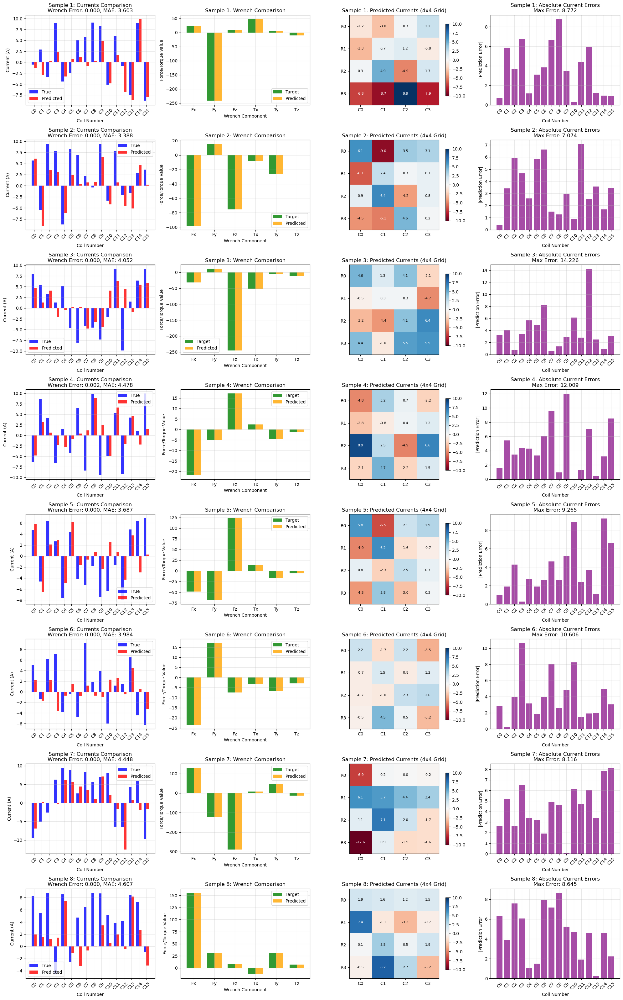

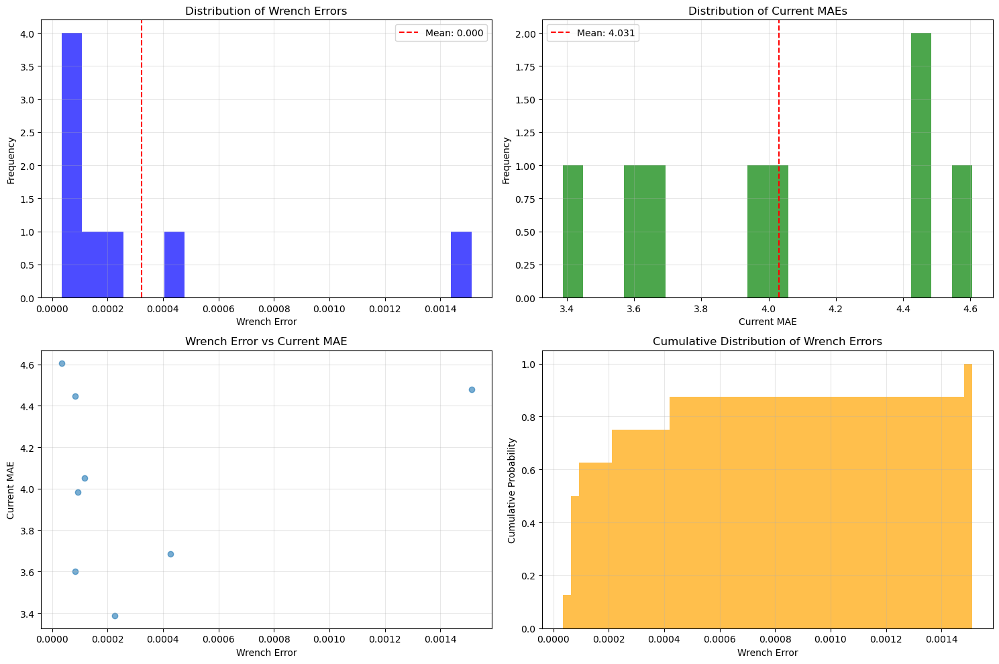


DETAILED PERFORMANCE STATISTICS
Wrench Errors:
  Mean: 0.0003
  Std:  0.0005
  Min:  0.0000
  Max:  0.0015
  Median: 0.0001

Current MAEs:
  Mean: 4.0307
  Std:  0.4217
  Min:  3.3878
  Max:  4.6065
  Median: 4.0181

Success Rates:
  Error < 0.5:  100.0%
  Error < 1.0:  100.0%
  Error < 2.0:  100.0%
  Error < 5.0:  100.0%
[MAIN] Testing completed successfully!
[MAIN] Check the generated plots for detailed results.


In [18]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import pickle

def test_model_comprehensive(model_path, pose_scaler_path, wrench_scaler_path, csv_path, n_samples=10):
    """
    Test the trained model on multiple samples and create comprehensive visualizations
    """
    print("[TEST] Loading trained model...")
    # Load model
    model = PhysicsInformedNullspaceNet()
    # Initialize with dummy inputs
    dummy_X = tf.zeros((1,12), dtype=tf.float32)
    dummy_pose = tf.zeros((1,6), dtype=tf.float32)
    dummy_w = tf.zeros((1,6), dtype=tf.float32)
    _ = model(dummy_X, dummy_pose, dummy_w, training=False)
    model.load_weights(model_path)
    print("[TEST] Model loaded successfully")
    
    # Load scalers
    print("[TEST] Loading scalers...")
    with open(pose_scaler_path, 'rb') as f:
        pose_scaler = pickle.load(f)
    with open(wrench_scaler_path, 'rb') as f:
        wrench_scaler = pickle.load(f)
    print("[TEST] Scalers loaded")
    
    # Load test data
    print(f"[TEST] Loading test data from {csv_path}...")
    df = pd.read_csv(csv_path)
    test_samples = df.sample(n=n_samples, random_state=24)
    print(f"[TEST] Loaded {n_samples} test samples")
    
    # Store results
    results = []
    
    print("[TEST] Running predictions...")
    for idx, (_, sample) in enumerate(test_samples.iterrows()):
        print(f"  Processing sample {idx+1}/{n_samples}")
        
        # Extract data
        pose = np.array([sample['x_m'], sample['y_m'], sample['z_m'],
                        sample['alpha'], sample['beta'], sample['gamma']], dtype=np.float32)
        target_wrench = np.array([sample[f"wrench_{i}"] for i in range(6)], dtype=np.float32)
        true_currents = np.array([sample[f"I_{i}"] for i in range(16)], dtype=np.float32)
        
        # Normalize inputs
        pose_norm = pose_scaler.transform(pose.reshape(1, -1)).astype(np.float32)
        wrench_norm = wrench_scaler.transform(target_wrench.reshape(1, -1)).astype(np.float32)
        X = np.concatenate([pose_norm, wrench_norm], axis=1).astype(np.float32)
        
        # Predict (FIXED: unpack all 3 return values)
        I_pred, W_pred, z_pred = model(X, pose.reshape(1,6), target_wrench.reshape(1,6), training=False)
        I_pred = I_pred.numpy()[0]
        W_pred = W_pred.numpy()[0]
        # z_pred is not used but needs to be captured
        
        # Calculate errors
        wrench_error = np.linalg.norm(W_pred - target_wrench)
        current_error = np.linalg.norm(I_pred - true_currents)
        current_mae = np.mean(np.abs(I_pred - true_currents))
        
        results.append({
            'sample_idx': idx,
            'pose': pose,
            'target_wrench': target_wrench,
            'true_currents': true_currents,
            'pred_currents': I_pred,
            'pred_wrench': W_pred,
            'wrench_error': wrench_error,
            'current_error': current_error,
            'current_mae': current_mae
        })
    
    # Print summary statistics
    print("\n" + "="*50)
    print("TEST RESULTS SUMMARY")
    print("="*50)
    wrench_errors = [r['wrench_error'] for r in results]
    current_maes = [r['current_mae'] for r in results]
    
    print(f"Average Wrench Error: {np.mean(wrench_errors):.4f} ± {np.std(wrench_errors):.4f}")
    print(f"Average Current MAE: {np.mean(current_maes):.4f} ± {np.std(current_maes):.4f}")
    print(f"Min Wrench Error: {np.min(wrench_errors):.4f}")
    print(f"Max Wrench Error: {np.max(wrench_errors):.4f}")
    print(f"Success Rate (< 1.0): {np.mean(np.array(wrench_errors) < 1.0):.1%}")
    
    # Create comprehensive visualizations
    print("\n[TEST] Creating visualizations...")
    create_comprehensive_plots(results)
    
    return results

def create_comprehensive_plots(results):
    """
    Create comprehensive plots for model evaluation
    """
    n_samples = len(results)
    fig = plt.figure(figsize=(20, 4*n_samples))
    
    for i, result in enumerate(results):
        # Extract data
        true_currents = result['true_currents']
        pred_currents = result['pred_currents']
        target_wrench = result['target_wrench']
        pred_wrench = result['pred_wrench']
        wrench_error = result['wrench_error']
        current_mae = result['current_mae']
        
        # Create subplot grid (1 row, 4 columns)
        # Subplot 1: Currents comparison (bar chart)
        ax1 = plt.subplot(n_samples, 4, i*4 + 1)
        coil_indices = np.arange(16)
        width = 0.35
        ax1.bar(coil_indices - width/2, true_currents, width, label='True', alpha=0.8, color='blue')
        ax1.bar(coil_indices + width/2, pred_currents, width, label='Predicted', alpha=0.8, color='red')
        ax1.set_xlabel('Coil Number')
        ax1.set_ylabel('Current (A)')
        ax1.set_title(f'Sample {i+1}: Currents Comparison\nWrench Error: {wrench_error:.3f}, MAE: {current_mae:.3f}')
        ax1.set_xticks(coil_indices)
        ax1.set_xticklabels([f'C{j}' for j in range(16)], rotation=45)
        ax1.legend()
        ax1.grid(True, alpha=0.3)
        
        # Subplot 2: Wrench comparison
        ax2 = plt.subplot(n_samples, 4, i*4 + 2)
        wrench_labels = ['Fx', 'Fy', 'Fz', 'Tx', 'Ty', 'Tz']
        x_pos = np.arange(6)
        width = 0.35
        ax2.bar(x_pos - width/2, target_wrench, width, label='Target', alpha=0.8, color='green')
        ax2.bar(x_pos + width/2, pred_wrench, width, label='Predicted', alpha=0.8, color='orange')
        ax2.set_xlabel('Wrench Component')
        ax2.set_ylabel('Force/Torque Value')
        ax2.set_title(f'Sample {i+1}: Wrench Comparison')
        ax2.set_xticks(x_pos)
        ax2.set_xticklabels(wrench_labels)
        ax2.legend()
        ax2.grid(True, alpha=0.3)
        
        # Subplot 3: Current distribution heatmap (predicted)
        ax3 = plt.subplot(n_samples, 4, i*4 + 3)
        pred_grid = pred_currents.reshape(4, 4)
        im3 = ax3.imshow(pred_grid, cmap='RdBu', vmin=-10, vmax=10)
        ax3.set_title(f'Sample {i+1}: Predicted Currents (4x4 Grid)')
        ax3.set_xticks(range(4))
        ax3.set_yticks(range(4))
        ax3.set_xticklabels([f'C{j}' for j in range(4)])
        ax3.set_yticklabels([f'R{j}' for j in range(4)])
        
        # Add text annotations
        for row in range(4):
            for col in range(4):
                ax3.text(col, row, f'{pred_grid[row,col]:.1f}', 
                        ha='center', va='center', fontsize=8, 
                        color='white' if abs(pred_grid[row,col]) > 5 else 'black')
        
        plt.colorbar(im3, ax=ax3, shrink=0.8)
        
        # Subplot 4: Error analysis
        ax4 = plt.subplot(n_samples, 4, i*4 + 4)
        errors = pred_currents - true_currents
        ax4.bar(coil_indices, np.abs(errors), alpha=0.7, color='purple')
        ax4.set_xlabel('Coil Number')
        ax4.set_ylabel('|Prediction Error|')
        ax4.set_title(f'Sample {i+1}: Absolute Current Errors\nMax Error: {np.max(np.abs(errors)):.3f}')
        ax4.set_xticks(coil_indices)
        ax4.set_xticklabels([f'C{j}' for j in range(16)], rotation=45)
        ax4.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.savefig('model_test_results_comprehensive.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # Create summary plots
    create_summary_plots(results)

def create_summary_plots(results):
    """
    Create summary plots showing overall model performance
    """
    # Extract metrics
    wrench_errors = [r['wrench_error'] for r in results]
    current_maes = [r['current_mae'] for r in results]
    current_rmses = [r['current_error'] for r in results]
    
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    
    # Wrench error distribution
    axes[0,0].hist(wrench_errors, bins=20, alpha=0.7, color='blue')
    axes[0,0].set_xlabel('Wrench Error')
    axes[0,0].set_ylabel('Frequency')
    axes[0,0].set_title('Distribution of Wrench Errors')
    axes[0,0].axvline(np.mean(wrench_errors), color='red', linestyle='--', 
                     label=f'Mean: {np.mean(wrench_errors):.3f}')
    axes[0,0].legend()
    axes[0,0].grid(True, alpha=0.3)
    
    # Current MAE distribution
    axes[0,1].hist(current_maes, bins=20, alpha=0.7, color='green')
    axes[0,1].set_xlabel('Current MAE')
    axes[0,1].set_ylabel('Frequency')
    axes[0,1].set_title('Distribution of Current MAEs')
    axes[0,1].axvline(np.mean(current_maes), color='red', linestyle='--',
                     label=f'Mean: {np.mean(current_maes):.3f}')
    axes[0,1].legend()
    axes[0,1].grid(True, alpha=0.3)
    
    # Wrench error vs Current MAE scatter
    axes[1,0].scatter(wrench_errors, current_maes, alpha=0.6)
    axes[1,0].set_xlabel('Wrench Error')
    axes[1,0].set_ylabel('Current MAE')
    axes[1,0].set_title('Wrench Error vs Current MAE')
    axes[1,0].grid(True, alpha=0.3)
    
    # Cumulative distribution
    axes[1,1].hist(wrench_errors, bins=50, cumulative=True, density=True, alpha=0.7, color='orange')
    axes[1,1].set_xlabel('Wrench Error')
    axes[1,1].set_ylabel('Cumulative Probability')
    axes[1,1].set_title('Cumulative Distribution of Wrench Errors')
    axes[1,1].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.savefig('model_performance_summary.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # Print detailed statistics
    print("\n" + "="*60)
    print("DETAILED PERFORMANCE STATISTICS")
    print("="*60)
    print(f"Wrench Errors:")
    print(f"  Mean: {np.mean(wrench_errors):.4f}")
    print(f"  Std:  {np.std(wrench_errors):.4f}")
    print(f"  Min:  {np.min(wrench_errors):.4f}")
    print(f"  Max:  {np.max(wrench_errors):.4f}")
    print(f"  Median: {np.median(wrench_errors):.4f}")
    
    print(f"\nCurrent MAEs:")
    print(f"  Mean: {np.mean(current_maes):.4f}")
    print(f"  Std:  {np.std(current_maes):.4f}")
    print(f"  Min:  {np.min(current_maes):.4f}")
    print(f"  Max:  {np.max(current_maes):.4f}")
    print(f"  Median: {np.median(current_maes):.4f}")
    
    print(f"\nSuccess Rates:")
    print(f"  Error < 0.5:  {np.mean(np.array(wrench_errors) < 0.5):.1%}")
    print(f"  Error < 1.0:  {np.mean(np.array(wrench_errors) < 1.0):.1%}")
    print(f"  Error < 2.0:  {np.mean(np.array(wrench_errors) < 2.0):.1%}")
    print(f"  Error < 5.0:  {np.mean(np.array(wrench_errors) < 5.0):.1%}")

# Add this to your main execution block:
if __name__ == "__main__":
    # Test the trained model
    print("[MAIN] Starting comprehensive model testing...")
    try:
        results = test_model_comprehensive(
            model_path="ns_policy.weights.h5",
            pose_scaler_path="pose_scaler.pkl", 
            wrench_scaler_path="wrench_scaler.pkl",
            csv_path="gamma_dataset.csv",
            n_samples=8  # Test on 8 samples
        )
        print("[MAIN] Testing completed successfully!")
        print("[MAIN] Check the generated plots for detailed results.")
    except Exception as e:
        print(f"[ERROR] Testing failed: {e}")
        import traceback
        traceback.print_exc()

In [7]:
# --- Main dataset generation ---
def generate_dataset(N=100000, batch_size=1000):
    print(f"Generating dataset with N = {N} samples...")

    # Pose bounds
    x_bounds = (-0.15, 0.15)
    y_bounds = (-0.15, 0.15)
    z_val = 0.005
    angle_bounds_deg = (-5, 5)  # For alpha and beta only
    angle_bounds_rad = np.deg2rad(angle_bounds_deg)
    
    # Current bounds
    current_bounds = (-10, 10)

    all_data = []

    for i in range(0, N, batch_size):
        batch_n = min(batch_size, N - i)

        # Random poses
        x_m = np.random.uniform(*x_bounds, size=(batch_n,))
        y_m = np.random.uniform(*y_bounds, size=(batch_n,))
        z_m = np.full(batch_n, z_val)
        
        # Alpha and Beta: bounded to ±5 degrees
        alpha = np.random.uniform(*angle_bounds_rad, size=(batch_n,))
        beta  = np.random.uniform(*angle_bounds_rad, size=(batch_n,))
        
        # Gamma: unbounded (full rotation)
        gamma = np.random.uniform(-np.pi, np.pi, size=(batch_n,))  # Full circle range
        
        pose_batch = np.stack([x_m, y_m, z_m, alpha, beta, gamma], axis=-1)

        # Random currents
        currents = np.random.uniform(*current_bounds, size=(batch_n, 16))

        # Compute Gamma
        pose_tf = tf.constant(pose_batch, dtype=tf.float32)
        Gamma = compute_gamma(pose_tf)  # (batch, 6, 16)

        # Compute wrench = Gamma @ I
        I_tf = tf.constant(currents, dtype=tf.float32)[..., None]  # (batch, 16, 1)
        wrench = tf.matmul(Gamma, I_tf)  # (batch, 6, 1)
        wrench = tf.squeeze(wrench, axis=-1).numpy()  # (batch, 6)

        # Store in list of dicts
        for j in range(batch_n):
            row = {
                "x_m": pose_batch[j, 0],
                "y_m": pose_batch[j, 1],
                "z_m": pose_batch[j, 2],
                "alpha": pose_batch[j, 3],
                "beta":  pose_batch[j, 4],
                "gamma": pose_batch[j, 5],
            }
            for k in range(16):
                row[f"I_{k}"] = currents[j, k]
            for k in range(6):
                row[f"wrench_{k}"] = wrench[j, k]
            all_data.append(row)

        if (i // batch_size) % 10 == 0:
            print(f"Processed {i + batch_n}/{N} samples")

    # Convert to DataFrame
    df = pd.DataFrame(all_data)
    return df


# --- Run ---
if __name__ == "__main__":
    N = 500000
    start_time = time.time()
    df = generate_dataset(N=N)
    print(f"Dataset generation took {time.time() - start_time:.2f} seconds")

    # Save to file
    df.to_csv("gamma_dataset.csv", index=False)
    print("Dataset saved to gamma_dataset.csv")

Generating dataset with N = 500000 samples...
Processed 1000/500000 samples
Processed 11000/500000 samples
Processed 21000/500000 samples
Processed 31000/500000 samples
Processed 41000/500000 samples
Processed 51000/500000 samples
Processed 61000/500000 samples
Processed 71000/500000 samples
Processed 81000/500000 samples
Processed 91000/500000 samples
Processed 101000/500000 samples
Processed 111000/500000 samples
Processed 121000/500000 samples
Processed 131000/500000 samples
Processed 141000/500000 samples
Processed 151000/500000 samples
Processed 161000/500000 samples
Processed 171000/500000 samples
Processed 181000/500000 samples
Processed 191000/500000 samples
Processed 201000/500000 samples
Processed 211000/500000 samples
Processed 221000/500000 samples
Processed 231000/500000 samples
Processed 241000/500000 samples
Processed 251000/500000 samples
Processed 261000/500000 samples
Processed 271000/500000 samples
Processed 281000/500000 samples
Processed 291000/500000 samples
Proce

In [ ]:
# --- Import necessary libraries ---
import numpy as np
import tensorflow as tf
import pandas as pd
# Assuming 'compute_gamma' is defined elsewhere in your project,
# or you can paste its definition directly here.
# from your_module import compute_gamma 

# --- Main dataset generation function ---
def generate_dataset_random(N=100000, batch_size=1000):
    """
    Generates a dataset of pose, current, and resulting wrench samples.

    Args:
        N (int): Total number of samples to generate.
        batch_size (int): Number of samples to process in each batch.

    Returns:
        pd.DataFrame: The generated dataset.
    """
    print(f"Generating dataset with N = {N} samples...")

    # Pose bounds
    x_bounds = (-0.15, 0.15)
    y_bounds = (-0.15, 0.15)
    z_val = 0.005
    angle_bounds_deg = (-5, 5)
    angle_bounds_rad = np.deg2rad(angle_bounds_deg)
    
    # Current bounds
    current_bounds = (-10, 10)

    all_data = []

    for i in range(0, N, batch_size):
        batch_n = min(batch_size, N - i)
        print(f"  Processing batch {i//batch_size + 1}/{(N + batch_size - 1) // batch_size} (samples {i+1}-{i+batch_n})")

        # 1. Random poses
        x_m = np.random.uniform(*x_bounds, size=(batch_n,))
        y_m = np.random.uniform(*y_bounds, size=(batch_n,))
        z_m = np.full(batch_n, z_val)
        
        alpha = np.random.uniform(*angle_bounds_rad, size=(batch_n,))
        beta  = np.random.uniform(*angle_bounds_rad, size=(batch_n,))
        gamma = np.random.uniform(-np.pi, np.pi, size=(batch_n,))

        pose_batch = np.stack([x_m, y_m, z_m, alpha, beta, gamma], axis=-1)

        # 2. --- Random Currents with Structured Patterns ---
        # Sample sparse patterns to avoid full cancellation
        currents = np.zeros((batch_n, 16))
        n_active = np.random.randint(2, 5, size=batch_n) # 2 to 4 active coils
        for b in range(batch_n):
            # Select unique coil indices for this sample
            active_idx = np.random.choice(16, size=n_active[b], replace=False) 
            # Assign random currents within bounds to active coils
            currents[b, active_idx] = np.random.uniform(*current_bounds, size=n_active[b])

        # 3. Compute wrench using the forward model (Gamma)
        pose_tf = tf.constant(pose_batch, dtype=tf.float32)
        Gamma = compute_gamma(pose_tf)  # Expected shape: (batch_n, 6, 16)
        I_tf = tf.constant(currents, dtype=tf.float32)[..., None]  # Shape: (batch_n, 16, 1)
        wrench = tf.matmul(Gamma, I_tf)  # Shape: (batch_n, 6, 1)
        wrench = tf.squeeze(wrench, axis=-1).numpy()  # Shape: (batch_n, 6)

        # 4. Store samples in a list of dictionaries
        for j in range(batch_n):
            row = {
                "x_m": pose_batch[j, 0],
                "y_m": pose_batch[j, 1],
                "z_m": pose_batch[j, 2],
                "alpha": pose_batch[j, 3],
                "beta": pose_batch[j, 4],
                "gamma": pose_batch[j, 5],
            }
            # Add current values
            for k in range(16):
                row[f"I_{k}"] = currents[j, k]
            # Add wrench values
            for k in range(6):
                row[f"wrench_{k}"] = wrench[j, k]
            all_data.append(row)

    # 5. Convert list of dictionaries to a Pandas DataFrame
    df = pd.DataFrame(all_data)
    print(f"Finished generating {len(all_data)} samples.")
    return df

# --- Run the script ---
if __name__ == "__main__":
    # --- IMPORTANT: Define or import your compute_gamma function ---
    # You MUST have your `compute_gamma` function defined or imported here.
    # Example placeholder (replace with your actual function):
    # def compute_gamma(pose_tf):
    #     # Your implementation here
    #     # It should take a tensor of shape (batch_size, 6) 
    #     # and return a tensor of shape (batch_size, 6, 16)
    #     pass

    # Check if compute_gamma is available
    if 'compute_gamma' not in globals():
        print("Error: 'compute_gamma' function is not defined or imported.")
        print("Please define your 'compute_gamma' function before running this script.")
        # You can raise an error or exit here if preferred
        # raise NotImplementedError("compute_gamma function is missing.")
        exit(1) # Exit the script with an error code

    # --- Set parameters ---
    N = 500000  # Number of samples
    batch_size = 1000 # Process in batches
    output_filename = "gamma_dataset_sparse_random.csv" # Name of the output file

    # --- Record start time ---
    import time
    start_time = time.time()

    # --- Generate the dataset ---
    try:
        df = generate_dataset_random(N=N, batch_size=batch_size)
    except Exception as e:
        print(f"An error occurred during dataset generation: {e}")
        raise # Re-raise the exception to see the full traceback

    # --- Print summary and save ---
    print(f"Dataset generation took {time.time() - start_time:.2f} seconds")
    print(f"Final dataset shape: {df.shape}")

    # Add wrench magnitude for potential analysis
    df['wrench_mag'] = np.linalg.norm(
        df[['wrench_0', 'wrench_1', 'wrench_2', 'wrench_3', 'wrench_4', 'wrench_5']].values, 
        axis=1
    )

    # Save to CSV file
    df.to_csv(output_filename, index=False)
    print(f"Dataset saved to '{output_filename}'")

    # --- Optional: Print some quick statistics ---
    print("\n--- Quick Dataset Statistics ---")
    print(f"Zero wrench samples (|wrench| < 0.1): {len(df[df['wrench_mag'] < 0.1])}")
    print(f"High wrench samples (|wrench| > 1.0): {len(df[df['wrench_mag'] > 1.0])}")
    print(f"Mean wrench magnitude: {df['wrench_mag'].mean():.3f}")
    print(f"Max wrench magnitude: {df['wrench_mag'].max():.3f}")


Generating dataset with N = 500000 samples...
  Processing batch 1/500 (samples 1-1000)
  Processing batch 2/500 (samples 1001-2000)
  Processing batch 3/500 (samples 2001-3000)
  Processing batch 4/500 (samples 3001-4000)
  Processing batch 5/500 (samples 4001-5000)
  Processing batch 6/500 (samples 5001-6000)
  Processing batch 7/500 (samples 6001-7000)
  Processing batch 8/500 (samples 7001-8000)
  Processing batch 9/500 (samples 8001-9000)
  Processing batch 10/500 (samples 9001-10000)
  Processing batch 11/500 (samples 10001-11000)
  Processing batch 12/500 (samples 11001-12000)
  Processing batch 13/500 (samples 12001-13000)
  Processing batch 14/500 (samples 13001-14000)
  Processing batch 15/500 (samples 14001-15000)
  Processing batch 16/500 (samples 15001-16000)
  Processing batch 17/500 (samples 16001-17000)
  Processing batch 18/500 (samples 17001-18000)
  Processing batch 19/500 (samples 18001-19000)
  Processing batch 20/500 (samples 19001-20000)
  Processing batch 21/500

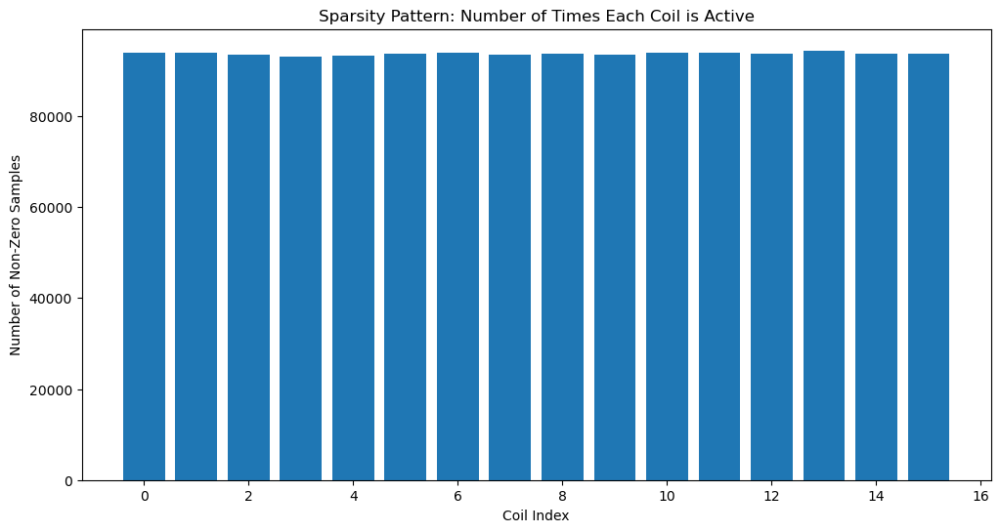

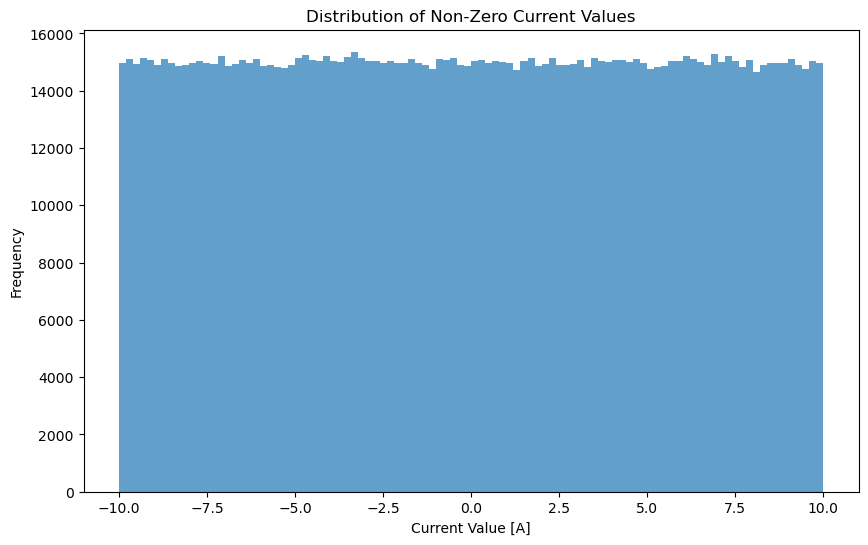

In [9]:
# After loading the dataframe
import matplotlib.pyplot as plt

# Plot 1: Sparsity pattern (which coils are active)
plt.figure(figsize=(12, 6))
current_cols = [f'I_{i}' for i in range(16)]
nonzero_counts = [(df[col] != 0).sum() for col in current_cols]
plt.bar(range(16), nonzero_counts)
plt.xlabel('Coil Index')
plt.ylabel('Number of Non-Zero Samples')
plt.title('Sparsity Pattern: Number of Times Each Coil is Active')
plt.show()

# Plot 2: Distribution of non-zero current values only
plt.figure(figsize=(10, 6))
all_nonzero_currents = []
for col in current_cols:
    all_nonzero_currents.extend(df[df[col] != 0][col].values)

plt.hist(all_nonzero_currents, bins=100, alpha=0.7)
plt.xlabel('Current Value [A]')
plt.ylabel('Frequency')
plt.title('Distribution of Non-Zero Current Values')
plt.show()

Loading dataset...
Dataset loaded. Shape: (500000, 29)


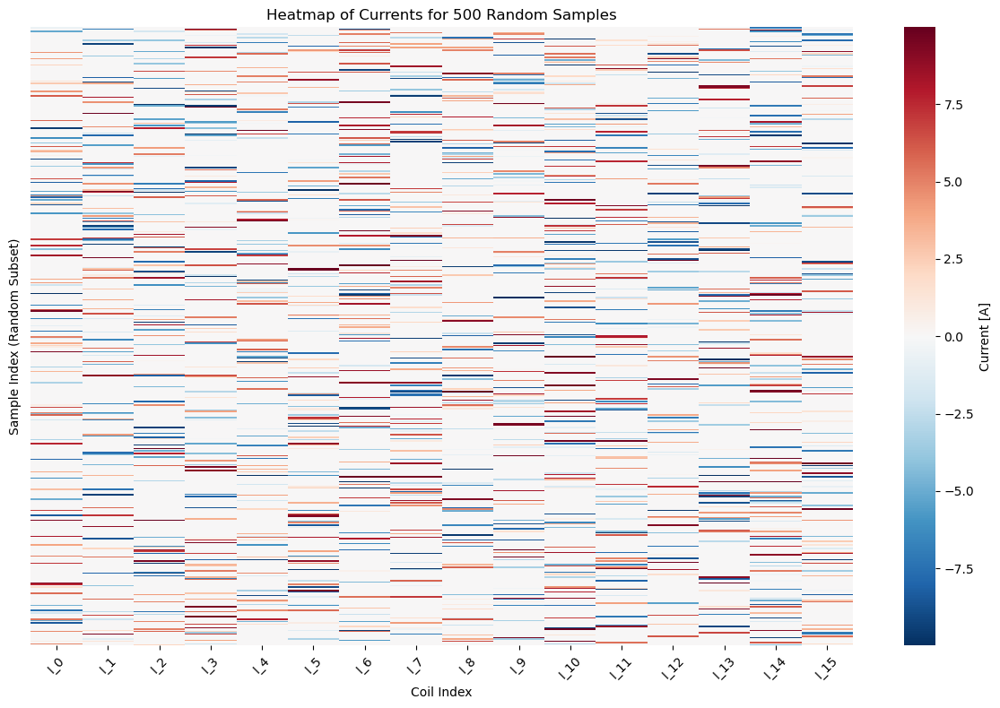


Showing heatmap for 500 randomly selected samples (seed=38).
X-axis: Coil indices (I_0 to I_15)
Y-axis: Sample indices (from the random subset)
Color: Current value in Amperes [A]. Red=Negative, Blue=Positive, White/Gray=Near Zero.


In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# --- 1. Load the generated dataset ---
print("Loading dataset...")
df = pd.read_csv("gamma_dataset_sparse_random.csv")
print(f"Dataset loaded. Shape: {df.shape}")

# --- 2. Select a random subset of samples for the heatmap ---
# Choosing a relatively small number for visualization clarity
num_samples_to_plot = 500 
random_seed = 38 # For reproducibility

# Sample rows randomly
df_sample = df.sample(n=num_samples_to_plot, random_state=random_seed)

# --- 3. Extract current data for the heatmap ---
current_columns = [f'I_{i}' for i in range(16)]
currents_data = df_sample[current_columns].values

# --- 4. Create the heatmap ---
plt.figure(figsize=(12, 8))
# Use a diverging colormap centered at 0, suitable for current data
ax = sns.heatmap(currents_data, 
                 cmap='RdBu_r', # Red for negative, Blue for positive, white/gray for zero
                 center=0,      # Center the colormap at 0
                 cbar_kws={'label': 'Current [A]'}, # Label for the color bar
                 xticklabels=[f'I_{i}' for i in range(16)], # Label x-ticks
                 yticklabels=False) # Hide y-tick labels (sample indices) for clarity

# Improve layout
plt.title(f'Heatmap of Currents for {num_samples_to_plot} Random Samples')
plt.xlabel('Coil Index')
plt.ylabel('Sample Index (Random Subset)')
# Rotate x-axis labels for better readability if needed
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# --- Optional: Print some info about the sampled data ---
print(f"\nShowing heatmap for {num_samples_to_plot} randomly selected samples (seed={random_seed}).")
print("X-axis: Coil indices (I_0 to I_15)")
print("Y-axis: Sample indices (from the random subset)")
print("Color: Current value in Amperes [A]. Red=Negative, Blue=Positive, White/Gray=Near Zero.")

Loading dataset...
Dataset loaded. Shape: (500000, 29)
        x_m       y_m    z_m     alpha      beta     gamma  I_0       I_1  \
0  0.005529 -0.106526  0.005  0.086995  0.065547  0.334023  0.0  0.000000   
1  0.069852 -0.066099  0.005 -0.029573  0.006770  1.124305  0.0  0.000000   
2 -0.062892  0.045257  0.005  0.062350  0.039621 -2.045425  0.0  3.826246   
3 -0.012821 -0.041255  0.005 -0.043374 -0.009976  2.057121  0.0  0.000000   
4  0.019692 -0.121758  0.005 -0.059601 -0.067123  2.234215  0.0  0.000000   

   I_2       I_3  ...  I_13      I_14  I_15   wrench_0   wrench_1   wrench_2  \
0  0.0  0.000000  ...   0.0 -5.299161   0.0 -31.333702 -84.732110 -98.882034   
1  0.0  0.000000  ...   0.0  0.000000   0.0  26.643816 -33.971672 -46.616220   
2  0.0  0.000000  ...   0.0  0.000000   0.0  -6.078946   6.051846   4.112684   
3  0.0  7.781164  ...   0.0  0.000000   0.0  -5.505607 -40.030690  56.227905   
4  0.0  0.000000  ...   0.0 -0.418039   0.0  -1.114562 -42.533104  36.546482   

 

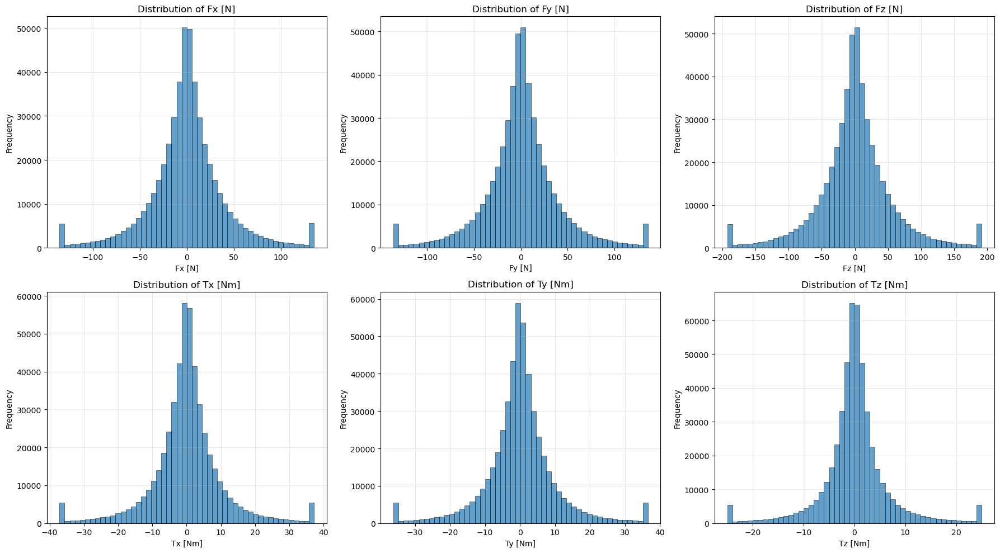


Plotting wrench magnitude distribution...


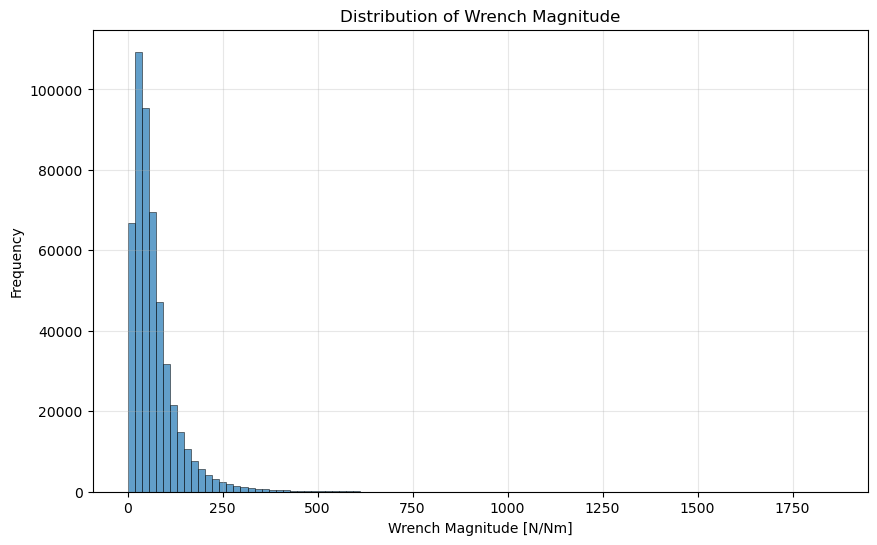


Plotting current component distributions...


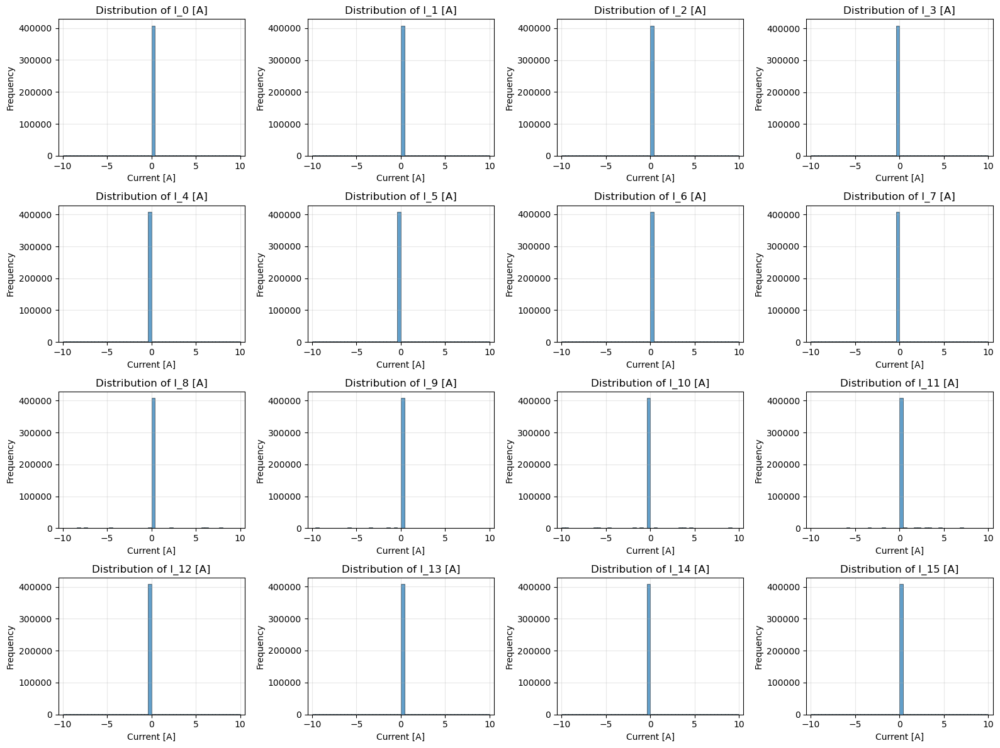


Plotting wrench component correlation heatmap...


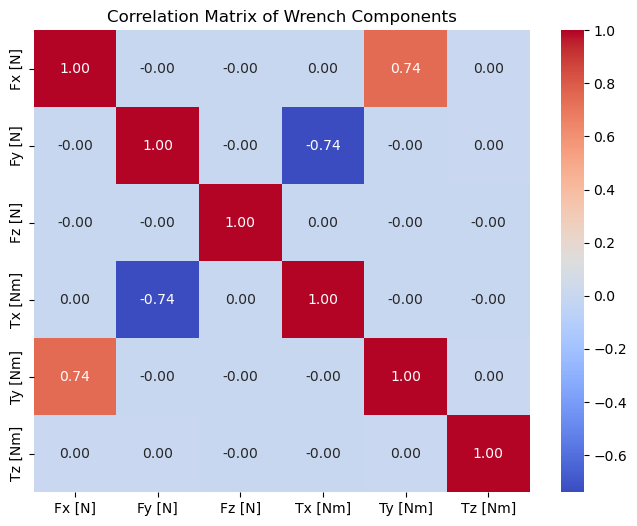


Plotting pose distributions...


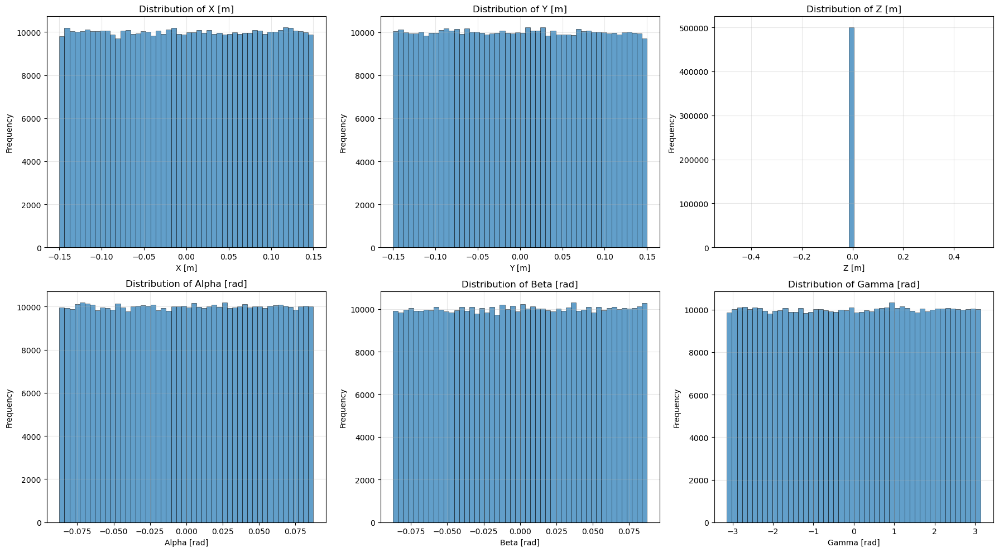


Plotting wrench magnitude vs. pose (X, Y)...


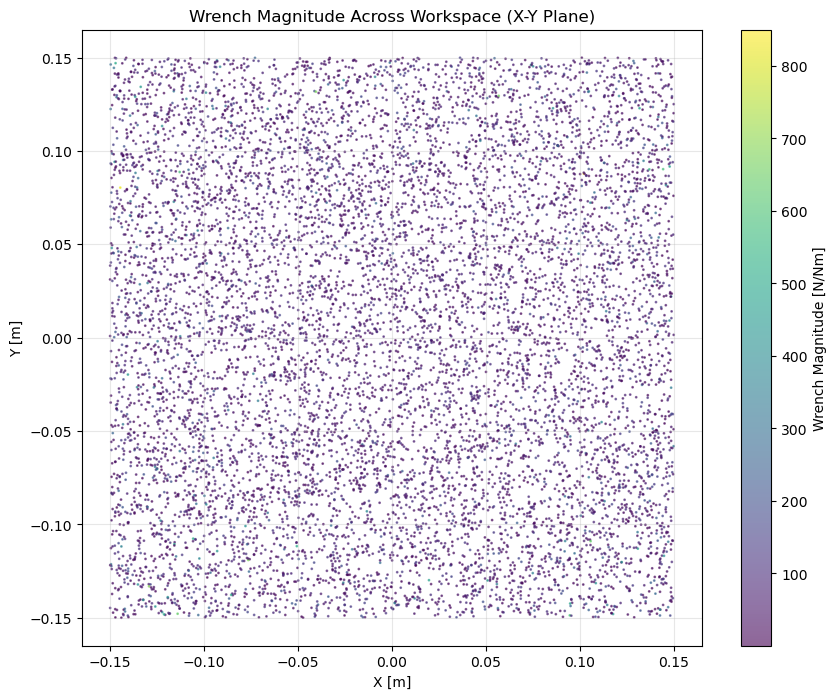


Analyzing zero-wrench cases...
Number of samples with wrench_mag < 0.1: 4
Total samples: 500000
Percentage of zero-wrench samples: 0.00%


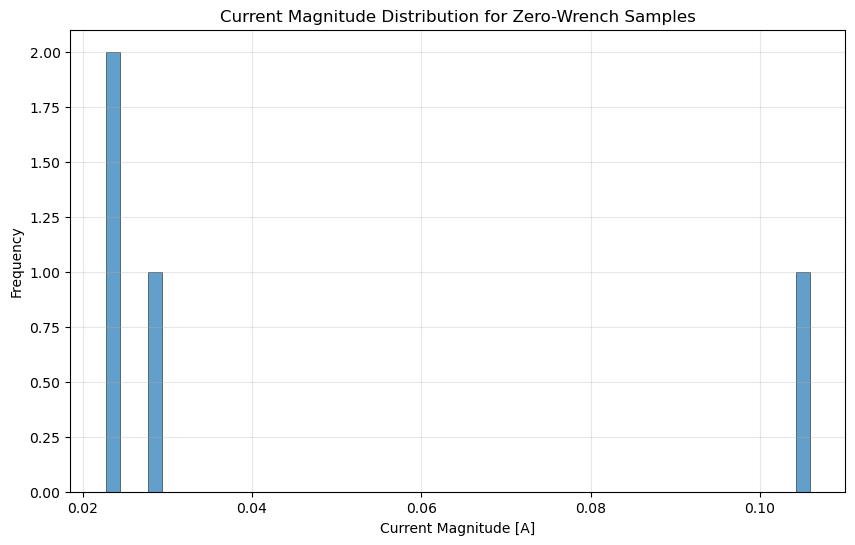

Zero-wrench samples with current_mag > 0.1A: 1
Percentage of zero-wrench samples with non-zero currents: 25.00%

--- Dataset Statistics Summary ---
                 x_m            y_m           z_m          alpha  \
count  500000.000000  500000.000000  5.000000e+05  500000.000000   
mean        0.000046      -0.000207  5.000000e-03       0.000033   
std         0.086678       0.086530  2.602088e-18       0.050380   
min        -0.149997      -0.150000  5.000000e-03      -0.087266   
25%        -0.075030      -0.075169  5.000000e-03      -0.043620   
50%         0.000064      -0.000144  5.000000e-03       0.000124   
75%         0.075278       0.074704  5.000000e-03       0.043652   
max         0.149999       0.149999  5.000000e-03       0.087266   

                beta          gamma            I_0            I_1  \
count  500000.000000  500000.000000  500000.000000  500000.000000   
mean        0.000218       0.003729      -0.003995      -0.003219   
std         0.050384       1.814

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# --- 1. Load the generated dataset ---
print("Loading dataset...")
df = pd.read_csv("gamma_dataset_sparse_random.csv")
print(f"Dataset loaded. Shape: {df.shape}")
print(df.head())

# --- 2. Plot Wrench Component Distributions ---
print("\nPlotting wrench component distributions...")
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.ravel()

wrench_cols = [f'wrench_{i}' for i in range(6)]
wrench_names = ['Fx [N]', 'Fy [N]', 'Fz [N]', 'Tx [Nm]', 'Ty [Nm]', 'Tz [Nm]']

for i, (col, name) in enumerate(zip(wrench_cols, wrench_names)):
    ax = axes[i]
    # Use a narrower range for better visualization of the core distribution
    lower_percentile = np.percentile(df[col], 1)
    upper_percentile = np.percentile(df[col], 99)
    data_to_plot = df[col].clip(lower_percentile, upper_percentile)
    
    ax.hist(data_to_plot, bins=50, alpha=0.7, edgecolor='black', linewidth=0.5)
    ax.set_title(f'Distribution of {name}')
    ax.set_xlabel(name)
    ax.set_ylabel('Frequency')
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# --- 3. Plot Wrench Magnitude Distribution ---
print("\nPlotting wrench magnitude distribution...")
plt.figure(figsize=(10, 6))
plt.hist(df['wrench_mag'], bins=100, alpha=0.7, edgecolor='black', linewidth=0.5)
plt.title('Distribution of Wrench Magnitude')
plt.xlabel('Wrench Magnitude [N/Nm]')
plt.ylabel('Frequency')
plt.grid(True, alpha=0.3)
plt.show()

# --- 4. Plot Current Component Distributions ---
print("\nPlotting current component distributions...")
fig, axes = plt.subplots(4, 4, figsize=(16, 12))
axes = axes.ravel()

current_cols = [f'I_{i}' for i in range(16)]

for i, col in enumerate(current_cols):
    ax = axes[i]
    ax.hist(df[col], bins=50, alpha=0.7, edgecolor='black', linewidth=0.5)
    ax.set_title(f'Distribution of {col} [A]')
    ax.set_xlabel('Current [A]')
    ax.set_ylabel('Frequency')
    ax.set_xlim(-10.5, 10.5) # Should be within bounds
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# --- 5. Correlation Heatmap for Wrench Components ---
print("\nPlotting wrench component correlation heatmap...")
wrench_data = df[wrench_cols]
corr_matrix = wrench_data.corr()

plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', 
            xticklabels=wrench_names, yticklabels=wrench_names)
plt.title('Correlation Matrix of Wrench Components')
plt.show()

# --- 6. Pose Distributions ---
print("\nPlotting pose distributions...")
pose_cols = ['x_m', 'y_m', 'z_m', 'alpha', 'beta', 'gamma']
pose_names = ['X [m]', 'Y [m]', 'Z [m]', 'Alpha [rad]', 'Beta [rad]', 'Gamma [rad]']

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.ravel()

for i, (col, name) in enumerate(zip(pose_cols, pose_names)):
    ax = axes[i]
    ax.hist(df[col], bins=50, alpha=0.7, edgecolor='black', linewidth=0.5)
    ax.set_title(f'Distribution of {name}')
    ax.set_xlabel(name)
    ax.set_ylabel('Frequency')
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# --- 7. Wrench Magnitude vs. Pose (X, Y) ---
print("\nPlotting wrench magnitude vs. pose (X, Y)...")
# Sample a subset for scatter plot clarity
sample_df = df.sample(n=min(10000, len(df)), random_state=42)

plt.figure(figsize=(10, 8))
scatter = plt.scatter(sample_df['x_m'], sample_df['y_m'], c=sample_df['wrench_mag'], 
                      cmap='viridis', alpha=0.6, s=1)
plt.colorbar(scatter, label='Wrench Magnitude [N/Nm]')
plt.title('Wrench Magnitude Across Workspace (X-Y Plane)')
plt.xlabel('X [m]')
plt.ylabel('Y [m]')
plt.grid(True, alpha=0.3)
plt.show()

# --- 8. Analyze Zero-Wrench Cases ---
print("\nAnalyzing zero-wrench cases...")
zero_wrench_threshold = 0.1
mask_zero_wrench = df['wrench_mag'] < zero_wrench_threshold

print(f"Number of samples with wrench_mag < {zero_wrench_threshold}: {mask_zero_wrench.sum()}")
print(f"Total samples: {len(df)}")
print(f"Percentage of zero-wrench samples: {mask_zero_wrench.sum() / len(df) * 100:.2f}%")

# Check if zero-wrench samples have zero currents
zero_current_cols = [f'I_{i}' for i in range(16)]
zero_wrench_data = df[mask_zero_wrench]
current_mags_zero_wrench = np.linalg.norm(zero_wrench_data[zero_current_cols].values, axis=1)

plt.figure(figsize=(10, 6))
plt.hist(current_mags_zero_wrench, bins=50, alpha=0.7, edgecolor='black', linewidth=0.5)
plt.title('Current Magnitude Distribution for Zero-Wrench Samples')
plt.xlabel('Current Magnitude [A]')
plt.ylabel('Frequency')
plt.grid(True, alpha=0.3)
plt.show()

# Count how many zero-wrench samples have non-zero currents
nonzero_current_in_zero_wrench = np.sum(current_mags_zero_wrench > 0.1) # Small threshold
print(f"Zero-wrench samples with current_mag > 0.1A: {nonzero_current_in_zero_wrench}")
print(f"Percentage of zero-wrench samples with non-zero currents: {nonzero_current_in_zero_wrench / len(current_mags_zero_wrench) * 100:.2f}%")

# --- 9. Statistics Summary ---
print("\n--- Dataset Statistics Summary ---")
print(df.describe())

In [12]:
import numpy as np
import tensorflow as tf
import pandas as pd
import time

def generate_dataset_hybrid(N=100000, batch_size=1000, 
                           min_nonzero_current_mag=0.5, # Avoid currents too close to zero
                           min_wrench_mag_for_nonzero_currents=0.5, # Threshold for "significant" wrench
                           fraction_zero_wrench_samples=0.2 # Control how many zero-wrench samples we keep
                           ):
    """
    Generates a hybrid dataset for the inverse Gamma problem.
    Balances zero-wrench and non-zero wrench samples, including singularities.
    """
    print(f"Generating hybrid dataset with N = {N} samples...")

    # Pose bounds
    x_bounds = (-0.15, 0.15)
    y_bounds = (-0.15, 0.15)
    z_val = 0.005
    angle_bounds_deg = (-5, 5)
    angle_bounds_rad = np.deg2rad(angle_bounds_deg)
    
    # Current bounds
    current_bounds = (-10, 10)

    all_data = []
    samples_generated = 0

    with tqdm(total=N, desc="Generating samples") as pbar:
        while samples_generated < N:
            batch_n = min(batch_size, N - samples_generated)

            # 1. Random poses
            x_m = np.random.uniform(*x_bounds, size=(batch_n,))
            y_m = np.random.uniform(*y_bounds, size=(batch_n,))
            z_m = np.full(batch_n, z_val)
            alpha = np.random.uniform(*angle_bounds_rad, size=(batch_n,))
            beta  = np.random.uniform(*angle_bounds_rad, size=(batch_n,))
            gamma = np.random.uniform(-np.pi, np.pi, size=(batch_n,))
            pose_batch = np.stack([x_m, y_m, z_m, alpha, beta, gamma], axis=-1)

            # 2. --- Generate Currents ---
            # Option A: Full Uniform (as discussed)
            # currents = np.random.uniform(*current_bounds, size=(batch_n, 16))
            
            # Option B: Sparse-ish (a compromise)
            # Start with full uniform, then randomly zero out some coils
            currents = np.random.uniform(*current_bounds, size=(batch_n, 16))
            # For each sample, randomly decide how many coils to zero out (0 to 10)
            coils_to_zero = np.random.randint(0, 11, size=(batch_n, 1))
            for i in range(batch_n):
                if coils_to_zero[i, 0] > 0:
                    zero_indices = np.random.choice(16, size=coils_to_zero[i, 0], replace=False)
                    currents[i, zero_indices] = 0.0

            # 3. Filter out samples with *all* currents too close to zero
            current_mag = np.linalg.norm(currents, axis=1)
            valid_current_mask = current_mag >= min_nonzero_current_mag
            if not np.any(valid_current_mask):
                continue # Skip this batch if all are invalid

            pose_batch = pose_batch[valid_current_mask]
            currents = currents[valid_current_mask]
            batch_n = len(currents) # Update batch size

            # 4. Compute wrench using the forward model (Gamma)
            pose_tf = tf.constant(pose_batch, dtype=tf.float32)
            Gamma = compute_gamma(pose_tf)
            I_tf = tf.constant(currents, dtype=tf.float32)[..., None]
            wrench = tf.matmul(Gamma, I_tf)
            wrench = tf.squeeze(wrench, axis=-1).numpy() # Shape: (batch_n, 6)
            wrench_mag = np.linalg.norm(wrench, axis=1)

            # 5. --- Hybrid Filtering Strategy ---
            # We want a mix of samples:
            # a) High wrench magnitude samples (always keep)
            # b) Low wrench magnitude samples (keep some, discard most)
            # c) Zero wrench samples (keep a controlled fraction)
            
            high_wrench_mask = wrench_mag >= min_wrench_mag_for_nonzero_currents
            
            low_wrench_indices = np.where(wrench_mag < min_wrench_mag_for_nonzero_currents)[0]
            zero_wrench_indices = np.where(wrench_mag < 0.1)[0] # Stricter zero threshold
            
            # Decide which low/zero wrench samples to keep
            # Keep all high wrench samples
            keep_indices = np.where(high_wrench_mask)[0].tolist()
            
            # For low (but not zero) wrench samples
            low_nonzero_indices = np.setdiff1d(low_wrench_indices, zero_wrench_indices)
            if len(low_nonzero_indices) > 0:
                 # Keep a fraction of these
                 num_to_keep_low = max(1, int(0.1 * len(low_nonzero_indices))) # e.g., keep 10%
                 keep_indices.extend(np.random.choice(low_nonzero_indices, size=num_to_keep_low, replace=False))

            # For zero wrench samples
            if len(zero_wrench_indices) > 0:
                # Keep a controlled fraction
                target_zero_samples = int(fraction_zero_wrench_samples * N)
                current_zero_samples = sum(1 for d in all_data if np.linalg.norm([d[f'wrench_{k}'] for k in range(6)]) < 0.1)
                samples_needed = target_zero_samples - current_zero_samples
                if samples_needed > 0:
                    num_to_keep_zero = min(samples_needed, len(zero_wrench_indices))
                    # Prioritize zero-wrench samples that have higher current magnitudes (more interesting singularities)
                    sorted_zero_indices = zero_wrench_indices[np.argsort(current_mag[zero_wrench_indices])[::-1]] # Sort by current mag, descending
                    keep_indices.extend(sorted_zero_indices[:num_to_keep_zero])

            # Filter based on keep_indices
            if len(keep_indices) == 0:
                continue

            keep_indices = np.array(keep_indices)
            pose_batch = pose_batch[keep_indices]
            currents = currents[keep_indices]
            wrench = wrench[keep_indices]
            wrench_mag = wrench_mag[keep_indices]

            # 6. Store samples
            for j in range(len(pose_batch)):
                row = {
                    "x_m": pose_batch[j, 0],
                    "y_m": pose_batch[j, 1],
                    "z_m": pose_batch[j, 2],
                    "alpha": pose_batch[j, 3],
                    "beta": pose_batch[j, 4],
                    "gamma": pose_batch[j, 5],
                }
                for k in range(16):
                    row[f"I_{k}"] = currents[j, k]
                for k in range(6):
                    row[f"wrench_{k}"] = wrench[j, k]
                all_data.append(row)
                samples_generated += 1
                pbar.update(1)

                if samples_generated >= N:
                    break
            
            if samples_generated >= N:
                break

    df = pd.DataFrame(all_data)
    print(f"Finished generating {len(all_data)} samples.")
    return df

# --- Run the script (example) ---
if __name__ == "__main__":
    # --- Set parameters ---
    N = 500000
    batch_size = 1000
    output_filename = "gamma_dataset_hybrid.csv"

    # --- Record start time ---
    start_time = time.time()

    # --- Generate the dataset ---
    try:
        df = generate_dataset_hybrid(N=N, batch_size=batch_size)
    except Exception as e:
        print(f"An error occurred during dataset generation: {e}")
        raise

    # --- Print summary and save ---
    print(f"Dataset generation took {time.time() - start_time:.2f} seconds")
    print(f"Final dataset shape: {df.shape}")

    # Add wrench magnitude
    df['wrench_mag'] = np.linalg.norm(
        df[['wrench_0', 'wrench_1', 'wrench_2', 'wrench_3', 'wrench_4', 'wrench_5']].values, 
        axis=1
    )

    # Save to CSV file
    df.to_csv(output_filename, index=False)
    print(f"Dataset saved to '{output_filename}'")

    # --- Print statistics ---
    print("\n--- Dataset Statistics ---")
    print(f"Total samples: {len(df)}")
    print(f"Zero wrench samples (|wrench| < 0.1): {len(df[df['wrench_mag'] < 0.1])}")
    print(f"Low wrench samples (0.1 <= |wrench| < 0.5): {len(df[(df['wrench_mag'] >= 0.1) & (df['wrench_mag'] < 0.5)])}")
    print(f"Medium wrench samples (0.5 <= |wrench| < 2.0): {len(df[(df['wrench_mag'] >= 0.5) & (df['wrench_mag'] < 2.0)])}")
    print(f"High wrench samples (|wrench| >= 2.0): {len(df[df['wrench_mag'] >= 2.0])}")
    print(f"Mean wrench magnitude: {df['wrench_mag'].mean():.3f}")
    print(f"Max wrench magnitude: {df['wrench_mag'].max():.3f}")

    # --- Analyze zero-wrench samples ---
    zero_wrench_df = df[df['wrench_mag'] < 0.1]
    if len(zero_wrench_df) > 0:
        zero_current_cols = [f'I_{i}' for i in range(16)]
        zero_wrench_current_mags = np.linalg.norm(zero_wrench_df[zero_current_cols].values, axis=1)
        nonzero_current_in_zero_wrench = np.sum(zero_wrench_current_mags > 0.1)
        print(f"\n--- Zero-Wrench Sample Analysis ---")
        print(f"Number of zero-wrench samples: {len(zero_wrench_df)}")
        print(f"Zero-wrench samples with current_mag > 0.1A: {nonzero_current_in_zero_wrench}")
        print(f"Percentage of zero-wrench samples with non-zero currents: {nonzero_current_in_zero_wrench / len(zero_wrench_df) * 100:.2f}%")


Generating hybrid dataset with N = 500000 samples...


Generating samples: 100%|██████████| 500000/500000 [00:38<00:00, 12893.16it/s]


Finished generating 500000 samples.
Dataset generation took 40.92 seconds
Final dataset shape: (500000, 28)
Dataset saved to 'gamma_dataset_hybrid.csv'

--- Dataset Statistics ---
Total samples: 500000
Zero wrench samples (|wrench| < 0.1): 0
Low wrench samples (0.1 <= |wrench| < 0.5): 1
Medium wrench samples (0.5 <= |wrench| < 2.0): 67
High wrench samples (|wrench| >= 2.0): 499932
Mean wrench magnitude: 136.741
Max wrench magnitude: 2850.276


In [14]:
# --- Import necessary libraries ---
import numpy as np
import tensorflow as tf
import pandas as pd
import time
from tqdm import tqdm  # Make sure tqdm is installed: pip install tqdm
# Assuming 'compute_gamma' is defined elsewhere in your project,
# or you can paste its definition directly here.
# from your_module import compute_gamma 

# --- Main dataset generation function ---
def generate_dataset_hybrid(N=100000, batch_size=1000, 
                           min_nonzero_current_mag=0.5, # Avoid currents too close to zero
                           min_wrench_mag_for_nonzero_currents=0.5, # Threshold for "significant" wrench
                           fraction_zero_wrench_samples=0.1 # Control fraction of zero-wrench samples (e.g., 10%)
                           ):
    """
    Generates a hybrid dataset for the inverse Gamma problem.
    Balances zero-wrench and non-zero wrench samples, including singularities.
    """
    print(f"Generating hybrid dataset with N = {N} samples...")

    # Pose bounds
    x_bounds = (-0.15, 0.15)
    y_bounds = (-0.15, 0.15)
    z_val = 0.005
    angle_bounds_deg = (-5, 5)
    angle_bounds_rad = np.deg2rad(angle_bounds_deg)
    
    # Current bounds
    current_bounds = (-10, 10)

    all_data = []
    samples_generated = 0

    # Pre-calculate target number of zero-wrench samples
    target_zero_samples = int(fraction_zero_wrench_samples * N)
    zero_samples_added = 0

    with tqdm(total=N, desc="Generating samples") as pbar:
        while samples_generated < N:
            batch_n = min(batch_size, N - samples_generated)

            # 1. Random poses
            x_m = np.random.uniform(*x_bounds, size=(batch_n,))
            y_m = np.random.uniform(*y_bounds, size=(batch_n,))
            z_m = np.full(batch_n, z_val)
            alpha = np.random.uniform(*angle_bounds_rad, size=(batch_n,))
            beta  = np.random.uniform(*angle_bounds_rad, size=(batch_n,))
            gamma = np.random.uniform(-np.pi, np.pi, size=(batch_n,))
            pose_batch = np.stack([x_m, y_m, z_m, alpha, beta, gamma], axis=-1)

            # 2. --- Generate Currents ---
            # Using Full Uniform Random Sampling
            currents = np.random.uniform(*current_bounds, size=(batch_n, 16))
            
            # Optional: Filter out samples with *all* currents too close to zero
            # This step is less critical with full uniform sampling but can prevent
            # all-zero current vectors if desired.
            current_mag = np.linalg.norm(currents, axis=1)
            # Note: The original filter `current_mag >= min_nonzero_current_mag` 
            # might remove too much. Let's keep all and let the wrench-based filtering handle it.
            # If you want to keep it, uncomment the next 4 lines:
            # valid_current_mask = current_mag >= min_nonzero_current_mag
            # if not np.any(valid_current_mask):
            #     continue # Skip this batch if all are invalid
            # pose_batch = pose_batch[valid_current_mask]
            # currents = currents[valid_current_mask]
            # batch_n = len(currents) # Update batch size

            # 3. Compute wrench using the forward model (Gamma)
            pose_tf = tf.constant(pose_batch, dtype=tf.float32)
            Gamma = compute_gamma(pose_tf)
            I_tf = tf.constant(currents, dtype=tf.float32)[..., None]
            wrench = tf.matmul(Gamma, I_tf)
            wrench = tf.squeeze(wrench, axis=-1).numpy() # Shape: (batch_n, 6)
            wrench_mag = np.linalg.norm(wrench, axis=1)

            # 4. --- Corrected Hybrid Filtering Strategy ---
            # Goal: Keep a mix of high, low, and zero wrench samples.
            
            # Indices for different categories
            high_wrench_indices = np.where(wrench_mag >= min_wrench_mag_for_nonzero_currents)[0]
            low_wrench_indices = np.where(wrench_mag < min_wrench_mag_for_nonzero_currents)[0]
            zero_wrench_indices = np.where(wrench_mag < 0.1)[0] # Stricter zero threshold

            # Decide which samples to keep for this batch
            keep_indices = []

            # a) Always keep high wrench samples
            keep_indices.extend(high_wrench_indices.tolist())

            # b) Keep a small fraction of low (but not zero) wrench samples
            low_nonzero_indices = np.setdiff1d(low_wrench_indices, zero_wrench_indices)
            if len(low_nonzero_indices) > 0:
                # Keep e.g., 5% of these low-nonzero samples
                num_to_keep_low = max(1, int(0.05 * len(low_nonzero_indices)))
                keep_indices.extend(np.random.choice(low_nonzero_indices, size=num_to_keep_low, replace=False))

            # c) Keep a controlled number of zero wrench samples
            # We have a target for the total dataset. Add a proportional amount from this batch.
            if len(zero_wrench_indices) > 0 and zero_samples_added < target_zero_samples:
                # Calculate how many zero samples we can still add
                samples_needed_for_zero = target_zero_samples - zero_samples_added
                # Add a portion from this batch, but don't exceed the batch size or the target
                num_to_keep_zero = min(len(zero_wrench_indices), samples_needed_for_zero, max(1, int(0.1 * len(zero_wrench_indices))))
                
                # Optional: Prioritize zero-wrench samples with higher current magnitudes
                # (These are more likely to be interesting singularities)
                sorted_zero_indices = zero_wrench_indices[np.argsort(current_mag[zero_wrench_indices])[::-1]] # Descending current mag
                selected_zero_indices = sorted_zero_indices[:num_to_keep_zero]
                
                keep_indices.extend(selected_zero_indices)
                zero_samples_added += len(selected_zero_indices)

            # Remove duplicates and filter
            if len(keep_indices) == 0:
                continue # Skip this batch if nothing is selected

            # Use unique indices to avoid duplicates if any logic overlaps (unlikely here but safe)
            keep_indices = np.unique(keep_indices) 
            pose_batch = pose_batch[keep_indices]
            currents = currents[keep_indices]
            wrench = wrench[keep_indices]
            wrench_mag = wrench_mag[keep_indices]
            current_mag = current_mag[keep_indices] # Also filter current_mag

            # 5. Store samples in a list of dictionaries
            for j in range(len(pose_batch)):
                row = {
                    "x_m": pose_batch[j, 0],
                    "y_m": pose_batch[j, 1],
                    "z_m": pose_batch[j, 2],
                    "alpha": pose_batch[j, 3],
                    "beta": pose_batch[j, 4],
                    "gamma": pose_batch[j, 5],
                }
                for k in range(16):
                    row[f"I_{k}"] = currents[j, k]
                for k in range(6):
                    row[f"wrench_{k}"] = wrench[j, k]
                all_data.append(row)
                samples_generated += 1
                pbar.update(1)

                if samples_generated >= N:
                    break
            
            if samples_generated >= N:
                break

    # 6. Convert list of dictionaries to a Pandas DataFrame
    df = pd.DataFrame(all_data)
    print(f"Finished generating {len(all_data)} samples.")
    return df

# --- Run the script ---
if __name__ == "__main__":
    # --- IMPORTANT: Define or import your compute_gamma function ---
    # You MUST have your `compute_gamma` function defined or imported here.
    if 'compute_gamma' not in globals():
        print("Error: 'compute_gamma' function is not defined or imported.")
        print("Please define your 'compute_gamma' function before running this script.")
        exit(1) # Exit the script with an error code

    # --- Set parameters ---
    N = 500000  # Number of samples
    batch_size = 1000 # Process in batches
    output_filename = "gamma_dataset_hybrid_fixed.csv" # Name of the output file

    # --- Hyperparameters for filtering ---
    min_nonzero_current_mag = 0.5
    min_wrench_mag_for_nonzero_currents = 0.5
    fraction_zero_wrench_samples = 0.1 # 10%

    # --- Record start time ---
    start_time = time.time()

    # --- Generate the dataset ---
    try:
        df = generate_dataset_hybrid(
            N=N, 
            batch_size=batch_size,
            min_nonzero_current_mag=min_nonzero_current_mag,
            min_wrench_mag_for_nonzero_currents=min_wrench_mag_for_nonzero_currents,
            fraction_zero_wrench_samples=fraction_zero_wrench_samples
        )
    except Exception as e:
        print(f"An error occurred during dataset generation: {e}")
        raise # Re-raise the exception to see the full traceback

    # --- Print summary and save ---
    print(f"Dataset generation took {time.time() - start_time:.2f} seconds")
    print(f"Final dataset shape: {df.shape}")

    # Add wrench magnitude for potential analysis
    df['wrench_mag'] = np.linalg.norm(
        df[['wrench_0', 'wrench_1', 'wrench_2', 'wrench_3', 'wrench_4', 'wrench_5']].values, 
        axis=1
    )

    # Save to CSV file
    df.to_csv(output_filename, index=False)
    print(f"Dataset saved to '{output_filename}'")

    # --- Print statistics ---
    print("\n--- Dataset Statistics ---")
    print(f"Total samples: {len(df)}")
    print(f"Zero wrench samples (|wrench| < 0.1): {len(df[df['wrench_mag'] < 0.1])}")
    print(f"Low wrench samples (0.1 <= |wrench| < {min_wrench_mag_for_nonzero_currents}): {len(df[(df['wrench_mag'] >= 0.1) & (df['wrench_mag'] < min_wrench_mag_for_nonzero_currents)])}")
    print(f"Medium wrench samples ({min_wrench_mag_for_nonzero_currents} <= |wrench| < 2.0): {len(df[(df['wrench_mag'] >= min_wrench_mag_for_nonzero_currents) & (df['wrench_mag'] < 2.0)])}")
    print(f"High wrench samples (|wrench| >= 2.0): {len(df[df['wrench_mag'] >= 2.0])}")
    print(f"Mean wrench magnitude: {df['wrench_mag'].mean():.3f}")
    print(f"Max wrench magnitude: {df['wrench_mag'].max():.3f}")

    # --- Analyze zero-wrench samples ---
    zero_wrench_df = df[df['wrench_mag'] < 0.1]
    if len(zero_wrench_df) > 0:
        zero_current_cols = [f'I_{i}' for i in range(16)]
        zero_wrench_current_mags = np.linalg.norm(zero_wrench_df[zero_current_cols].values, axis=1)
        nonzero_current_in_zero_wrench = np.sum(zero_wrench_current_mags > 0.1)
        print(f"\n--- Zero-Wrench Sample Analysis ---")
        print(f"Number of zero-wrench samples: {len(zero_wrench_df)}")
        print(f"Zero-wrench samples with current_mag > 0.1A: {nonzero_current_in_zero_wrench}")
        print(f"Percentage of zero-wrench samples with non-zero currents: {nonzero_current_in_zero_wrench / len(zero_wrench_df) * 100:.2f}%")
    else:
         print("\n--- Zero-Wrench Sample Analysis ---")
         print("No zero-wrench samples found in the dataset.")


Generating hybrid dataset with N = 500000 samples...


Generating samples: 100%|██████████| 500000/500000 [00:36<00:00, 13768.51it/s]


Finished generating 500000 samples.
Dataset generation took 38.49 seconds
Final dataset shape: (500000, 28)
Dataset saved to 'gamma_dataset_hybrid_fixed.csv'

--- Dataset Statistics ---
Total samples: 500000
Zero wrench samples (|wrench| < 0.1): 0
Low wrench samples (0.1 <= |wrench| < 0.5): 3
Medium wrench samples (0.5 <= |wrench| < 2.0): 36
High wrench samples (|wrench| >= 2.0): 499961
Mean wrench magnitude: 167.823
Max wrench magnitude: 3310.479

--- Zero-Wrench Sample Analysis ---
No zero-wrench samples found in the dataset.


Loading dataset...
Dataset loaded. Shape: (500000, 29)

Plotting wrench component distributions...


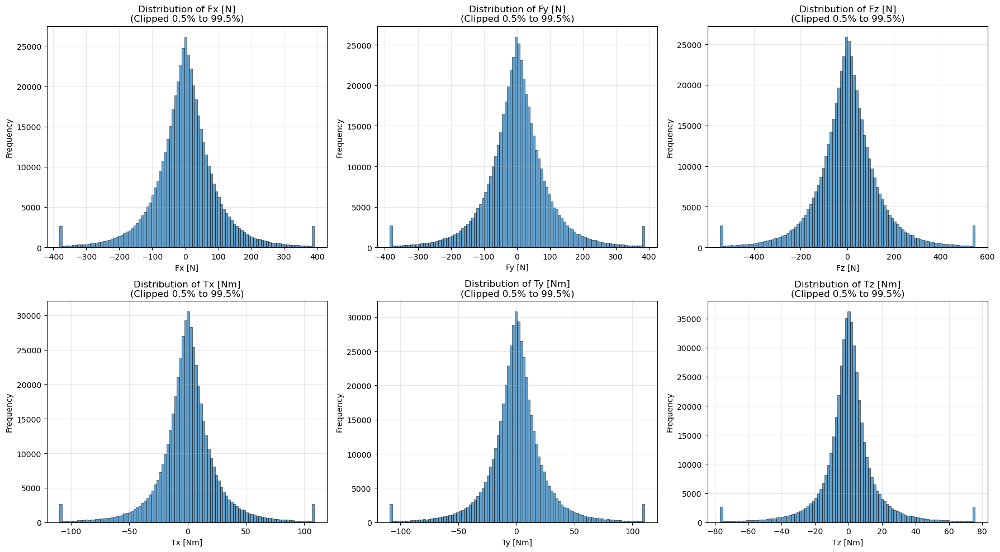


Plotting wrench magnitude distribution...


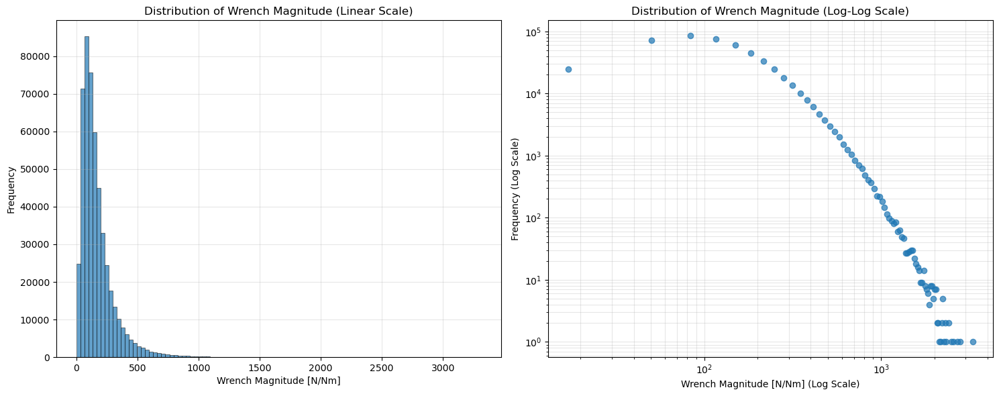


Plotting current component distributions...


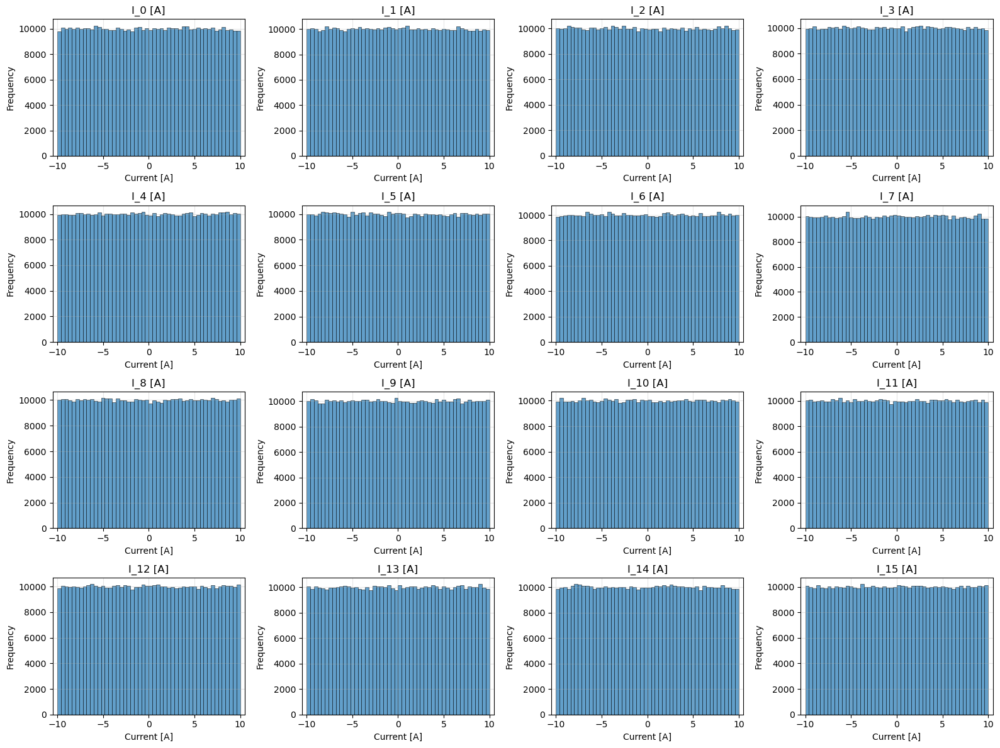


Plotting wrench component correlation heatmap...


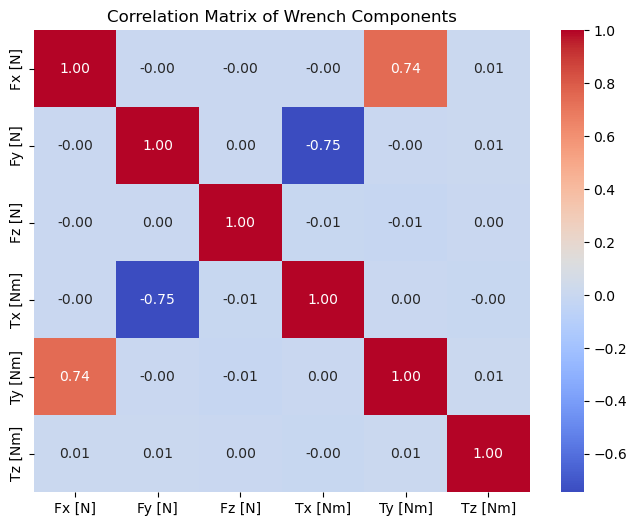


Plotting pose distributions...


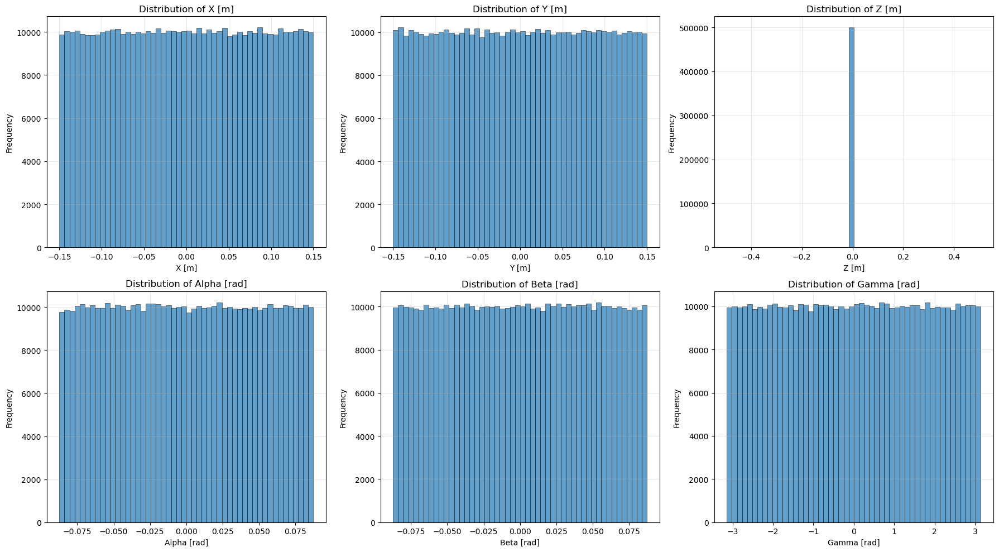


Plotting wrench magnitude vs. pose (X, Y)...


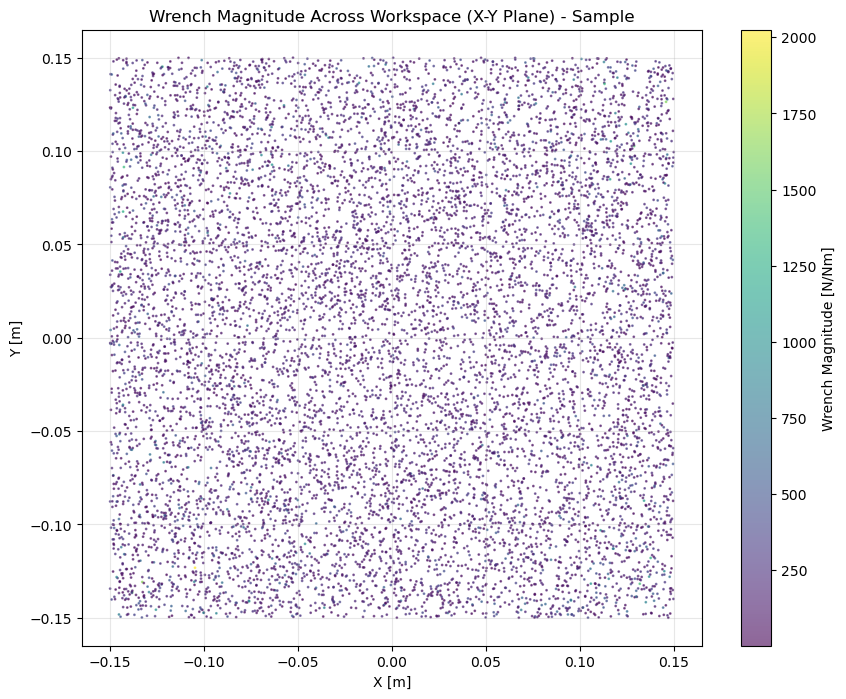


Analyzing zero-wrench cases...
Number of samples with wrench_mag < 0.1: 0
Total samples: 500000
Percentage of zero-wrench samples: 0.00%
No zero-wrench samples found in the dataset.

--- Dataset Statistics Summary ---
                 x_m            y_m           z_m          alpha  \
count  500000.000000  500000.000000  5.000000e+05  500000.000000   
mean        0.000132       0.000021  5.000000e-03       0.000012   
std         0.086570       0.086623  2.602088e-18       0.050354   
min        -0.150000      -0.149999  5.000000e-03      -0.087266   
25%        -0.074815      -0.074971  5.000000e-03      -0.043606   
50%         0.000135       0.000064  5.000000e-03      -0.000113   
75%         0.075179       0.075133  5.000000e-03       0.043641   
max         0.150000       0.150000  5.000000e-03       0.087265   

                beta          gamma            I_0            I_1  \
count  500000.000000  500000.000000  500000.000000  500000.000000   
mean        0.000022       0.0

In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# --- 1. Load the generated dataset ---
print("Loading dataset...")
df = pd.read_csv("gamma_dataset_hybrid_fixed.csv")
print(f"Dataset loaded. Shape: {df.shape}")
# print(df.head()) # Uncomment to see first few rows

# --- 2. Plot Wrench Component Distributions ---
print("\nPlotting wrench component distributions...")
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.ravel()

wrench_cols = [f'wrench_{i}' for i in range(6)]
wrench_names = ['Fx [N]', 'Fy [N]', 'Fz [N]', 'Tx [Nm]', 'Ty [Nm]', 'Tz [Nm]']

# Determine clipping limits for better visualization (e.g., 0.5% to 99.5%)
percentile_low = 0.5
percentile_high = 99.5

for i, (col, name) in enumerate(zip(wrench_cols, wrench_names)):
    ax = axes[i]
    lower_clip = np.percentile(df[col], percentile_low)
    upper_clip = np.percentile(df[col], percentile_high)
    data_to_plot = df[col].clip(lower_clip, upper_clip)
    
    ax.hist(data_to_plot, bins=100, alpha=0.7, edgecolor='black', linewidth=0.5)
    ax.set_title(f'Distribution of {name}\n(Clipped {percentile_low}% to {percentile_high}%)')
    ax.set_xlabel(name)
    ax.set_ylabel('Frequency')
    # Use log scale for frequency if distribution is very wide
    # ax.set_yscale('log') 
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# --- 3. Plot Wrench Magnitude Distribution ---
print("\nPlotting wrench magnitude distribution...")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Linear scale histogram
ax1.hist(df['wrench_mag'], bins=100, alpha=0.7, edgecolor='black', linewidth=0.5)
ax1.set_title('Distribution of Wrench Magnitude (Linear Scale)')
ax1.set_xlabel('Wrench Magnitude [N/Nm]')
ax1.set_ylabel('Frequency')
ax1.grid(True, alpha=0.3)

# Log-log scale histogram to see full range
counts, bin_edges = np.histogram(df['wrench_mag'], bins=100)
# Avoid log(0) by filtering out zero counts
nonzero_counts = counts[counts > 0]
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2 # Calculate bin centers
nonzero_bins = bin_centers[counts > 0]

ax2.plot(nonzero_bins, nonzero_counts, marker='o', linestyle='', alpha=0.7)
ax2.set_xscale('log')
ax2.set_yscale('log')
ax2.set_xlabel('Wrench Magnitude [N/Nm] (Log Scale)')
ax2.set_ylabel('Frequency (Log Scale)')
ax2.set_title('Distribution of Wrench Magnitude (Log-Log Scale)')
ax2.grid(True, which="both", alpha=0.3)

plt.tight_layout()
plt.show()

# --- 4. Plot Current Component Distributions ---
print("\nPlotting current component distributions...")
fig, axes = plt.subplots(4, 4, figsize=(16, 12))
axes = axes.ravel()

current_cols = [f'I_{i}' for i in range(16)]

for i, col in enumerate(current_cols):
    ax = axes[i]
    ax.hist(df[col], bins=50, alpha=0.7, edgecolor='black', linewidth=0.5)
    ax.set_title(f'{col} [A]')
    ax.set_xlabel('Current [A]')
    ax.set_ylabel('Frequency')
    ax.set_xlim(-10.5, 10.5)
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# --- 5. Correlation Heatmap for Wrench Components ---
print("\nPlotting wrench component correlation heatmap...")
wrench_data = df[wrench_cols]
corr_matrix = wrench_data.corr()

plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', 
            xticklabels=wrench_names, yticklabels=wrench_names)
plt.title('Correlation Matrix of Wrench Components')
plt.show()

# --- 6. Pose Distributions ---
print("\nPlotting pose distributions...")
pose_cols = ['x_m', 'y_m', 'z_m', 'alpha', 'beta', 'gamma']
pose_names = ['X [m]', 'Y [m]', 'Z [m]', 'Alpha [rad]', 'Beta [rad]', 'Gamma [rad]']

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.ravel()

for i, (col, name) in enumerate(zip(pose_cols, pose_names)):
    ax = axes[i]
    ax.hist(df[col], bins=50, alpha=0.7, edgecolor='black', linewidth=0.5)
    ax.set_title(f'Distribution of {name}')
    ax.set_xlabel(name)
    ax.set_ylabel('Frequency')
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# --- 7. Wrench Magnitude vs. Pose (X, Y) ---
print("\nPlotting wrench magnitude vs. pose (X, Y)...")
# Sample a subset for scatter plot clarity
sample_df = df.sample(n=min(10000, len(df)), random_state=42)

plt.figure(figsize=(10, 8))
# Clip wrench_mag for visualization on colorbar if necessary
# clip_wrench_mag = np.percentile(sample_df['wrench_mag'], 95)
scatter = plt.scatter(sample_df['x_m'], sample_df['y_m'], 
                      c=sample_df['wrench_mag'], #.clip(upper=clip_wrench_mag), 
                      cmap='viridis', alpha=0.6, s=1)
plt.colorbar(scatter, label='Wrench Magnitude [N/Nm]')
plt.title('Wrench Magnitude Across Workspace (X-Y Plane) - Sample')
plt.xlabel('X [m]')
plt.ylabel('Y [m]')
plt.grid(True, alpha=0.3)
plt.show()

# --- 8. Analyze Zero-Wrench Cases ---
print("\nAnalyzing zero-wrench cases...")
zero_wrench_threshold = 0.1
mask_zero_wrench = df['wrench_mag'] < zero_wrench_threshold

print(f"Number of samples with wrench_mag < {zero_wrench_threshold}: {mask_zero_wrench.sum()}")
print(f"Total samples: {len(df)}")
print(f"Percentage of zero-wrench samples: {mask_zero_wrench.sum() / len(df) * 100:.2f}%")

if mask_zero_wrench.sum() > 0:
    # Check current magnitudes for zero-wrench samples
    zero_current_cols = [f'I_{i}' for i in range(16)]
    zero_wrench_data = df[mask_zero_wrench]
    current_mags_zero_wrench = np.linalg.norm(zero_wrench_data[zero_current_cols].values, axis=1)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

    # Distribution of wrench magnitudes for samples identified as "zero-wrench"
    ax1.hist(df.loc[mask_zero_wrench, 'wrench_mag'], bins=50, alpha=0.7, edgecolor='black', linewidth=0.5)
    ax1.set_title('Wrench Magnitude Distribution (Zero-Wrench Samples)')
    ax1.set_xlabel('Wrench Magnitude [N/Nm]')
    ax1.set_ylabel('Frequency')
    ax1.set_yscale('log') # Log scale might be helpful if range is wide
    ax1.grid(True, alpha=0.3)

    # Distribution of current magnitudes for those same zero-wrench samples
    ax2.hist(current_mags_zero_wrench, bins=50, alpha=0.7, edgecolor='black', linewidth=0.5)
    ax2.set_title('Current Magnitude Distribution for Zero-Wrench Samples')
    ax2.set_xlabel('Current Magnitude [A]')
    ax2.set_ylabel('Frequency')
    ax2.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    # Count how many zero-wrench samples have non-trivial currents
    nonzero_current_threshold = 0.5 # Define what "non-trivial" means
    nonzero_current_in_zero_wrench = np.sum(current_mags_zero_wrench > nonzero_current_threshold)
    print(f"Zero-wrench samples with current_mag > {nonzero_current_threshold}A: {nonzero_current_in_zero_wrench}")
    print(f"Percentage of zero-wrench samples with non-trivial currents: {nonzero_current_in_zero_wrench / len(current_mags_zero_wrench) * 100:.2f}%")
    
    # --- 9. Heatmap of Currents for Zero-Wrench Samples (Sample) ---
    print("\nPlotting heatmap of currents for a sample of zero-wrench cases...")
    # Take a small, random sample of zero-wrench samples for the heatmap
    sample_size_heatmap = min(200, len(zero_wrench_data))
    if sample_size_heatmap > 0:
        df_zero_wrench_sample = zero_wrench_data.sample(n=sample_size_heatmap, random_state=42)
        currents_data_zero_wrench = df_zero_wrench_sample[current_cols].values

        plt.figure(figsize=(12, 8))
        ax = sns.heatmap(currents_data_zero_wrench,
                         cmap='RdBu_r',
                         center=0,
                         cbar_kws={'label': 'Current [A]'},
                         xticklabels=[f'I_{i}' for i in range(16)],
                         yticklabels=False)
        plt.title(f'Heatmap of Currents for {sample_size_heatmap} Zero-Wrench Samples')
        plt.xlabel('Coil Index')
        plt.ylabel('Sample Index (Zero-Wrench Subset)')
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()
    else:
        print("Not enough zero-wrench samples to create a heatmap.")

else:
    print("No zero-wrench samples found in the dataset.")

# --- 10. Statistics Summary ---
print("\n--- Dataset Statistics Summary ---")
print(df.describe())


Loading dataset...
Original dataset shape: (500000, 29)

Filtering out samples with wrench_mag > 500.0...
  Samples removed: 16362
  Final dataset shape: (483638, 29)

Feature matrix (X) shape: (483638, 12)
Target matrix (y) shape: (483638, 16)

Performing train-test split...
  Training set: X_train (386910, 12), y_train (386910, 16)
  Testing set: X_test (96728, 12), y_test (96728, 16)

Scaling features...

Defining the model architecture...

Defining the new scaled loss function...

Compiling the model with the new loss function...


/home/alireza-linux/.local/lib/python3.12/site-packages/keras/src/layers/core/dense.py:92: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1 (Dense)                 │ (None, 256)            │         3,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn_1 (BatchNormalization)       │ (None, 256)            │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 256)            │        65,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn_2 (BatchNormalization)       │ (None, 256)            │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn_3 (BatchNormalization)       │ (None, 128)            │           512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ (None, 16)             │         2,064 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 106,640 (416.56 KB)

 Trainable params: 105,360 (411.56 KB)

 Non-trainable params: 1,280 (5.00 KB)


Starting model training with the new loss function...
Epoch 1/200
681/681 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - loss: 34.7263 - mae: 5.0196 - val_loss: 34.6647 - val_mae: 5.0144 - learning_rate: 0.0010
Epoch 2/200
681/681 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 34.6075 - mae: 5.0127 - val_loss: 34.6370 - val_mae: 5.0156 - learning_rate: 0.0010
Epoch 3/200
681/681 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 34.5602 - mae: 5.0109 - val_loss: 34.5969 - val_mae: 5.0150 - learning_rate: 0.0010
Epoch 4/200
681/681 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 34.5326 - mae: 5.0103 - val_loss: 34.5654 - val_mae: 5.0138 - learning_rate: 0.0010
Epoch 5/200
681/681 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 34.5113 - mae: 5.0098 - val_loss: 34.5524 - val_mae: 5.0135 - learning_rate: 0.0010
Epoch 6/200
681/681 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 34.4953 - mae: 5.0094 - val_loss: 34.5487 - val_mae: 5.0137 - learning_rate: 0.0010
Epoch 7/200
681/681 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 34.4829 - mae:

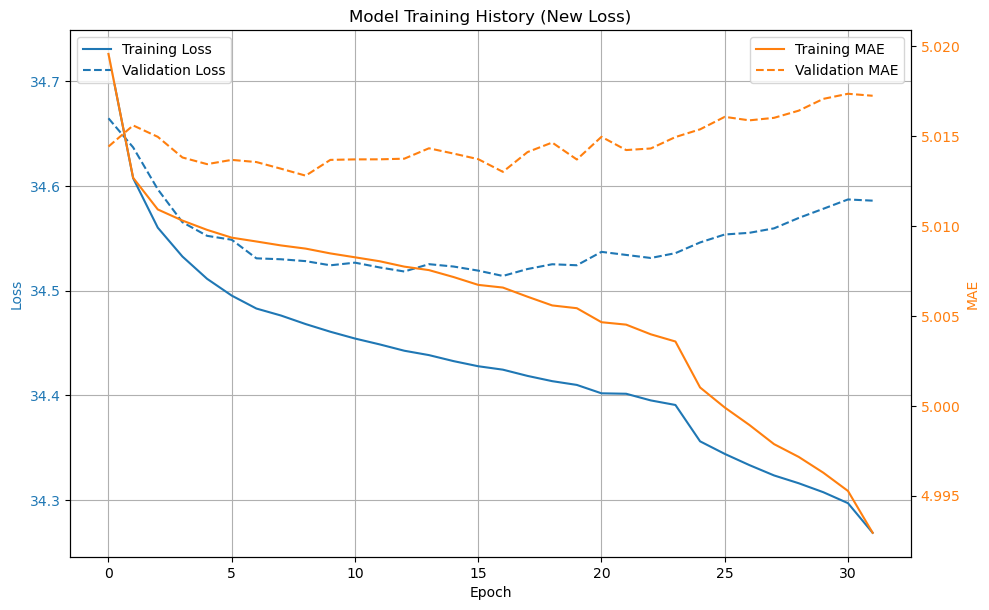


Plotting predictions vs. true values for a sample of test data...


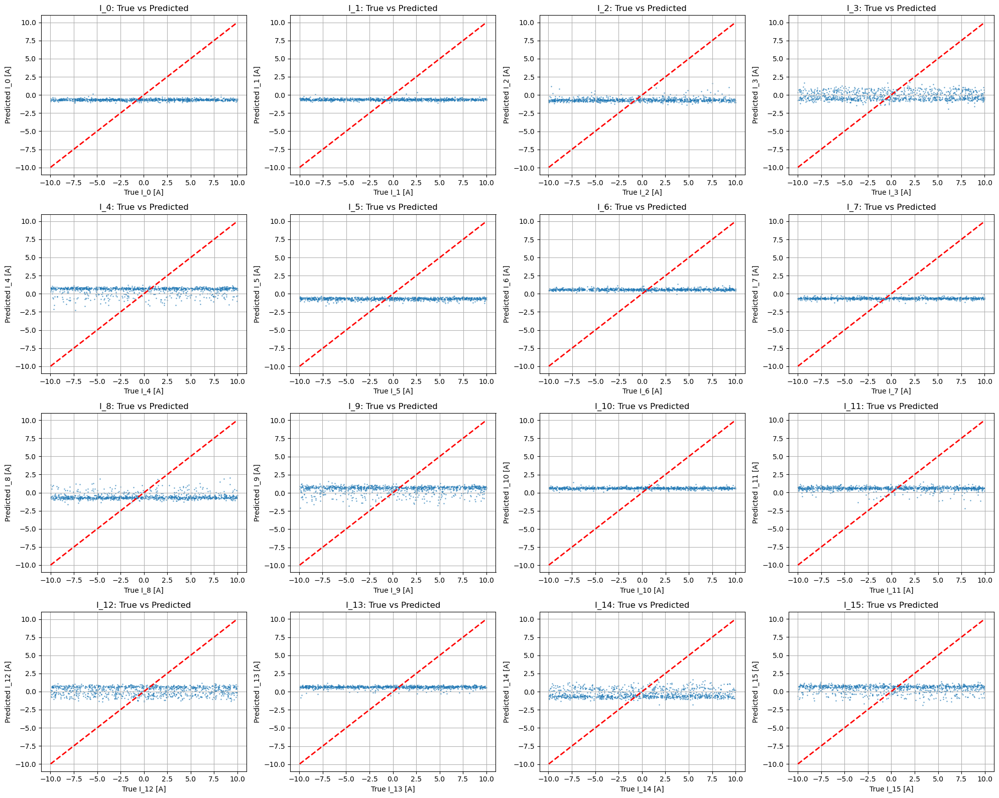

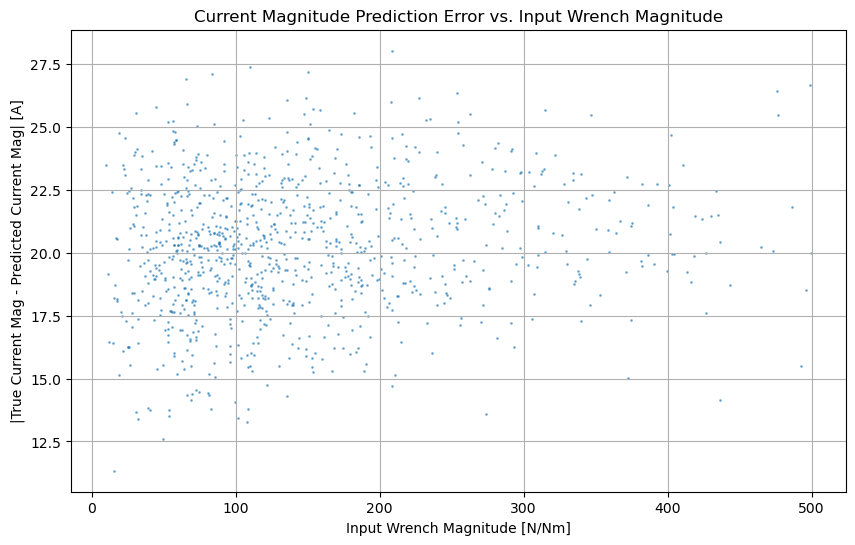


--- Example Predictions ---

Example 1:
  Input Wrench: [ 34.60974  -33.026875 -35.67248   10.604511   6.901228   5.866844]
  True Currents: [ 6.97046831  7.55550526  3.32905171 -3.92071736 -6.34220322  1.48481085
  6.11641642 -0.89764153 -4.7230481  -9.68698821 -3.41650165  2.90176349
  8.9987155   7.78620009 -5.91632592  5.98448967]
  Pred Currents: [-0.6456971  -0.72279644 -0.7035967  -0.3337666   0.7894279  -0.6792163
  0.6028471  -0.79151106 -0.6677515  -0.46961313  0.6995918   0.6027328
  0.8789562   0.69763637  0.0698093   0.6450212 ]
  True Wrench Mag: 61.28, True Current Mag: 23.69, Pred Current Mag: 2.61

Example 2:
  Input Wrench: [-63.96999    -8.912727   14.026266    6.0699377 -13.21353     6.1563635]
  True Currents: [ 6.13916406  2.67905799 -1.88088008 -6.18162407  9.39993735 -0.70631503
  8.4519939  -0.46874406 -5.90577439 -0.72611977  7.80640726  8.91612816
 -0.77455547  5.24511932  3.91394847 -2.1538417 ]
  Pred Currents: [-0.5647707  -0.56179565 -0.7173249  -0.54958

In [17]:
import pandas as pd
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# --- 1. Load and Preprocess the Dataset (Same as before) ---
print("Loading dataset...")
df = pd.read_csv("gamma_dataset_hybrid_fixed.csv")
print(f"Original dataset shape: {df.shape}")

wrench_magnitude_threshold = 500.0
print(f"\nFiltering out samples with wrench_mag > {wrench_magnitude_threshold}...")
initial_count = len(df)
df_filtered = df[df['wrench_mag'] <= wrench_magnitude_threshold]
final_count = len(df_filtered)
print(f"  Samples removed: {initial_count - final_count}")
print(f"  Final dataset shape: {df_filtered.shape}")

feature_cols = ['x_m', 'y_m', 'z_m', 'alpha', 'beta', 'gamma', 
                'wrench_0', 'wrench_1', 'wrench_2', 'wrench_3', 'wrench_4', 'wrench_5']
X = df_filtered[feature_cols].values
target_cols = [f'I_{i}' for i in range(16)]
y = df_filtered[target_cols].values

print(f"\nFeature matrix (X) shape: {X.shape}")
print(f"Target matrix (y) shape: {y.shape}")

print("\nPerforming train-test split...")
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"  Training set: X_train {X_train.shape}, y_train {y_train.shape}")
print(f"  Testing set: X_test {X_test.shape}, y_test {y_test.shape}")

print("\nScaling features...")
scaler_X = StandardScaler()
# Crucially, we will NOT scale the targets `y` this time.
# The custom loss function will work with the original current magnitudes.
X_train_scaled = scaler_X.fit_transform(X_train)
X_test_scaled = scaler_X.transform(X_test)
# Keep y_train and y_test in original scale
# y_train_scaled = scaler_y.fit_transform(y_train)
# y_test_scaled = scaler_y.transform(y_test)

# --- 2. Define the Model Architecture (Same as before) ---
print("\nDefining the model architecture...")
model = tf.keras.Sequential([
    tf.keras.layers.Dense(256, activation='relu', input_shape=(X_train_scaled.shape[1],), name='dense_1'),
    tf.keras.layers.BatchNormalization(name='bn_1'),
    tf.keras.layers.Dropout(0.1, name='dropout_1'),
    
    tf.keras.layers.Dense(256, activation='relu', name='dense_2'),
    tf.keras.layers.BatchNormalization(name='bn_2'),
    tf.keras.layers.Dropout(0.1, name='dropout_2'),
    
    tf.keras.layers.Dense(128, activation='relu', name='dense_3'),
    tf.keras.layers.BatchNormalization(name='bn_3'),
    tf.keras.layers.Dropout(0.05, name='dropout_3'),
    
    tf.keras.layers.Dense(y_train.shape[1], activation='linear', name='output') 
])

# --- 3. Define the New Custom Loss Function ---
print("\nDefining the new scaled loss function...")

def scaled_loss(y_true, y_pred):
    """
    Custom loss function that combines MSE with a penalty for small predicted
    currents when the target (true) currents are large.
    This aims to push the model away from the trivial zero-current solution.
    """
    # 1. Standard Mean Squared Error
    mse = tf.reduce_mean(tf.square(y_true - y_pred))
    
    # 2. Calculate the L1 norm (total magnitude) of predicted currents for each sample
    pred_current_mag = tf.reduce_sum(tf.abs(y_pred), axis=-1) # Shape: (batch_size,)
    
    # 3. Calculate the L1 norm of true currents for each sample (proxy for required effort)
    true_current_mag = tf.reduce_sum(tf.abs(y_true), axis=-1) # Shape: (batch_size,)
    
    # 4. Define a penalty that is high when predicted currents are small 
    #    but true currents (or the problem complexity) is large.
    # We use the inverse of predicted magnitude, regularized to avoid division by zero.
    # The penalty is weighted by the true current magnitude.
    epsilon = 1e-8
    # Inverse of predicted magnitude, weighted by true magnitude
    inverse_pred_mag_weighted = true_current_mag / (pred_current_mag + epsilon)
    
    # 5. Apply this penalty primarily where it's needed: 
    #    when the true current magnitude is above a threshold.
    # This avoids penalizing the model for correctly predicting zero currents 
    # for zero or near-zero wrench inputs.
    current_threshold = 5.0 # Tune this threshold
    
    # Only apply significant penalty if true current mag is above threshold
    penalty = tf.where(
        true_current_mag > current_threshold,
        inverse_pred_mag_weighted, # High penalty if predicted mag is low
        0.0 # No extra penalty if true currents are small
    )
    
    # 6. Average the penalty over the batch
    mean_penalty = tf.reduce_mean(penalty)
    
    # 7. Combine the primary loss (MSE) with the penalty.
    #    The coefficient (e.g., 0.1) controls the strength of the penalty.
    #    Tune this coefficient.
    alpha = 0.1 # Penalty strength coefficient
    total_loss = mse + alpha * mean_penalty
    
    # It's good practice to add a small L2 regularization term to the loss
    # to prevent weights from becoming too large. This is different from L1 on outputs.
    l2_regularization = 1e-4 * tf.add_n([tf.nn.l2_loss(v) for v in model.trainable_variables if 'bias' not in v.name])
    total_loss = total_loss + l2_regularization
    
    return total_loss

# --- 4. Compile the Model with the New Loss ---
print("\nCompiling the model with the new loss function...")
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)

model.compile(
    optimizer=optimizer, 
    loss=scaled_loss, # Use the new custom loss
    metrics=['mae']   # Monitor MAE during training
)

model.summary()

# --- 5. Train the Model ---
print("\nStarting model training with the new loss function...")
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=7, min_lr=1e-7)

# Train the model on UNSCALED targets
history = model.fit(
    X_train_scaled, y_train, # Note: y_train is NOT scaled
    batch_size=512,
    epochs=200, # Increased epochs as training might be slower
    validation_split=0.1,
    callbacks=[early_stopping, reduce_lr],
    verbose=1
)

print("Model training finished.")

# --- 6. Evaluate the Model ---
print("\n--- Model Evaluation on Test Set ---")
# Evaluate on test data (unscaled targets)
test_loss, test_mae = model.evaluate(X_test_scaled, y_test, verbose=0) # Note: y_test is NOT scaled
print(f"  Test Loss (Custom Scaled Loss): {test_loss:.4f}")
print(f"  Test MAE: {test_mae:.4f}")

# Predict on test set
y_pred = model.predict(X_test_scaled, verbose=0) # Predictions are in original scale

# --- 7. Plot Training History ---
print("\nPlotting training history...")
fig, ax1 = plt.subplots(figsize=(10, 6))

color = 'tab:blue'
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Loss', color=color)
ax1.plot(history.history['loss'], label='Training Loss', color=color)
ax1.plot(history.history['val_loss'], label='Validation Loss', color=color, linestyle='--')
ax1.tick_params(axis='y', labelcolor=color)
ax1.legend(loc='upper left')
ax1.grid(True)

ax2 = ax1.twinx()
color = 'tab:orange'
ax2.set_ylabel('MAE', color=color)
ax2.plot(history.history['mae'], label='Training MAE', color=color)
ax2.plot(history.history['val_mae'], label='Validation MAE', color=color, linestyle='--')
ax2.tick_params(axis='y', labelcolor=color)
ax2.legend(loc='upper right')

fig.tight_layout()
plt.title('Model Training History (New Loss)')
plt.show()

# --- 8. Visualize Predictions vs. True Values (Sample) ---
print("\nPlotting predictions vs. true values for a sample of test data...")
num_samples_to_plot = 1000
sample_indices = np.random.choice(len(y_test), size=num_samples_to_plot, replace=False)

# --- 8.1. Scatter Plots for Individual Currents ---
fig, axes = plt.subplots(4, 4, figsize=(20, 16))
axes = axes.flatten()
current_names = [f'I_{i}' for i in range(16)]

for i in range(16):
    ax = axes[i]
    true_vals = y_test[sample_indices, i]
    pred_vals = y_pred[sample_indices, i]
    
    ax.scatter(true_vals, pred_vals, alpha=0.5, s=1)
    
    min_val = min(np.min(true_vals), np.min(pred_vals))
    max_val = max(np.max(true_vals), np.max(pred_vals))
    ax.plot([min_val, max_val], [min_val, max_val], 'r--', lw=2)
    
    ax.set_xlabel(f'True {current_names[i]} [A]')
    ax.set_ylabel(f'Predicted {current_names[i]} [A]')
    ax.set_title(f'{current_names[i]}: True vs Predicted')
    ax.grid(True)

plt.tight_layout()
plt.show()

# --- 8.2. Wrench Magnitude Error vs. Wrench Magnitude ---
wrench_test_mag = np.linalg.norm(X_test[sample_indices, 6:], axis=1)
current_test_mag = np.linalg.norm(y_test[sample_indices], axis=1)
current_pred_mag = np.linalg.norm(y_pred[sample_indices], axis=1)
error_current_mag = np.abs(current_test_mag - current_pred_mag)

plt.figure(figsize=(10, 6))
plt.scatter(wrench_test_mag, error_current_mag, alpha=0.5, s=1)
plt.xlabel('Input Wrench Magnitude [N/Nm]')
plt.ylabel('|True Current Mag - Predicted Current Mag| [A]')
plt.title('Current Magnitude Prediction Error vs. Input Wrench Magnitude')
plt.grid(True)
plt.show()

# --- 8.3. Example Predictions Table ---
print("\n--- Example Predictions ---")
example_indices = np.random.choice(len(y_test), size=5, replace=False)
for i, idx in enumerate(example_indices):
    print(f"\nExample {i+1}:")
    print(f"  Input Wrench: {X_test[idx, 6:]}")
    print(f"  True Currents: {y_test[idx]}")
    print(f"  Pred Currents: {y_pred[idx]}")
    true_wrench_mag = np.linalg.norm(X_test[idx, 6:])
    true_current_mag = np.linalg.norm(y_test[idx])
    pred_current_mag = np.linalg.norm(y_pred[idx])
    print(f"  True Wrench Mag: {true_wrench_mag:.2f}, True Current Mag: {true_current_mag:.2f}, Pred Current Mag: {pred_current_mag:.2f}")


Loading dataset...
Original dataset shape: (500000, 29)

Filtering out samples with wrench_mag > 500.0...
  Samples removed: 16362
  Final dataset shape: (483638, 29)

Feature matrix (X) shape: (483638, 12)
Target matrix (y) shape: (483638, 16)

Performing train-test split...
  Training set: X_train (386910, 12), y_train (386910, 16)
  Testing set: X_test (96728, 12), y_test (96728, 16)

Scaling features and targets...

Defining and compiling the model...


/home/alireza-linux/.local/lib/python3.12/site-packages/keras/src/layers/core/dense.py:92: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1 (Dense)                 │ (None, 512)            │         6,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn_1 (BatchNormalization)       │ (None, 512)            │         2,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn_2 (BatchNormalization)       │ (None, 512)            │         2,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn_3 (BatchNormalization)       │ (None, 256)            │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 256)            │        65,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn_4 (BatchNormalization)       │ (None, 256)            │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn_5 (BatchNormalization)       │ (None, 128)            │           512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ (None, 16)             │         2,064 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 508,048 (1.94 MB)

 Trainable params: 504,720 (1.93 MB)

 Non-trainable params: 3,328 (13.00 KB)


Checking initial loss on a small batch...
  Initial loss on sample batch: [6.335006237030029, 0.9602707028388977]

Starting model training...
Epoch 1/500
681/681 ━━━━━━━━━━━━━━━━━━━━ 12s 8ms/step - loss: 6.7003 - mae: 0.9472 - val_loss: 5.3444 - val_mae: 0.8726 - learning_rate: 1.0000e-04
Epoch 2/500
681/681 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 5.4023 - mae: 0.8759 - val_loss: 5.2623 - val_mae: 0.8680 - learning_rate: 1.0000e-04
Epoch 3/500
681/681 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 5.3090 - mae: 0.8706 - val_loss: 5.2435 - val_mae: 0.8669 - learning_rate: 1.0000e-04
Epoch 4/500
681/681 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 5.2745 - mae: 0.8686 - val_loss: 5.2358 - val_mae: 0.8665 - learning_rate: 1.0000e-04
Epoch 5/500
681/681 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 5.2560 - mae: 0.8677 - val_loss: 5.2315 - val_mae: 0.8663 - learning_rate: 1.0000e-04
Epoch 6/500
681/681 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 5.2450 - mae: 0.8671 - val_loss: 5.2280 - val_mae: 0.8662 - 

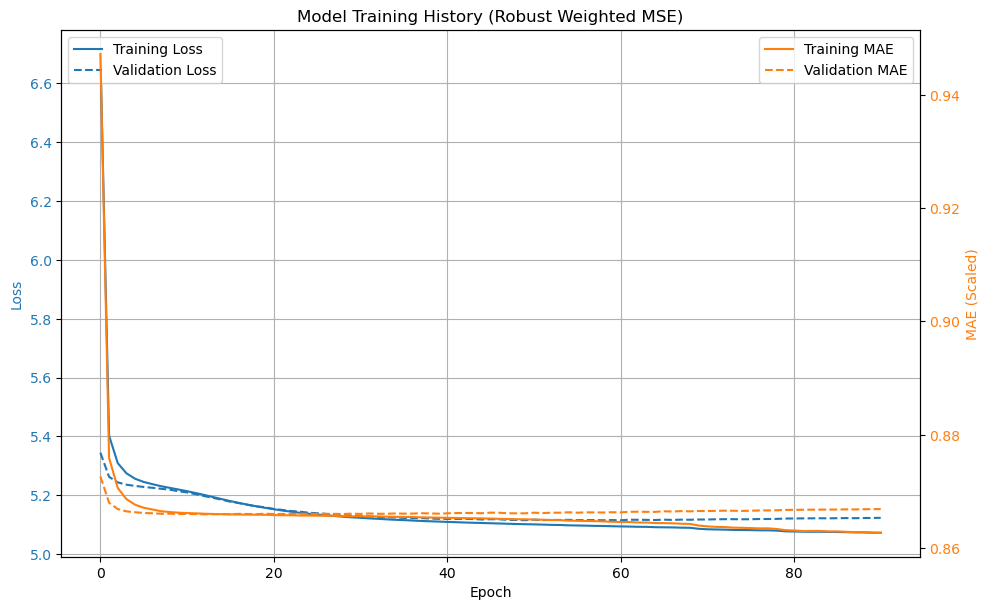


Plotting predictions vs. true values for a sample of test data...


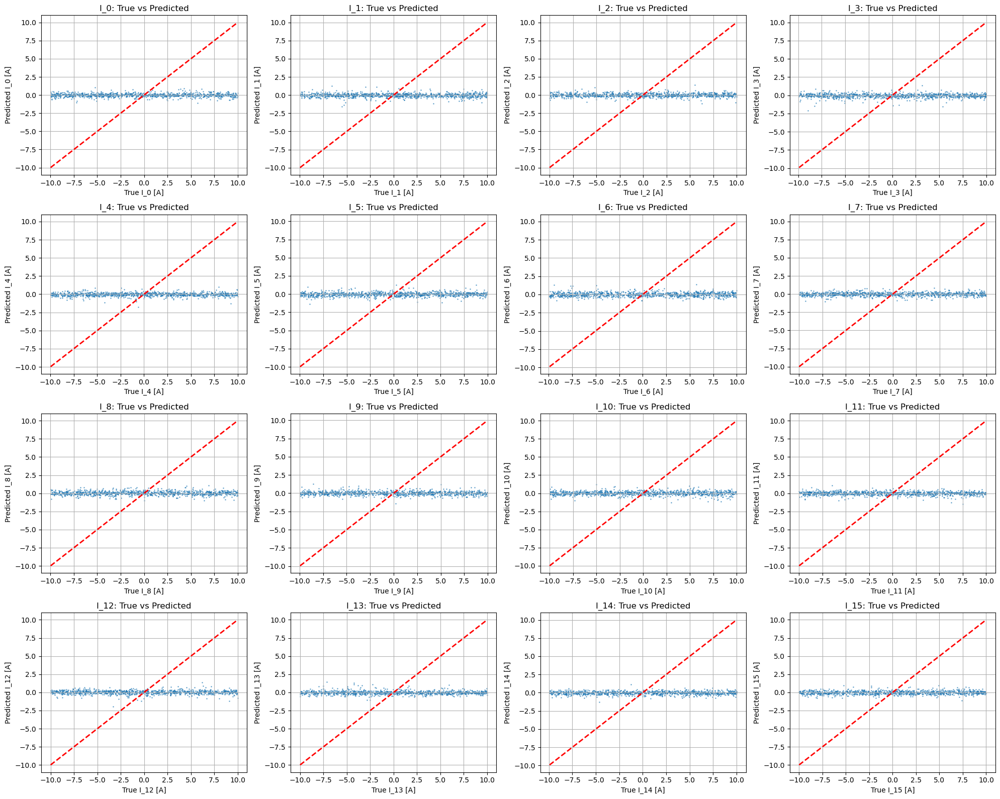


--- Example Predictions ---

Example 1:
  Input Wrench: [ -84.26216   -191.52985    -61.13862     25.708975   -31.106314
   -7.0708165]
  True Currents: [-0.65387326  7.94636942 -6.74879769 -9.12231698 -9.69504736  5.46242056
  9.57673116  6.63871006  8.64639546 -3.13874917  9.81726562 -0.2128376
 -8.51515357  4.86738546  9.19315953  3.86065867]
  Pred Currents: [ 0.08382056  0.08108899  0.00543784  0.2886579   0.15601541 -0.1906415
  0.15081736  0.332242    0.46311605 -0.2346929   0.20710807 -0.06771559
 -0.07221072  0.14686453 -0.47196403 -0.08391694]
  True Wrench Mag: 221.81, True Current Mag: 28.79, Pred Current Mag: 0.93

Example 2:
  Input Wrench: [-86.45742   45.581135  46.7557   -10.677358 -20.409752  -5.585071]
  True Currents: [ 0.84202103 -1.29263333 -1.23522263 -4.32298849  0.47839012 -9.3936183
  4.21482574  1.26221117 -4.33323975  0.84635862 -2.18442632 -2.61993006
 -9.27004756  7.56502416 -1.51766229 -3.57589934]
  Pred Currents: [ 0.1466589  -0.0952349   0.01435774  0

In [25]:
import pandas as pd
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# --- 1. Load and Preprocess the Dataset ---
print("Loading dataset...")
df = pd.read_csv("gamma_dataset_hybrid_fixed.csv")
print(f"Original dataset shape: {df.shape}")

wrench_magnitude_threshold = 500.0
print(f"\nFiltering out samples with wrench_mag > {wrench_magnitude_threshold}...")
initial_count = len(df)
df_filtered = df[df['wrench_mag'] <= wrench_magnitude_threshold]
final_count = len(df_filtered)
print(f"  Samples removed: {initial_count - final_count}")
print(f"  Final dataset shape: {df_filtered.shape}")

feature_cols = ['x_m', 'y_m', 'z_m', 'alpha', 'beta', 'gamma', 
                'wrench_0', 'wrench_1', 'wrench_2', 'wrench_3', 'wrench_4', 'wrench_5']
X = df_filtered[feature_cols].values
target_cols = [f'I_{i}' for i in range(16)]
y = df_filtered[target_cols].values

print(f"\nFeature matrix (X) shape: {X.shape}")
print(f"Target matrix (y) shape: {y.shape}")

print("\nPerforming train-test split...")
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"  Training set: X_train {X_train.shape}, y_train {y_train.shape}")
print(f"  Testing set: X_test {X_test.shape}, y_test {y_test.shape}")

# --- Key Change 1: Scale both features AND targets ---
print("\nScaling features and targets...")
scaler_X = StandardScaler()
# Create a scaler for the target currents
scaler_y = StandardScaler() 

X_train_scaled = scaler_X.fit_transform(X_train)
X_test_scaled = scaler_X.transform(X_test)
# Scale the target currents
y_train_scaled = scaler_y.fit_transform(y_train)
y_test_scaled = scaler_y.transform(y_test)
# --- End of Key Change 1 ---

# --- 2. Define a More Robust Loss Function ---
def robust_weighted_mse_loss(y_true, y_pred):
    """
    A more robust weighted MSE loss, designed to work with scaled data.
    """
    # 1. Standard MSE per sample (mean over 16 currents)
    squared_diff = tf.square(y_true - y_pred)
    mse_per_sample = tf.reduce_mean(squared_diff, axis=-1) # Shape: (batch_size,)
    
    # 2. Weight by the magnitude of the true target vector for each sample
    true_mag = tf.norm(y_true, axis=1) # Shape: (batch_size,)
    
    # 3. Create weight: Higher weight for larger true magnitudes
    # Add a small constant for numerical stability
    epsilon = 1e-3
    # A simple linear weight based on magnitude to start with
    weight = 1.0 + true_mag # Weight is at least 1, increases with true magnitude
    
    # 4. Weighted MSE per sample
    weighted_mse_per_sample = weight * mse_per_sample
    
    # 5. Final loss: Mean over the batch
    total_loss = tf.reduce_mean(weighted_mse_per_sample)
    
    # 6. Optional: Add a small L2 regularization on model weights to prevent explosion
    l2_reg = 1e-4 * tf.add_n([
        tf.nn.l2_loss(v) for v in model.trainable_variables if 'bias' not in v.name
    ])
    
    return total_loss + l2_reg

# --- 3. Define the Model Architecture (Kept the same) ---
def create_model(input_shape):
    model = tf.keras.Sequential([
        tf.keras.layers.Dense(512, activation='relu', input_shape=input_shape, name='dense_1'),
        tf.keras.layers.BatchNormalization(name='bn_1'),
        tf.keras.layers.Dropout(0.2, name='dropout_1'),
        
        tf.keras.layers.Dense(512, activation='relu', name='dense_2'),
        tf.keras.layers.BatchNormalization(name='bn_2'),
        tf.keras.layers.Dropout(0.2, name='dropout_2'),
        
        tf.keras.layers.Dense(256, activation='relu', name='dense_3'),
        tf.keras.layers.BatchNormalization(name='bn_3'),
        tf.keras.layers.Dropout(0.1, name='dropout_3'),
        
        tf.keras.layers.Dense(256, activation='relu', name='dense_4'),
        tf.keras.layers.BatchNormalization(name='bn_4'),
        tf.keras.layers.Dropout(0.1, name='dropout_4'),
        
        tf.keras.layers.Dense(128, activation='relu', name='dense_5'),
        tf.keras.layers.BatchNormalization(name='bn_5'),
        
        tf.keras.layers.Dense(16, activation='linear', name='output')
    ])
    return model

# --- 4. Compile and Train the Model ---
print("\nDefining and compiling the model...")
model = create_model((X_train_scaled.shape[1],))

# --- Key Change 2: Reduce Learning Rate ---
optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001) # Reduced from 0.001
# --- End of Key Change 2 ---

# --- Key Change 3: Compile with scaled targets and new loss ---
model.compile(optimizer=optimizer, loss=robust_weighted_mse_loss, metrics=['mae'])
# --- End of Key Change 3 ---

model.summary()

# --- Key Change 4: Optional Initial Loss Check ---
print("\nChecking initial loss on a small batch...")
sample_X = X_train_scaled[:10]
sample_y = y_train_scaled[:10]
initial_loss = model.evaluate(sample_X, sample_y, verbose=0)
print(f"  Initial loss on sample batch: {initial_loss}")
# --- End of Key Change 4 ---

print("\nStarting model training...")
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=30, restore_best_weights=True)
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, min_lr=1e-7, verbose=1)

# --- Key Change 5: Train with scaled targets ---
history = model.fit(
    X_train_scaled, y_train_scaled, # Use scaled targets
    batch_size=512,
    epochs=500, # You can keep 500 or increase if needed after seeing results
    validation_split=0.1,
    callbacks=[early_stopping, reduce_lr],
    verbose=1
)
# --- End of Key Change 5 ---

print("Model training finished.")

# --- 5. Evaluate the Model ---
print("\n--- Model Evaluation on Test Set ---")
# --- Key Change 6: Evaluate with scaled targets ---
test_loss, test_mae = model.evaluate(X_test_scaled, y_test_scaled, verbose=0) # Evaluate on scaled data
# --- End of Key Change 6 ---
print(f"  Test Loss (Robust Weighted MSE Loss): {test_loss:.4f}")
print(f"  Test MAE (Scaled): {test_mae:.4f}") # Note: MAE is on scaled targets

# --- Key Change 7: Predict and Inverse Transform ---
y_pred_scaled = model.predict(X_test_scaled, verbose=0) # Predict scaled outputs
# Convert predictions back to original scale for analysis and comparison
y_pred = scaler_y.inverse_transform(y_pred_scaled) # Inverse transform predictions
# --- End of Key Change 7 ---

# --- 6. Plot Training History ---
print("\nPlotting training history...")
fig, ax1 = plt.subplots(figsize=(10, 6))

color = 'tab:blue'
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Loss', color=color)
ax1.plot(history.history['loss'], label='Training Loss', color=color)
ax1.plot(history.history['val_loss'], label='Validation Loss', color=color, linestyle='--')
ax1.tick_params(axis='y', labelcolor=color)
ax1.legend(loc='upper left')
ax1.grid(True)

ax2 = ax1.twinx()
color = 'tab:orange'
ax2.set_ylabel('MAE (Scaled)', color=color) # Clarify it's scaled MAE
ax2.plot(history.history['mae'], label='Training MAE', color=color)
ax2.plot(history.history['val_mae'], label='Validation MAE', color=color, linestyle='--')
ax2.tick_params(axis='y', labelcolor=color)
ax2.legend(loc='upper right')

fig.tight_layout()
plt.title('Model Training History (Robust Weighted MSE)')
plt.show()

# --- 7. Visualize Predictions (Using Inverse-Transformed Predictions) ---
print("\nPlotting predictions vs. true values for a sample of test data...")
num_samples_to_plot = 1000
sample_indices = np.random.choice(len(y_test), size=num_samples_to_plot, replace=False)

fig, axes = plt.subplots(4, 4, figsize=(20, 16))
axes = axes.flatten()
current_names = [f'I_{i}' for i in range(16)]

for i in range(16):
    ax = axes[i]
    # Use original scale data for plotting
    true_vals = y_test[sample_indices, i]
    pred_vals = y_pred[sample_indices, i] # Use inverse-transformed predictions
    ax.scatter(true_vals, pred_vals, alpha=0.5, s=1)
    min_val = min(np.min(true_vals), np.min(pred_vals))
    max_val = max(np.max(true_vals), np.max(pred_vals))
    ax.plot([min_val, max_val], [min_val, max_val], 'r--', lw=2)
    ax.set_xlabel(f'True {current_names[i]} [A]')
    ax.set_ylabel(f'Predicted {current_names[i]} [A]')
    ax.set_title(f'{current_names[i]}: True vs Predicted')
    ax.grid(True)

plt.tight_layout()
plt.show()

# --- 8. Example Predictions (Using Inverse-Transformed Predictions) ---
print("\n--- Example Predictions ---")
example_indices = np.random.choice(len(y_test), size=5, replace=False)
for i, idx in enumerate(example_indices):
    print(f"\nExample {i+1}:")
    print(f"  Input Wrench: {X_test[idx, 6:]}")
    print(f"  True Currents: {y_test[idx]}") # Original scale
    print(f"  Pred Currents: {y_pred[idx]}") # Inverse-transformed prediction
    true_wrench_mag = np.linalg.norm(X_test[idx, 6:])
    true_current_mag = np.linalg.norm(y_test[idx]) # Original scale
    pred_current_mag = np.linalg.norm(y_pred[idx]) # Inverse-transformed
    print(f"  True Wrench Mag: {true_wrench_mag:.2f}, True Current Mag: {true_current_mag:.2f}, Pred Current Mag: {pred_current_mag:.2f}")


Loading dataset...
Original dataset shape: (500000, 29)

Filtering out samples with wrench_mag > 500.0...
  Samples removed: 16362
  Final dataset shape: (483638, 29)

Feature matrix (X) shape: (483638, 12)
Target matrix (y) shape: (483638, 16)

Performing train-test split...
  Training set: X_train (386910, 12), y_train (386910, 16)
  Testing set: X_test (96728, 12), y_test (96728, 16)

Scaling features...

Defining and compiling the model...


Model: "current_distribution_model"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input (InputLayer)  │ (None, 12)        │          0 │ -                 │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 512)       │      6,656 │ input[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_1                │ (None, 512)       │      2,048 │ dense_1[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 512)       │          0 │ bn_1[0][0]        │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 512)       │    262,656 │ dropout_1[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_2                │ (None, 512)       │      2,048 │ dense_2[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_2 (Dropout) │ (None, 512)       │          0 │ bn_2[0][0]        │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_3 (Dense)     │ (None, 256)       │    131,328 │ dropout_2[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_3                │ (None, 256)       │      1,024 │ dense_3[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_3 (Dropout) │ (None, 256)       │          0 │ bn_3[0][0]        │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_4 (Dense)     │ (None, 256)       │     65,792 │ dropout_3[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_4                │ (None, 256)       │      1,024 │ dense_4[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_4 (Dropout) │ (None, 256)       │          0 │ bn_4[0][0]        │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_5 (Dense)     │ (None, 128)       │     32,896 │ dropout_4[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_5                │ (None, 128)       │        512 │ dense_5[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ mean (Dense)        │ (None, 16)        │      2,064 │ bn_5[0][0]        │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ variance (Dense)    │ (None, 16)        │      2,064 │ bn_5[0][0]        │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ output              │ (None, 32)        │          0 │ mean[0][0],       │
│ (Concatenate)       │                   │            │ variance[0][0]    │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 510,112 (1.95 MB)

 Trainable params: 506,784 (1.93 MB)

 Non-trainable params: 3,328 (13.00 KB)


Starting model training...
Epoch 1/500
681/681 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - loss: 19.6571 - mae_mean: 5.0242 - val_loss: 7.8687 - val_mae_mean: 5.0025 - learning_rate: 0.0010
Epoch 2/500
681/681 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 5.5678 - mae_mean: 5.0049 - val_loss: 4.2945 - val_mae_mean: 4.9985 - learning_rate: 0.0010
Epoch 3/500
681/681 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.7367 - mae_mean: 5.0008 - val_loss: 3.3420 - val_mae_mean: 4.9965 - learning_rate: 0.0010
Epoch 4/500
681/681 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.0968 - mae_mean: 4.9990 - val_loss: 2.9088 - val_mae_mean: 4.9954 - learning_rate: 0.0010
Epoch 5/500
681/681 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 2.7759 - mae_mean: 4.9974 - val_loss: 2.6700 - val_mae_mean: 4.9946 - learning_rate: 0.0010
Epoch 6/500
681/681 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.5899 - mae_mean: 4.9967 - val_loss: 2.5251 - val_mae_mean: 4.9941 - learning_rate: 0.0010
Epoch 7/500
681/681 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step 

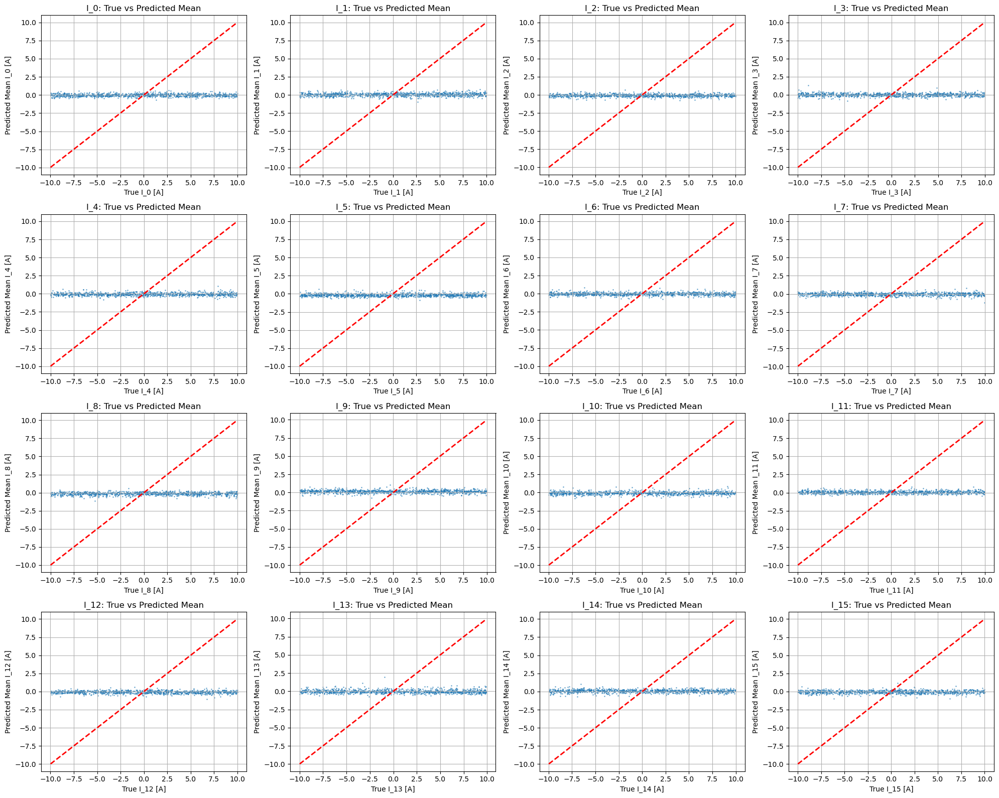


--- Example Predictions (Mean and Variance) ---

Example 1 (Index 997):
  Input Wrench: [  4.303747   -11.063231     3.7317276    4.9356413   -0.6900691
   0.75108314]
  True Currents: [ 1.22022078  8.659557    6.24317959  7.94720717 -5.42944462 -6.38194461
  2.30447803 -5.8097382   6.84748747  8.5324513  -5.4838056   2.35072835
 -1.10217732  9.91440097  2.46314305  2.20918739]
  Pred Mean Currents: [-0.27354056  0.00676725  0.15826443 -0.09027603 -0.21617351 -0.10304754
  0.01480795  0.02305425 -0.06803375  0.2670414   0.06798211 -0.09426438
 -0.10233513 -0.12612312  0.06809376 -0.05773018]
  True Wrench Mag: 13.43, True Current Mag: 23.53, Pred Mean Current Mag: 0.54

Example 2 (Index 10790):
  Input Wrench: [ 10.275921 277.69016  235.5231   -75.62414  -21.575958  25.11989 ]
  True Currents: [-4.96994532  2.66075272 -7.51867147 -1.94324537 -1.04669245  8.73086418
 -7.5380721  -9.72867369  1.34127219  7.0208913   1.22281773  4.45554
  4.7419969   6.25528904 -3.41003681 -0.51142885]
 

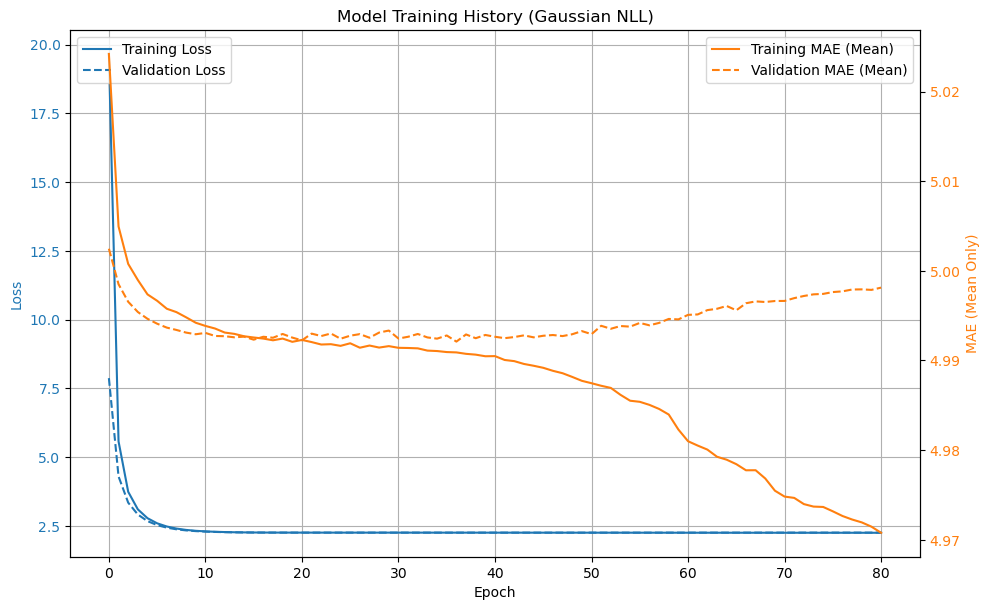

In [23]:
import pandas as pd
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# --- 1. Load and Preprocess the Dataset ---
print("Loading dataset...")
df = pd.read_csv("gamma_dataset_hybrid_fixed.csv")
print(f"Original dataset shape: {df.shape}")

wrench_magnitude_threshold = 500.0
print(f"\nFiltering out samples with wrench_mag > {wrench_magnitude_threshold}...")
initial_count = len(df)
df_filtered = df[df['wrench_mag'] <= wrench_magnitude_threshold]
final_count = len(df_filtered)
print(f"  Samples removed: {initial_count - final_count}")
print(f"  Final dataset shape: {df_filtered.shape}")

feature_cols = ['x_m', 'y_m', 'z_m', 'alpha', 'beta', 'gamma', 
                'wrench_0', 'wrench_1', 'wrench_2', 'wrench_3', 'wrench_4', 'wrench_5']
X = df_filtered[feature_cols].values
target_cols = [f'I_{i}' for i in range(16)]
y = df_filtered[target_cols].values

print(f"\nFeature matrix (X) shape: {X.shape}")
print(f"Target matrix (y) shape: {y.shape}")

print("\nPerforming train-test split...")
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"  Training set: X_train {X_train.shape}, y_train {y_train.shape}")
print(f"  Testing set: X_test {X_test.shape}, y_test {y_test.shape}")

print("\nScaling features...")
scaler_X = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train)
X_test_scaled = scaler_X.transform(X_test)

# --- 2. Define the Model Architecture (Corrected with Functional API) ---
def create_model(input_shape):
    """
    Creates a model that outputs mean and variance for each current using Functional API.
    """
    # Input layer
    inputs = tf.keras.layers.Input(shape=input_shape, name='input')
    
    # Hidden layers
    x = tf.keras.layers.Dense(512, activation='relu', name='dense_1')(inputs)
    x = tf.keras.layers.BatchNormalization(name='bn_1')(x)
    x = tf.keras.layers.Dropout(0.2, name='dropout_1')(x)
    
    x = tf.keras.layers.Dense(512, activation='relu', name='dense_2')(x)
    x = tf.keras.layers.BatchNormalization(name='bn_2')(x)
    x = tf.keras.layers.Dropout(0.2, name='dropout_2')(x)
    
    x = tf.keras.layers.Dense(256, activation='relu', name='dense_3')(x)
    x = tf.keras.layers.BatchNormalization(name='bn_3')(x)
    x = tf.keras.layers.Dropout(0.1, name='dropout_3')(x)
    
    x = tf.keras.layers.Dense(256, activation='relu', name='dense_4')(x)
    x = tf.keras.layers.BatchNormalization(name='bn_4')(x)
    x = tf.keras.layers.Dropout(0.1, name='dropout_4')(x)
    
    x = tf.keras.layers.Dense(128, activation='relu', name='dense_5')(x)
    x = tf.keras.layers.BatchNormalization(name='bn_5')(x)
    
    # Output branches for mean and variance
    mean_output = tf.keras.layers.Dense(16, activation='linear', name='mean')(x)
    variance_output = tf.keras.layers.Dense(16, activation='softplus', name='variance')(x)
    
    # Concatenate mean and variance to form the final output
    outputs = tf.keras.layers.Concatenate(name='output')([mean_output, variance_output])
    
    # Create the model
    model = tf.keras.Model(inputs=inputs, outputs=outputs, name='current_distribution_model')
    
    return model

# --- 3. Define the Loss Function ---
def gaussian_nll_loss(y_true, y_pred):
    """
    Negative Log-Likelihood loss for a Gaussian distribution.
    Assumes y_pred contains [mean, variance] concatenated for each output.
    y_true: True currents, shape (batch_size, 16)
    y_pred: Predicted [mean, variance], shape (batch_size, 32)
    """
    # Split predictions into mean and variance
    mean = y_pred[:, :16]  # First 16 elements are mean
    variance = y_pred[:, 16:]  # Last 16 elements are variance
    
    # Ensure variance is positive and add a small epsilon for numerical stability
    epsilon = 1e-6
    variance = variance + epsilon
    
    # Calculate the negative log-likelihood
    log_variance = tf.math.log(variance)
    squared_diff = tf.square(y_true - mean)
    nll = 0.5 * (log_variance + squared_diff / variance)
    nll = tf.reduce_mean(nll)
    
    return nll

# --- 4. Define a Custom Metric (Corrected) ---
def mean_absolute_error_mean_only(y_true, y_pred):
    """
    Custom metric to calculate MAE only on the mean part of the prediction.
    y_true: True currents, shape (batch_size, 16)
    y_pred: Predicted [mean, variance], shape (batch_size, 32)
    """
    # Extract only the mean predictions (first 16 elements)
    mean_pred = y_pred[:, :16]
    # Calculate MAE between true and predicted means
    mae = tf.reduce_mean(tf.abs(y_true - mean_pred))
    return mae

# It's good practice to give custom metrics a name for clarity in logs
mean_absolute_error_mean_only.__name__ = 'mae_mean'

# --- 5. Compile and Train the Model ---
print("\nDefining and compiling the model...")
model = create_model((X_train_scaled.shape[1],))
model.summary()

optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)

# Compile with custom loss and custom metric
model.compile(
    optimizer=optimizer, 
    loss=gaussian_nll_loss, 
    metrics=[mean_absolute_error_mean_only] # Use the custom metric
)

print("\nStarting model training...")
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=30, restore_best_weights=True)
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, min_lr=1e-7, verbose=1)

# Train the model
history = model.fit(
    X_train_scaled, y_train,
    batch_size=512,
    epochs=500,
    validation_split=0.1,
    callbacks=[early_stopping, reduce_lr],
    verbose=1
)

print("Model training finished.")

# --- 6. Evaluate the Model ---
print("\n--- Model Evaluation on Test Set ---")
# Evaluate on test data
# Note: The 'mae_mean' metric will also be computed and returned
test_loss, test_mae_mean = model.evaluate(X_test_scaled, y_test, verbose=0)
print(f"  Test Loss (Gaussian NLL): {test_loss:.4f}")
print(f"  Test MAE (Mean Only): {test_mae_mean:.4f}")

# Predict on test set
y_pred_full = model.predict(X_test_scaled, verbose=0)

# Extract mean and variance from predictions
mean_pred = y_pred_full[:, :16]
variance_pred = y_pred_full[:, 16:]

print(f"\nPrediction shapes:")
print(f"  Full prediction (mean+var): {y_pred_full.shape}")
print(f"  Extracted mean: {mean_pred.shape}")
print(f"  Extracted variance: {variance_pred.shape}")

# --- 7. Simple Visualization of Predictions (Using Mean) ---
print("\nPlotting predictions vs. true values (using predicted mean)...")
num_samples_to_plot = 1000
sample_indices = np.random.choice(len(y_test), size=min(num_samples_to_plot, len(y_test)), replace=False)

fig, axes = plt.subplots(4, 4, figsize=(20, 16))
axes = axes.flatten()
current_names = [f'I_{i}' for i in range(16)]

for i in range(16):
    ax = axes[i]
    true_vals = y_test[sample_indices, i]
    pred_vals = mean_pred[sample_indices, i] # Use mean for plotting
    ax.scatter(true_vals, pred_vals, alpha=0.5, s=1)
    min_val = min(np.min(true_vals), np.min(pred_vals))
    max_val = max(np.max(true_vals), np.max(pred_vals))
    ax.plot([min_val, max_val], [min_val, max_val], 'r--', lw=2)
    ax.set_xlabel(f'True {current_names[i]} [A]')
    ax.set_ylabel(f'Predicted Mean {current_names[i]} [A]')
    ax.set_title(f'{current_names[i]}: True vs Predicted Mean')
    ax.grid(True)

plt.tight_layout()
plt.show()

# --- 8. Example Predictions ---
print("\n--- Example Predictions (Mean and Variance) ---")
example_indices = np.random.choice(len(y_test), size=min(5, len(y_test)), replace=False)
for i, idx in enumerate(example_indices):
    print(f"\nExample {i+1} (Index {idx}):")
    print(f"  Input Wrench: {X_test[idx, 6:]}")
    print(f"  True Currents: {y_test[idx]}")
    print(f"  Pred Mean Currents: {mean_pred[idx]}")
    # print(f"  Pred Variance: {variance_pred[idx]}") # Optional: can be verbose
    true_wrench_mag = np.linalg.norm(X_test[idx, 6:])
    true_current_mag = np.linalg.norm(y_test[idx])
    pred_current_mag = np.linalg.norm(mean_pred[idx]) # Magnitude of predicted mean
    print(f"  True Wrench Mag: {true_wrench_mag:.2f}, True Current Mag: {true_current_mag:.2f}, Pred Mean Current Mag: {pred_current_mag:.2f}")

# --- 9. Plot Training History ---
print("\nPlotting training history...")
fig, ax1 = plt.subplots(figsize=(10, 6))

color = 'tab:blue'
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Loss', color=color)
ax1.plot(history.history['loss'], label='Training Loss', color=color)
ax1.plot(history.history['val_loss'], label='Validation Loss', color=color, linestyle='--')
ax1.tick_params(axis='y', labelcolor=color)
ax1.legend(loc='upper left')
ax1.grid(True)

# Plot the custom metric on a second y-axis
ax2 = ax1.twinx()
color = 'tab:orange'
ax2.set_ylabel('MAE (Mean Only)', color=color)
ax2.plot(history.history['mae_mean'], label='Training MAE (Mean)', color=color)
ax2.plot(history.history['val_mae_mean'], label='Validation MAE (Mean)', color=color, linestyle='--')
ax2.tick_params(axis='y', labelcolor=color)
ax2.legend(loc='upper right')

fig.tight_layout()
plt.title('Model Training History (Gaussian NLL)')
plt.show()


In [26]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.distributions import Normal
import gymnasium as gym
from gymnasium import spaces
from sklearn.preprocessing import StandardScaler
import pandas as pd

class GammaInverseEnv(gym.Env):
    def __init__(self, df, max_current=10.0, min_wrench_magnitude=1.0):
        super(GammaInverseEnv, self).__init__()
        
        # Use the provided dataframe
        self.df = df.copy()
        print(f"Loaded dataset with {len(self.df)} samples")
        
        # Filter out near-zero wrench samples
        wrench_cols = [f'wrench_{i}' for i in range(6)]
        wrench_magnitudes = np.sqrt(np.sum(self.df[wrench_cols].values**2, axis=1))
        valid_mask = wrench_magnitudes > min_wrench_magnitude
        self.valid_indices = np.where(valid_mask)[0]
        
        print(f"Filtered dataset: {len(self.valid_indices)} / {len(self.df)} samples (wrench > {min_wrench_magnitude})")

        self.n_samples = len(self.valid_indices)
        self.max_current = max_current
        
        # Define observation and action spaces
        self.observation_space = spaces.Box(low=-np.inf, high=np.inf, shape=(12,), dtype=np.float32)  # pose(6) + wrench(6)
        self.action_space = spaces.Box(low=-max_current, high=max_current, shape=(16,), dtype=np.float32)  # currents(16)
        
        # Fit scalers
        pose_cols = ['x_m', 'y_m', 'z_m', 'alpha', 'beta', 'gamma']
        self.pose_scaler = StandardScaler().fit(self.df[pose_cols].values)
        self.wrench_scaler = StandardScaler().fit(self.df[wrench_cols].values)
        
        # Pre-compute gamma matrices if you have them
        # For now, we'll use a placeholder - you should replace this with your actual gamma computation
        self.gamma_matrices = None  # You'll need to load or compute these
        
        self.current_episode = 0

    def reset(self, seed=None, options=None):
        super().reset(seed=seed)
        
        # Sample from filtered dataset
        idx_local = np.random.randint(0, self.n_samples)
        self.idx = self.valid_indices[idx_local]
        
        # Get sample data
        sample = self.df.iloc[self.idx]
        self.pose = np.array([sample['x_m'], sample['y_m'], sample['z_m'], 
                             sample['alpha'], sample['beta'], sample['gamma']], dtype=np.float32)
        self.target_wrench = np.array([sample[f'wrench_{i}'] for i in range(6)], dtype=np.float32)
        self.true_currents = np.array([sample[f'I_{i}'] for i in range(16)], dtype=np.float32)

        # Normalize for observation
        pose_norm = self.pose_scaler.transform(self.pose.reshape(1, -1))[0]
        wrench_norm = self.wrench_scaler.transform(self.target_wrench.reshape(1, -1))[0]
        obs = np.concatenate([pose_norm, wrench_norm]).astype(np.float32)
        
        self.current_episode += 1
        return obs, {}

    def step(self, action):
        # Clip action to valid range
        action = np.clip(action, -self.max_current, self.max_current)
        
        # Compute wrench error - you need to implement your actual gamma computation
        if self.gamma_matrices is not None:
            # Use pre-computed gamma matrix for this pose
            gamma_matrix = self.gamma_matrices[self.idx]  # This is a placeholder
        else:
            # Placeholder - replace with your actual gamma computation
            gamma_matrix = self.compute_gamma_placeholder(self.pose)
        
        predicted_wrench = gamma_matrix @ action
        wrench_error = np.linalg.norm(self.target_wrench - predicted_wrench)
        
        # --- REWARD SHAPING ---
        
        # Base reward: negative wrench error
        reward = -wrench_error
        
        # 1. Reward for non-zero currents (avoid all-zero solution)
        current_magnitude = np.linalg.norm(action)
        reward += 0.1 * current_magnitude
        
        # 2. Reward for current variance (avoid all same values)
        current_variance = np.var(action)
        reward += 0.05 * current_variance
        
        # 3. Penalty for trivial solutions (too many near-zero currents)
        zero_count = np.sum(np.abs(action) < 0.5)
        if zero_count > 12:  # More than 75% near zero
            reward -= 50.0
            
        # 4. Penalty for extreme currents
        max_current = np.max(np.abs(action))
        if max_current > 8.0:
            reward -= 0.1 * (max_current - 8.0)
            
        # 5. Bonus for good solutions
        if wrench_error < 2.0:
            reward += 20.0
        elif wrench_error < 5.0:
            reward += 5.0
            
        # 6. Imitation bonus (when close to true solution)
        imitation_error = np.linalg.norm(action - self.true_currents)
        if imitation_error < 5.0:
            reward += 0.1 * (5.0 - imitation_error)

        # Clip reward
        reward = np.clip(reward, -200.0, 100.0)

        # Next observation (same as current since it's episodic)
        pose_norm = self.pose_scaler.transform(self.pose.reshape(1, -1))[0]
        wrench_norm = self.wrench_scaler.transform(self.target_wrench.reshape(1, -1))[0]
        next_obs = np.concatenate([pose_norm, wrench_norm]).astype(np.float32)

        terminated = True  # One-step episode
        truncated = False
        
        info = {
            "wrench_error": wrench_error,
            "current_magnitude": current_magnitude,
            "current_variance": current_variance,
            "true_currents": self.true_currents,
            "predicted_wrench": predicted_wrench
        }

        return next_obs, float(reward), terminated, truncated, info

    def compute_gamma_placeholder(self, pose):
        """
        Placeholder for gamma computation - replace with your actual implementation
        """
        # This is just a placeholder - you should replace this with your actual gamma computation
        np.random.seed(int(pose[0] * 1000) % 10000)  # Deterministic based on pose
        return np.random.randn(6, 16) * 0.1

class Actor(nn.Module):
    def __init__(self, input_dim=12, n_coils=16, hidden=512):
        super().__init__()
        self.n_coils = n_coils
        
        self.net = nn.Sequential(
            nn.Linear(input_dim, hidden),
            nn.ReLU(),
            nn.Linear(hidden, hidden),
            nn.ReLU(),
            nn.Linear(hidden, 256),
            nn.ReLU(),
            nn.Linear(256, n_coils)
        )
        
        # Initialize weights
        for m in self.net.modules():
            if isinstance(m, nn.Linear):
                nn.init.xavier_uniform_(m.weight)
                nn.init.constant_(m.bias, 0.0)

    def forward(self, obs):
        raw_currents = self.net(obs)
        currents = torch.clamp(raw_currents, -10.0, 10.0)
        
        # Distribution for SAC exploration
        log_std = torch.full((self.n_coils,), -1.0, device=currents.device)
        std = torch.exp(log_std).unsqueeze(0).expand_as(currents)
        dist = Normal(currents, std)
        
        return currents, dist

class Critic(nn.Module):
    def __init__(self, obs_dim=12, action_dim=16, hidden=512):
        super(Critic, self).__init__()
        input_dim = obs_dim + action_dim
        
        self.net = nn.Sequential(
            nn.Linear(input_dim, hidden),
            nn.ReLU(),
            nn.Linear(hidden, hidden),
            nn.ReLU(),
            nn.Linear(hidden, 256),
            nn.ReLU(),
            nn.Linear(256, 1)
        )

    def forward(self, obs, action):
        x = torch.cat([obs, action], dim=-1)
        return self.net(x)

class ReplayBuffer:
    def __init__(self, max_size=100000):
        self.storage = []
        self.max_size = max_size
        self.ptr = 0

    def push(self, data):
        if len(self.storage) == self.max_size:
            self.storage[int(self.ptr)] = data
            self.ptr = (self.ptr + 1) % self.max_size
        else:
            self.storage.append(data)

    def sample(self, batch_size):
        ind = np.random.randint(0, len(self.storage), size=batch_size)
        obs, actions, rewards, next_obs, infos = [], [], [], [], []
        for i in ind:
            o, a, r, no, info = self.storage[i]
            obs.append(o)
            actions.append(a)
            rewards.append(float(r))
            next_obs.append(no)
            infos.append(info)
        
        obs_tensor = torch.tensor(np.array(obs), dtype=torch.float32)
        actions_tensor = torch.tensor(np.array(actions), dtype=torch.float32)
        rewards_tensor = torch.tensor(rewards, dtype=torch.float32).unsqueeze(-1)
        next_obs_tensor = torch.tensor(np.array(next_obs), dtype=torch.float32)
        
        return obs_tensor, actions_tensor, rewards_tensor, next_obs_tensor, infos

class SACAgent:
    def __init__(self, obs_dim=12, action_dim=16, device="cpu", 
                 gamma=0.99, tau=0.005, lr=3e-4, alpha=0.2):
        self.device = device
        self.obs_dim = obs_dim
        self.action_dim = action_dim

        # Networks
        self.actor = Actor(obs_dim, action_dim).to(device)
        self.critic1 = Critic(obs_dim, action_dim).to(device)
        self.critic2 = Critic(obs_dim, action_dim).to(device)
        self.critic1_target = Critic(obs_dim, action_dim).to(device)
        self.critic2_target = Critic(obs_dim, action_dim).to(device)
        
        # Initialize targets
        self.critic1_target.load_state_dict(self.critic1.state_dict())
        self.critic2_target.load_state_dict(self.critic2.state_dict())
        
        # Optimizers
        self.actor_opt = optim.Adam(self.actor.parameters(), lr=lr)
        self.critic1_opt = optim.Adam(self.critic1.parameters(), lr=lr)
        self.critic2_opt = optim.Adam(self.critic2.parameters(), lr=lr)
        
        # Parameters
        self.gamma = gamma
        self.tau = tau
        self.alpha = alpha

    def select_action(self, obs, evaluate=False):
        with torch.no_grad():
            obs_tensor = torch.FloatTensor(obs).unsqueeze(0).to(self.device)
            currents, dist = self.actor(obs_tensor)
            
            if evaluate:
                action = currents
            else:
                action = dist.rsample()
                
            return action.cpu().numpy()[0]

    def update(self, replay_buffer, batch_size=64):
        if len(replay_buffer.storage) < batch_size:
            return
            
        obs, actions, rewards, next_obs, infos = replay_buffer.sample(batch_size)
        
        obs = obs.to(self.device)
        actions = actions.to(self.device)
        rewards = rewards.to(self.device)
        next_obs = next_obs.to(self.device)

        # --- Critic Update ---
        with torch.no_grad():
            next_currents, next_dist = self.actor(next_obs)
            next_log_prob = next_dist.log_prob(next_currents).sum(dim=-1, keepdim=True)
            
            target_q1 = self.critic1_target(next_obs, next_currents)
            target_q2 = self.critic2_target(next_obs, next_currents)
            target_q = torch.min(target_q1, target_q2) - self.alpha * next_log_prob
            y = rewards + self.gamma * target_q

        # Current Q values
        q1 = self.critic1(obs, actions)
        q2 = self.critic2(obs, actions)
        
        # Critic losses
        critic1_loss = F.mse_loss(q1, y)
        critic2_loss = F.mse_loss(q2, y)

        # Update critics
        self.critic1_opt.zero_grad()
        critic1_loss.backward()
        self.critic1_opt.step()
        
        self.critic2_opt.zero_grad()
        critic2_loss.backward()
        self.critic2_opt.step()
        
        # --- Actor Update ---
        currents_pred, dist = self.actor(obs)
        log_prob = dist.log_prob(currents_pred).sum(dim=-1, keepdim=True)
        
        q1_pi = self.critic1(obs, currents_pred)
        q2_pi = self.critic2(obs, currents_pred)
        q_pi = torch.min(q1_pi, q2_pi)
        
        # SAC actor loss
        actor_loss = (self.alpha * log_prob - q_pi).mean()
        
        self.actor_opt.zero_grad()
        actor_loss.backward()
        torch.nn.utils.clip_grad_norm_(self.actor.parameters(), 1.0)
        self.actor_opt.step()
        
        # --- Soft target update ---
        self.soft_update(self.critic1_target, self.critic1)
        self.soft_update(self.critic2_target, self.critic2)

    def soft_update(self, target, source):
        for target_param, param in zip(target.parameters(), source.parameters()):
            target_param.data.copy_(self.tau * param.data + (1 - self.tau) * target_param.data)

def train_sac(env, agent, buffer_size=50000, batch_size=64, episodes=5000, 
              start_steps=1000, updates_per_step=1, eval_interval=100):
    
    replay_buffer = ReplayBuffer(max_size=buffer_size)
    rewards_history = []
    eval_rewards = []
    wrench_errors = []

    # Warmup with random actions
    print("Warming up with random actions...")
    for i in range(min(start_steps, 1000)):
        obs, _ = env.reset()
        action = np.random.uniform(-10, 10, size=16)
        next_obs, reward, terminated, truncated, info = env.step(action)
        replay_buffer.push((obs, action, reward, next_obs, info))

    print("Starting SAC training...")
    for ep in range(episodes):
        obs, _ = env.reset()
        
        # Select action using policy
        if len(replay_buffer.storage) > batch_size:
            action = agent.select_action(obs, evaluate=False)
        else:
            action = np.random.uniform(-10, 10, size=16)  # Exploration
            
        next_obs, reward, terminated, truncated, info = env.step(action)
        replay_buffer.push((obs, action, reward, next_obs, info))
        
        rewards_history.append(reward)
        wrench_errors.append(info["wrench_error"])

        # Update agent
        if len(replay_buffer.storage) > batch_size:
            for _ in range(updates_per_step):
                agent.update(replay_buffer, batch_size)

        # Evaluation
        if (ep + 1) % eval_interval == 0:
            eval_reward, eval_wrench_error = evaluate_policy(env, agent, episodes=10)
            eval_rewards.append(eval_reward)
            avg_train_reward = np.mean(rewards_history[-eval_interval:])
            avg_wrench_error = np.mean(wrench_errors[-eval_interval:])
            print(f"Episode {ep+1}/{episodes} | Train: {avg_train_reward:.2f} | Eval: {eval_reward:.2f} | Wrench Error: {eval_wrench_error:.3f}")

    return rewards_history, eval_rewards

def evaluate_policy(env, agent, episodes=10):
    total_reward = 0
    total_wrench_error = 0
    for _ in range(episodes):
        obs, _ = env.reset()
        action = agent.select_action(obs, evaluate=True)
        _, reward, _, _, info = env.step(action)
        total_reward += reward
        total_wrench_error += info["wrench_error"]
    return total_reward / episodes, total_wrench_error / episodes

# --- Main Training Code ---
if __name__ == "__main__":
    # Load your dataset
    print("Loading dataset...")
    df = pd.read_csv("gamma_dataset_hybrid_fixed.csv")
    print(f"Dataset loaded. Shape: {df.shape}")
    
    # Filter out extreme wrench magnitudes
    wrench_magnitude_threshold = 500.0
    print(f"Filtering out samples with wrench_mag > {wrench_magnitude_threshold}...")
    initial_count = len(df)
    df_filtered = df[df['wrench_mag'] <= wrench_magnitude_threshold]
    final_count = len(df_filtered)
    print(f"  Samples removed: {initial_count - final_count}")
    print(f"  Final dataset shape: {df_filtered.shape}")

    # Create environment with your loaded data
    env = GammaInverseEnv(df_filtered, min_wrench_magnitude=1.0)
    
    # Create agent
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")
    agent = SACAgent(obs_dim=12, action_dim=16, device=device, lr=3e-4)
    
    # Train
    print("Starting training...")
    train_rewards, eval_rewards = train_sac(
        env, agent, 
        buffer_size=100000,
        batch_size=128,
        episodes=5000,
        start_steps=2000,
        updates_per_step=2
    )
    
    # Save model
    torch.save(agent.actor.state_dict(), "sac_actor_final.pth")
    torch.save(agent.critic1.state_dict(), "sac_critic1_final.pth")
    torch.save(agent.critic2.state_dict(), "sac_critic2_final.pth")
    print("Model saved!")

    # Test the trained model
    print("\n--- Testing Trained Model ---")
    test_episodes = 5
    for i in range(test_episodes):
        obs, _ = env.reset()
        action = agent.select_action(obs, evaluate=True)
        _, reward, _, _, info = env.step(action)
        print(f"Test {i+1}: Wrench Error = {info['wrench_error']:.3f}, "
              f"Current Magnitude = {info['current_magnitude']:.3f}, "
              f"Current Variance = {info['current_variance']:.3f}")

# --- Prediction Function ---
def predict_currents(model_path, pose, target_wrench, pose_scaler, wrench_scaler):
    """
    Function to predict currents for given pose and target wrench
    """
    # Load trained model
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    actor = Actor(12, 16).to(device)
    actor.load_state_dict(torch.load(model_path, map_location=device))
    actor.eval()
    
    # Normalize inputs
    pose_norm = pose_scaler.transform(pose.reshape(1, -1))[0]
    wrench_norm = wrench_scaler.transform(target_wrench.reshape(1, -1))[0]
    obs = np.concatenate([pose_norm, wrench_norm]).astype(np.float32)
    
    # Predict
    with torch.no_grad():
        obs_tensor = torch.FloatTensor(obs).unsqueeze(0).to(device)
        currents, _ = actor(obs_tensor)
        predicted_currents = currents.cpu().numpy()[0]
    
    return np.clip(predicted_currents, -10.0, 10.0)

Loading dataset...
Dataset loaded. Shape: (500000, 29)
Filtering out samples with wrench_mag > 500.0...
  Samples removed: 16362
  Final dataset shape: (483638, 29)
Loaded dataset with 483638 samples
Filtered dataset: 483633 / 483638 samples (wrench > 1.0)
Using device: cuda
Starting training...
Warming up with random actions...
Starting SAC training...
Episode 100/5000 | Train: -130.63 | Eval: -142.22 | Wrench Error: 179.835
Episode 200/5000 | Train: -130.82 | Eval: -90.67 | Wrench Error: 95.162
Episode 300/5000 | Train: -132.59 | Eval: -115.31 | Wrench Error: 122.837
Episode 400/5000 | Train: -116.40 | Eval: -90.55 | Wrench Error: 108.568
Episode 500/5000 | Train: -132.05 | Eval: -163.28 | Wrench Error: 235.083
Episode 600/5000 | Train: -125.61 | Eval: -102.00 | Wrench Error: 117.111
Episode 700/5000 | Train: -119.30 | Eval: -166.70 | Wrench Error: 197.990
Episode 800/5000 | Train: -130.94 | Eval: -124.80 | Wrench Error: 181.850
Episode 900/5000 | Train: -122.12 | Eval: -119.20 | Wre

Loading dataset...
Dataset loaded. Shape: (500000, 29)

Plotting wrench component distributions...


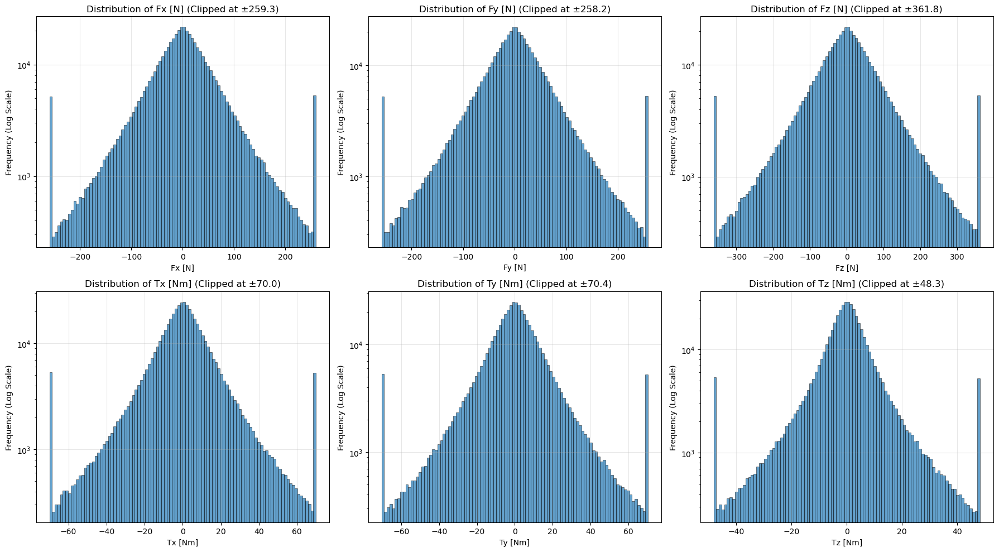


Plotting wrench magnitude distribution (Log Scale)...


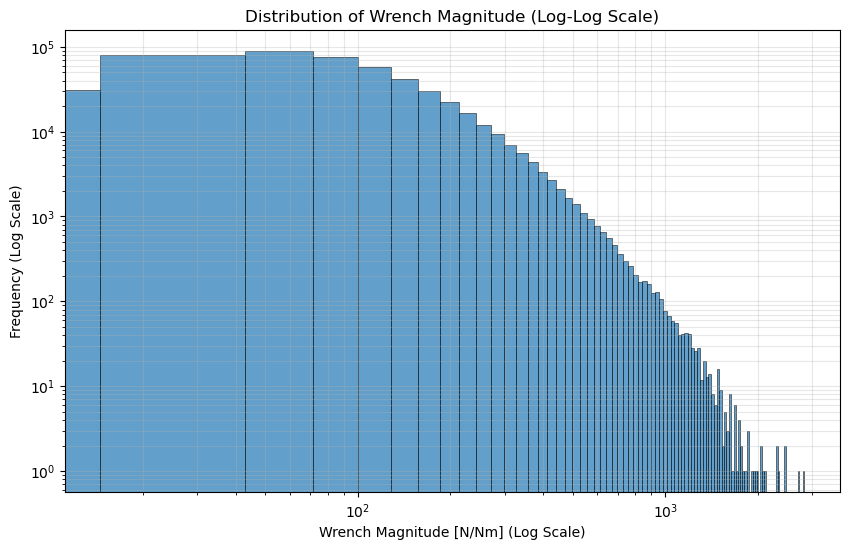


Plotting current component distributions...


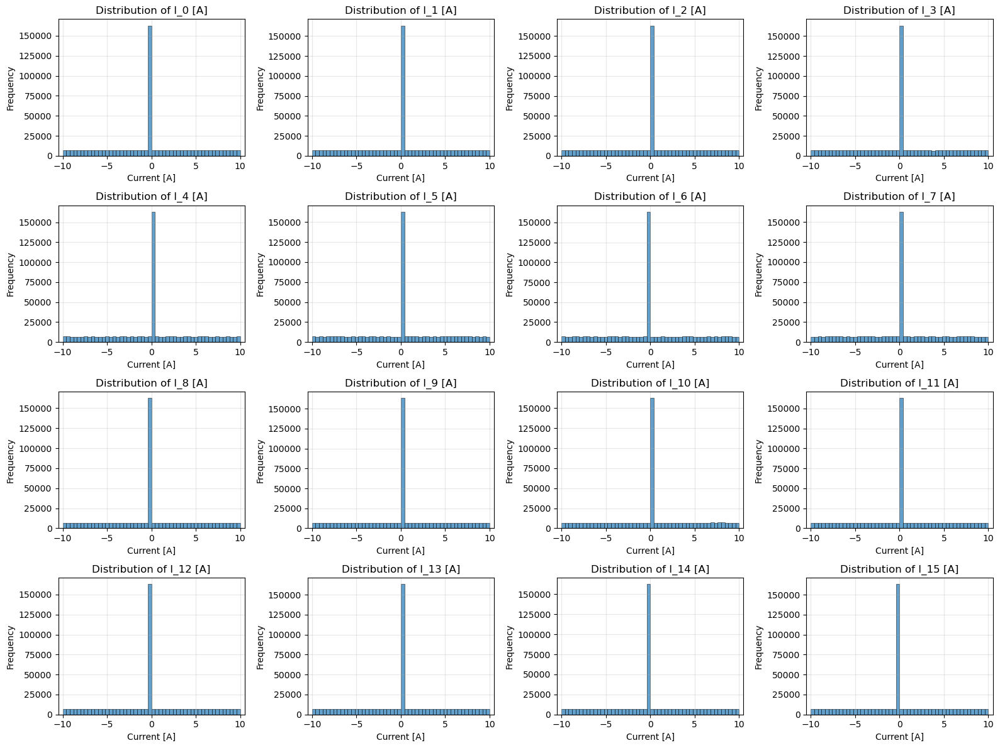


Plotting wrench component correlation heatmap...


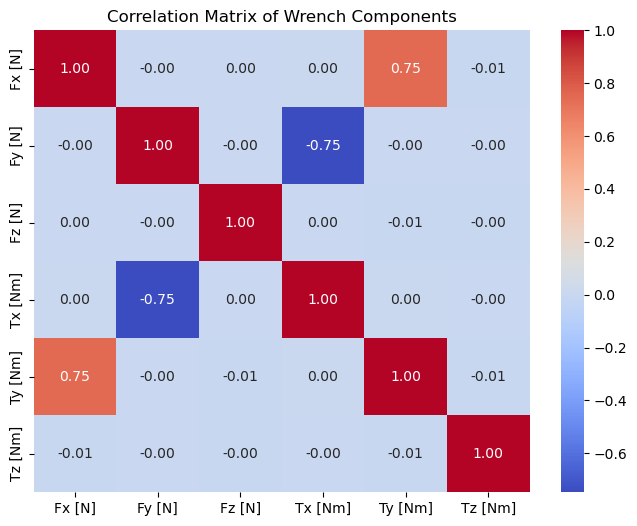


Plotting pose distributions...


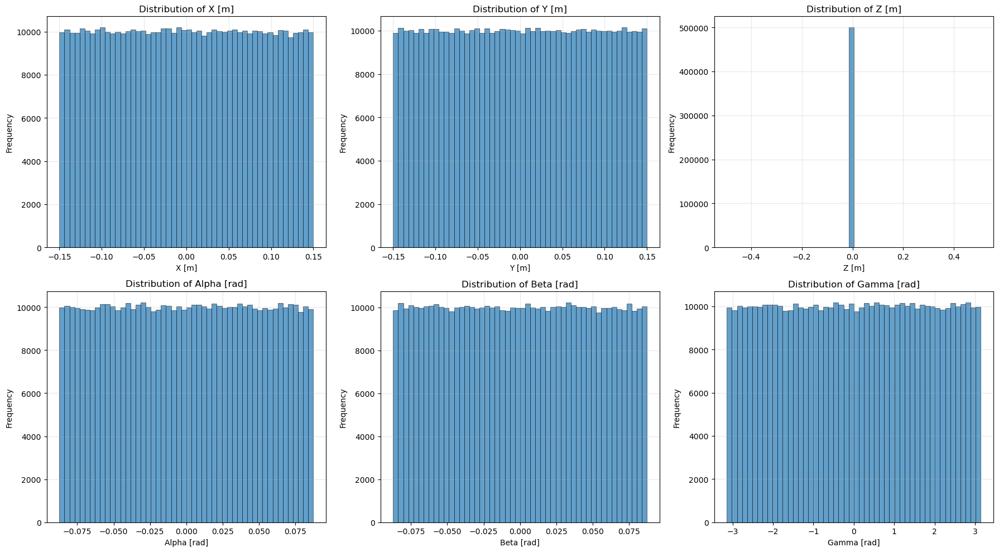


Plotting wrench magnitude vs. pose (X, Y)...


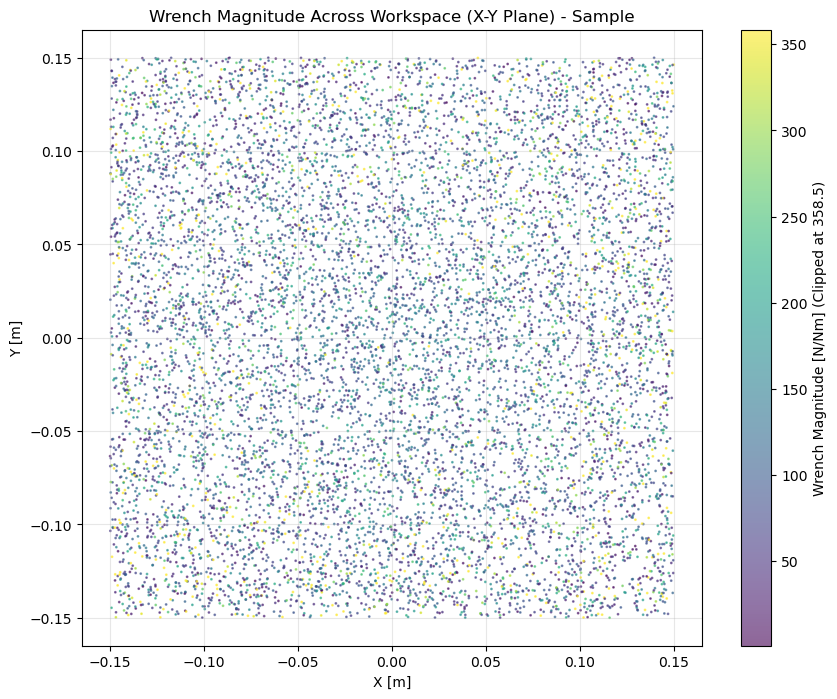


Analyzing zero-wrench cases...
Number of samples with wrench_mag < 0.1: 0
Total samples: 500000
Percentage of zero-wrench samples: 0.00%
No zero-wrench samples found in the dataset.

--- Dataset Statistics Summary ---
                 x_m            y_m           z_m          alpha  \
count  500000.000000  500000.000000  5.000000e+05  500000.000000   
mean       -0.000154       0.000034  5.000000e-03       0.000007   
std         0.086548       0.086608  2.602088e-18       0.050348   
min        -0.150000      -0.149999  5.000000e-03      -0.087266   
25%        -0.075010      -0.074911  5.000000e-03      -0.043537   
50%        -0.000306       0.000007  5.000000e-03       0.000085   
75%         0.074651       0.075078  5.000000e-03       0.043550   
max         0.150000       0.150000  5.000000e-03       0.087266   

                beta          gamma            I_0            I_1  \
count  500000.000000  500000.000000  500000.000000  500000.000000   
mean       -0.000066       0.0

In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# --- 1. Load the generated dataset ---
print("Loading dataset...")
df = pd.read_csv("gamma_dataset_hybrid.csv")
print(f"Dataset loaded. Shape: {df.shape}")
# print(df.head()) # Uncomment to see first few rows

# --- 2. Plot Wrench Component Distributions ---
print("\nPlotting wrench component distributions...")
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.ravel()

wrench_cols = [f'wrench_{i}' for i in range(6)]
wrench_names = ['Fx [N]', 'Fy [N]', 'Fz [N]', 'Tx [Nm]', 'Ty [Nm]', 'Tz [Nm]']

# Due to the large range, we'll clip for visualization
for i, (col, name) in enumerate(zip(wrench_cols, wrench_names)):
    ax = axes[i]
    # Clip to 99th percentile for better visualization
    clip_val = np.percentile(df[col], 99)
    data_to_plot = df[col].clip(-clip_val, clip_val)
    
    ax.hist(data_to_plot, bins=100, alpha=0.7, edgecolor='black', linewidth=0.5)
    ax.set_title(f'Distribution of {name} (Clipped at ±{clip_val:.1f})')
    ax.set_xlabel(name)
    ax.set_ylabel('Frequency (Log Scale)')
    ax.set_yscale('log') # Use log scale for frequency due to large numbers
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# --- 3. Plot Wrench Magnitude Distribution (Log Scale) ---
print("\nPlotting wrench magnitude distribution (Log Scale)...")
plt.figure(figsize=(10, 6))
# Use log scale for both axes to see the full distribution
counts, bin_edges = np.histogram(df['wrench_mag'], bins=100)
# Avoid log(0) by filtering out zero counts
nonzero_counts = counts[counts > 0]
nonzero_bins = bin_edges[:-1][counts > 0] # Corresponding bin centers or left edges

plt.bar(nonzero_bins, nonzero_counts, width=np.diff(bin_edges)[counts > 0], alpha=0.7, edgecolor='black', linewidth=0.5)
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Wrench Magnitude [N/Nm] (Log Scale)')
plt.ylabel('Frequency (Log Scale)')
plt.title('Distribution of Wrench Magnitude (Log-Log Scale)')
plt.grid(True, which="both", alpha=0.3)
plt.show()

# --- 4. Plot Current Component Distributions ---
print("\nPlotting current component distributions...")
fig, axes = plt.subplots(4, 4, figsize=(16, 12))
axes = axes.ravel()

current_cols = [f'I_{i}' for i in range(16)]

for i, col in enumerate(current_cols):
    ax = axes[i]
    ax.hist(df[col], bins=50, alpha=0.7, edgecolor='black', linewidth=0.5)
    ax.set_title(f'Distribution of {col} [A]')
    ax.set_xlabel('Current [A]')
    ax.set_ylabel('Frequency')
    ax.set_xlim(-10.5, 10.5)
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# --- 5. Correlation Heatmap for Wrench Components ---
print("\nPlotting wrench component correlation heatmap...")
wrench_data = df[wrench_cols]
corr_matrix = wrench_data.corr()

plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', 
            xticklabels=wrench_names, yticklabels=wrench_names)
plt.title('Correlation Matrix of Wrench Components')
plt.show()

# --- 6. Pose Distributions ---
print("\nPlotting pose distributions...")
pose_cols = ['x_m', 'y_m', 'z_m', 'alpha', 'beta', 'gamma']
pose_names = ['X [m]', 'Y [m]', 'Z [m]', 'Alpha [rad]', 'Beta [rad]', 'Gamma [rad]']

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.ravel()

for i, (col, name) in enumerate(zip(pose_cols, pose_names)):
    ax = axes[i]
    ax.hist(df[col], bins=50, alpha=0.7, edgecolor='black', linewidth=0.5)
    ax.set_title(f'Distribution of {name}')
    ax.set_xlabel(name)
    ax.set_ylabel('Frequency')
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# --- 7. Wrench Magnitude vs. Pose (X, Y) ---
print("\nPlotting wrench magnitude vs. pose (X, Y)...")
# Sample a subset for scatter plot clarity, especially given the large wrench_mags
sample_df = df.sample(n=min(10000, len(df)), random_state=42)

plt.figure(figsize=(10, 8))
# Clip wrench_mag for visualization on colorbar
clip_wrench_mag = np.percentile(sample_df['wrench_mag'], 95)
scatter = plt.scatter(sample_df['x_m'], sample_df['y_m'], 
                      c=sample_df['wrench_mag'].clip(upper=clip_wrench_mag), 
                      cmap='viridis', alpha=0.6, s=1)
plt.colorbar(scatter, label=f'Wrench Magnitude [N/Nm] (Clipped at {clip_wrench_mag:.1f})')
plt.title('Wrench Magnitude Across Workspace (X-Y Plane) - Sample')
plt.xlabel('X [m]')
plt.ylabel('Y [m]')
plt.grid(True, alpha=0.3)
plt.show()

# --- 8. Analyze Zero-Wrench Cases ---
print("\nAnalyzing zero-wrench cases...")
zero_wrench_threshold = 0.1
mask_zero_wrench = df['wrench_mag'] < zero_wrench_threshold

print(f"Number of samples with wrench_mag < {zero_wrench_threshold}: {mask_zero_wrench.sum()}")
print(f"Total samples: {len(df)}")
print(f"Percentage of zero-wrench samples: {mask_zero_wrench.sum() / len(df) * 100:.2f}%")

if mask_zero_wrench.sum() > 0:
    # Check if zero-wrench samples have zero currents
    zero_current_cols = [f'I_{i}' for i in range(16)]
    zero_wrench_data = df[mask_zero_wrench]
    current_mags_zero_wrench = np.linalg.norm(zero_wrench_data[zero_current_cols].values, axis=1)

    plt.figure(figsize=(10, 6))
    plt.hist(current_mags_zero_wrench, bins=50, alpha=0.7, edgecolor='black', linewidth=0.5)
    plt.title('Current Magnitude Distribution for Zero-Wrench Samples')
    plt.xlabel('Current Magnitude [A]')
    plt.ylabel('Frequency')
    plt.grid(True, alpha=0.3)
    plt.show()

    # Count how many zero-wrench samples have non-zero currents
    nonzero_current_in_zero_wrench = np.sum(current_mags_zero_wrench > 0.1) # Small threshold
    print(f"Zero-wrench samples with current_mag > 0.1A: {nonzero_current_in_zero_wrench}")
    print(f"Percentage of zero-wrench samples with non-zero currents: {nonzero_current_in_zero_wrench / len(current_mags_zero_wrench) * 100:.2f}%")
else:
    print("No zero-wrench samples found in the dataset.")

# --- 9. Statistics Summary ---
print("\n--- Dataset Statistics Summary ---")
print(df.describe())


In [3]:
import numpy as np
import tensorflow as tf
import pandas as pd
import time
from tqdm import tqdm

# --- Main dataset generation ---
def generate_dataset(N=100000, batch_size=1000, target_wrench_magnitude=1.0):
    print(f"Generating physics-informed dataset with N = {N} samples...")

    # Pose bounds
    x_bounds = (-0.15, 0.15)
    y_bounds = (-0.15, 0.15)
    z_val = 0.005
    angle_bounds_deg = (-5, 5)  # For alpha and beta only
    angle_bounds_rad = np.deg2rad(angle_bounds_deg)
    
    # Current bounds
    current_bounds = (-10, 10)

    # Define target wrenches (including zero and non-zero cases)
    target_wrenches = [
        [0.0, 0.0, 0.0, 0.0, 0.0, 0.0],      # Zero wrench
        [target_wrench_magnitude, 0.0, 0.0, 0.0, 0.0, 0.0],   # Fx
        [-target_wrench_magnitude, 0.0, 0.0, 0.0, 0.0, 0.0],  # -Fx
        [0.0, target_wrench_magnitude, 0.0, 0.0, 0.0, 0.0],   # Fy
        [0.0, -target_wrench_magnitude, 0.0, 0.0, 0.0, 0.0],  # -Fy
        [0.0, 0.0, target_wrench_magnitude, 0.0, 0.0, 0.0],   # Fz
        [0.0, 0.0, -target_wrench_magnitude, 0.0, 0.0, 0.0],  # -Fz
        [0.0, 0.0, 0.0, target_wrench_magnitude, 0.0, 0.0],   # Tx
        [0.0, 0.0, 0.0, -target_wrench_magnitude, 0.0, 0.0],  # -Tx
        [0.0, 0.0, 0.0, 0.0, target_wrench_magnitude, 0.0],   # Ty
        [0.0, 0.0, 0.0, 0.0, -target_wrench_magnitude, 0.0],  # -Ty
        [0.0, 0.0, 0.0, 0.0, 0.0, target_wrench_magnitude],   # Tz
        [0.0, 0.0, 0.0, 0.0, 0.0, -target_wrench_magnitude],  # -Tz
    ]
    
    # Convert to numpy array
    target_wrenches = np.array(target_wrenches, dtype=np.float32)
    num_targets = len(target_wrenches)

    all_data = []
    samples_generated = 0

    # Progress bar
    pbar = tqdm(total=N, desc="Generating samples")

    while samples_generated < N:
        batch_n = min(batch_size, N - samples_generated)

        # Random poses
        x_m = np.random.uniform(*x_bounds, size=(batch_n,))
        y_m = np.random.uniform(*y_bounds, size=(batch_n,))
        z_m = np.full(batch_n, z_val)
        
        # Alpha and Beta: bounded to ±5 degrees
        alpha = np.random.uniform(*angle_bounds_rad, size=(batch_n,))
        beta  = np.random.uniform(*angle_bounds_rad, size=(batch_n,))
        
        # Gamma: unbounded (full rotation)
        gamma = np.random.uniform(-np.pi, np.pi, size=(batch_n,))  # Full circle range
        
        pose_batch = np.stack([x_m, y_m, z_m, alpha, beta, gamma], axis=-1)

        # Compute Gamma matrix for this batch
        pose_tf = tf.constant(pose_batch, dtype=tf.float32)
        Gamma = compute_gamma(pose_tf)  # (batch, 6, 16)
        Gamma_np = Gamma.numpy()

        # For each pose in batch, generate samples for each target wrench
        for i in range(batch_n):
            pose = pose_batch[i]
            
            # Generate samples for each target wrench
            for target_wrench in target_wrenches:
                try:
                    # Solve for currents using least squares: Gamma @ I = target_wrench
                    Gamma_single = Gamma_np[i]  # (6, 16)
                    target = target_wrench      # (6,)
                    
                    # Use least squares to find optimal currents
                    I_opt, residuals, rank, s = np.linalg.lstsq(Gamma_single, target, rcond=None)
                    
                    # Clip currents to bounds
                    I_clipped = np.clip(I_opt, *current_bounds)
                    
                    # Compute actual wrench with clipped currents
                    wrench_actual = Gamma_single @ I_clipped
                    
                    # Store sample
                    row = {
                        "x_m": pose[0],
                        "y_m": pose[1],
                        "z_m": pose[2],
                        "alpha": pose[3],
                        "beta": pose[4],
                        "gamma": pose[5],
                    }
                    for k in range(16):
                        row[f"I_{k}"] = I_clipped[k]
                    for k in range(6):
                        row[f"wrench_{k}"] = wrench_actual[k]
                    
                    all_data.append(row)
                    samples_generated += 1
                    pbar.update(1)
                    
                    # Break if we've reached target
                    if samples_generated >= N:
                        break
                        
                except np.linalg.LinAlgError:
                    # Skip singular cases
                    continue
            
            # Break if we've reached target
            if samples_generated >= N:
                break

        # Break if we've reached target
        if samples_generated >= N:
            break

    pbar.close()

    # Convert to DataFrame
    df = pd.DataFrame(all_data)
    print(f"Generated {len(df)} samples")
    
    # Add wrench magnitude for analysis
    df['wrench_mag'] = np.linalg.norm(df[['wrench_0', 'wrench_1', 'wrench_2', 
                                         'wrench_3', 'wrench_4', 'wrench_5']].values, axis=1)
    
    return df

# --- Enhanced version with singularity sampling ---
def generate_dataset_enhanced(N=100000, batch_size=1000, target_wrench_magnitude=1.0, 
                             sample_around_singularities=True):
    print(f"Generating enhanced physics-informed dataset with N = {N} samples...")

    # Pose bounds
    x_bounds = (-0.15, 0.15)
    y_bounds = (-0.15, 0.15)
    z_val = 0.005
    angle_bounds_deg = (-5, 5)  # For alpha and beta only
    angle_bounds_rad = np.deg2rad(angle_bounds_deg)
    
    # Current bounds
    current_bounds = (-10, 10)

    # Define target wrenches
    target_wrenches = [
        [0.0, 0.0, 0.0, 0.0, 0.0, 0.0],      # Zero wrench
        [target_wrench_magnitude, 0.0, 0.0, 0.0, 0.0, 0.0],   # Fx
        [-target_wrench_magnitude, 0.0, 0.0, 0.0, 0.0, 0.0],  # -Fx
        [0.0, target_wrench_magnitude, 0.0, 0.0, 0.0, 0.0],   # Fy
        [0.0, -target_wrench_magnitude, 0.0, 0.0, 0.0, 0.0],  # -Fy
        [0.0, 0.0, target_wrench_magnitude, 0.0, 0.0, 0.0],   # Fz
        [0.0, 0.0, -target_wrench_magnitude, 0.0, 0.0, 0.0],  # -Fz
        [0.0, 0.0, 0.0, target_wrench_magnitude, 0.0, 0.0],   # Tx
        [0.0, 0.0, 0.0, -target_wrench_magnitude, 0.0, 0.0],  # -Tx
        [0.0, 0.0, 0.0, 0.0, target_wrench_magnitude, 0.0],   # Ty
        [0.0, 0.0, 0.0, 0.0, -target_wrench_magnitude, 0.0],  # -Ty
        [0.0, 0.0, 0.0, 0.0, 0.0, target_wrench_magnitude],   # Tz
        [0.0, 0.0, 0.0, 0.0, 0.0, -target_wrench_magnitude],  # -Tz
    ]
    
    target_wrenches = np.array(target_wrenches, dtype=np.float32)
    num_targets = len(target_wrenches)

    all_data = []
    samples_generated = 0

    # Progress bar
    pbar = tqdm(total=N, desc="Generating samples")

    while samples_generated < N:
        batch_n = min(batch_size, N - samples_generated)

        # Random poses
        x_m = np.random.uniform(*x_bounds, size=(batch_n,))
        y_m = np.random.uniform(*y_bounds, size=(batch_n,))
        z_m = np.full(batch_n, z_val)
        
        # Alpha and Beta: bounded to ±5 degrees
        alpha = np.random.uniform(*angle_bounds_rad, size=(batch_n,))
        beta  = np.random.uniform(*angle_bounds_rad, size=(batch_n,))
        
        # Gamma: unbounded (full rotation)
        gamma = np.random.uniform(-np.pi, np.pi, size=(batch_n,))  # Full circle range
        
        pose_batch = np.stack([x_m, y_m, z_m, alpha, beta, gamma], axis=-1)

        # Compute Gamma matrix for this batch
        pose_tf = tf.constant(pose_batch, dtype=tf.float32)
        Gamma = compute_gamma(pose_tf)  # (batch, 6, 16)
        Gamma_np = Gamma.numpy()

        # Identify low-capability poses (singularities)
        if sample_around_singularities:
            # Compute maximum possible wrench magnitude for each pose
            max_currents = np.full((batch_n, 16), 10.0)  # Max current
            max_wrenches = np.array([Gamma_np[i] @ max_currents[i] for i in range(batch_n)])
            max_wrench_mags = np.linalg.norm(max_wrenches, axis=1)
            
            # Find poses with low capability
            low_capability_mask = max_wrench_mags < 0.5  # Threshold for "low capability"
            low_capability_indices = np.where(low_capability_mask)[0]
        else:
            low_capability_indices = []

        # For each pose in batch, generate samples for each target wrench
        for i in range(batch_n):
            pose = pose_batch[i]
            
            # Generate samples for each target wrench
            for target_wrench in target_wrenches:
                try:
                    Gamma_single = Gamma_np[i]  # (6, 16)
                    target = target_wrench      # (6,)
                    
                    # Solve for currents using least squares
                    I_opt, residuals, rank, s = np.linalg.lstsq(Gamma_single, target, rcond=None)
                    
                    # Clip currents to bounds
                    I_clipped = np.clip(I_opt, *current_bounds)
                    
                    # Compute actual wrench with clipped currents
                    wrench_actual = Gamma_single @ I_clipped
                    
                    # Store sample
                    row = {
                        "x_m": pose[0],
                        "y_m": pose[1],
                        "z_m": pose[2],
                        "alpha": pose[3],
                        "beta": pose[4],
                        "gamma": pose[5],
                    }
                    for k in range(16):
                        row[f"I_{k}"] = I_clipped[k]
                    for k in range(6):
                        row[f"wrench_{k}"] = wrench_actual[k]
                    
                    all_data.append(row)
                    samples_generated += 1
                    pbar.update(1)
                    
                    if samples_generated >= N:
                        break
                        
                except np.linalg.LinAlgError:
                    continue
            
            # Extra samples for low-capability poses
            if sample_around_singularities and i in low_capability_indices:
                # Generate additional samples with random currents to explore behavior
                for _ in range(3):  # Generate 3 extra samples per low-capability pose
                    try:
                        # Random currents
                        I_random = np.random.uniform(*current_bounds, size=16)
                        
                        # Compute actual wrench
                        wrench_actual = Gamma_np[i] @ I_random
                        
                        # Store sample
                        row = {
                            "x_m": pose[0],
                            "y_m": pose[1],
                            "z_m": pose[2],
                            "alpha": pose[3],
                            "beta": pose[4],
                            "gamma": pose[5],
                        }
                        for k in range(16):
                            row[f"I_{k}"] = I_random[k]
                        for k in range(6):
                            row[f"wrench_{k}"] = wrench_actual[k]
                        
                        all_data.append(row)
                        samples_generated += 1
                        pbar.update(1)
                        
                        if samples_generated >= N:
                            break
                    except:
                        continue
            
            if samples_generated >= N:
                break

        if samples_generated >= N:
            break

    pbar.close()

    # Convert to DataFrame
    df = pd.DataFrame(all_data)
    print(f"Generated {len(df)} samples")
    
    # Add wrench magnitude for analysis
    df['wrench_mag'] = np.linalg.norm(df[['wrench_0', 'wrench_1', 'wrench_2', 
                                         'wrench_3', 'wrench_4', 'wrench_5']].values, axis=1)
    
    return df

# --- Run ---
if __name__ == "__main__":
    N = 500000
    start_time = time.time()
    
    # Generate enhanced dataset
    df = generate_dataset_enhanced(N=N, target_wrench_magnitude=1.0, sample_around_singularities=True)
    
    print(f"Dataset generation took {time.time() - start_time:.2f} seconds")
    print(f"Dataset shape: {df.shape}")

    # Save to file
    df.to_csv("gamma_dataset_physics_informed.csv", index=False)
    print("Dataset saved to gamma_dataset_physics_informed.csv")
    
    # Print some statistics
    print(f"Zero wrench samples: {len(df[df['wrench_mag'] < 0.1])}")
    print(f"High wrench samples (>1N): {len(df[df['wrench_mag'] > 1.0])}")
    print(f"Mean wrench magnitude: {df['wrench_mag'].mean():.3f}")

Generating enhanced physics-informed dataset with N = 500000 samples...


Generating samples: 100%|██████████| 500000/500000 [00:14<00:00, 34775.65it/s]


Generated 500000 samples
Dataset generation took 16.66 seconds
Dataset shape: (500000, 29)
Dataset saved to gamma_dataset_physics_informed.csv
Zero wrench samples: 38458
High wrench samples (>1N): 307114
Mean wrench magnitude: 5.094


Loading dataset...
Dataset loaded. Shape: (500000, 29)
        x_m       y_m    z_m     alpha      beta     gamma       I_0  \
0  0.023558  0.031866  0.005  0.035736 -0.049959  1.030199  0.000000   
1  0.023558  0.031866  0.005  0.035736 -0.049959  1.030199  0.054717   
2  0.023558  0.031866  0.005  0.035736 -0.049959  1.030199 -0.054717   
3  0.023558  0.031866  0.005  0.035736 -0.049959  1.030199 -0.033689   
4  0.023558  0.031866  0.005  0.035736 -0.049959  1.030199  0.033689   

        I_1       I_2       I_3  ...      I_13      I_14      I_15  \
0  0.000000  0.000000  0.000000  ...  0.000000  0.000000  0.000000   
1 -0.095709 -0.015162 -0.015874  ... -0.009512  0.029143  0.147203   
2  0.095709  0.015162  0.015874  ...  0.009512 -0.029143 -0.147203   
3 -0.007426 -0.027500  0.016724  ... -0.121211  0.058669 -0.029406   
4  0.007426  0.027500 -0.016724  ...  0.121211 -0.058669  0.029406   

       wrench_0      wrench_1      wrench_2      wrench_3      wrench_4  \
0  0.000000e+00 

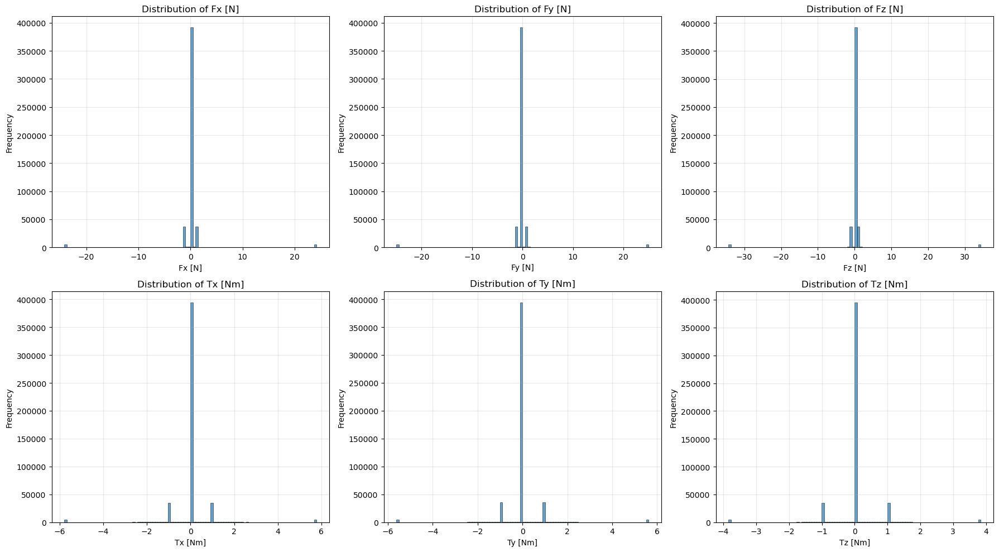


Plotting wrench magnitude distribution...


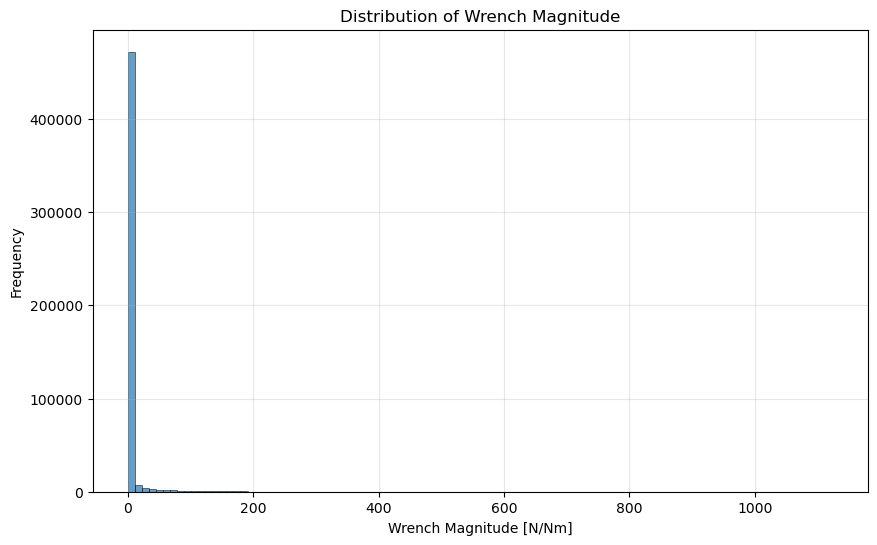


Plotting current component distributions...


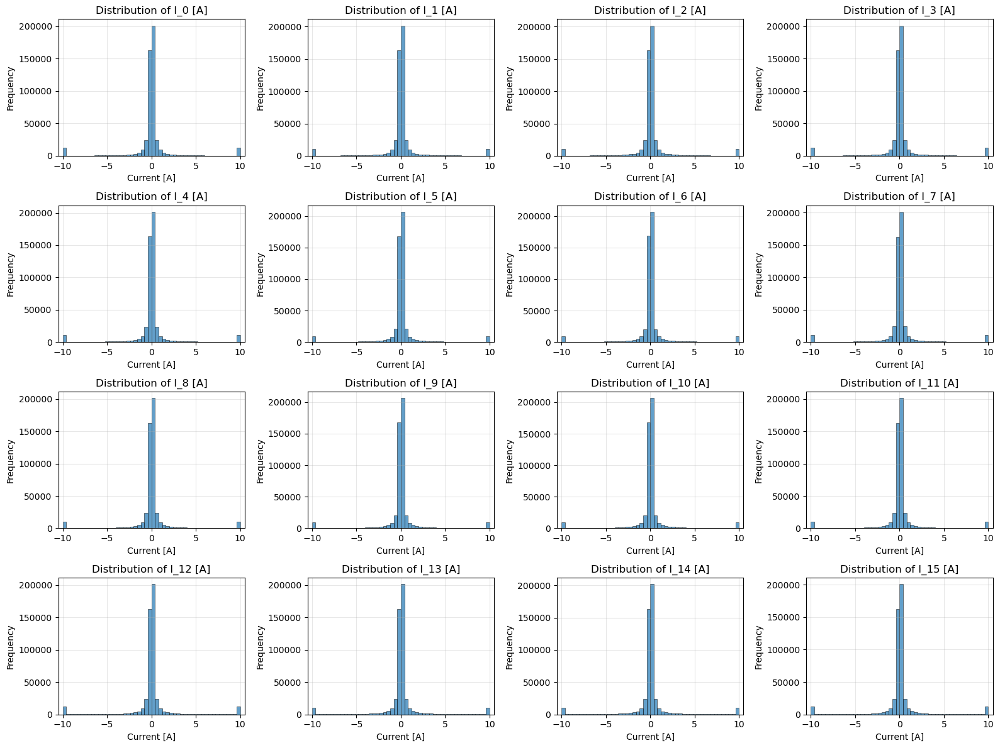


Plotting wrench component correlation heatmap...


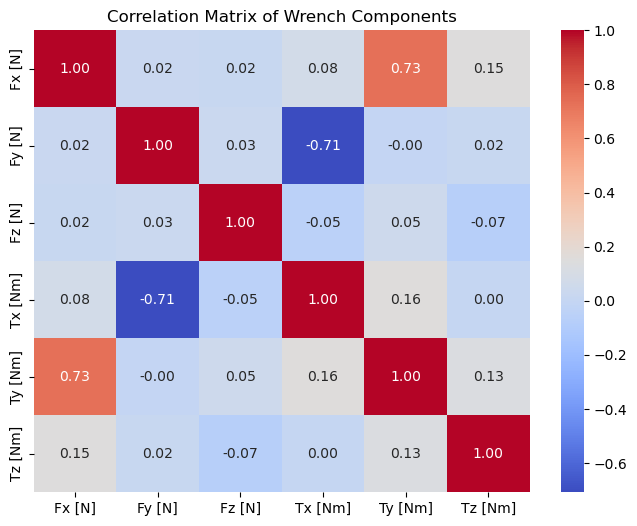


Plotting pose distributions...


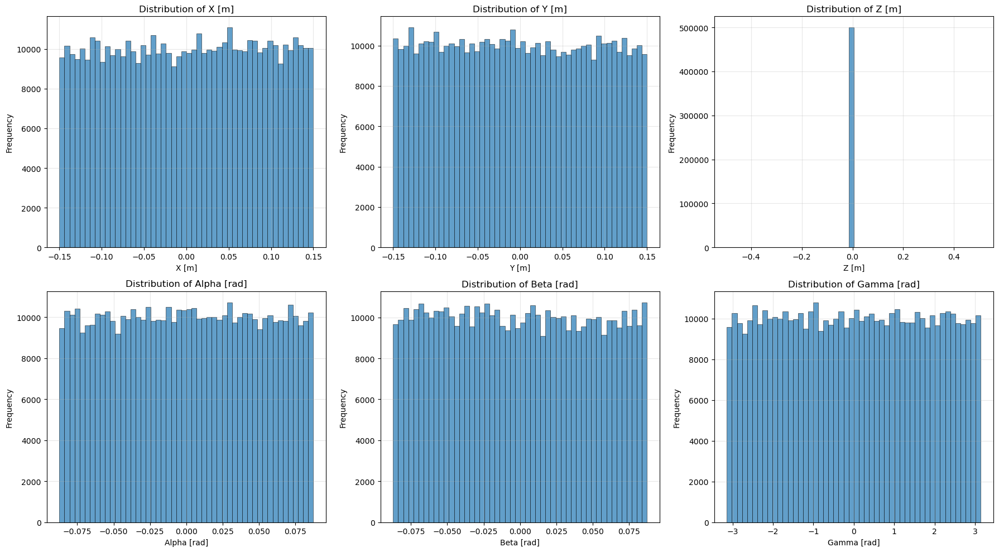


Plotting wrench magnitude vs. pose (X, Y)...


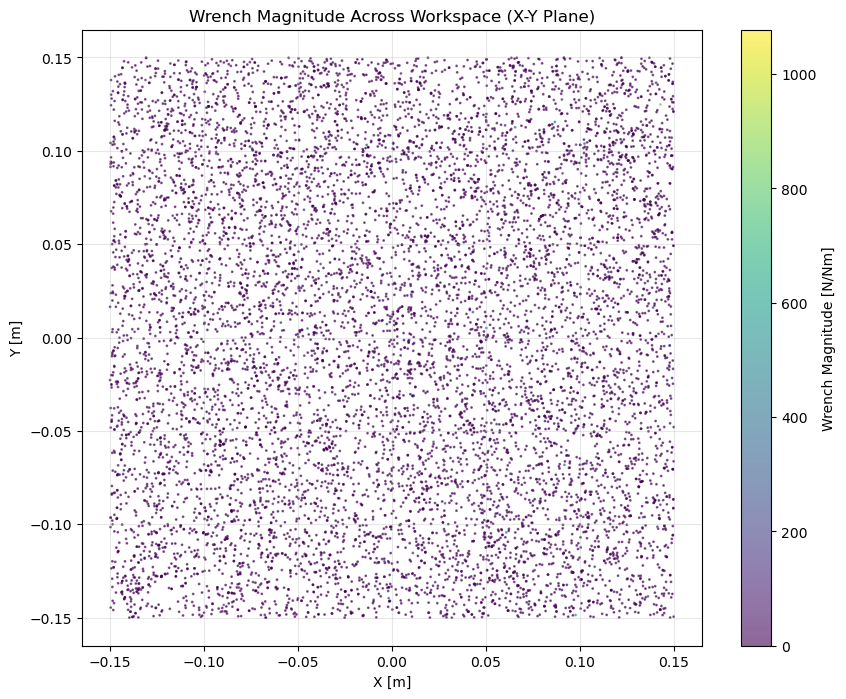


Analyzing zero-wrench cases...
Number of samples with wrench_mag < 0.1: 38458
Total samples: 500000
Percentage of zero-wrench samples: 7.69%


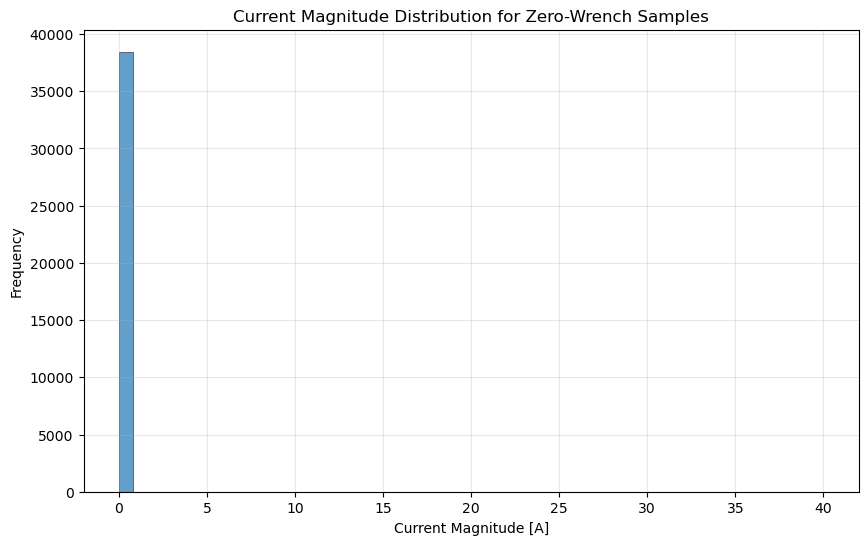

Zero-wrench samples with current_mag > 0.1A: 2
Percentage of zero-wrench samples with non-zero currents: 0.01%

--- Dataset Statistics Summary ---
                 x_m            y_m           z_m          alpha  \
count  500000.000000  500000.000000  5.000000e+05  500000.000000   
mean        0.000883      -0.000821  5.000000e-03       0.000126   
std         0.086546       0.086652  2.602088e-18       0.050219   
min        -0.149991      -0.149999  5.000000e-03      -0.087266   
25%        -0.074016      -0.075923  5.000000e-03      -0.043066   
50%         0.001925      -0.001745  5.000000e-03       0.000201   
75%         0.075581       0.074569  5.000000e-03       0.043283   
max         0.149993       0.150000  5.000000e-03       0.087265   

                beta          gamma            I_0            I_1  \
count  500000.000000  500000.000000  500000.000000  500000.000000   
mean       -0.000586       0.000285       0.000001       0.000010   
std         0.050471       1.8107

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# --- 1. Load the generated dataset ---
print("Loading dataset...")
df = pd.read_csv("gamma_dataset_physics_informed.csv")
print(f"Dataset loaded. Shape: {df.shape}")
print(df.head())

# --- 2. Plot Wrench Component Distributions ---
print("\nPlotting wrench component distributions...")
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.ravel()

wrench_cols = [f'wrench_{i}' for i in range(6)]
wrench_names = ['Fx [N]', 'Fy [N]', 'Fz [N]', 'Tx [Nm]', 'Ty [Nm]', 'Tz [Nm]']

for i, (col, name) in enumerate(zip(wrench_cols, wrench_names)):
    ax = axes[i]
    # Use a narrower range for better visualization of the core distribution
    # Adjust these limits if your data has wider ranges
    lower_percentile = np.percentile(df[col], 1)
    upper_percentile = np.percentile(df[col], 99)
    data_to_plot = df[col].clip(lower_percentile, upper_percentile)
    
    ax.hist(data_to_plot, bins=100, alpha=0.7, edgecolor='black', linewidth=0.5)
    ax.set_title(f'Distribution of {name}')
    ax.set_xlabel(name)
    ax.set_ylabel('Frequency')
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# --- 3. Plot Wrench Magnitude Distribution ---
print("\nPlotting wrench magnitude distribution...")
plt.figure(figsize=(10, 6))
plt.hist(df['wrench_mag'], bins=100, alpha=0.7, edgecolor='black', linewidth=0.5)
plt.title('Distribution of Wrench Magnitude')
plt.xlabel('Wrench Magnitude [N/Nm]')
plt.ylabel('Frequency')
plt.grid(True, alpha=0.3)
plt.show()

# --- 4. Plot Current Component Distributions ---
print("\nPlotting current component distributions...")
fig, axes = plt.subplots(4, 4, figsize=(16, 12))
axes = axes.ravel()

current_cols = [f'I_{i}' for i in range(16)]

for i, col in enumerate(current_cols):
    ax = axes[i]
    ax.hist(df[col], bins=50, alpha=0.7, edgecolor='black', linewidth=0.5)
    ax.set_title(f'Distribution of {col} [A]')
    ax.set_xlabel('Current [A]')
    ax.set_ylabel('Frequency')
    ax.set_xlim(-10.5, 10.5) # Should be within bounds
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# --- 5. Correlation Heatmap for Wrench Components ---
print("\nPlotting wrench component correlation heatmap...")
wrench_data = df[wrench_cols]
corr_matrix = wrench_data.corr()

plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', 
            xticklabels=wrench_names, yticklabels=wrench_names)
plt.title('Correlation Matrix of Wrench Components')
plt.show()

# --- 6. Pose Distributions ---
print("\nPlotting pose distributions...")
pose_cols = ['x_m', 'y_m', 'z_m', 'alpha', 'beta', 'gamma']
pose_names = ['X [m]', 'Y [m]', 'Z [m]', 'Alpha [rad]', 'Beta [rad]', 'Gamma [rad]']

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.ravel()

for i, (col, name) in enumerate(zip(pose_cols, pose_names)):
    ax = axes[i]
    ax.hist(df[col], bins=50, alpha=0.7, edgecolor='black', linewidth=0.5)
    ax.set_title(f'Distribution of {name}')
    ax.set_xlabel(name)
    ax.set_ylabel('Frequency')
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# --- 7. Wrench Magnitude vs. Pose (X, Y) ---
print("\nPlotting wrench magnitude vs. pose (X, Y)...")
# Sample a subset for scatter plot clarity
sample_df = df.sample(n=min(10000, len(df)), random_state=42)

plt.figure(figsize=(10, 8))
scatter = plt.scatter(sample_df['x_m'], sample_df['y_m'], c=sample_df['wrench_mag'], 
                      cmap='viridis', alpha=0.6, s=1)
plt.colorbar(scatter, label='Wrench Magnitude [N/Nm]')
plt.title('Wrench Magnitude Across Workspace (X-Y Plane)')
plt.xlabel('X [m]')
plt.ylabel('Y [m]')
plt.grid(True, alpha=0.3)
plt.show()

# --- 8. Analyze Zero-Wrench Cases ---
print("\nAnalyzing zero-wrench cases...")
zero_wrench_threshold = 0.1
mask_zero_wrench = df['wrench_mag'] < zero_wrench_threshold

print(f"Number of samples with wrench_mag < {zero_wrench_threshold}: {mask_zero_wrench.sum()}")
print(f"Total samples: {len(df)}")
print(f"Percentage of zero-wrench samples: {mask_zero_wrench.sum() / len(df) * 100:.2f}%")

# Check if zero-wrench samples have zero currents
zero_current_cols = [f'I_{i}' for i in range(16)]
zero_wrench_data = df[mask_zero_wrench]
current_mags_zero_wrench = np.linalg.norm(zero_wrench_data[zero_current_cols].values, axis=1)

plt.figure(figsize=(10, 6))
plt.hist(current_mags_zero_wrench, bins=50, alpha=0.7, edgecolor='black', linewidth=0.5)
plt.title('Current Magnitude Distribution for Zero-Wrench Samples')
plt.xlabel('Current Magnitude [A]')
plt.ylabel('Frequency')
plt.grid(True, alpha=0.3)
plt.show()

# Count how many zero-wrench samples have non-zero currents
nonzero_current_in_zero_wrench = np.sum(current_mags_zero_wrench > 0.1) # Small threshold
print(f"Zero-wrench samples with current_mag > 0.1A: {nonzero_current_in_zero_wrench}")
print(f"Percentage of zero-wrench samples with non-zero currents: {nonzero_current_in_zero_wrench / len(current_mags_zero_wrench) * 100:.2f}%")

# --- 9. Statistics Summary ---
print("\n--- Dataset Statistics Summary ---")
print(df.describe())


Dataset shape: (500000, 28)


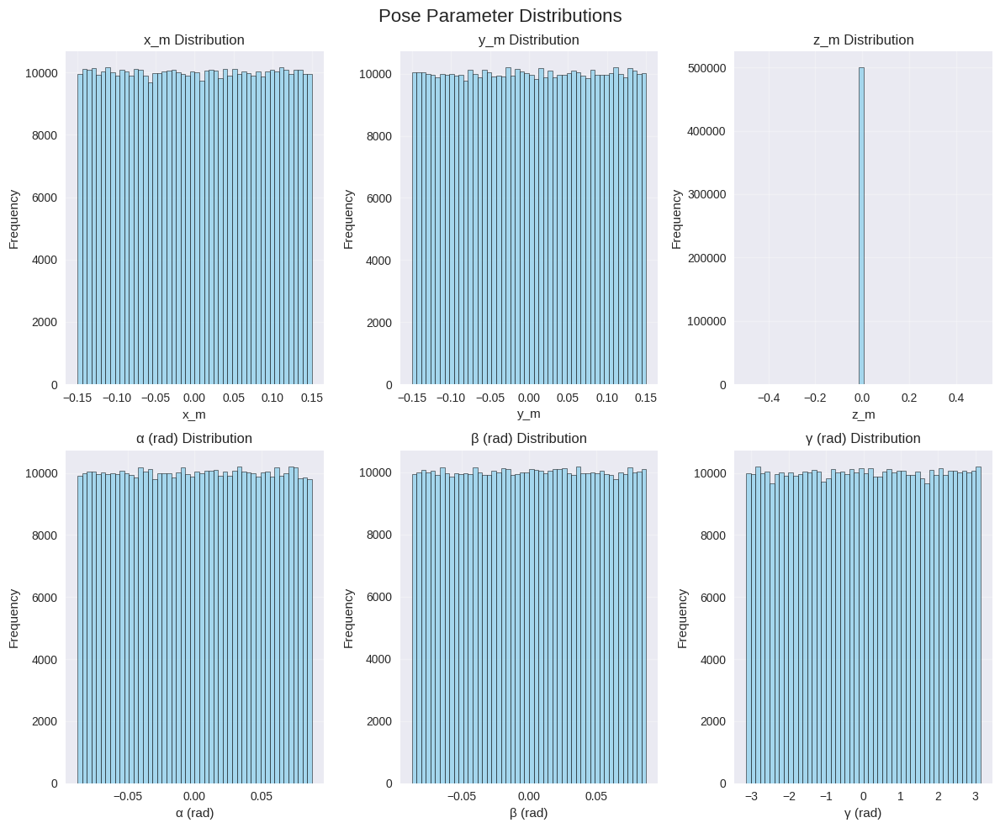

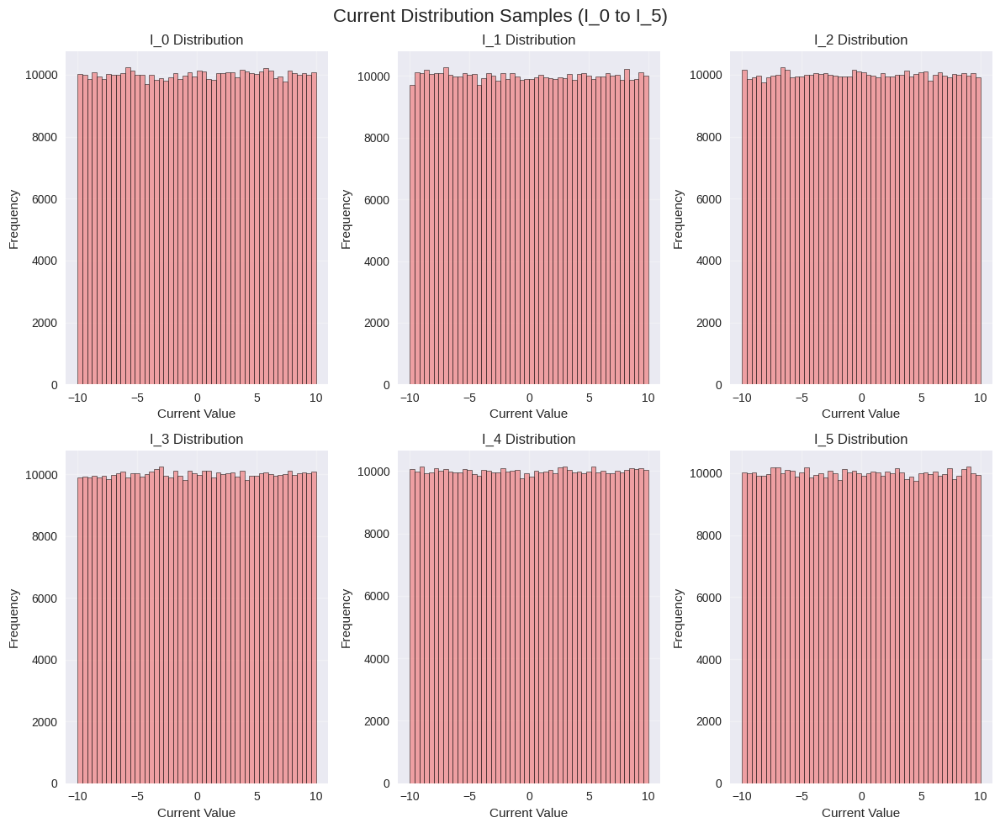

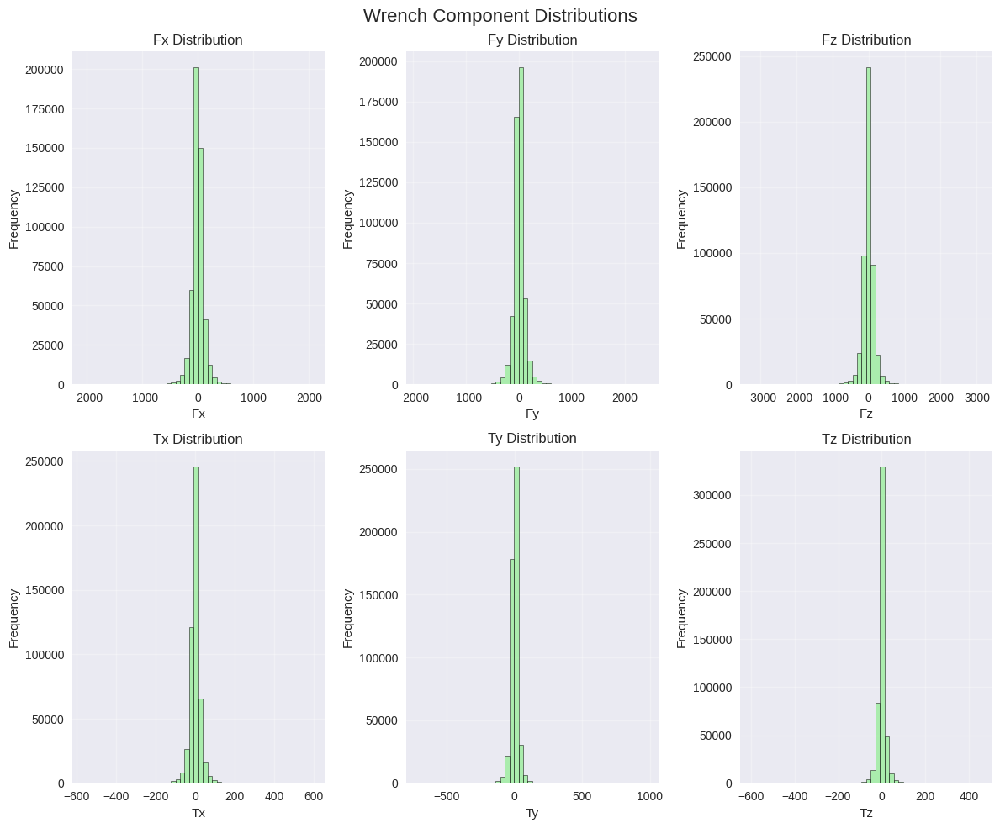

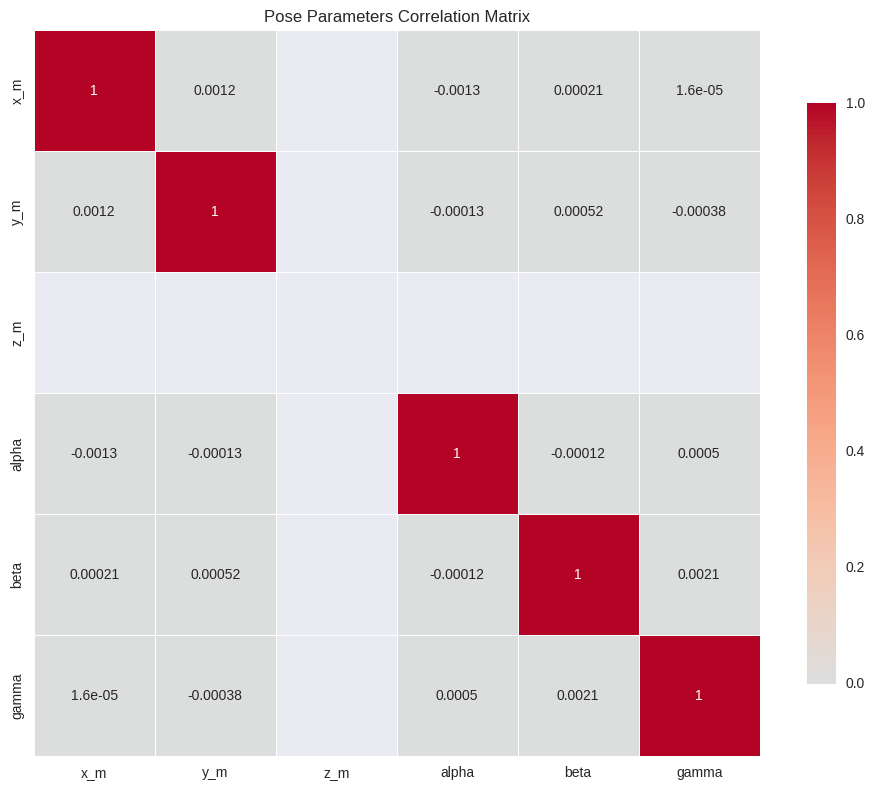

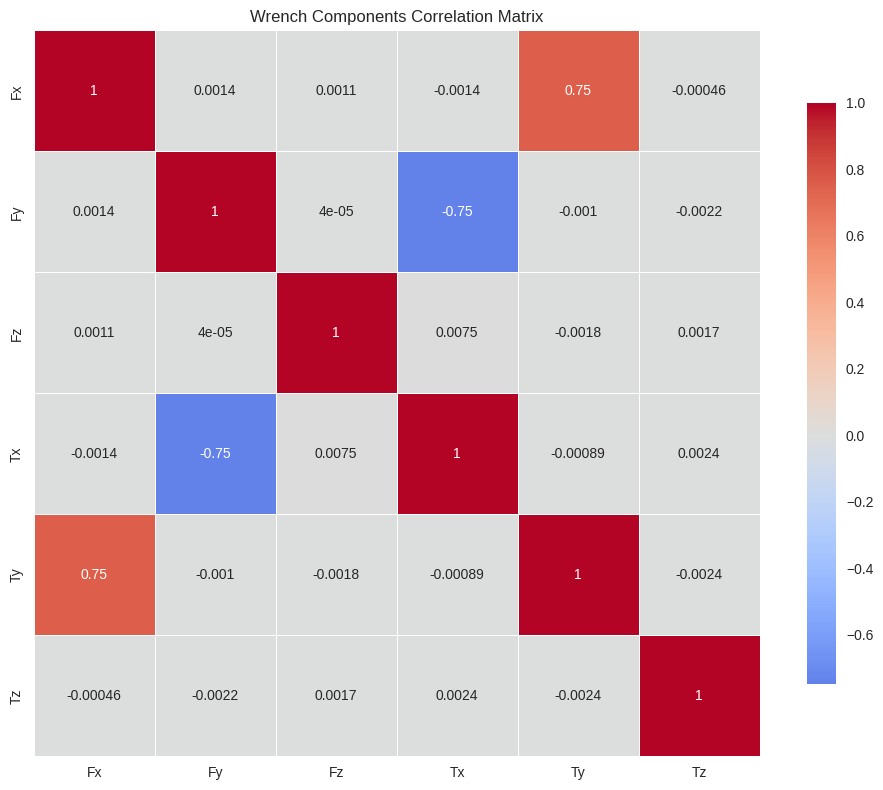

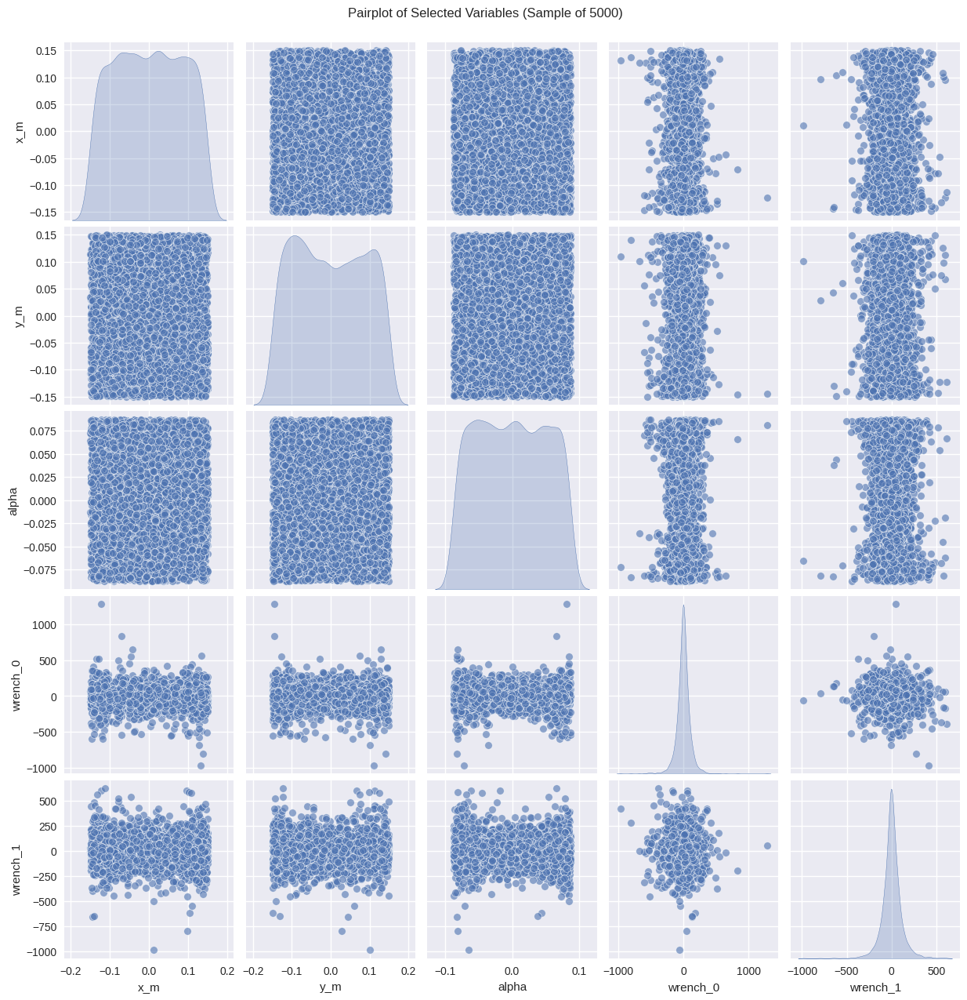


=== STATISTICAL SUMMARY ===

Pose Parameters:
                x_m            y_m           z_m          alpha  \
count  5.000000e+05  500000.000000  5.000000e+05  500000.000000   
mean  -1.274135e-05       0.000122  5.000000e-03      -0.000005   
std    8.669228e-02       0.086644  2.602088e-18       0.050347   
min   -1.500000e-01      -0.149999  5.000000e-03      -0.087266   
25%   -7.516957e-02      -0.074786  5.000000e-03      -0.043583   
50%    1.218071e-07       0.000074  5.000000e-03       0.000078   
75%    7.515946e-02       0.075308  5.000000e-03       0.043536   
max    1.500000e-01       0.149999  5.000000e-03       0.087266   

                beta          gamma  
count  500000.000000  500000.000000  
mean        0.000037       0.003828  
std         0.050366       1.814569  
min        -0.087266      -3.141587  
25%        -0.043529      -1.565247  
50%         0.000106       0.003184  
75%         0.043595       1.574354  
max         0.087266       3.141589  

Curren

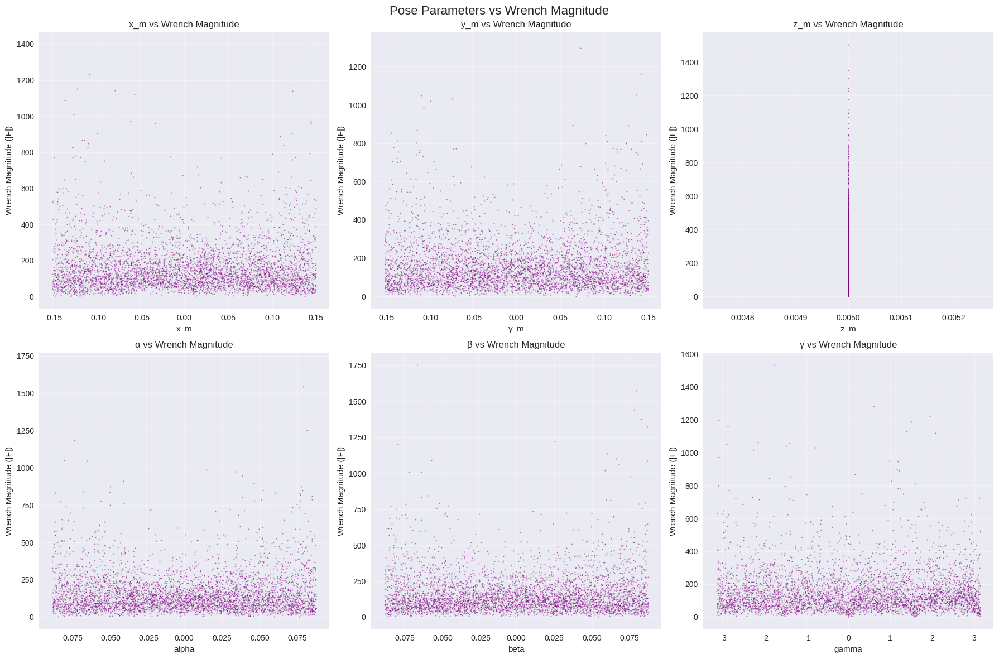

In [8]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Load the dataset
df = pd.read_csv("gamma_dataset.csv")
print(f"Dataset shape: {df.shape}")

# Set up plotting style
plt.style.use('seaborn-v0_8')
fig_size = (12, 10)

# 1. Pose Distribution Plots
fig, axes = plt.subplots(2, 3, figsize=fig_size)
fig.suptitle('Pose Parameter Distributions', fontsize=16)

pose_params = ['x_m', 'y_m', 'z_m', 'alpha', 'beta', 'gamma']
pose_labels = ['x_m', 'y_m', 'z_m', 'α (rad)', 'β (rad)', 'γ (rad)']

for i, (param, label) in enumerate(zip(pose_params, pose_labels)):
    row, col = i // 3, i % 3
    axes[row, col].hist(df[param], bins=50, alpha=0.7, color='skyblue', edgecolor='black', linewidth=0.5)
    axes[row, col].set_title(f'{label} Distribution')
    axes[row, col].set_xlabel(label)
    axes[row, col].set_ylabel('Frequency')
    axes[row, col].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('pose_distributions.png', dpi=300, bbox_inches='tight')
plt.show()

# 2. Current Distribution Plots (sample 6 currents for visualization)
fig, axes = plt.subplots(2, 3, figsize=fig_size)
fig.suptitle('Current Distribution Samples (I_0 to I_5)', fontsize=16)

current_params = [f'I_{i}' for i in range(6)]
for i, param in enumerate(current_params):
    row, col = i // 3, i % 3
    axes[row, col].hist(df[param], bins=50, alpha=0.7, color='lightcoral', edgecolor='black', linewidth=0.5)
    axes[row, col].set_title(f'{param} Distribution')
    axes[row, col].set_xlabel('Current Value')
    axes[row, col].set_ylabel('Frequency')
    axes[row, col].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('current_distributions.png', dpi=300, bbox_inches='tight')
plt.show()

# 3. Wrench Distribution Plots
fig, axes = plt.subplots(2, 3, figsize=fig_size)
fig.suptitle('Wrench Component Distributions', fontsize=16)

wrench_params = [f'wrench_{i}' for i in range(6)]
wrench_labels = ['Fx', 'Fy', 'Fz', 'Tx', 'Ty', 'Tz']

for i, (param, label) in enumerate(zip(wrench_params, wrench_labels)):
    row, col = i // 3, i % 3
    axes[row, col].hist(df[param], bins=50, alpha=0.7, color='lightgreen', edgecolor='black', linewidth=0.5)
    axes[row, col].set_title(f'{label} Distribution')
    axes[row, col].set_xlabel(label)
    axes[row, col].set_ylabel('Frequency')
    axes[row, col].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('wrench_distributions.png', dpi=300, bbox_inches='tight')
plt.show()

# 4. Correlation Heatmap for Pose Parameters
pose_df = df[['x_m', 'y_m', 'z_m', 'alpha', 'beta', 'gamma']]
plt.figure(figsize=(10, 8))
correlation_matrix = pose_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, 
            square=True, linewidths=0.5, cbar_kws={"shrink": .8})
plt.title('Pose Parameters Correlation Matrix')
plt.tight_layout()
plt.savefig('pose_correlation_heatmap.png', dpi=300, bbox_inches='tight')
plt.show()

# 5. Correlation Heatmap for Wrench Components
wrench_df = df[['wrench_0', 'wrench_1', 'wrench_2', 'wrench_3', 'wrench_4', 'wrench_5']]
wrench_labels_short = ['Fx', 'Fy', 'Fz', 'Tx', 'Ty', 'Tz']
wrench_df.columns = wrench_labels_short

plt.figure(figsize=(10, 8))
correlation_matrix = wrench_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, 
            square=True, linewidths=0.5, cbar_kws={"shrink": .8})
plt.title('Wrench Components Correlation Matrix')
plt.tight_layout()
plt.savefig('wrench_correlation_heatmap.png', dpi=300, bbox_inches='tight')
plt.show()

# 6. Pairplot for a subset of variables (first 3 pose params + first 2 wrench components)
subset_df = df[['x_m', 'y_m', 'alpha', 'wrench_0', 'wrench_1']].sample(n=5000, random_state=42)
sns.pairplot(subset_df, diag_kind='kde', plot_kws={'alpha': 0.6})
plt.suptitle('Pairplot of Selected Variables (Sample of 5000)', y=1.02)
plt.savefig('pairplot_subset.png', dpi=300, bbox_inches='tight')
plt.show()

# 7. Statistical Summary
print("\n=== STATISTICAL SUMMARY ===")
print("\nPose Parameters:")
print(df[['x_m', 'y_m', 'z_m', 'alpha', 'beta', 'gamma']].describe())

print("\nCurrent Parameters (sample 5):")
current_cols = [f'I_{i}' for i in range(5)]
print(df[current_cols].describe())

print("\nWrench Components:")
print(df[['wrench_0', 'wrench_1', 'wrench_2', 'wrench_3', 'wrench_4', 'wrench_5']].describe())

# 8. Range and Spread Analysis
print("\n=== RANGE ANALYSIS ===")
print("Pose Ranges:")
for param in ['x_m', 'y_m', 'z_m', 'alpha', 'beta', 'gamma']:
    print(f"  {param}: [{df[param].min():.4f}, {df[param].max():.4f}]")

print("\nCurrent Ranges (sample 5):")
for i in range(5):
    param = f'I_{i}'
    print(f"  {param}: [{df[param].min():.2f}, {df[param].max():.2f}]")

print("\nWrench Ranges:")
for i in range(6):
    param = f'wrench_{i}'
    print(f"  {param}: [{df[param].min():.2f}, {df[param].max():.2f}]")

# 9. 2D Scatter Plots for Pose vs Wrench Relationships
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
fig.suptitle('Pose Parameters vs Wrench Magnitude', fontsize=16)

wrench_magnitude = np.sqrt(df['wrench_0']**2 + df['wrench_1']**2 + df['wrench_2']**2)
wrench_labels_short = ['x_m', 'y_m', 'z_m', 'α', 'β', 'γ']

for i, param in enumerate(['x_m', 'y_m', 'z_m', 'alpha', 'beta', 'gamma']):
    row, col = i // 3, i % 3
    # Sample for better visualization
    sample_idx = np.random.choice(len(df), size=5000, replace=False)
    axes[row, col].scatter(df.iloc[sample_idx][param], wrench_magnitude.iloc[sample_idx], 
                          alpha=0.5, s=1, color='purple')
    axes[row, col].set_xlabel(param)
    axes[row, col].set_ylabel('Wrench Magnitude (|F|)')
    axes[row, col].set_title(f'{wrench_labels_short[i]} vs Wrench Magnitude')
    axes[row, col].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('pose_vs_wrench_magnitude.png', dpi=300, bbox_inches='tight')
plt.show()

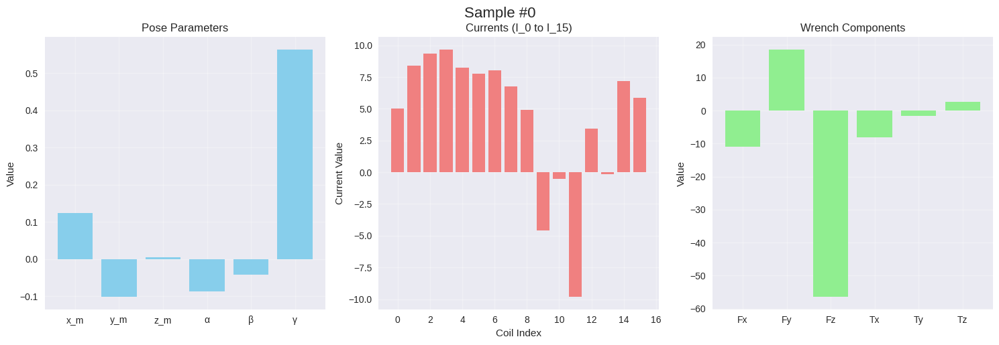

=== SAMPLE DATA ===
Pose: x=0.1236, y=-0.1019, z=0.0050
      α=-0.0870, β=-0.0424, γ=0.5638
Currents: [5.00, 8.38, 9.35, 9.68, 8.22, ...]
Wrench:   [-10.95, 18.53, -56.49, -8.13, -1.61, 2.64]


In [9]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load the dataset
df = pd.read_csv("gamma_dataset.csv")

# Pick a random sample
sample_idx = 0  # or np.random.randint(len(df))
sample = df.iloc[sample_idx]

# Extract data
pose = [sample['x_m'], sample['y_m'], sample['z_m'], 
        sample['alpha'], sample['beta'], sample['gamma']]
currents = [sample[f'I_{i}'] for i in range(16)]
wrench = [sample[f'wrench_{i}'] for i in range(6)]

# Create minimal plots
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# 1. Pose plot
pose_labels = ['x_m', 'y_m', 'z_m', 'α', 'β', 'γ']
axes[0].bar(pose_labels, pose, color='skyblue')
axes[0].set_title('Pose Parameters')
axes[0].set_ylabel('Value')
axes[0].grid(True, alpha=0.3)

# 2. Currents plot
axes[1].bar(range(16), currents, color='lightcoral')
axes[1].set_title('Currents (I_0 to I_15)')
axes[1].set_xlabel('Coil Index')
axes[1].set_ylabel('Current Value')
axes[1].grid(True, alpha=0.3)

# 3. Wrench plot
wrench_labels = ['Fx', 'Fy', 'Fz', 'Tx', 'Ty', 'Tz']
axes[2].bar(wrench_labels, wrench, color='lightgreen')
axes[2].set_title('Wrench Components')
axes[2].set_ylabel('Value')
axes[2].grid(True, alpha=0.3)

plt.tight_layout()
plt.suptitle(f'Sample #{sample_idx}', y=1.02, fontsize=16)
plt.savefig('sample_data.png', dpi=300, bbox_inches='tight')
plt.show()

# Print the values
print("=== SAMPLE DATA ===")
print(f"Pose: x={pose[0]:.4f}, y={pose[1]:.4f}, z={pose[2]:.4f}")
print(f"      α={pose[3]:.4f}, β={pose[4]:.4f}, γ={pose[5]:.4f}")
print(f"Currents: [{', '.join([f'{c:.2f}' for c in currents[:5]])}, ...]")
print(f"Wrench:   [{', '.join([f'{w:.2f}' for w in wrench])}]")

Loading dataset...
Dataset shape: (500000, 28)
Input features shape: (500000, 12)
Target features shape: (500000, 16)
Enhanced features shape: (500000, 23)
Using engineered features
Training set: X=(400000, 23), y=(400000, 16)
Test set: X=(100000, 23), y=(100000, 16)
Training model...


/home/alireza-linux/.local/lib/python3.12/site-packages/keras/src/layers/core/dense.py:92: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 512)            │        12,288 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 256)            │        65,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 16)             │         1,040 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 521,168 (1.99 MB)

 Trainable params: 517,712 (1.97 MB)

 Non-trainable params: 3,456 (13.50 KB)

None
Epoch 1/100


I0000 00:00:1756640786.673878    8195 service.cc:145] XLA service 0x732b0800aac0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1756640786.673928    8195 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 3050 Laptop GPU, Compute Capability 8.6
2025-08-31 15:16:26.835330: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2025-08-31 15:16:27.596991: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8902


 24/391 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 2.2500 - mae: 1.1815

I0000 00:00:1756640800.054470    8195 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


391/391 ━━━━━━━━━━━━━━━━━━━━ 36s 43ms/step - loss: 1.1110 - mae: 0.8958 - val_loss: 1.0035 - val_mae: 0.8670 - learning_rate: 0.0010
Epoch 2/100
391/391 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 1.0046 - mae: 0.8673 - val_loss: 1.0014 - val_mae: 0.8664 - learning_rate: 0.0010
Epoch 3/100
391/391 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 1.0024 - mae: 0.8667 - val_loss: 1.0011 - val_mae: 0.8663 - learning_rate: 0.0010
Epoch 4/100
391/391 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 1.0017 - mae: 0.8665 - val_loss: 1.0007 - val_mae: 0.8662 - learning_rate: 0.0010
Epoch 5/100
391/391 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 1.0014 - mae: 0.8664 - val_loss: 1.0008 - val_mae: 0.8662 - learning_rate: 0.0010
Epoch 6/100
391/391 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 1.0013 - mae: 0.8664 - val_loss: 1.0009 - val_mae: 0.8662 - learning_rate: 0.0010
Epoch 7/100
391/391 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 1.0012 - mae: 0.8664 - val_loss: 1.0007 - val_mae: 0.8662 - learning_rate: 0.0010
Epoch 8/1

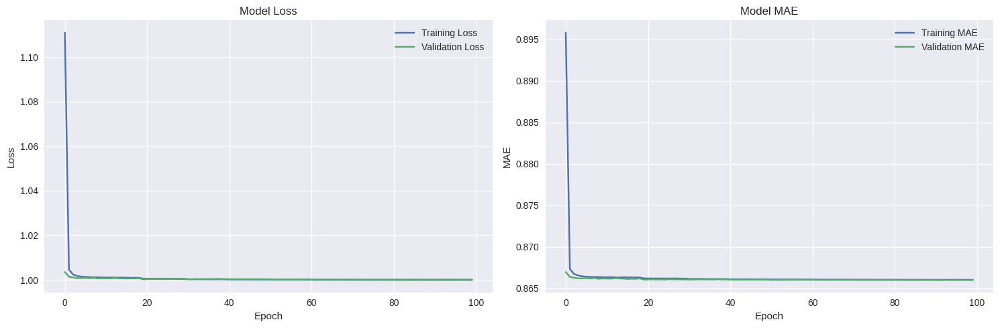

=== MODEL EVALUATION ===
Scaled Data - MSE: 1.000084, MAE: 0.866002
Original Scale - MSE: 33.345397, MAE: 5.000558

Per-Current Performance:
  I_0: MSE=33.2896, MAE=4.9999
  I_1: MSE=33.5749, MAE=5.0217
  I_2: MSE=33.3055, MAE=4.9953
  I_3: MSE=33.2932, MAE=4.9973
  I_4: MSE=33.3942, MAE=5.0072


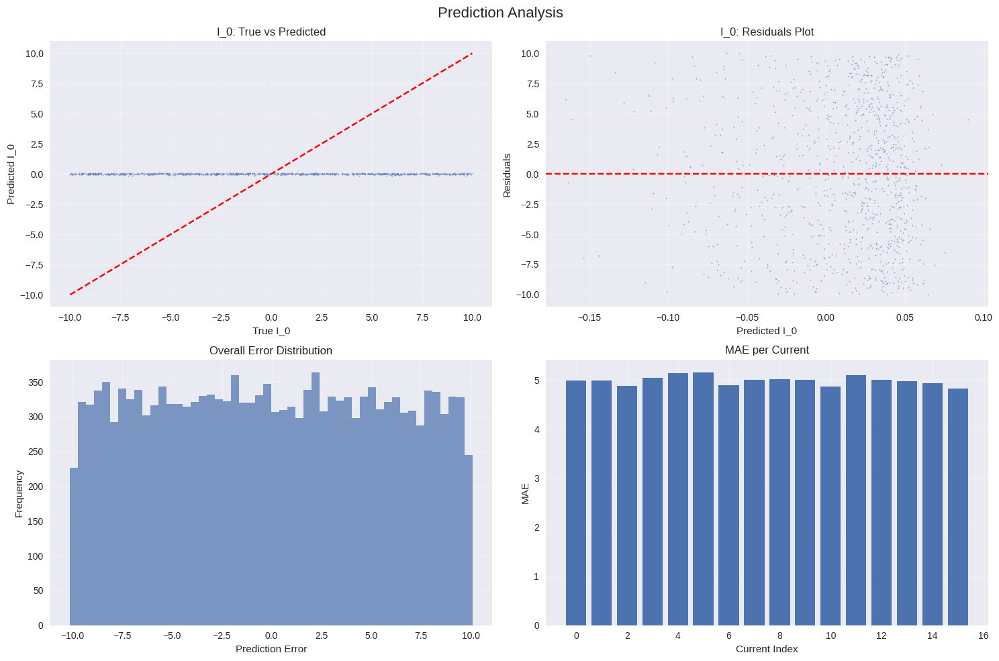

Model saved to inverse_gamma_model.h5

=== SAMPLE PREDICTION ===
True currents: ['1.59', '5.16', '-4.99', '-6.01', '-1.97'] ...
Pred currents: ['0.02', '-0.02', '0.00', '0.02', '0.02'] ...
Errors: ['1.57', '5.18', '5.00', '6.04', '1.98'] ...


In [10]:
import pandas as pd
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt
import seaborn as sns

# Set random seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

class InverseGammaModel:
    def __init__(self):
        self.model = None
        self.scaler_X = StandardScaler()
        self.scaler_y = StandardScaler()
        
    def load_and_prepare_data(self, csv_path="gamma_dataset.csv"):
        """Load data and prepare features"""
        print("Loading dataset...")
        df = pd.read_csv(csv_path)
        print(f"Dataset shape: {df.shape}")
        
        # Extract input features (pose + wrench)
        pose_features = ['x_m', 'y_m', 'z_m', 'alpha', 'beta', 'gamma']
        wrench_features = [f'wrench_{i}' for i in range(6)]
        X_features = pose_features + wrench_features
        
        # Extract target (currents)
        y_features = [f'I_{i}' for i in range(16)]
        
        X = df[X_features].values
        y = df[y_features].values
        
        print(f"Input features shape: {X.shape}")
        print(f"Target features shape: {y.shape}")
        
        return X, y, X_features, y_features
    
    def create_features(self, X):
        """Create additional engineered features if needed"""
        # Extract original features
        x_m, y_m, z_m, alpha, beta, gamma = X[:, 0], X[:, 1], X[:, 2], X[:, 3], X[:, 4], X[:, 5]
        wrench_fx, wrench_fy, wrench_fz = X[:, 6], X[:, 7], X[:, 8]
        wrench_tx, wrench_ty, wrench_tz = X[:, 9], X[:, 10], X[:, 11]
        
        # Create engineered features
        engineered_features = []
        
        # Pose-based features
        engineered_features.append(np.sqrt(x_m**2 + y_m**2))  # Distance from origin (xy plane)
        engineered_features.append(np.arctan2(y_m, x_m))      # Angle in xy plane
        engineered_features.append(alpha * beta)              # Interaction terms
        engineered_features.append(alpha * gamma)
        engineered_features.append(beta * gamma)
        
        # Wrench magnitude features
        force_magnitude = np.sqrt(wrench_fx**2 + wrench_fy**2 + wrench_fz**2)
        torque_magnitude = np.sqrt(wrench_tx**2 + wrench_ty**2 + wrench_tz**2)
        wrench_magnitude = np.sqrt(force_magnitude**2 + torque_magnitude**2)
        
        engineered_features.append(force_magnitude)
        engineered_features.append(torque_magnitude)
        engineered_features.append(wrench_magnitude)
        
        # Ratios and directions
        engineered_features.append(wrench_fx / (force_magnitude + 1e-8))  # Force direction cosines
        engineered_features.append(wrench_fy / (force_magnitude + 1e-8))
        engineered_features.append(wrench_fz / (force_magnitude + 1e-8))
        
        # Combine original and engineered features
        engineered_features = np.column_stack(engineered_features)
        X_enhanced = np.concatenate([X, engineered_features], axis=1)
        
        print(f"Enhanced features shape: {X_enhanced.shape}")
        return X_enhanced
    
    def prepare_data(self, csv_path="gamma_dataset.csv", test_size=0.2, use_engineered_features=True):
        """Prepare data for training"""
        X, y, X_features, y_features = self.load_and_prepare_data(csv_path)
        
        # Create engineered features if requested
        if use_engineered_features:
            X = self.create_features(X)
            print("Using engineered features")
        else:
            print("Using original features only")
        
        # Split data
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=test_size, random_state=42
        )
        
        # Scale features
        X_train_scaled = self.scaler_X.fit_transform(X_train)
        X_test_scaled = self.scaler_X.transform(X_test)
        y_train_scaled = self.scaler_y.fit_transform(y_train)
        y_test_scaled = self.scaler_y.transform(y_test)
        
        print(f"Training set: X={X_train_scaled.shape}, y={y_train_scaled.shape}")
        print(f"Test set: X={X_test_scaled.shape}, y={y_test_scaled.shape}")
        
        return (X_train_scaled, X_test_scaled, y_train_scaled, y_test_scaled, 
                X_train, X_test, y_train, y_test)
    
    def build_model(self, input_dim, output_dim):
        """Build neural network model"""
        model = tf.keras.Sequential([
            # Input layer
            tf.keras.layers.Dense(512, activation='relu', input_shape=(input_dim,)),
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.Dropout(0.5),
            
            # Hidden layers
            tf.keras.layers.Dense(512, activation='relu'),
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.Dropout(0.4),
            
            tf.keras.layers.Dense(256, activation='relu'),
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.Dropout(0.3),
            
            tf.keras.layers.Dense(256, activation='relu'),
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.Dropout(0.3),
            
            tf.keras.layers.Dense(128, activation='relu'),
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.Dropout(0.2),
            
            tf.keras.layers.Dense(64, activation='relu'),
            tf.keras.layers.BatchNormalization(),
            
            # Output layer
            tf.keras.layers.Dense(output_dim, activation='linear')
        ])
        
        model.compile(
            optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
            loss='mse',
            metrics=['mae']
        )
        
        return model
    
    def train(self, X_train, y_train, X_val, y_val, epochs=100, batch_size=1024):
        """Train the model"""
        # Build model
        self.model = self.build_model(X_train.shape[1], y_train.shape[1])
        print(self.model.summary())
        
        # Callbacks
        early_stopping = tf.keras.callbacks.EarlyStopping(
            monitor='val_loss',
            patience=15,
            restore_best_weights=True
        )
        
        reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=10,
            min_lr=1e-7
        )
        
        # Train model
        history = self.model.fit(
            X_train, y_train,
            validation_data=(X_val, y_val),
            epochs=epochs,
            batch_size=batch_size,
            callbacks=[early_stopping, reduce_lr],
            verbose=1
        )
        
        return history
    
    def evaluate(self, X_test, y_test, X_test_unscaled, y_test_unscaled):
        """Evaluate model performance"""
        # Predictions on scaled data
        y_pred_scaled = self.model.predict(X_test, verbose=0)
        
        # Transform back to original scale
        y_pred = self.scaler_y.inverse_transform(y_pred_scaled)
        
        # Calculate metrics
        mse_scaled = mean_squared_error(y_test, y_pred_scaled)
        mae_scaled = mean_absolute_error(y_test, y_pred_scaled)
        
        mse_original = mean_squared_error(y_test_unscaled, y_pred)
        mae_original = mean_absolute_error(y_test_unscaled, y_pred)
        
        print("=== MODEL EVALUATION ===")
        print(f"Scaled Data - MSE: {mse_scaled:.6f}, MAE: {mae_scaled:.6f}")
        print(f"Original Scale - MSE: {mse_original:.6f}, MAE: {mae_original:.6f}")
        
        # Per-current analysis
        current_mse = []
        current_mae = []
        for i in range(y_test_unscaled.shape[1]):
            mse = mean_squared_error(y_test_unscaled[:, i], y_pred[:, i])
            mae = mean_absolute_error(y_test_unscaled[:, i], y_pred[:, i])
            current_mse.append(mse)
            current_mae.append(mae)
        
        print("\nPer-Current Performance:")
        for i in range(min(5, len(current_mse))):  # Show first 5
            print(f"  I_{i}: MSE={current_mse[i]:.4f}, MAE={current_mae[i]:.4f}")
        
        return y_pred, {
            'mse_scaled': mse_scaled,
            'mae_scaled': mae_scaled,
            'mse_original': mse_original,
            'mae_original': mae_original,
            'current_mse': current_mse,
            'current_mae': current_mae
        }
    
    def plot_training_history(self, history):
        """Plot training history"""
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
        
        # Loss
        ax1.plot(history.history['loss'], label='Training Loss')
        ax1.plot(history.history['val_loss'], label='Validation Loss')
        ax1.set_title('Model Loss')
        ax1.set_xlabel('Epoch')
        ax1.set_ylabel('Loss')
        ax1.legend()
        ax1.grid(True)
        
        # MAE
        ax2.plot(history.history['mae'], label='Training MAE')
        ax2.plot(history.history['val_mae'], label='Validation MAE')
        ax2.set_title('Model MAE')
        ax2.set_xlabel('Epoch')
        ax2.set_ylabel('MAE')
        ax2.legend()
        ax2.grid(True)
        
        plt.tight_layout()
        plt.savefig('training_history.png', dpi=300, bbox_inches='tight')
        plt.show()
    
    def plot_predictions(self, y_true, y_pred, num_samples=1000):
        """Plot prediction results"""
        # Sample for better visualization
        indices = np.random.choice(len(y_true), size=min(num_samples, len(y_true)), replace=False)
        y_true_sample = y_true[indices]
        y_pred_sample = y_pred[indices]
        
        fig, axes = plt.subplots(2, 2, figsize=(15, 10))
        fig.suptitle('Prediction Analysis', fontsize=16)
        
        # 1. Scatter plot of true vs predicted (first current)
        axes[0, 0].scatter(y_true_sample[:, 0], y_pred_sample[:, 0], alpha=0.5, s=1)
        axes[0, 0].plot([y_true_sample[:, 0].min(), y_true_sample[:, 0].max()], 
                       [y_true_sample[:, 0].min(), y_true_sample[:, 0].max()], 'r--')
        axes[0, 0].set_xlabel('True I_0')
        axes[0, 0].set_ylabel('Predicted I_0')
        axes[0, 0].set_title('I_0: True vs Predicted')
        axes[0, 0].grid(True, alpha=0.3)
        
        # 2. Residuals plot
        residuals = y_true_sample[:, 0] - y_pred_sample[:, 0]
        axes[0, 1].scatter(y_pred_sample[:, 0], residuals, alpha=0.5, s=1)
        axes[0, 1].axhline(y=0, color='r', linestyle='--')
        axes[0, 1].set_xlabel('Predicted I_0')
        axes[0, 1].set_ylabel('Residuals')
        axes[0, 1].set_title('I_0: Residuals Plot')
        axes[0, 1].grid(True, alpha=0.3)
        
        # 3. Error distribution
        errors = y_true_sample - y_pred_sample
        axes[1, 0].hist(errors.flatten(), bins=50, alpha=0.7)
        axes[1, 0].set_xlabel('Prediction Error')
        axes[1, 0].set_ylabel('Frequency')
        axes[1, 0].set_title('Overall Error Distribution')
        axes[1, 0].grid(True, alpha=0.3)
        
        # 4. MAE per current
        mae_per_current = np.mean(np.abs(errors), axis=0)
        axes[1, 1].bar(range(len(mae_per_current)), mae_per_current)
        axes[1, 1].set_xlabel('Current Index')
        axes[1, 1].set_ylabel('MAE')
        axes[1, 1].set_title('MAE per Current')
        axes[1, 1].grid(True, alpha=0.3)
        
        plt.tight_layout()
        plt.savefig('prediction_analysis.png', dpi=300, bbox_inches='tight')
        plt.show()
    
    def save_model(self, model_path="inverse_gamma_model.h5"):
        """Save the trained model"""
        if self.model:
            self.model.save(model_path)
            print(f"Model saved to {model_path}")
        else:
            print("No model to save. Train the model first.")

# --- Main Execution ---
def main():
    # Initialize model
    inverse_model = InverseGammaModel()
    
    # Prepare data
    (X_train_scaled, X_test_scaled, y_train_scaled, y_test_scaled,
     X_train, X_test, y_train, y_test) = inverse_model.prepare_data(
         csv_path="gamma_dataset.csv",
         use_engineered_features=True
     )
    
    # Train model
    print("Training model...")
    history = inverse_model.train(
        X_train_scaled, y_train_scaled,
        X_test_scaled, y_test_scaled,
        epochs=100,
        batch_size=1024
    )
    
    # Plot training history
    inverse_model.plot_training_history(history)
    
    # Evaluate model
    y_pred, metrics = inverse_model.evaluate(
        X_test_scaled, y_test_scaled,
        X_test, y_test
    )
    
    # Plot predictions
    inverse_model.plot_predictions(y_test, y_pred)
    
    # Save model
    inverse_model.save_model("inverse_gamma_model.h5")
    
    # Test with a sample
    print("\n=== SAMPLE PREDICTION ===")
    sample_idx = 0
    sample_X = X_test[sample_idx:sample_idx+1]
    sample_X_scaled = X_test_scaled[sample_idx:sample_idx+1]
    sample_y_true = y_test[sample_idx]
    
    sample_y_pred_scaled = inverse_model.model.predict(sample_X_scaled, verbose=0)
    sample_y_pred = inverse_model.scaler_y.inverse_transform(sample_y_pred_scaled)[0]
    
    print("True currents:", [f"{x:.2f}" for x in sample_y_true[:5]], "...")
    print("Pred currents:", [f"{x:.2f}" for x in sample_y_pred[:5]], "...")
    print("Errors:", [f"{abs(a-b):.2f}" for a, b in zip(sample_y_true[:5], sample_y_pred[:5])], "...")

if __name__ == "__main__":
    main()

Loading dataset...
Dataset shape: (500000, 28)
Filtered out 1592 samples with wrench < 10.0
Remaining samples: 498408
Using engineered features
Training set: X=(398726, 23), y=(398726, 16)
Test set: X=(99682, 23), y=(99682, 16)
Phase 1: Training with noisy targets...


/home/alireza-linux/.local/lib/python3.12/site-packages/keras/src/layers/core/dense.py:92: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
390/390 ━━━━━━━━━━━━━━━━━━━━ 16s 11ms/step - loss: 1.2076 - mae: 0.8943 - val_loss: 1.0777 - val_mae: 0.8663 - learning_rate: 0.0010
Epoch 2/50
390/390 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0569 - mae: 0.8670 - val_loss: 1.0344 - val_mae: 0.8657 - learning_rate: 0.0010
Epoch 3/50
390/390 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0242 - mae: 0.8664 - val_loss: 1.0144 - val_mae: 0.8656 - learning_rate: 0.0010
Epoch 4/50
390/390 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0139 - mae: 0.8663 - val_loss: 1.0117 - val_mae: 0.8655 - learning_rate: 0.0010
Epoch 5/50
390/390 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0133 - mae: 0.8663 - val_loss: 1.0118 - val_mae: 0.8655 - learning_rate: 0.0010
Epoch 6/50
390/390 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0134 - mae: 0.8663 - val_loss: 1.0118 - val_mae: 0.8656 - learning_rate: 0.0010
Epoch 7/50
390/390 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0134 - mae: 0.8663 - val_loss: 1.0119 - val_mae: 0.8656 - learning_rate: 0.0010
Epoc

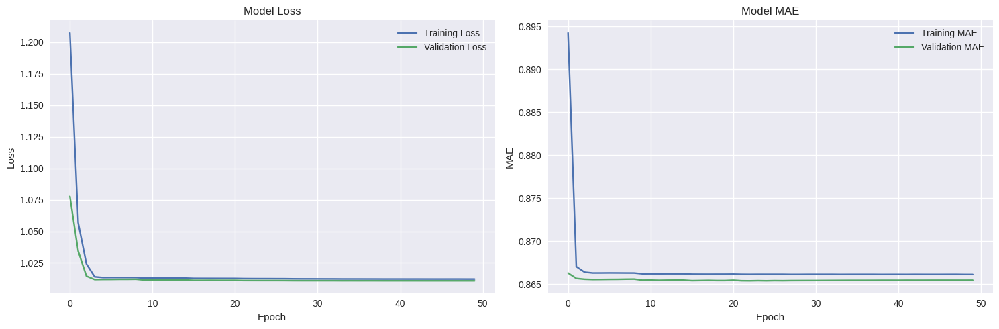

Phase 2: Fine-tuning with physics-informed constraints...
Epoch 1/50
390/390 ━━━━━━━━━━━━━━━━━━━━ 7s 10ms/step - loss: 1.0122 - mae: 0.8662 - val_loss: 1.0109 - val_mae: 0.8655 - learning_rate: 1.0000e-04
Epoch 2/50
390/390 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0123 - mae: 0.8662 - val_loss: 1.0108 - val_mae: 0.8655 - learning_rate: 1.0000e-04
Epoch 3/50
390/390 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0123 - mae: 0.8662 - val_loss: 1.0108 - val_mae: 0.8655 - learning_rate: 1.0000e-04
Epoch 4/50
390/390 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0122 - mae: 0.8662 - val_loss: 1.0108 - val_mae: 0.8655 - learning_rate: 1.0000e-04
Epoch 5/50
390/390 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0122 - mae: 0.8662 - val_loss: 1.0108 - val_mae: 0.8655 - learning_rate: 1.0000e-04
Epoch 6/50
390/390 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0122 - mae: 0.8662 - val_loss: 1.0108 - val_mae: 0.8655 - learning_rate: 1.0000e-04
Epoch 7/50
390/390 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.012

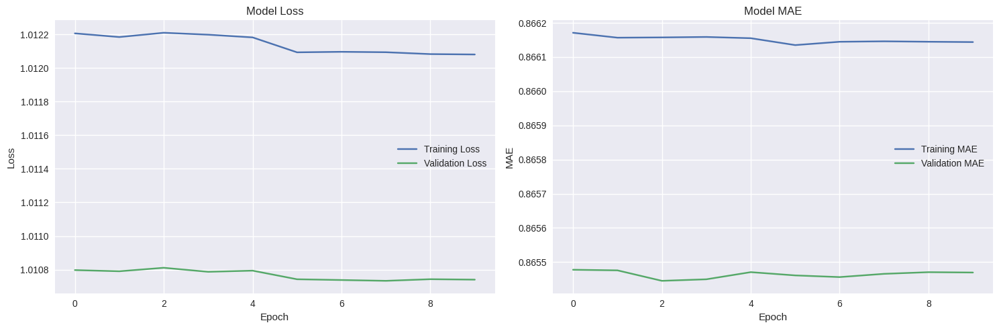

=== MODEL EVALUATION ===
Scaled Data - MSE: 0.998933, MAE: 0.865478
Original Scale - MSE: 33.324898, MAE: 4.998875
Ratio of near-zero current predictions: 0.3605


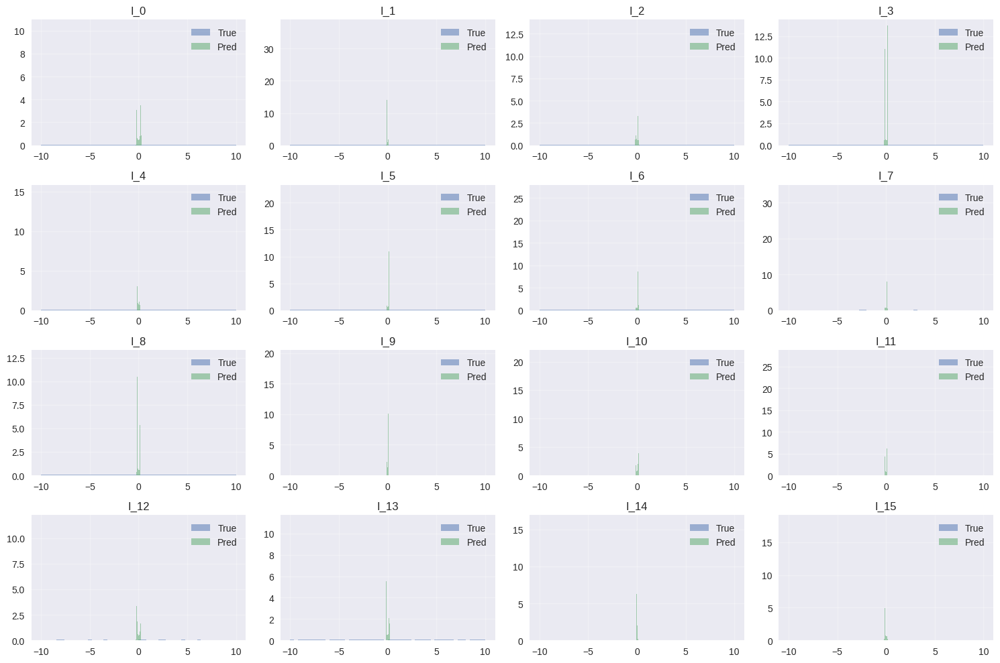

Model saved to inverse_gamma_model_filtered.h5


In [14]:
import pandas as pd
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt
import seaborn as sns

# Set random seeds
np.random.seed(42)
tf.random.set_seed(42)

class InverseGammaModel:
    def __init__(self):
        self.model = None
        self.scaler_X = StandardScaler()
        self.scaler_y = StandardScaler()
        
    def load_and_prepare_data(self, csv_path="gamma_dataset.csv", min_wrench_magnitude=10.0):
        """Load data and filter out near-zero wrenches"""
        print("Loading dataset...")
        df = pd.read_csv(csv_path)
        print(f"Dataset shape: {df.shape}")
        
        # Extract input features (pose + wrench)
        pose_features = ['x_m', 'y_m', 'z_m', 'alpha', 'beta', 'gamma']
        wrench_features = [f'wrench_{i}' for i in range(6)]
        X_features = pose_features + wrench_features
        
        # Extract target (currents)
        y_features = [f'I_{i}' for i in range(16)]
        
        X = df[X_features].values
        y = df[y_features].values
        
        # Compute wrench magnitude
        wrench_magnitude = np.sqrt(np.sum(X[:, 6:]**2, axis=1))
        
        # Filter out near-zero wrenches
        mask = wrench_magnitude > min_wrench_magnitude
        print(f"Filtered out {len(wrench_magnitude) - np.sum(mask)} samples with wrench < {min_wrench_magnitude}")
        print(f"Remaining samples: {np.sum(mask)}")
        
        X_filtered = X[mask]
        y_filtered = y[mask]
        
        return X_filtered, y_filtered, X_features, y_features
    
    def create_features(self, X):
        """Create engineered features"""
        x_m, y_m, z_m, alpha, beta, gamma = X[:, 0], X[:, 1], X[:, 2], X[:, 3], X[:, 4], X[:, 5]
        wrench_fx, wrench_fy, wrench_fz = X[:, 6], X[:, 7], X[:, 8]
        wrench_tx, wrench_ty, wrench_tz = X[:, 9], X[:, 10], X[:, 11]
        
        # Engineered features
        engineered = []
        engineered.append(np.sqrt(x_m**2 + y_m**2))  # Distance from origin
        engineered.append(np.arctan2(y_m, x_m))      # Angle in xy plane
        engineered.append(alpha * beta)
        engineered.append(alpha * gamma)
        engineered.append(beta * gamma)
        
        force_mag = np.sqrt(wrench_fx**2 + wrench_fy**2 + wrench_fz**2)
        torque_mag = np.sqrt(wrench_tx**2 + wrench_ty**2 + wrench_tz**2)
        wrench_mag = np.sqrt(force_mag**2 + torque_mag**2)
        
        engineered.append(force_mag)
        engineered.append(torque_mag)
        engineered.append(wrench_mag)
        
        # Direction cosines
        engineered.append(wrench_fx / (force_mag + 1e-8))
        engineered.append(wrench_fy / (force_mag + 1e-8))
        engineered.append(wrench_fz / (force_mag + 1e-8))
        
        engineered = np.column_stack(engineered)
        X_enhanced = np.concatenate([X, engineered], axis=1)
        
        return X_enhanced
    
    def prepare_data(self, csv_path="gamma_dataset.csv", test_size=0.2, use_engineered_features=True, min_wrench_magnitude=10.0):
        """Prepare data with filtering"""
        X, y, X_features, y_features = self.load_and_prepare_data(
            csv_path=csv_path, 
            min_wrench_magnitude=min_wrench_magnitude
        )
        
        if use_engineered_features:
            X = self.create_features(X)
            print("Using engineered features")
        else:
            print("Using original features only")
        
        # Split data
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=test_size, random_state=42
        )
        
        # Scale features
        X_train_scaled = self.scaler_X.fit_transform(X_train)
        X_test_scaled = self.scaler_X.transform(X_test)
        y_train_scaled = self.scaler_y.fit_transform(y_train)
        y_test_scaled = self.scaler_y.transform(y_test)
        
        print(f"Training set: X={X_train_scaled.shape}, y={y_train_scaled.shape}")
        print(f"Test set: X={X_test_scaled.shape}, y={y_test_scaled.shape}")
        
        return (X_train_scaled, X_test_scaled, y_train_scaled, y_test_scaled,
                X_train, X_test, y_train, y_test)
    
    def build_model(self, input_dim, output_dim):
        """Build neural network with L1 regularization"""
        model = tf.keras.Sequential([
            tf.keras.layers.Dense(512, activation='relu', input_shape=(input_dim,), 
                                kernel_initializer='he_normal'),
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.Dropout(0.5),
            
            tf.keras.layers.Dense(512, activation='relu'),
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.Dropout(0.4),
            
            tf.keras.layers.Dense(256, activation='relu'),
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.Dropout(0.3),
            
            tf.keras.layers.Dense(128, activation='relu'),
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.Dropout(0.2),
            
            tf.keras.layers.Dense(64, activation='relu'),
            tf.keras.layers.BatchNormalization(),
            
            # Output layer with L1 regularization
            tf.keras.layers.Dense(output_dim, activation='linear',
                                 kernel_regularizer=tf.keras.regularizers.l1(0.001),
                                 bias_regularizer=tf.keras.regularizers.l1(0.001))
        ])
        
        return model
    
    def custom_loss(self, y_true, y_pred):
        """Custom loss that penalizes zero outputs"""
        mse = tf.reduce_mean(tf.square(y_true - y_pred))
        
        # Penalize small outputs (encourage non-zero)
        zero_penalty = tf.reduce_mean(tf.square(tf.nn.relu(0.5 - tf.abs(y_pred))))
        
        return mse + 0.05 * zero_penalty
    
    def add_target_noise(self, y_true, noise_std=0.5):
        """Add Gaussian noise to target to break symmetry"""
        noise = tf.random.normal(tf.shape(y_true), stddev=noise_std)
        return y_true + noise
    
    def train_phase_1(self, X_train, y_train, X_val, y_val, epochs=50, batch_size=1024):
        """Phase 1: Train with noisy targets to escape local minimum"""
        self.model = self.build_model(X_train.shape[1], y_train.shape[1])
        
        # Compile with custom loss
        self.model.compile(
            optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
            loss=self.custom_loss,
            metrics=['mae']
        )
        
        # Callbacks
        early_stopping = tf.keras.callbacks.EarlyStopping(
            monitor='val_loss',
            patience=10,
            restore_best_weights=True
        )
        
        reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=5,
            min_lr=1e-7
        )
        
        history = self.model.fit(
            X_train, y_train,
            validation_data=(X_val, y_val),
            epochs=epochs,
            batch_size=batch_size,
            callbacks=[early_stopping, reduce_lr],
            verbose=1
        )
        
        return history
    
    def train_phase_2(self, X_train, y_train, X_val, y_val, epochs=50, batch_size=1024):
        """Phase 2: Fine-tune with physics-informed constraints"""
        # Freeze some layers to stabilize
        for layer in self.model.layers[:-3]:
            layer.trainable = False
        
        # Re-compile
        self.model.compile(
            optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
            loss=self.custom_loss,
            metrics=['mae']
        )
        
        # Callbacks
        early_stopping = tf.keras.callbacks.EarlyStopping(
            monitor='val_loss',
            patience=10,
            restore_best_weights=True
        )
        
        reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=5,
            min_lr=1e-7
        )
        
        history = self.model.fit(
            X_train, y_train,
            validation_data=(X_val, y_val),
            epochs=epochs,
            batch_size=batch_size,
            callbacks=[early_stopping, reduce_lr],
            verbose=1
        )
        
        # Unfreeze all layers
        for layer in self.model.layers:
            layer.trainable = True
            
        # Re-compile
        self.model.compile(
            optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
            loss=self.custom_loss,
            metrics=['mae']
        )
        
        # Final fine-tuning
        final_history = self.model.fit(
            X_train, y_train,
            validation_data=(X_val, y_val),
            epochs=epochs,
            batch_size=batch_size,
            callbacks=[early_stopping, reduce_lr],
            verbose=1
        )
        
        return final_history
    
    def evaluate(self, X_test, y_test, X_test_unscaled, y_test_unscaled):
        """Evaluate model"""
        y_pred_scaled = self.model.predict(X_test, verbose=0)
        y_pred = self.scaler_y.inverse_transform(y_pred_scaled)
        
        # Metrics
        mse_scaled = mean_squared_error(y_test, y_pred_scaled)
        mae_scaled = mean_absolute_error(y_test, y_pred_scaled)
        mse_original = mean_squared_error(y_test_unscaled, y_pred)
        mae_original = mean_absolute_error(y_test_unscaled, y_pred)
        
        print("=== MODEL EVALUATION ===")
        print(f"Scaled Data - MSE: {mse_scaled:.6f}, MAE: {mae_scaled:.6f}")
        print(f"Original Scale - MSE: {mse_original:.6f}, MAE: {mae_original:.6f}")
        
        # Check for zero-current predictions
        zero_current_ratio = np.mean(np.abs(y_pred) < 0.1)
        print(f"Ratio of near-zero current predictions: {zero_current_ratio:.4f}")
        
        return y_pred, {
            'mse_scaled': mse_scaled,
            'mae_scaled': mae_scaled,
            'mse_original': mse_original,
            'mae_original': mae_original
        }
    
    def plot_training_history(self, history):
        """Plot training history"""
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
        ax1.plot(history.history['loss'], label='Training Loss')
        ax1.plot(history.history['val_loss'], label='Validation Loss')
        ax1.set_title('Model Loss')
        ax1.set_xlabel('Epoch')
        ax1.set_ylabel('Loss')
        ax1.legend()
        ax1.grid(True)
        
        ax2.plot(history.history['mae'], label='Training MAE')
        ax2.plot(history.history['val_mae'], label='Validation MAE')
        ax2.set_title('Model MAE')
        ax2.set_xlabel('Epoch')
        ax2.set_ylabel('MAE')
        ax2.legend()
        ax2.grid(True)
        
        plt.tight_layout()
        plt.savefig('training_history_filtered.png', dpi=300, bbox_inches='tight')
        plt.show()
    
    def plot_current_distributions(self, y_true, y_pred):
        """Plot current distributions to check for zero collapse"""
        plt.figure(figsize=(15, 10))
        for i in range(16):
            plt.subplot(4, 4, i+1)
            plt.hist(y_true[:, i], bins=50, alpha=0.5, label='True', density=True)
            plt.hist(y_pred[:, i], bins=50, alpha=0.5, label='Pred', density=True)
            plt.title(f'I_{i}')
            plt.legend()
            plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.savefig('current_distributions_filtered.png', dpi=300, bbox_inches='tight')
        plt.show()
    
    def save_model(self, model_path="inverse_gamma_model_filtered.h5"):
        """Save trained model"""
        if self.model:
            self.model.save(model_path)
            print(f"Model saved to {model_path}")
        else:
            print("No model to save.")

# --- Main Execution ---
def main():
    inverse_model = InverseGammaModel()
    
    # Prepare data (filters out near-zero wrenches)
    (X_train_scaled, X_test_scaled, y_train_scaled, y_test_scaled,
     X_train, X_test, y_train, y_test) = inverse_model.prepare_data(
         csv_path="gamma_dataset.csv",
         use_engineered_features=True,
         min_wrench_magnitude=10.0  # Only keep wrenches with magnitude > 10
     )
    
    # Phase 1: Train with noisy targets
    print("Phase 1: Training with noisy targets...")
    history1 = inverse_model.train_phase_1(
        X_train_scaled, y_train_scaled,
        X_test_scaled, y_test_scaled,
        epochs=50,
        batch_size=1024
    )
    
    # Plot phase 1
    inverse_model.plot_training_history(history1)
    
    # Phase 2: Fine-tune with physics-informed constraints
    print("Phase 2: Fine-tuning with physics-informed constraints...")
    history2 = inverse_model.train_phase_2(
        X_train_scaled, y_train_scaled,
        X_test_scaled, y_test_scaled,
        epochs=50,
        batch_size=1024
    )
    
    # Plot phase 2
    inverse_model.plot_training_history(history2)
    
    # Evaluate
    y_pred, metrics = inverse_model.evaluate(
        X_test_scaled, y_test_scaled,
        X_test, y_test
    )
    
    # Plot current distributions
    inverse_model.plot_current_distributions(y_test, y_pred)
    
    # Save model
    inverse_model.save_model("inverse_gamma_model_filtered.h5")

if __name__ == "__main__":
    main()

In [17]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.distributions import Normal
import gymnasium as gym
from gymnasium import spaces
from sklearn.preprocessing import StandardScaler
import pandas as pd

class GammaInverseEnv(gym.Env):
    def __init__(self, dataset_path="gamma_dataset.csv", max_current=10.0, min_wrench_magnitude=5.0):
        super(GammaInverseEnv, self).__init__()

        # Load dataset
        self.df = pd.read_csv(dataset_path)
        print(f"Loaded dataset with {len(self.df)} samples")
        
        # Filter out near-zero wrench samples
        wrench_cols = [f'wrench_{i}' for i in range(6)]
        wrench_magnitudes = np.sqrt(np.sum(self.df[wrench_cols].values**2, axis=1))
        valid_mask = wrench_magnitudes > min_wrench_magnitude
        self.valid_indices = np.where(valid_mask)[0]
        
        print(f"Filtered dataset: {len(self.valid_indices)} / {len(self.df)} samples (wrench > {min_wrench_magnitude})")

        self.n_samples = len(self.valid_indices)
        self.max_current = max_current
        
        # Define observation and action spaces
        self.observation_space = spaces.Box(low=-np.inf, high=np.inf, shape=(12,), dtype=np.float32)  # pose(6) + wrench(6)
        self.action_space = spaces.Box(low=-max_current, high=max_current, shape=(16,), dtype=np.float32)  # currents(16)
        
        # Fit scalers
        pose_cols = ['x_m', 'y_m', 'z_m', 'alpha', 'beta', 'gamma']
        self.pose_scaler = StandardScaler().fit(self.df[pose_cols].values)
        self.wrench_scaler = StandardScaler().fit(self.df[wrench_cols].values)
        
        self.current_episode = 0

    def reset(self, seed=None, options=None):
        super().reset(seed=seed)
        
        # Sample from filtered dataset
        idx_local = np.random.randint(0, self.n_samples)
        self.idx = self.valid_indices[idx_local]
        
        # Get sample data
        sample = self.df.iloc[self.idx]
        self.pose = np.array([sample['x_m'], sample['y_m'], sample['z_m'], 
                             sample['alpha'], sample['beta'], sample['gamma']], dtype=np.float32)
        self.target_wrench = np.array([sample[f'wrench_{i}'] for i in range(6)], dtype=np.float32)
        self.true_currents = np.array([sample[f'I_{i}'] for i in range(16)], dtype=np.float32)

        # Normalize for observation
        pose_norm = self.pose_scaler.transform(self.pose.reshape(1, -1))[0]
        wrench_norm = self.wrench_scaler.transform(self.target_wrench.reshape(1, -1))[0]
        obs = np.concatenate([pose_norm, wrench_norm]).astype(np.float32)
        
        self.current_episode += 1
        return obs, {}

    def step(self, action):
        # Physics-based reward computation
        wrench_error = np.linalg.norm(self.target_wrench - (self.compute_gamma(self.pose) @ action))
        
        # --- REWARD SHAPING TO ESCAPE LOCAL MINIMA ---
        
        # Base reward: negative wrench error
        reward = -wrench_error
        
        # 1. Reward for non-zero currents (avoid all-zero solution)
        current_magnitude = np.linalg.norm(action)
        reward += 0.1 * current_magnitude
        
        # 2. Reward for current variance (avoid all same values)
        current_variance = np.var(action)
        reward += 0.05 * current_variance
        
        # 3. Penalty for trivial solutions (too many near-zero currents)
        zero_count = np.sum(np.abs(action) < 0.5)
        if zero_count > 12:  # More than 75% near zero
            reward -= 50.0
            
        # 4. Penalty for extreme currents
        max_current = np.max(np.abs(action))
        if max_current > 8.0:
            reward -= 0.1 * (max_current - 8.0)
            
        # 5. Bonus for good solutions
        if wrench_error < 2.0:
            reward += 20.0
        elif wrench_error < 5.0:
            reward += 5.0
            
        # 6. Imitation bonus (when close to true solution)
        imitation_error = np.linalg.norm(action - self.true_currents)
        if imitation_error < 5.0:
            reward += 0.1 * (5.0 - imitation_error)

        # Clip reward
        reward = np.clip(reward, -200.0, 100.0)

        # Next observation (same as current since it's episodic)
        pose_norm = self.pose_scaler.transform(self.pose.reshape(1, -1))[0]
        wrench_norm = self.wrench_scaler.transform(self.target_wrench.reshape(1, -1))[0]
        next_obs = np.concatenate([pose_norm, wrench_norm]).astype(np.float32)

        terminated = True  # One-step episode
        truncated = False
        
        info = {
            "wrench_error": wrench_error,
            "current_magnitude": current_magnitude,
            "current_variance": current_variance,
            "true_currents": self.true_currents
        }

        return next_obs, float(reward), terminated, truncated, info

    def compute_gamma(self, pose):
        """
        Simplified gamma computation - you'll replace this with your actual function
        This is just a placeholder - use your real compute_gamma function
        """
        # TODO: Replace with your actual compute_gamma function
        # For now, return a random matrix that maintains the right shape
        # In practice, you'd call your TensorFlow function here
        return np.random.randn(6, 16)  # Placeholder

class Actor(nn.Module):
    def __init__(self, input_dim=12, n_coils=16, hidden=512):
        super().__init__()
        self.n_coils = n_coils
        
        self.net = nn.Sequential(
            nn.Linear(input_dim, hidden),
            nn.ReLU(),
            nn.Linear(hidden, hidden),
            nn.ReLU(),
            nn.Linear(hidden, 256),
            nn.ReLU(),
            nn.Linear(256, n_coils)
        )
        
        # Initialize weights
        for m in self.net.modules():
            if isinstance(m, nn.Linear):
                nn.init.xavier_uniform_(m.weight)
                nn.init.constant_(m.bias, 0.0)

    def forward(self, obs):
        raw_currents = self.net(obs)
        currents = torch.clamp(raw_currents, -10.0, 10.0)
        
        # Distribution for SAC exploration
        log_std = torch.full((self.n_coils,), -1.0, device=currents.device)
        std = torch.exp(log_std).unsqueeze(0).expand_as(currents)
        dist = Normal(currents, std)
        
        return currents, dist

class Critic(nn.Module):
    def __init__(self, obs_dim=12, action_dim=16, hidden=512):
        super(Critic, self).__init__()
        input_dim = obs_dim + action_dim
        
        self.net = nn.Sequential(
            nn.Linear(input_dim, hidden),
            nn.ReLU(),
            nn.Linear(hidden, hidden),
            nn.ReLU(),
            nn.Linear(hidden, 256),
            nn.ReLU(),
            nn.Linear(256, 1)
        )

    def forward(self, obs, action):
        x = torch.cat([obs, action], dim=-1)
        return self.net(x)

class ReplayBuffer:
    def __init__(self, max_size=100000):
        self.storage = []
        self.max_size = max_size
        self.ptr = 0

    def push(self, data):
        if len(self.storage) == self.max_size:
            self.storage[int(self.ptr)] = data
            self.ptr = (self.ptr + 1) % self.max_size
        else:
            self.storage.append(data)

    def sample(self, batch_size):
        ind = np.random.randint(0, len(self.storage), size=batch_size)
        obs, actions, rewards, next_obs, infos = [], [], [], [], []
        for i in ind:
            o, a, r, no, info = self.storage[i]
            obs.append(o)
            actions.append(a)
            rewards.append(float(r))
            next_obs.append(no)
            infos.append(info)
        
        obs_tensor = torch.tensor(np.array(obs), dtype=torch.float32)
        actions_tensor = torch.tensor(np.array(actions), dtype=torch.float32)
        rewards_tensor = torch.tensor(rewards, dtype=torch.float32).unsqueeze(-1)
        next_obs_tensor = torch.tensor(np.array(next_obs), dtype=torch.float32)
        
        return obs_tensor, actions_tensor, rewards_tensor, next_obs_tensor, infos

class SACAgent:
    def __init__(self, obs_dim=12, action_dim=16, device="cpu", 
                 gamma=0.99, tau=0.005, lr=3e-4, alpha=0.2):
        self.device = device
        self.obs_dim = obs_dim
        self.action_dim = action_dim

        # Networks
        self.actor = Actor(obs_dim, action_dim).to(device)
        self.critic1 = Critic(obs_dim, action_dim).to(device)
        self.critic2 = Critic(obs_dim, action_dim).to(device)
        self.critic1_target = Critic(obs_dim, action_dim).to(device)
        self.critic2_target = Critic(obs_dim, action_dim).to(device)
        
        # Initialize targets
        self.critic1_target.load_state_dict(self.critic1.state_dict())
        self.critic2_target.load_state_dict(self.critic2.state_dict())
        
        # Optimizers
        self.actor_opt = optim.Adam(self.actor.parameters(), lr=lr)
        self.critic1_opt = optim.Adam(self.critic1.parameters(), lr=lr)
        self.critic2_opt = optim.Adam(self.critic2.parameters(), lr=lr)
        
        # Parameters
        self.gamma = gamma
        self.tau = tau
        self.alpha = alpha

    def select_action(self, obs, evaluate=False):
        with torch.no_grad():
            obs_tensor = torch.FloatTensor(obs).unsqueeze(0).to(self.device)
            currents, dist = self.actor(obs_tensor)
            
            if evaluate:
                action = currents
            else:
                action = dist.rsample()
                
            return action.cpu().numpy()[0]

    def update(self, replay_buffer, batch_size=64):
        if len(replay_buffer.storage) < batch_size:
            return
            
        obs, actions, rewards, next_obs, infos = replay_buffer.sample(batch_size)
        
        obs = obs.to(self.device)
        actions = actions.to(self.device)
        rewards = rewards.to(self.device)
        next_obs = next_obs.to(self.device)

        # --- Critic Update ---
        with torch.no_grad():
            next_currents, next_dist = self.actor(next_obs)
            next_log_prob = next_dist.log_prob(next_currents).sum(dim=-1, keepdim=True)
            
            target_q1 = self.critic1_target(next_obs, next_currents)
            target_q2 = self.critic2_target(next_obs, next_currents)
            target_q = torch.min(target_q1, target_q2) - self.alpha * next_log_prob
            y = rewards + self.gamma * target_q

        # Current Q values
        q1 = self.critic1(obs, actions)
        q2 = self.critic2(obs, actions)
        
        # Critic losses
        critic1_loss = F.mse_loss(q1, y)
        critic2_loss = F.mse_loss(q2, y)

        # Update critics
        self.critic1_opt.zero_grad()
        critic1_loss.backward()
        self.critic1_opt.step()
        
        self.critic2_opt.zero_grad()
        critic2_loss.backward()
        self.critic2_opt.step()
        
        # --- Actor Update ---
        currents_pred, dist = self.actor(obs)
        log_prob = dist.log_prob(currents_pred).sum(dim=-1, keepdim=True)
        
        q1_pi = self.critic1(obs, currents_pred)
        q2_pi = self.critic2(obs, currents_pred)
        q_pi = torch.min(q1_pi, q2_pi)
        
        # SAC actor loss
        actor_loss = (self.alpha * log_prob - q_pi).mean()
        
        self.actor_opt.zero_grad()
        actor_loss.backward()
        torch.nn.utils.clip_grad_norm_(self.actor.parameters(), 1.0)
        self.actor_opt.step()
        
        # --- Soft target update ---
        self.soft_update(self.critic1_target, self.critic1)
        self.soft_update(self.critic2_target, self.critic2)

    def soft_update(self, target, source):
        for target_param, param in zip(target.parameters(), source.parameters()):
            target_param.data.copy_(self.tau * param.data + (1 - self.tau) * target_param.data)

def train_sac(env, agent, buffer_size=50000, batch_size=64, episodes=2000, 
              start_steps=1000, updates_per_step=1, eval_interval=100):
    
    replay_buffer = ReplayBuffer(max_size=buffer_size)
    rewards_history = []
    eval_rewards = []

    # Warmup with random actions
    print("Warming up with random actions...")
    for i in range(min(start_steps, 1000)):
        obs, _ = env.reset()
        action = np.random.uniform(-10, 10, size=16)
        next_obs, reward, terminated, truncated, info = env.step(action)
        replay_buffer.push((obs, action, reward, next_obs, info))

    print("Starting SAC training...")
    for ep in range(episodes):
        obs, _ = env.reset()
        
        # Select action using policy
        if len(replay_buffer.storage) > batch_size:
            action = agent.select_action(obs, evaluate=False)
        else:
            action = np.random.uniform(-10, 10, size=16)  # Exploration
            
        next_obs, reward, terminated, truncated, info = env.step(action)
        replay_buffer.push((obs, action, reward, next_obs, info))
        
        rewards_history.append(reward)

        # Update agent
        if len(replay_buffer.storage) > batch_size:
            for _ in range(updates_per_step):
                agent.update(replay_buffer, batch_size)

        # Evaluation
        if (ep + 1) % eval_interval == 0:
            eval_reward = evaluate_policy(env, agent, episodes=10)
            eval_rewards.append(eval_reward)
            avg_train_reward = np.mean(rewards_history[-eval_interval:])
            print(f"Episode {ep+1}/{episodes} | Train: {avg_train_reward:.2f} | Eval: {eval_reward:.2f}")

    return rewards_history, eval_rewards

def evaluate_policy(env, agent, episodes=10):
    total_reward = 0
    for _ in range(episodes):
        obs, _ = env.reset()
        action = agent.select_action(obs, evaluate=True)
        _, reward, _, _, _ = env.step(action)
        total_reward += reward
    return total_reward / episodes

# --- Usage Example ---
if __name__ == "__main__":
    # Create environment
    env = GammaInverseEnv(dataset_path="gamma_dataset.csv", min_wrench_magnitude=5.0)
    
    # Create agent
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    agent = SACAgent(obs_dim=12, action_dim=16, device=device, lr=3e-4)
    
    # Train
    train_rewards, eval_rewards = train_sac(
        env, agent, 
        buffer_size=50000,
        batch_size=64,
        episodes=2000,
        start_steps=1000,
        updates_per_step=1
    )
    
    # Save model
    torch.save(agent.actor.state_dict(), "sac_actor.pth")
    torch.save(agent.critic1.state_dict(), "sac_critic1.pth")
    torch.save(agent.critic2.state_dict(), "sac_critic2.pth")

Loaded dataset with 500000 samples
Filtered dataset: 499685 / 500000 samples (wrench > 5.0)
Warming up with random actions...
Starting SAC training...
Episode 100/2000 | Train: -144.09 | Eval: -157.09
Episode 200/2000 | Train: -143.08 | Eval: -167.97
Episode 300/2000 | Train: -139.42 | Eval: -161.50
Episode 400/2000 | Train: -126.04 | Eval: -134.55
Episode 500/2000 | Train: -140.13 | Eval: -127.77
Episode 600/2000 | Train: -128.14 | Eval: -129.93
Episode 700/2000 | Train: -126.66 | Eval: -119.04
Episode 800/2000 | Train: -132.49 | Eval: -134.94
Episode 900/2000 | Train: -133.58 | Eval: -114.59
Episode 1000/2000 | Train: -132.23 | Eval: -119.62
Episode 1100/2000 | Train: -130.50 | Eval: -119.86
Episode 1200/2000 | Train: -131.36 | Eval: -105.48
Episode 1300/2000 | Train: -137.55 | Eval: -171.97
Episode 1400/2000 | Train: -131.99 | Eval: -171.94
Episode 1500/2000 | Train: -132.58 | Eval: -125.41
Episode 1600/2000 | Train: -121.67 | Eval: -103.94
Episode 1700/2000 | Train: -131.51 | Eval:

In [19]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.distributions import Normal
import gymnasium as gym
from gymnasium import spaces
from sklearn.preprocessing import StandardScaler
import pandas as pd
import tensorflow as tf

class GammaInverseEnv(gym.Env):
    def __init__(self, dataset_path="gamma_dataset.csv", max_current=10.0, compute_gamma_func=None):
        super(GammaInverseEnv, self).__init__()

        # Load dataset
        self.df = pd.read_csv(dataset_path)
        print(f"Loaded dataset with {len(self.df)} samples")
        
        # Store the compute_gamma function
        self.compute_gamma = compute_gamma_func
        
        self.n_samples = len(self.df)
        self.max_current = max_current
        
        # Define observation and action spaces
        self.observation_space = spaces.Box(low=-np.inf, high=np.inf, shape=(12,), dtype=np.float32)
        self.action_space = spaces.Box(low=-max_current, high=max_current, shape=(16,), dtype=np.float32)
        
        # Fit scalers
        pose_cols = ['x_m', 'y_m', 'z_m', 'alpha', 'beta', 'gamma']
        wrench_cols = [f'wrench_{i}' for i in range(6)]
        self.pose_scaler = StandardScaler().fit(self.df[pose_cols].values)
        self.wrench_scaler = StandardScaler().fit(self.df[wrench_cols].values)
        
        self.current_episode = 0

    def reset(self, seed=None, options=None):
        super().reset(seed=seed)
        
        # Sample randomly
        self.idx = np.random.randint(0, self.n_samples)
        
        # Get sample data
        sample = self.df.iloc[self.idx]
        self.pose = np.array([sample['x_m'], sample['y_m'], sample['z_m'], 
                             sample['alpha'], sample['beta'], sample['gamma']], dtype=np.float32)
        self.target_wrench = np.array([sample[f'wrench_{i}'] for i in range(6)], dtype=np.float32)
        self.true_currents = np.array([sample[f'I_{i}'] for i in range(16)], dtype=np.float32)

        # Normalize for observation
        pose_norm = self.pose_scaler.transform(self.pose.reshape(1, -1))[0]
        wrench_norm = self.wrench_scaler.transform(self.target_wrench.reshape(1, -1))[0]
        obs = np.concatenate([pose_norm, wrench_norm]).astype(np.float32)
        
        self.current_episode += 1
        return obs, {}

    def step(self, action):
        # Clip actions to valid range
        action = np.clip(action, -self.max_current, self.max_current)
        
        # --- REAL PHYSICS COMPUTATION ---
        try:
            # Use your real compute_gamma function
            pose_tf = tf.constant(self.pose.reshape(1, -1), dtype=tf.float32)
            Gamma = self.compute_gamma(pose_tf)
            
            if isinstance(Gamma, tf.Tensor):
                Gamma_np = Gamma.numpy()
            else:
                Gamma_np = Gamma
                
            if Gamma_np.ndim == 3:
                Gamma_np = Gamma_np[0]  # Take first batch element
                
            # Compute predicted wrench: Gamma @ currents
            predicted_wrench = Gamma_np @ action
            
            # Compute error
            wrench_error_vec = self.target_wrench - predicted_wrench
            wrench_error = np.linalg.norm(wrench_error_vec)
            
        except Exception as e:
            print(f"Physics computation error: {e}")
            wrench_error = 1000.0  # Large penalty for computation errors

        # --- IMPROVED REWARD SHAPING ---
        
        # Base reward: negative wrench error (scaled appropriately)
        reward = -0.1 * wrench_error  # Scale down for better learning
        
        # 1. Reward for non-zero currents (avoid all-zero solution)
        current_magnitude = np.linalg.norm(action)
        reward += 0.05 * current_magnitude
        
        # 2. Reward for current variance (avoid all same values)
        current_variance = np.var(action)
        reward += 0.02 * current_variance
        
        # 3. Heavy penalty for trivial solutions
        zero_count = np.sum(np.abs(action) < 0.5)
        if zero_count > 12:  # More than 75% near zero
            reward -= 50.0
            
        # 4. Penalty for extreme currents
        max_current = np.max(np.abs(action))
        if max_current > 9.5:
            reward -= 20.0 * (max_current - 9.5)
            
        # 5. Big bonus for excellent solutions
        if wrench_error < 5.0:
            reward += 100.0  # Big reward for very good solutions
        elif wrench_error < 10.0:
            reward += 20.0
            
        # 6. Imitation guidance (encourage learning from true solution)
        imitation_error = np.linalg.norm(action - self.true_currents)
        reward -= 0.01 * imitation_error  # Gentle guidance

        # Clip reward to reasonable range
        reward = np.clip(reward, -200.0, 200.0)

        # Next observation
        pose_norm = self.pose_scaler.transform(self.pose.reshape(1, -1))[0]
        wrench_norm = self.wrench_scaler.transform(self.target_wrench.reshape(1, -1))[0]
        next_obs = np.concatenate([pose_norm, wrench_norm]).astype(np.float32)

        terminated = True
        truncated = False
        
        info = {
            "wrench_error": wrench_error,
            "current_magnitude": current_magnitude,
            "current_variance": current_variance,
            "zero_count": zero_count,
            "max_current": max_current,
            "imitation_error": imitation_error
        }

        return next_obs, float(reward), terminated, truncated, info

class Actor(nn.Module):
    def __init__(self, input_dim=12, n_coils=16, hidden=512):
        super().__init__()
        self.n_coils = n_coils
        
        # Deeper network for better learning
        self.net = nn.Sequential(
            nn.Linear(input_dim, hidden),
            nn.ReLU(),
            nn.BatchNorm1d(hidden),
            nn.Linear(hidden, hidden),
            nn.ReLU(),
            nn.BatchNorm1d(hidden),
            nn.Linear(hidden, 256),
            nn.ReLU(),
            nn.BatchNorm1d(256),
            nn.Linear(256, 128),
            nn.ReLU(),
            nn.Linear(128, n_coils),
            nn.Tanh()  # Bounded output
        )
        
        # Scale output to [-10, 10]
        self.output_scale = 10.0

    def forward(self, obs):
        raw_output = self.net(obs)
        currents = raw_output * self.output_scale
        
        # Distribution for SAC exploration
        log_std = torch.full((self.n_coils,), -1.5, device=currents.device)  # Lower std for more focused exploration
        std = torch.exp(log_std).unsqueeze(0).expand_as(currents)
        dist = Normal(currents, std)
        
        return currents, dist

class Critic(nn.Module):
    def __init__(self, obs_dim=12, action_dim=16, hidden=512):
        super(Critic, self).__init__()
        input_dim = obs_dim + action_dim
        
        self.net = nn.Sequential(
            nn.Linear(input_dim, hidden),
            nn.ReLU(),
            nn.BatchNorm1d(hidden),
            nn.Linear(hidden, hidden),
            nn.ReLU(),
            nn.BatchNorm1d(hidden),
            nn.Linear(hidden, 256),
            nn.ReLU(),
            nn.Linear(256, 1)
        )

    def forward(self, obs, action):
        x = torch.cat([obs, action], dim=-1)
        return self.net(x)

class SACAgent:
    def __init__(self, obs_dim=12, action_dim=16, device="cpu", 
                 gamma=0.99, tau=0.005, lr=1e-3, alpha=0.2):
        self.device = device
        self.obs_dim = obs_dim
        self.action_dim = action_dim

        # Networks
        self.actor = Actor(obs_dim, action_dim).to(device)
        self.critic1 = Critic(obs_dim, action_dim).to(device)
        self.critic2 = Critic(obs_dim, action_dim).to(device)
        self.critic1_target = Critic(obs_dim, action_dim).to(device)
        self.critic2_target = Critic(obs_dim, action_dim).to(device)
        
        # Initialize targets
        self.critic1_target.load_state_dict(self.critic1.state_dict())
        self.critic2_target.load_state_dict(self.critic2.state_dict())
        
        # Optimizers with different learning rates
        self.actor_opt = optim.Adam(self.actor.parameters(), lr=lr, weight_decay=1e-5)
        self.critic1_opt = optim.Adam(self.critic1.parameters(), lr=lr)
        self.critic2_opt = optim.Adam(self.critic2.parameters(), lr=lr)
        
        # Parameters
        self.gamma = gamma
        self.tau = tau
        self.alpha = alpha

    def select_action(self, obs, evaluate=False):
        with torch.no_grad():
            obs_tensor = torch.FloatTensor(obs).unsqueeze(0).to(self.device)
            currents, dist = self.actor(obs_tensor)
            
            if evaluate:
                action = currents
            else:
                action = dist.rsample()
                
            return torch.clamp(action, -10.0, 10.0).cpu().numpy()[0]

    def update(self, replay_buffer, batch_size=64):
        if len(replay_buffer.storage) < batch_size:
            return
            
        obs, actions, rewards, next_obs, infos = replay_buffer.sample(batch_size)
        
        obs = obs.to(self.device)
        actions = actions.to(self.device)
        rewards = rewards.to(self.device)
        next_obs = next_obs.to(self.device)

        # --- Critic Update ---
        with torch.no_grad():
            next_currents, next_dist = self.actor(next_obs)
            next_log_prob = next_dist.log_prob(next_currents).sum(dim=-1, keepdim=True)
            
            target_q1 = self.critic1_target(next_obs, next_currents)
            target_q2 = self.critic2_target(next_obs, next_currents)
            target_q = torch.min(target_q1, target_q2) - self.alpha * next_log_prob
            y = rewards + self.gamma * target_q

        # Current Q values
        q1 = self.critic1(obs, actions)
        q2 = self.critic2(obs, actions)
        
        # Critic losses with Huber loss for robustness
        critic1_loss = F.smooth_l1_loss(q1, y)
        critic2_loss = F.smooth_l1_loss(q2, y)

        # Update critics
        self.critic1_opt.zero_grad()
        critic1_loss.backward()
        torch.nn.utils.clip_grad_norm_(self.critic1.parameters(), 1.0)
        self.critic1_opt.step()
        
        self.critic2_opt.zero_grad()
        critic2_loss.backward()
        torch.nn.utils.clip_grad_norm_(self.critic2.parameters(), 1.0)
        self.critic2_opt.step()
        
        # --- Actor Update ---
        currents_pred, dist = self.actor(obs)
        log_prob = dist.log_prob(currents_pred).sum(dim=-1, keepdim=True)
        
        q1_pi = self.critic1(obs, currents_pred)
        q2_pi = self.critic2(obs, currents_pred)
        q_pi = torch.min(q1_pi, q2_pi)
        
        # SAC actor loss
        actor_loss = (self.alpha * log_prob - q_pi).mean()
        
        # Add entropy regularization to encourage exploration
        entropy_bonus = -log_prob.mean()
        actor_loss = actor_loss - 0.01 * entropy_bonus
        
        self.actor_opt.zero_grad()
        actor_loss.backward()
        torch.nn.utils.clip_grad_norm_(self.actor.parameters(), 1.0)
        self.actor_opt.step()
        
        # --- Soft target update ---
        self.soft_update(self.critic1_target, self.critic1)
        self.soft_update(self.critic2_target, self.critic2)

    def soft_update(self, target, source):
        for target_param, param in zip(target.parameters(), source.parameters()):
            target_param.data.copy_(self.tau * param.data + (1 - self.tau) * target_param.data)

class ReplayBuffer:
    def __init__(self, max_size=100000):
        self.storage = []
        self.max_size = max_size
        self.ptr = 0

    def push(self, data):
        if len(self.storage) == self.max_size:
            self.storage[int(self.ptr)] = data
            self.ptr = (self.ptr + 1) % self.max_size
        else:
            self.storage.append(data)

    def sample(self, batch_size):
        ind = np.random.randint(0, len(self.storage), size=batch_size)
        obs, actions, rewards, next_obs, infos = [], [], [], [], []
        for i in ind:
            o, a, r, no, info = self.storage[i]
            obs.append(o)
            actions.append(a)
            rewards.append(float(r))
            next_obs.append(no)
            infos.append(info)
        
        obs_tensor = torch.tensor(np.array(obs), dtype=torch.float32)
        actions_tensor = torch.tensor(np.array(actions), dtype=torch.float32)
        rewards_tensor = torch.tensor(rewards, dtype=torch.float32).unsqueeze(-1)
        next_obs_tensor = torch.tensor(np.array(next_obs), dtype=torch.float32)
        
        return obs_tensor, actions_tensor, rewards_tensor, next_obs_tensor, infos

def train_sac(env, agent, buffer_size=50000, batch_size=128, episodes=3000, 
              start_steps=2000, updates_per_step=2, eval_interval=200):
    
    replay_buffer = ReplayBuffer(max_size=buffer_size)
    rewards_history = []
    eval_rewards = []
    wrench_errors = []

    # Warmup with random actions
    print("Warming up with random actions...")
    for i in range(start_steps):
        obs, _ = env.reset()
        action = np.random.uniform(-10, 10, size=16)
        next_obs, reward, terminated, truncated, info = env.step(action)
        replay_buffer.push((obs, action, reward, next_obs, info))
        
        if (i + 1) % 500 == 0:
            print(f"Warmup step {i+1}/{start_steps}")

    print("Starting SAC training...")
    best_eval_reward = -float('inf')
    
    for ep in range(episodes):
        obs, _ = env.reset()
        
        # Select action using policy (with exploration)
        action = agent.select_action(obs, evaluate=False)
            
        next_obs, reward, terminated, truncated, info = env.step(action)
        replay_buffer.push((obs, action, reward, next_obs, info))
        
        rewards_history.append(reward)
        wrench_errors.append(info['wrench_error'])

        # Update agent multiple times per step
        if len(replay_buffer.storage) > batch_size:
            for _ in range(updates_per_step):
                agent.update(replay_buffer, batch_size)

        # Evaluation and logging
        if (ep + 1) % eval_interval == 0:
            # Evaluate policy
            eval_reward, eval_wrench_error = evaluate_policy(env, agent, episodes=20)
            eval_rewards.append(eval_reward)
            
            avg_train_reward = np.mean(rewards_history[-eval_interval:])
            avg_wrench_error = np.mean(wrench_errors[-eval_interval:])
            
            print(f"Episode {ep+1}/{episodes}")
            print(f"  Train: reward={avg_train_reward:.2f}, wrench_error={avg_wrench_error:.2f}")
            print(f"  Eval: reward={eval_reward:.2f}, wrench_error={eval_wrench_error:.2f}")
            print(f"  Info: {info}")
            
            # Save best model
            if eval_reward > best_eval_reward:
                best_eval_reward = eval_reward
                torch.save(agent.actor.state_dict(), "best_sac_actor.pth")
                print(f"  🎉 New best model saved! Reward: {eval_reward:.2f}")

    return rewards_history, eval_rewards

def evaluate_policy(env, agent, episodes=20):
    total_reward = 0
    total_wrench_error = 0
    for _ in range(episodes):
        obs, _ = env.reset()
        action = agent.select_action(obs, evaluate=True)
        _, reward, _, _, info = env.step(action)
        total_reward += reward
        total_wrench_error += info['wrench_error']
    return total_reward / episodes, total_wrench_error / episodes

# Your usage:
env = GammaInverseEnv(dataset_path="gamma_dataset.csv", compute_gamma_func=compute_gamma)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
agent = SACAgent(device=device, lr=1e-3)
rewards_history, eval_rewards = train_sac(env, agent, episodes=3000)

Loaded dataset with 500000 samples
Warming up with random actions...
Warmup step 500/2000
Warmup step 1000/2000


KeyboardInterrupt: 

In [18]:
import pandas as pd
import numpy as np

# Quick analysis of your dataset
df = pd.read_csv("gamma_dataset.csv")
wrench_cols = [f'wrench_{i}' for i in range(6)]
wrench_magnitudes = np.sqrt(np.sum(df[wrench_cols].values**2, axis=1))

print("Wrench magnitude statistics:")
print(f"  Min: {wrench_magnitudes.min():.4f}")
print(f"  Max: {wrench_magnitudes.max():.2f}")
print(f"  Mean: {wrench_magnitudes.mean():.2f}")
print(f"  Std: {wrench_magnitudes.std():.2f}")

# Count of very small wrenches
print(f"  Wrenches < 0.1: {np.sum(wrench_magnitudes < 0.1)}")
print(f"  Wrenches < 1.0: {np.sum(wrench_magnitudes < 1.0)}")
print(f"  Wrenches < 5.0: {np.sum(wrench_magnitudes < 5.0)}")
print(f"  Wrenches < 10.0: {np.sum(wrench_magnitudes < 10.0)}")

Wrench magnitude statistics:
  Min: 0.4663
  Max: 4251.86
  Mean: 167.54
  Std: 142.96
  Wrenches < 0.1: 0
  Wrenches < 1.0: 5
  Wrenches < 5.0: 315
  Wrenches < 10.0: 1592


NameError: name 'y_test' is not defined

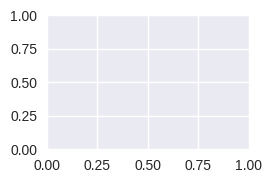

In [15]:
plt.figure(figsize=(12, 8))
for i in range(16):
    plt.subplot(4, 4, i+1)
    plt.hist(y_test[:, i], bins=50, alpha=0.5, label='True')
    plt.hist(y_pred[:, i], bins=50, alpha=0.5, label='Pred')
    plt.title(f'I_{i}')
    plt.legend()
plt.tight_layout()
plt.savefig('current_distribution.png')
plt.show()

## Run the RL


#### normalization

In [109]:
from sklearn.preprocessing import StandardScaler

# Fit scalers on your full dataset
pose_scaler = StandardScaler().fit(X_feat.values)
wrench_scaler = StandardScaler().fit(W.values)
current_scaler = StandardScaler().fit(I.values)


# Keep them for later use


#### GmmInverseenv

In [110]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.distributions import Normal
import gymnasium as gym
from gymnasium import spaces
from scipy.linalg import svd

class GammaInverseEnv(gym.Env):
    def __init__(self, X_feat, W, I, compute_gamma,
                 pose_scaler, wrench_scaler,
                 max_current=10.0, coil_weights=None):
        super(GammaInverseEnv, self).__init__()

        self.X_feat = X_feat
        self.W = W
        self.I = I
        self.compute_gamma = compute_gamma
        self.max_current = max_current

        self.pose_scaler = pose_scaler
        self.wrench_scaler = wrench_scaler

        self.n_samples = self.X_feat.shape[0]
        self.pose_dim = self.X_feat.shape[1]
        self.wrench_dim = self.W.shape[1]
        self.n_coils = I.shape[1]

        obs_dim = self.pose_dim + self.wrench_dim
        self.observation_space = spaces.Box(low=-np.inf, high=np.inf,
                                            shape=(obs_dim,), dtype=np.float32)
        self.action_space = spaces.Box(low=-max_current, high=max_current,
                                       shape=(self.n_coils,), dtype=np.float32)

        self.idx = 0

        # --- store coil weights (numpy) ---
        if coil_weights is not None:
            self.coil_weights = coil_weights.cpu().numpy()
        else:
            self.coil_weights = np.ones(self.n_coils, dtype=np.float32)

    def reset(self, seed=None, options=None):
        super().reset(seed=seed)
        self.idx = np.random.randint(0, self.n_samples)
        pose = self.X_feat.iloc[self.idx].values.astype(np.float32)
        wrench = self.W.iloc[self.idx].values.astype(np.float32)

        pose_norm = self.pose_scaler.transform(pose.reshape(1,-1))[0]
        wrench_norm = self.wrench_scaler.transform(wrench.reshape(1,-1))[0]
        obs = np.concatenate([pose_norm, wrench_norm]).astype(np.float32)
        
        return obs, {}

    def compute_null_space_corrected(self, Gamma):
        """Robust null space computation"""
        try:
            # SVD for null space
            U, s, Vt = np.linalg.svd(Gamma, full_matrices=True)
            
            # Determine rank and null space dimension
            tol = 1e-6 * max(Gamma.shape) * s[0]
            rank = np.sum(s > tol)
            null_dim = Gamma.shape[1] - rank
            
            if null_dim > 0:
                # Null space is the last null_dim columns of V
                null_space = Vt[rank:, :].T  # Shape: (16, null_dim)
                return null_space
            else:
                # Trivial null space
                return np.zeros((16, 1))
        except Exception as e:
            return np.zeros((16, 1))

    def step(self, action):
        # --- existing physics computation ---
        pose = self.X_feat.iloc[self.idx].values.astype(np.float32)
        wrench = self.W.iloc[self.idx].values.astype(np.float32)
        true_currents = self.I.iloc[self.idx].values.astype(np.float32)

        Gamma = self.compute_gamma(pose)
        if not isinstance(Gamma, np.ndarray):
            Gamma = Gamma.numpy()
        if Gamma.ndim == 3:
            Gamma = Gamma[0]

        W_out = Gamma @ action

        # --- WRENCH ERROR ---
        wrench_error_vec = W_out - wrench
        wrench_error_magnitude = np.linalg.norm(wrench_error_vec)

        # --- SUCCESS DETECTION ---
        r_success = 0.0
        is_successful = False
        
        # Check if wrench error is low enough
        if wrench_error_magnitude < 1.0:  # Sub-meter accuracy
            # Check current constraints
            max_current_violation = np.max(np.abs(action)) - 10.0
            if max_current_violation <= 0:  # Within limits
                # Check sign agreement (at least 80% of non-zero currents have correct sign)
                non_zero_mask = np.abs(true_currents) > 0.1
                if np.sum(non_zero_mask) > 0:  # If there are non-zero currents
                    sign_correct = np.sum(np.sign(action[non_zero_mask]) == np.sign(true_currents[non_zero_mask]))
                    sign_accuracy = sign_correct / np.sum(non_zero_mask)
                    if sign_accuracy >= 0.8:  # 80% sign accuracy
                        r_success = 100.0  # Big positive reward
                        is_successful = True
                else:
                    r_success = 50.0  # Good for zero-current cases
                    is_successful = True

        # --- PENALTIES (only if not successful) ---
        if not is_successful:
            # Severe wrench error penalties
            if wrench_error_magnitude > 100.0:
                r_wrench = -1000.0
            elif wrench_error_magnitude > 10.0:
                r_wrench = -100.0 * (wrench_error_magnitude / 10.0)
            else:
                r_wrench = -wrench_error_magnitude
                
            # Current limit violations
            max_current = np.max(np.abs(action))
            if max_current > 10.0:
                r_current_limit = -100.0 * (max_current - 10.0)
            else:
                r_current_limit = 0.0
                
            # Sign-sensitive imitation (weakened when close)
            def compute_sign_reward(pred, target):
                sign_agreement = np.where(np.sign(pred) == np.sign(target), 1.0, 0.0)
                sign_penalty = 20.0 * (1.0 - sign_agreement)  # Reduced from 50
                mag_penalty = 0.5 * np.abs(pred - target)     # Reduced from 1.0
                return -(sign_penalty + mag_penalty)
            
            r_imit = compute_sign_reward(action, true_currents)
            
            # Sparsity and null space penalties
            r_sparse = -0.1 * np.mean(np.abs(action))
            
            try:
                null_space = self.compute_null_space_corrected(Gamma)
                if null_space.shape[1] > 0:
                    action_projection = null_space.T @ action
                    null_space_penalty = np.sum(np.square(action_projection))
                    r_null = -5.0 * null_space_penalty  # Reduced penalty
                else:
                    r_null = 0.0
            except:
                r_null = 0.0
                
            # Total reward when not successful
            reward = r_wrench + r_current_limit + r_imit + r_sparse + r_null
        else:
            # Big positive reward when successful
            reward = r_success

        # Clip reward
        reward = np.clip(reward, -2000.0, 100.0)

        # --- ENSURE REWARD IS SCALAR ---
        # Convert to scalar (this was in the wrong place)
        if isinstance(reward, (np.ndarray, list, tuple)):
            if hasattr(reward, '__len__') and len(reward) > 0:
                reward = float(reward[0])  # Take first element
            else:
                reward = 0.0  # Fallback
        else:
            reward = float(reward)  # Ensure it's float

        # Diagnostic info
        if is_successful:
            print(f"✅ SUCCESS! Wrench error: {wrench_error_magnitude:.3f} N")

        # --- next observation ---
        pose_norm = self.pose_scaler.transform(pose.reshape(1, -1))[0]
        wrench_norm_obs = self.wrench_scaler.transform(wrench.reshape(1, -1))[0]
        next_obs = np.concatenate([pose_norm, wrench_norm_obs]).astype(np.float32)

        return next_obs, reward, True, False, {"true_currents": action}

In [111]:
# class GammaInverseEnv(gym.Env):
#     def __init__(self, X_feat, W, I, compute_gamma,
#                  pose_scaler, wrench_scaler,
#                  max_current=10.0, coil_weights=None):
#         super(GammaInverseEnv, self).__init__()
        
#         self.X_feat = X_feat
#         self.W = W
#         self.I = I
#         self.compute_gamma = compute_gamma
#         self.max_current = max_current

#         self.pose_scaler = pose_scaler
#         self.wrench_scaler = wrench_scaler
        
#         self.n_samples = self.X_feat.shape[0]
#         self.pose_dim = self.X_feat.shape[1]
#         self.wrench_dim = self.W.shape[1]
#         self.n_coils = I.shape[1]
        
#         obs_dim = self.pose_dim + self.wrench_dim
#         self.observation_space = spaces.Box(low=-np.inf, high=np.inf,
#                                             shape=(obs_dim,), dtype=np.float32)
#         self.action_space = spaces.Box(low=-max_current, high=max_current,
#                                        shape=(self.n_coils,), dtype=np.float32)
        
#         self.idx = 0

#         # --- store coil weights (numpy) ---
#         if coil_weights is not None:
#             self.coil_weights = coil_weights.cpu().numpy()
#         else:
#             self.coil_weights = np.ones(self.n_coils, dtype=np.float32)

#     def reset(self):
#         self.idx = np.random.randint(0, self.n_samples)
#         pose = self.X_feat.iloc[self.idx].values.astype(np.float32)
#         wrench = self.W.iloc[self.idx].values.astype(np.float32)
        
#         pose_norm = self.pose_scaler.transform(pose.reshape(1,-1))[0]
#         wrench_norm = self.wrench_scaler.transform(wrench.reshape(1,-1))[0]
#         return np.concatenate([pose_norm, wrench_norm]).astype(np.float32)

#     def step(self, action):
#         # --- raw values for physics ---
#         pose = self.X_feat.iloc[self.idx].values.astype(np.float32)
#         wrench = self.W.iloc[self.idx].values.astype(np.float32)
#         true_currents = self.I.iloc[self.idx].values.astype(np.float32)
    
#         # --- forward dynamics ---
#         Gamma = self.compute_gamma(pose)
#         if not isinstance(Gamma, np.ndarray):
#             Gamma = Gamma.numpy()
#         W_out = Gamma @ action
    
#         def huber_vec(x, delta=1e3):
#             abs_x = np.abs(x)
#             quad = 0.5 * np.square(x)
#             lin  = delta * (abs_x - 0.5 * delta)
#             return np.where(abs_x <= delta, quad, lin)

#         # --- 1. Wrench error (normalized, Huber) ---
#         err_vec = W_out - wrench        # shape (6,)
#         wrench_err = np.sum(huber_vec(err_vec, delta=1e3))
#         wrench_norm = np.linalg.norm(wrench, ord=2) + 1e-6  # L2 norm, not squared
#         r_wrench = -(wrench_err / wrench_norm)

#         # make sure coil_weights is stored in env as a numpy array
#         err_vec = action - true_currents
#         current_err = np.sum(self.coil_weights * np.square(err_vec))
#         current_norm = np.sum(self.coil_weights * (np.square(true_currents))) + 1e-6
#         r_imit = -(current_err / current_norm)
            
#         # --- 3. Penalty for "all-off" currents ---
#         eps = 1e-2
#         if np.max(np.abs(action)) < eps:
#             r_penalty = -1.0
#         else:
#             r_penalty = 0.0

#         r_sparse = -0.1 * np.mean(np.abs(action))

    
#         # --- Weighted total reward ---
#         reward = (
#             5.0 * r_wrench +      # Prioritize wrench accuracy
#             0.5 * r_imit +        # Downweight imitation
#             0.03 * r_penalty +
#             1.0 * r_sparse        # Maintain sparsity
#         )


#         reward = np.clip(reward, -500.0, 0.0)

    
#         # --- next observation (normalized for agent) ---
#         pose_norm = self.pose_scaler.transform(pose.reshape(1, -1))[0]
#         wrench_norm_obs = self.wrench_scaler.transform(wrench.reshape(1, -1))[0]
#         next_obs = np.concatenate([pose_norm, wrench_norm_obs]).astype(np.float32)
    
#         return next_obs, reward, True, {"true_currents": true_currents}
    


In [112]:
# class Actor(nn.Module):
#     def __init__(self, pose_dim, wrench_dim, n_coils):
#         super(Actor, self).__init__()
#         input_dim = pose_dim + wrench_dim   # NEW: now includes wrench too
#         self.fc1 = nn.Linear(input_dim, 256)
#         self.fc2 = nn.Linear(256, 256)
        
#         # output: 16×6 matrix flattened
#         self.fc_out = nn.Linear(256, n_coils * wrench_dim)
        
#         # log std for exploration (per matrix element)
#         self.log_std = nn.Parameter(torch.zeros(n_coils * wrench_dim))
        
#         self.n_coils = n_coils
#         self.wrench_dim = wrench_dim

#     def forward(self, pose, wrench):
#         # combine pose + wrench into one input
#         x = torch.cat([pose, wrench], dim=-1)
        
#         x = F.relu(self.fc1(x))
#         x = F.relu(self.fc2(x))
        
#         mean = self.fc_out(x)  # (batch, 96)
#         std = torch.exp(self.log_std).unsqueeze(0).expand_as(mean)
        
#         dist = Normal(mean, std)
#         z = dist.rsample()  # reparam trick
#         mat = z.view(-1, self.n_coils, self.wrench_dim)
        
#         # multiply matrix by wrench to get currents
#         currents = torch.einsum("bij,bj->bi", mat, wrench)
#         currents = torch.tanh(currents) * 10.0  # scale to [-10,10]
        
#         return currents, dist


In [113]:
# import torch
# import torch.nn as nn
# import torch.nn.functional as F
# from torch.distributions import Normal

# class ResidualBlock(nn.Module):
#     def __init__(self, dim: int):
#         super().__init__()
#         self.ln1 = nn.LayerNorm(dim)
#         self.fc1 = nn.Linear(dim, dim)
#         self.ln2 = nn.LayerNorm(dim)
#         self.fc2 = nn.Linear(dim, dim)

#     def forward(self, x):
#         h = self.fc1(F.gelu(self.ln1(x)))
#         h = self.fc2(F.gelu(self.ln2(h)))
#         return x + h

# class Actor(nn.Module):
#     """
#     Pose+Wrench -> Γ⁻¹(p,w) via low-rank factorization: U(16xr) @ V(6xr)^T + bias
#     Then currents = Γ⁻¹ * wrench, squashed to [-10, 10].
#     """
#     def __init__(self, pose_dim, wrench_dim, n_coils, rank_r=16, hidden=512, n_blocks=7):
#         super().__init__()
#         self.n_coils = n_coils          # 16
#         self.wrench_dim = wrench_dim    # 6
#         self.rank_r = rank_r

#         in_dim = pose_dim + wrench_dim

#         # deeper backbone
#         self.inp = nn.Linear(in_dim, hidden)
#         self.blocks = nn.ModuleList([ResidualBlock(hidden) for _ in range(n_blocks)])
#         self.out_ln = nn.LayerNorm(hidden)

#         # low-rank heads
#         self.head_U = nn.Linear(hidden, n_coils * rank_r)      # (16*r)
#         self.head_V = nn.Linear(hidden, wrench_dim * rank_r)   # (6*r)
#         # bias: per-coil + per-wrench (rank-2 bias)
#         self.head_b_coil   = nn.Linear(hidden, n_coils)        # (16,)
#         self.head_b_wrench = nn.Linear(hidden, wrench_dim)     # (6,)

#         # keep a matrix-space log_std so your existing SAC code path still works
#         self.log_std_mat = nn.Parameter(torch.full((n_coils * wrench_dim,), -1.0))

#     def forward(self, pose, wrench):
#         # concatenate normalized pose+wrench (as you already do)
#         x = torch.cat([pose, wrench], dim=-1)

#         h = F.gelu(self.inp(x))
#         for blk in self.blocks:
#             h = blk(h)
#         h = self.out_ln(h)

#         B = h.size(0)

#         U = self.head_U(h).view(B, self.n_coils, self.rank_r)         # (B,16,r)
#         V = self.head_V(h).view(B, self.wrench_dim, self.rank_r)      # (B,6,r)
#         b_coil   = self.head_b_coil(h).view(B, self.n_coils, 1)       # (B,16,1)
#         b_wrench = self.head_b_wrench(h).view(B, 1, self.wrench_dim)  # (B,1,6)

#         # Γ⁻¹ = U V^T + bias
#         mat_lr = torch.einsum('bir,bjr->bij', U, V)   # (B,16,6)
#         mat = mat_lr + b_coil + b_wrench              # (B,16,6)

#         # distribution over matrix (to keep your SAC code unchanged)
#         mean_flat = mat.view(B, -1)
#         std_flat  = torch.exp(self.log_std_mat).unsqueeze(0).expand_as(mean_flat)
#         dist = Normal(mean_flat, std_flat)

#         # currents = (Γ⁻¹ * wrench), THEN squash to [-10,10]
#         currents = torch.einsum('bij,bj->bi', mat, wrench)
#         currents = torch.tanh(currents) * 10.0

#         return currents, dist


#### Actor

In [114]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.distributions import Normal

class Actor(nn.Module):
    """
    Pose + Wrench -> 16 currents directly
    No matrix inversion, no low-rank factorization
    Just learns the mapping directly with physics enforcement in loss
    """
    def __init__(self, pose_dim, wrench_dim, n_coils, hidden=256):
        super().__init__()
        self.n_coils = n_coils
        
        # Simple neural network that maps inputs to 16 currents
        self.net = nn.Sequential(
            nn.Linear(pose_dim + wrench_dim, hidden),      # Input layer
            nn.ReLU(),                                     # Activation
            nn.Linear(hidden, hidden),                     # Hidden layer
            nn.ReLU(),                                     # Activation
            nn.Linear(hidden, hidden),                     # Hidden layer
            nn.ReLU(),                                     # Activation
            nn.Linear(hidden, n_coils),                    # Output layer (16 currents)
            nn.Tanh()                                      # Bounded output [-1, 1]
        )
        
        # For SAC compatibility - we need a distribution
        # We'll use the same log_std as before
        self.log_std = nn.Parameter(torch.full((n_coils,), -1.0))  # Per-coil log_std

    def forward(self, pose, wrench):
        """
        Input: pose (B,6), wrench (B,6)
        Output: currents (B,16), distribution
        """
        # Combine inputs
        x = torch.cat([pose, wrench], dim=-1)  # (B, 12)
        
        # Forward pass through network
        raw_currents = self.net(x)  # (B, 16) in [-1, 1]
        
        # Scale to [-10, 10] A
        currents = raw_currents * 10.0  # (B, 16)
        
        # Create distribution for SAC (needed for exploration)
        mean = currents
        std = torch.exp(self.log_std).unsqueeze(0).expand_as(mean)  # (B, 16)
        dist = Normal(mean, std)
        
        return currents, dist

#### Critic

In [115]:
class Critic(nn.Module):
    def __init__(self, pose_dim, wrench_dim, n_coils):
        super(Critic, self).__init__()
        input_dim = pose_dim + wrench_dim + n_coils
        self.fc1 = nn.Linear(input_dim, 256)
        self.fc2 = nn.Linear(256, 256)
        self.fc_out = nn.Linear(256, 1)

    def forward(self, pose, wrench, currents):

        
        x = torch.cat([pose, wrench, currents], dim=-1)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        result = self.fc_out(x)
        return result

#### ReplayBuffer

In [116]:
class ReplayBuffer:
    def __init__(self, max_size=100000):
        self.storage = []
        self.max_size = max_size
        self.ptr = 0

    def push(self, data):
        if len(self.storage) == self.max_size:
            self.storage[int(self.ptr)] = data
            self.ptr = (self.ptr + 1) % self.max_size
        else:
            self.storage.append(data)

    def sample(self, batch_size):
        ind = np.random.randint(0, len(self.storage), size=batch_size)
        states, actions, rewards, next_states, currents_true = [], [], [], [], []
        for i in ind:
            s, a, r, ns, it = self.storage[i]
            states.append(s)
            actions.append(a)
            rewards.append(float(r))  # Ensure r is scalar
            next_states.append(ns)
            currents_true.append(it)
        
        # Convert to tensors with proper shapes
        states_tensor = torch.tensor(np.array(states), dtype=torch.float32)      # (batch, 12)
        actions_tensor = torch.tensor(np.array(actions), dtype=torch.float32)    # (batch, 16)
        rewards_tensor = torch.tensor(rewards, dtype=torch.float32).unsqueeze(-1)  # (batch, 1) - FIXED!
        next_states_tensor = torch.tensor(np.array(next_states), dtype=torch.float32)  # (batch, 12)
        currents_true_tensor = torch.tensor(np.array(currents_true), dtype=torch.float32)  # (batch, 16)
        
        return (
            states_tensor,
            actions_tensor,
            rewards_tensor,
            next_states_tensor,
            currents_true_tensor
        )


#### coil weights

In [117]:
def make_coil_weights(I_df, alpha=1, clip=(1.0, 3.0), device='cpu'):
    I = I_df.values
    zero_rate = (np.abs(I) < 1e-6).mean(axis=0)   # per-coil fraction of zeros
    w = 1.0 + alpha * zero_rate                   # boost often-zero coils
    w = np.clip(w, clip[0], clip[1])
    return torch.tensor(w, dtype=torch.float32, device=device)


# ---- Build agent ----
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
coil_weights = make_coil_weights(I, alpha=0.6, clip=(1.0, 3.0), device=device)


In [118]:
# class SACAgent:
#     def __init__(self, pose_dim, wrench_dim, n_coils, device="cpu", gamma=0.99, tau=0.005, lr=1e-4, alpha=0.3, sup_weight=0.5, coil_weights=None):
#         self.device = device

#         self.actor = Actor(pose_dim, wrench_dim, n_coils).to(device)
#         self.critic1 = Critic(pose_dim, wrench_dim, n_coils).to(device)
#         self.critic2 = Critic(pose_dim, wrench_dim, n_coils).to(device)
#         self.critic1_target = Critic(pose_dim, wrench_dim, n_coils).to(device)
#         self.critic2_target = Critic(pose_dim, wrench_dim, n_coils).to(device)
#         self.critic1_target.load_state_dict(self.critic1.state_dict())
#         self.critic2_target.load_state_dict(self.critic2.state_dict())
        
#         self.actor_opt = optim.Adam(self.actor.parameters(), lr=lr)
#         self.critic1_opt = optim.Adam(self.critic1.parameters(), lr=lr)
#         self.critic2_opt = optim.Adam(self.critic2.parameters(), lr=lr)
        
#         self.gamma = gamma
#         self.tau = tau
#         self.alpha = alpha
#         self.sup_weight = sup_weight
#         self.coil_weights = coil_weights

#     def update(self, replay_buffer, batch_size=64):
#         states, actions, rewards, next_states, currents_true = replay_buffer.sample(batch_size)
        
#         # DEBUG: Check all shapes before processing

        
#         # FIX: Ensure rewards has correct shape
#         rewards = rewards.squeeze()
#         while rewards.dim() > 1:
#             rewards = rewards.squeeze()
#         if rewards.dim() == 0:
#             rewards = rewards.unsqueeze(0)
#         rewards = rewards.unsqueeze(-1)
        
        
#         states, actions, rewards, next_states, currents_true = (
#             states.to(self.device),
#             actions.to(self.device),
#             rewards.to(self.device),
#             next_states.to(self.device),
#             currents_true.to(self.device)
#         )

#         pose = states[:, :pose_dim]
#         wrench = states[:, pose_dim:]
#         pose_next = next_states[:, :pose_dim]
#         wrench_next = next_states[:, pose_dim:]
        
#         # --- Critic update ---
#         with torch.no_grad():
#             next_currents, next_dist = self.actor(pose_next, wrench_next)
#             next_sample = next_dist.rsample()
#             log_prob = next_dist.log_prob(next_sample).sum(dim=-1, keepdim=True)
            
            
#             target_q1 = self.critic1_target(pose_next, wrench_next, next_currents)
#             target_q2 = self.critic2_target(pose_next, wrench_next, next_currents)
            
#             target_q = torch.min(target_q1, target_q2) - self.alpha * log_prob
            
#             y = rewards + self.gamma * target_q
        
#         # --- Check critic outputs ---
#         q1 = self.critic1(pose, wrench, actions)
#         q2 = self.critic2(pose, wrench, actions)
        
        
#         # If shapes don't match, we have a problem
#         if q1.shape != y.shape:
#             print(f"❌ SHAPE MISMATCH! Q1: {q1.shape} vs Y: {y.shape}")
#             # Force them to match
#             y = y.expand_as(q1) if y.shape[0] == q1.shape[0] else y
        
#         critic1_loss = F.smooth_l1_loss(q1, y)
#         critic2_loss = F.smooth_l1_loss(q2, y)

#         self.critic1_opt.zero_grad()
#         critic1_loss.backward()
#         self.critic1_opt.step()
        
#         self.critic2_opt.zero_grad()
#         critic2_loss.backward()
#         self.critic2_opt.step()
        
#         # --- Actor update ---
#         currents_pred, dist = self.actor(pose, wrench)
#         log_prob = dist.log_prob(dist.rsample()).sum(dim=-1, keepdim=True)
#         q1_pi = self.critic1(pose, wrench, currents_pred)
#         q2_pi = self.critic2(pose, wrench, currents_pred)
#         q_pi = torch.min(q1_pi, q2_pi)

#         actor_loss = (self.alpha * log_prob - q_pi).mean()

#         # Add supervised term
#         sup_loss = F.mse_loss(currents_pred, currents_true)
#         actor_loss = actor_loss + self.sup_weight * sup_loss

#         self.actor_opt.zero_grad()
#         actor_loss.backward()
#         self.actor_opt.step()
        
#         # --- Soft target update ---
#         for target_param, param in zip(self.critic1_target.parameters(), self.critic1.parameters()):
#             target_param.data.copy_(self.tau * param.data + (1 - self.tau) * target_param.data)
#         for target_param, param in zip(self.critic2_target.parameters(), self.critic2.parameters()):
#             target_param.data.copy_(self.tau * param.data + (1 - self.tau) * target_param.data)

#### SACAgent

In [119]:
class SACAgent:
    def __init__(self, pose_dim, wrench_dim, n_coils, device="cpu", gamma=0.99, tau=0.005, lr=1e-4, alpha=0.3, sup_weight=0.5, coil_weights=None, physics_weight=1.0):
        self.device = device

        self.actor = Actor(pose_dim, wrench_dim, n_coils).to(device)
        self.critic1 = Critic(pose_dim, wrench_dim, n_coils).to(device)
        self.critic2 = Critic(pose_dim, wrench_dim, n_coils).to(device)
        self.critic1_target = Critic(pose_dim, wrench_dim, n_coils).to(device)
        self.critic2_target = Critic(pose_dim, wrench_dim, n_coils).to(device)
        self.critic1_target.load_state_dict(self.critic1.state_dict())
        self.critic2_target.load_state_dict(self.critic2.state_dict())
        
        self.actor_opt = optim.Adam(self.actor.parameters(), lr=lr)
        self.critic1_opt = optim.Adam(self.critic1.parameters(), lr=lr)
        self.critic2_opt = optim.Adam(self.critic2.parameters(), lr=lr)
        
        self.gamma = gamma
        self.tau = tau
        self.alpha = alpha
        self.sup_weight = sup_weight
        self.physics_weight = physics_weight  # New tunable weight
        self.coil_weights = coil_weights

    def update(self, replay_buffer, batch_size=64):
        states, actions, rewards, next_states, currents_true = replay_buffer.sample(batch_size)
        
        print("Starting update...")

        # FIX: Ensure rewards has correct shape
        rewards = rewards.squeeze()
        while rewards.dim() > 1:
            rewards = rewards.squeeze()
        if rewards.dim() == 0:
            rewards = rewards.unsqueeze(0)
        rewards = rewards.unsqueeze(-1)
        
        states, actions, rewards, next_states, currents_true = (
            states.to(self.device),
            actions.to(self.device),
            rewards.to(self.device),
            next_states.to(self.device),
            currents_true.to(self.device)
        )

        pose = states[:, :pose_dim]
        wrench = states[:, pose_dim:]
        pose_next = next_states[:, :pose_dim]
        wrench_next = next_states[:, pose_dim:]
        
        # --- Critic update (keep existing) ---
        with torch.no_grad():
            next_currents, next_dist = self.actor(pose_next, wrench_next)
            next_sample = next_dist.rsample()
            log_prob = next_dist.log_prob(next_sample).sum(dim=-1, keepdim=True)
            
            target_q1 = self.critic1_target(pose_next, wrench_next, next_currents)
            target_q2 = self.critic2_target(pose_next, wrench_next, next_currents)
            
            target_q = torch.min(target_q1, target_q2) - self.alpha * log_prob
            y = rewards + self.gamma * target_q
        
        q1 = self.critic1(pose, wrench, actions)
        q2 = self.critic2(pose, wrench, actions)
        critic1_loss = F.smooth_l1_loss(q1, y)
        critic2_loss = F.smooth_l1_loss(q2, y)

        self.critic1_opt.zero_grad()
        critic1_loss.backward()
        self.critic1_opt.step()
        
        self.critic2_opt.zero_grad()
        critic2_loss.backward()
        self.critic2_opt.step()
        
        # --- Actor update: ORIGINAL SAC + PHYSICS CONSTRAINTS ---
        currents_pred, dist = self.actor(pose, wrench)
        
        # ORIGINAL SAC LOSS
        log_prob = dist.log_prob(dist.rsample()).sum(dim=-1, keepdim=True)
        q1_pi = self.critic1(pose, wrench, currents_pred)
        q2_pi = self.critic2(pose, wrench, currents_pred)
        q_pi = torch.min(q1_pi, q2_pi)
        
        sac_loss = (self.alpha * log_prob - q_pi).mean()

        # Supervised loss (needed for computation below)
        sup_loss = F.mse_loss(currents_pred, currents_true)

        # ✅ SAMPLE-BASED PHYSICS LOSS (Your Idea!)
        physics_sample_size = min(16, batch_size)  # Only compute for 16 samples
        physics_indices = np.random.choice(batch_size, physics_sample_size, replace=False)
        
        physics_losses = []
        for i in physics_indices:
            
            pose_np = pose[i].cpu().detach().numpy()
            Gamma = env.compute_gamma(pose_np)
            if not isinstance(Gamma, np.ndarray):
                Gamma = Gamma.numpy()
            if Gamma.ndim == 3:
                Gamma = Gamma[0]
            
            pred_currents_np = currents_pred[i].cpu().detach().numpy()
            pred_wrench = Gamma @ pred_currents_np
            target_wrench = wrench[i].cpu().detach().numpy()
            
            physics_error = np.linalg.norm(pred_wrench - target_wrench)
            physics_losses.append(min(physics_error, 100.0))
        
        physics_loss = torch.tensor(np.mean(physics_losses), device=self.device, dtype=torch.float32)

        # Add physics loss with high weight (your "shock" idea")
        actor_loss = sac_loss + self.physics_weight * physics_loss + 0.01 * torch.mean(torch.abs(currents_pred)) + self.sup_weight * sup_loss   
        self.actor_opt.zero_grad()
        actor_loss.backward()
        self.actor_opt.step()
        
        # --- Soft target update ---
        for target_param, param in zip(self.critic1_target.parameters(), self.critic1.parameters()):
            target_param.data.copy_(self.tau * param.data + (1 - self.tau) * target_param.data)
        for target_param, param in zip(self.critic2_target.parameters(), self.critic2.parameters()):
            target_param.data.copy_(self.tau * param.data + (1 - self.tau) * target_param.data)

#### Train

In [120]:
def train_sac(env, agent, buffer_size=10000, batch_size=64, episodes=2000, start_steps=1000, updates_per_step=1):
    replay_buffer = ReplayBuffer(max_size=buffer_size)
    rewards_history = []

    # Warmup
    print("Warming up...")
    for i in range(min(start_steps, 1000)):
        state, _ = env.reset()
        action = np.random.uniform(-10, 10, size=16)
        next_state, reward, terminated, truncated, info = env.step(action)
        replay_buffer.push((state, action, reward, next_state, action))  # Use action as "true_currents"

    print("Starting training...")
    for ep in range(episodes):
        print(f"  Episode {ep+1}/{episodes}")

        state, _ = env.reset()
        ep_reward = 0

        # Take one step per episode (more efficient for your problem)
        pose = torch.tensor(state[:pose_dim], dtype=torch.float32, device=agent.device).unsqueeze(0)
        wrench = torch.tensor(state[pose_dim:], dtype=torch.float32, device=agent.device).unsqueeze(0)

        with torch.no_grad():
            currents, _ = agent.actor(pose, wrench)
        action = currents.cpu().numpy()[0]

        next_state, reward, terminated, truncated, info = env.step(action)
        replay_buffer.push((state, action, reward, next_state, action))

        ep_reward += reward

        if len(replay_buffer.storage) > batch_size:
            for _ in range(updates_per_step):
                agent.update(replay_buffer, batch_size)

        rewards_history.append(ep_reward)

        if (ep + 1) % 100 == 0:
            avg_reward = np.mean(rewards_history[-100:])
            print(f"Episode {ep+1}, Avg Reward: {avg_reward:.3f}")

    return rewards_history

Warming up...
Starting training...
  Episode 1/500
Starting update...
  Episode 2/500
Starting update...
  Episode 3/500
Starting update...
  Episode 4/500
Starting update...
  Episode 5/500
Starting update...
  Episode 6/500
Starting update...
  Episode 7/500
Starting update...
  Episode 8/500
Starting update...
  Episode 9/500
Starting update...
  Episode 10/500
Starting update...
  Episode 11/500
Starting update...
  Episode 12/500
Starting update...
  Episode 13/500
Starting update...
  Episode 14/500
Starting update...
  Episode 15/500
Starting update...
  Episode 16/500
Starting update...
  Episode 17/500
Starting update...
  Episode 18/500
Starting update...
  Episode 19/500
Starting update...
  Episode 20/500
Starting update...
  Episode 21/500
Starting update...
  Episode 22/500
Starting update...
  Episode 23/500
Starting update...
  Episode 24/500
Starting update...
  Episode 25/500
Starting update...
  Episode 26/500
Starting update...
  Episode 27/500
Starting update...
  

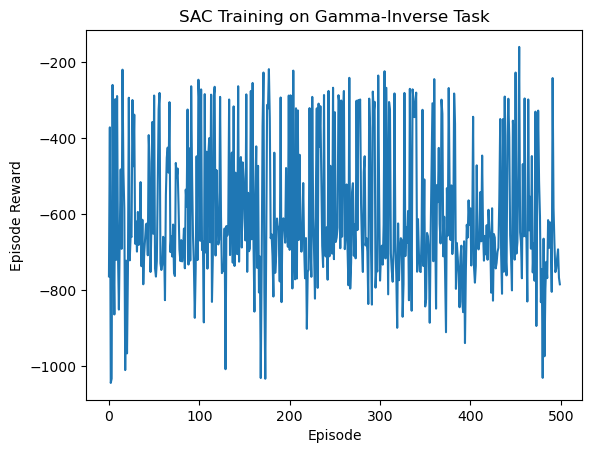

In [121]:
# ========================
# SAC Training for Gamma-Inverse Policy
# ========================

# ---- Define dimensions from your dataset ----
pose_dim = X_feat.shape[1]      # e.g. 6
wrench_dim = W.shape[1]         # should be 6
n_coils = 16

# ---- Build environment ----
# env = GammaInverseEnv(X_feat, W, I, compute_gamma, max_current=10.0)
env = GammaInverseEnv(
    X_feat, W, I,
    compute_gamma,
    pose_scaler, wrench_scaler,
    max_current=10.0,
    coil_weights=coil_weights   # <— pass it here
)



# ---- Build agent ----
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# In your training setup:
agent = SACAgent(pose_dim, wrench_dim, n_coils, device=device,
                 physics_weight=40.0,    # Adjust this: higher = more physics focus
                 sup_weight=0.5,        # Imitation weight
                 alpha=1.0)             # SAC entropy coefficient

# ---- Train ----
rewards_history = train_sac(env, agent,
                            buffer_size=5000,
                            batch_size=32,
                            episodes=500,
                            start_steps=1000,
                            updates_per_step=1)

# ---- Plot training curve ----
import matplotlib.pyplot as plt
plt.plot(rewards_history)
plt.xlabel("Episode")
plt.ylabel("Episode Reward")
plt.title("SAC Training on Gamma-Inverse Task")
plt.show()


## End of run of RL

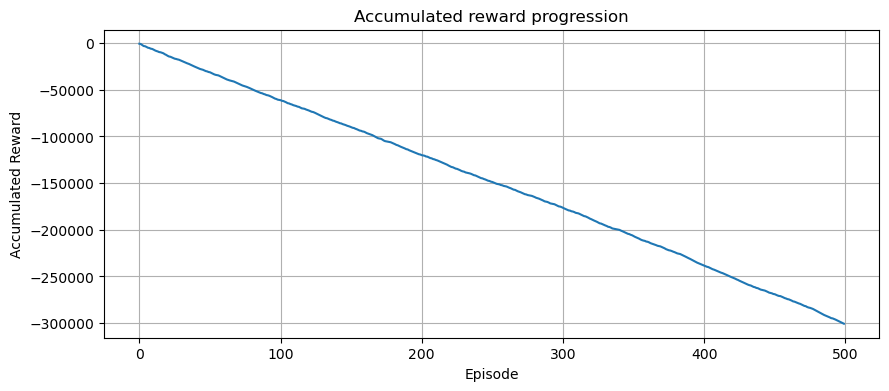

In [122]:
import matplotlib.pyplot as plt
import numpy as np

def plot_accumulated_reward(rewards_history):
    cumulative = np.cumsum(rewards_history)

    plt.figure(figsize=(10,4))
    plt.plot(cumulative)
    plt.xlabel("Episode")
    plt.ylabel("Accumulated Reward")
    plt.title("Accumulated reward progression")
    plt.grid(True)
    plt.show()


plot_accumulated_reward(rewards_history)


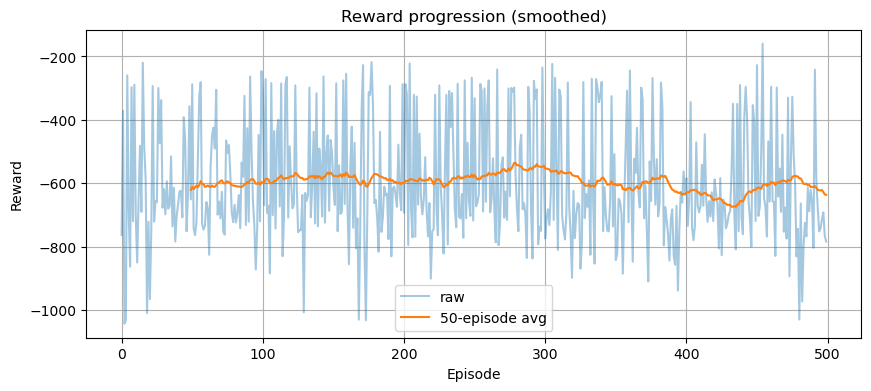

ValueError: expected sequence of length 12 at dim 1 (got 0)

In [123]:
import numpy as np
import matplotlib.pyplot as plt

def training_diagnostics(agent, env, rewards_history, n_eval=200):
    # --- 1. Plot moving average reward ---
    window = 50
    smoothed = np.convolve(rewards_history, np.ones(window)/window, mode="valid")
    plt.figure(figsize=(10,4))
    plt.plot(rewards_history, alpha=0.4, label="raw")
    plt.plot(range(window-1, len(rewards_history)), smoothed, label=f"{window}-episode avg")
    plt.xlabel("Episode")
    plt.ylabel("Reward")
    plt.title("Reward progression (smoothed)")
    plt.legend()
    plt.grid(True)
    plt.show()

    # --- 2. Distribution of wrench reproduction error ---
    errors = []
    for _ in range(n_eval):
        state = env.reset()
        pose = torch.tensor(state[:env.pose_dim], dtype=torch.float32, device=agent.device).unsqueeze(0)
        wrench = torch.tensor(state[env.pose_dim:], dtype=torch.float32, device=agent.device).unsqueeze(0)
        with torch.no_grad():
            pred_currents, _ = agent.actor(pose, wrench)
        pred_currents = pred_currents[0].cpu().numpy()
        Gamma = env.compute_gamma(state[:env.pose_dim])
        if not isinstance(Gamma, np.ndarray):
            Gamma = Gamma.numpy()
        W_out = Gamma @ pred_currents
        err = np.linalg.norm(W_out - state[env.pose_dim:])
        errors.append(err)
    plt.figure(figsize=(6,4))
    plt.hist(errors, bins=20)
    plt.xlabel("‖W_out - W‖ error norm")
    plt.ylabel("Frequency")
    plt.title("Distribution of wrench reproduction errors")
    plt.grid(True)
    plt.show()
    print(f"Mean wrench error: {np.mean(errors):.4f} ± {np.std(errors):.4f}")

    # --- 3. Predicted vs true currents scatter ---
    true_vals, pred_vals = [], []
    for _ in range(n_eval):
        idx = np.random.randint(0, env.n_samples)
        pose = torch.tensor(env.X_feat.iloc[idx].values.astype(np.float32), device=agent.device).unsqueeze(0)
        wrench = torch.tensor(env.W.iloc[idx].values.astype(np.float32), device=agent.device).unsqueeze(0)
        true_currents = env.I.iloc[idx].values.astype(np.float32)
        with torch.no_grad():
            pred_currents, _ = agent.actor(pose, wrench)
        pred_currents = pred_currents[0].cpu().numpy()
        true_vals.extend(true_currents)
        pred_vals.extend(pred_currents)
    plt.figure(figsize=(5,5))
    plt.scatter(true_vals, pred_vals, alpha=0.5)
    lims = [min(true_vals+pred_vals), max(true_vals+pred_vals)]
    plt.plot(lims, lims, "r--")
    plt.xlabel("True currents")
    plt.ylabel("Predicted currents")
    plt.title("True vs Predicted currents")
    plt.grid(True)
    plt.show()

    # --- 4. Coil activation histogram ---
    act_counts = np.zeros(env.n_coils)
    for _ in range(n_eval):
        state = env.reset()
        pose = torch.tensor(state[:env.pose_dim], dtype=torch.float32, device=agent.device).unsqueeze(0)
        wrench = torch.tensor(state[env.pose_dim:], dtype=torch.float32, device=agent.device).unsqueeze(0)
        with torch.no_grad():
            pred_currents, _ = agent.actor(pose, wrench)
        pred_currents = pred_currents[0].cpu().numpy()
        act_counts += (np.abs(pred_currents) > 1e-2).astype(int)
    plt.figure(figsize=(10,4))
    plt.bar(range(env.n_coils), act_counts)
    plt.xlabel("Coil index")
    plt.ylabel("Activation count (nonzero currents)")
    plt.title("Coil usage across evaluation samples")
    plt.show()

training_diagnostics(agent, env, rewards_history, n_eval=200)


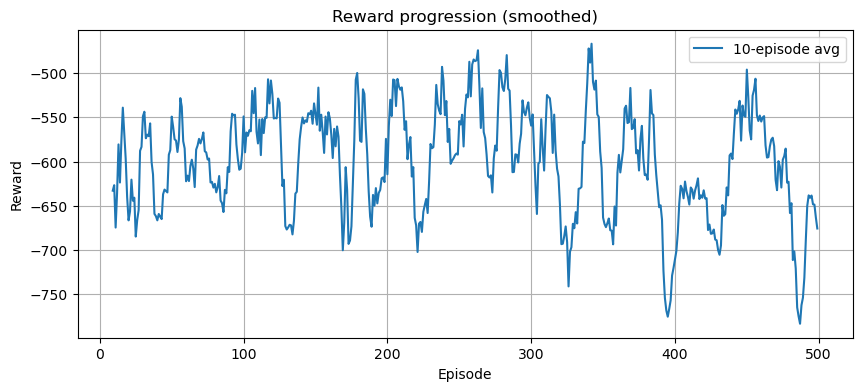

In [124]:
window = 10
smoothed = np.convolve(rewards_history, np.ones(window)/window, mode="valid")

plt.figure(figsize=(10,4))
plt.plot(range(window-1, len(rewards_history)), smoothed, label=f"{window}-episode avg")
plt.xlabel("Episode")
plt.ylabel("Reward")
plt.title("Reward progression (smoothed)")
plt.legend()
plt.grid(True)
plt.show()


In [78]:
import matplotlib.pyplot as plt
import numpy as np
import torch

def diagnostics_random_sample(agent, env):
    # --- pick a random index
    idx = np.random.randint(0, env.n_samples)
    pose = env.X_feat.iloc[idx].values.astype(np.float32)
    wrench = env.W.iloc[idx].values.astype(np.float32)
    true_currents = env.I.iloc[idx].values.astype(np.float32)

    pose_t = torch.tensor(pose, dtype=torch.float32, device=agent.device).unsqueeze(0)
    wrench_t = torch.tensor(wrench, dtype=torch.float32, device=agent.device).unsqueeze(0)

    with torch.no_grad():
        # actor forward pass → pred currents
        pred_currents, _ = agent.actor(pose_t, wrench_t)
        pred_currents = pred_currents[0].cpu().numpy()

        # reconstruct Γ⁻¹(p,w) explicitly from ActorLowRank
        x = torch.cat([pose_t, wrench_t], dim=-1)
        h = F.gelu(agent.actor.inp(x))
        for blk in agent.actor.blocks:
            h = blk(h)
        h = agent.actor.out_ln(h)

        U = agent.actor.head_U(h).view(1, agent.actor.n_coils, agent.actor.rank_r)
        V = agent.actor.head_V(h).view(1, agent.actor.wrench_dim, agent.actor.rank_r)
        b_coil   = agent.actor.head_b_coil(h).view(1, agent.actor.n_coils, 1)
        b_wrench = agent.actor.head_b_wrench(h).view(1, 1, agent.actor.wrench_dim)
        mat = (torch.einsum('bir,bjr->bij', U, V) + b_coil + b_wrench)[0].cpu().numpy()  # (16,6)

    # compute realized wrench from pred currents
    Gamma = env.compute_gamma(pose)
    if not isinstance(Gamma, np.ndarray):
        Gamma = Gamma.numpy()
    pred_wrench = Gamma @ pred_currents

    # --- Plotting ---
    fig, axs = plt.subplots(2, 2, figsize=(12, 8))

    # 1. Currents comparison
    axs[0,0].bar(np.arange(env.n_coils)-0.2, true_currents, width=0.4, label="True")
    axs[0,0].bar(np.arange(env.n_coils)+0.2, pred_currents, width=0.4, label="Pred")
    axs[0,0].set_title("Currents (True vs Pred)")
    axs[0,0].set_xlabel("Coil index")
    axs[0,0].set_ylabel("Current (A)")
    axs[0,0].legend()

    # 2. Wrench comparison
    # 2. Wrench comparison
    wrench = np.array(wrench).flatten()
    pred_wrench = np.array(pred_wrench).flatten()

    axs[0,1].bar(np.arange(env.wrench_dim)-0.2, wrench, width=0.4, label="Target")
    axs[0,1].bar(np.arange(env.wrench_dim)+0.2, pred_wrench, width=0.4, label="Pred")
    axs[0,1].set_title("Wrench (Target vs Pred)")
    axs[0,1].set_xlabel("Wrench dim")
    axs[0,1].legend()


    # 3. Gamma inverse heatmap
    im = axs[1,0].imshow(mat, cmap="bwr", aspect="auto")
    axs[1,0].set_title("Learned Γ⁻¹(p,w) matrix")
    axs[1,0].set_xlabel("Wrench dim (6)")
    axs[1,0].set_ylabel("Coil index (16)")
    fig.colorbar(im, ax=axs[1,0])

    # 4. Random placeholder (to illustrate multiple runs)
    axs[1,1].axis("off")
    axs[1,1].text(0.5, 0.5, f"Sample idx = {idx}", fontsize=14,
                  ha="center", va="center")

    plt.tight_layout()
    plt.show()


diagnostics_random_sample(agent, env)


AttributeError: 'Actor' object has no attribute 'inp'

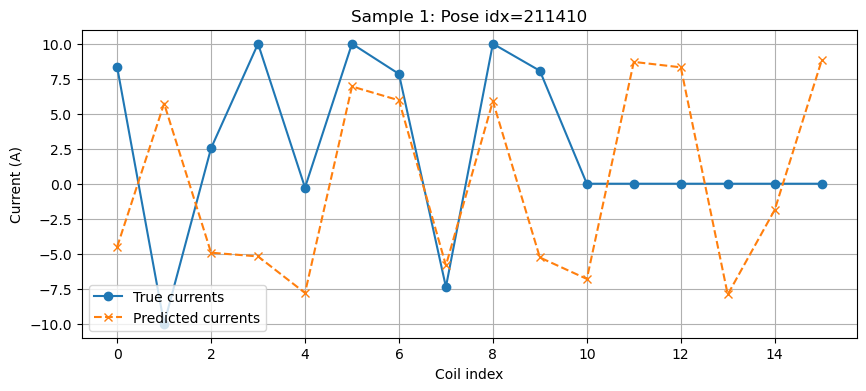

Sample 1 → Error norm: 36.0614


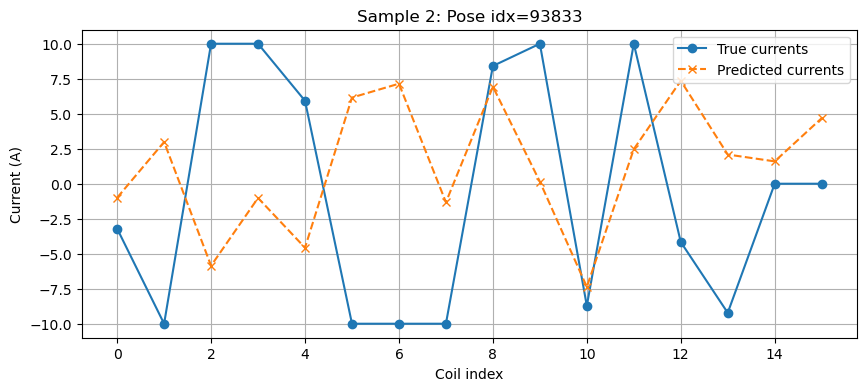

Sample 2 → Error norm: 41.5854


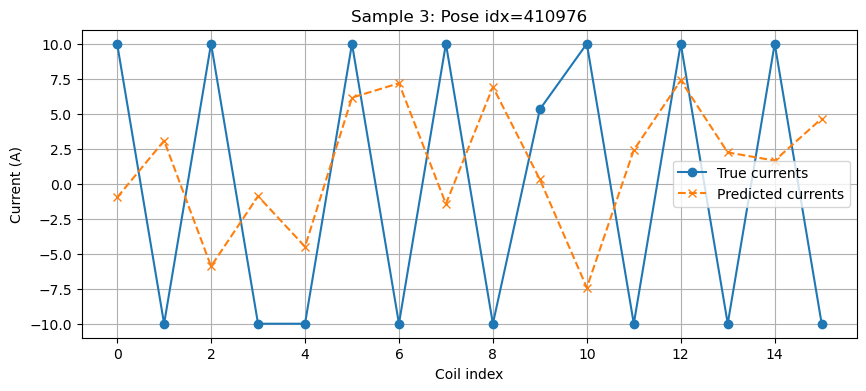

Sample 3 → Error norm: 48.0434


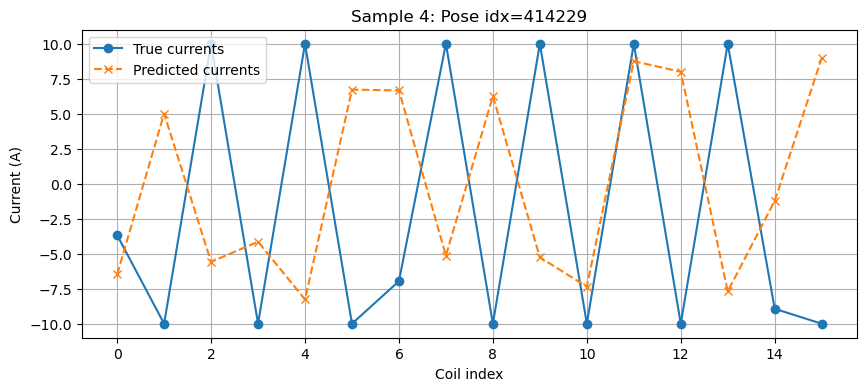

Sample 4 → Error norm: 55.6801


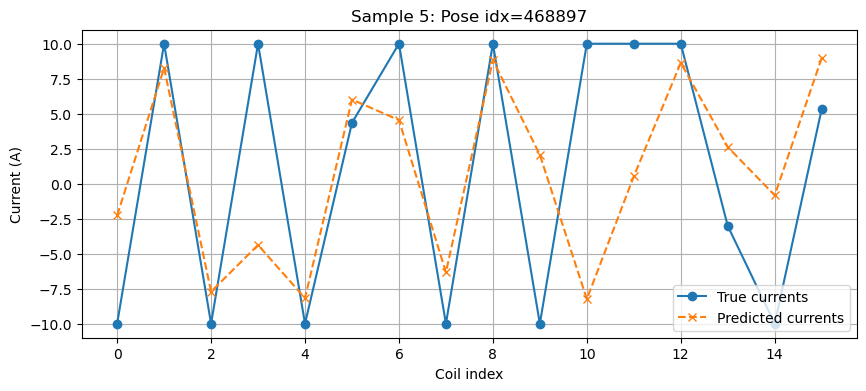

Sample 5 → Error norm: 32.0089


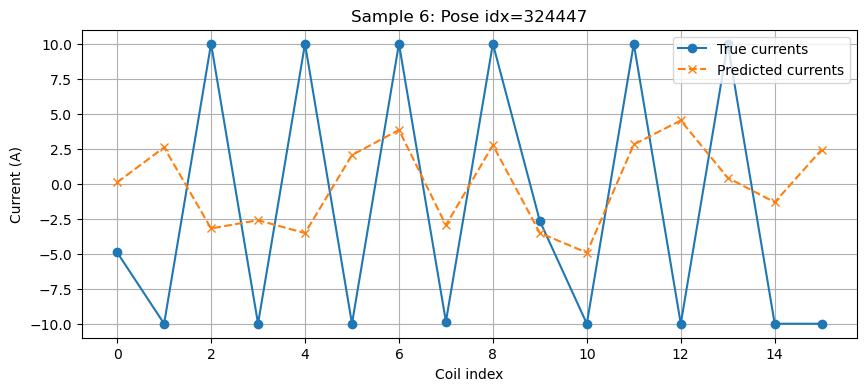

Sample 6 → Error norm: 38.5871


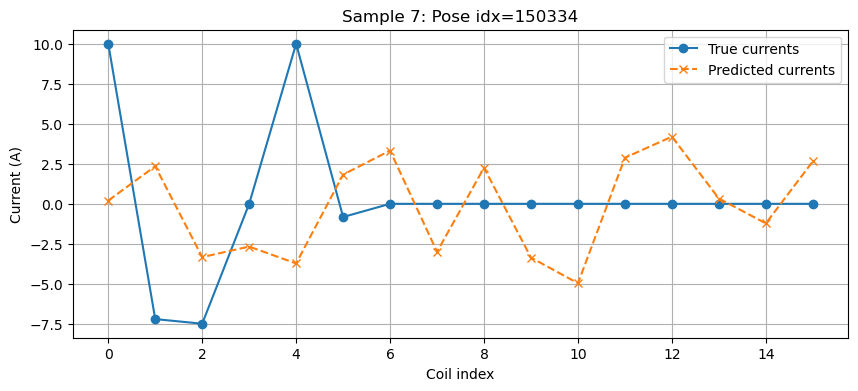

Sample 7 → Error norm: 22.4165


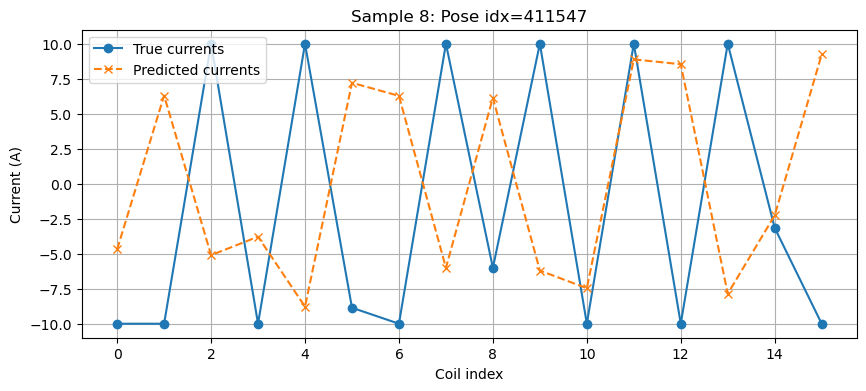

Sample 8 → Error norm: 56.0686


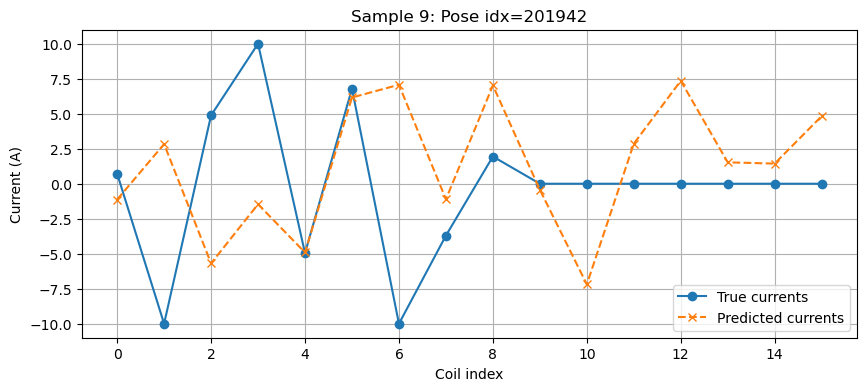

Sample 9 → Error norm: 29.6208


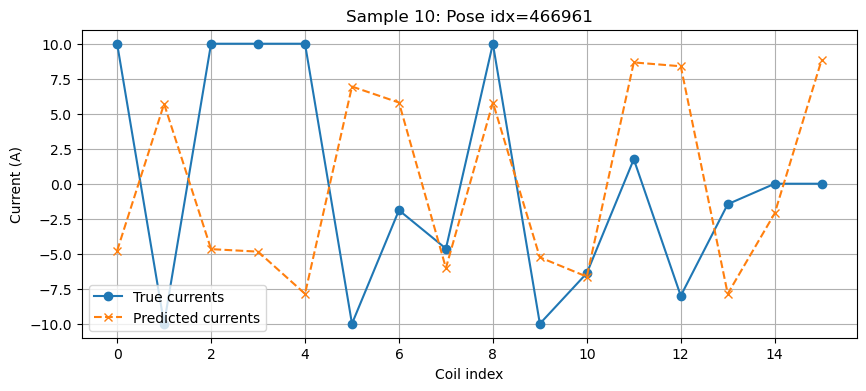

Sample 10 → Error norm: 45.2648


In [108]:
import matplotlib.pyplot as plt

def plot_currents_comparison(agent, env, n_samples=5):
    for i in range(n_samples):
        # pick a random sample from dataset
        idx = np.random.randint(0, env.n_samples)
        pose = torch.tensor(env.X_feat.iloc[idx].values.astype(np.float32), device=agent.device).unsqueeze(0)
        wrench = torch.tensor(env.W.iloc[idx].values.astype(np.float32), device=agent.device).unsqueeze(0)
        true_currents = env.I.iloc[idx].values.astype(np.float32)

        # predict with actor
        with torch.no_grad():
            pred_currents, _ = agent.actor(pose, wrench)
        pred_currents = pred_currents[0].cpu().numpy()

        # --- Plot ---
        plt.figure(figsize=(10,4))
        plt.plot(true_currents, "o-", label="True currents")
        plt.plot(pred_currents, "x--", label="Predicted currents")
        plt.title(f"Sample {i+1}: Pose idx={idx}")
        plt.xlabel("Coil index")
        plt.ylabel("Current (A)")
        plt.legend()
        plt.grid(True)
        plt.show()

        # print error norm for reference
        err = np.linalg.norm(pred_currents - true_currents)
        print(f"Sample {i+1} → Error norm: {err:.4f}")

plot_currents_comparison(agent, env, n_samples=10)


In [538]:
import matplotlib.pyplot as plt
import numpy as np

def performance_diagnostics(agent, env, n_eval=500):
    wrench_norms, error_norms = [], []
    error_per_dim = []

    for _ in range(n_eval):
        idx = np.random.randint(0, env.n_samples)
        pose = torch.tensor(env.X_feat.iloc[idx].values.astype(np.float32), device=agent.device).unsqueeze(0)
        wrench = torch.tensor(env.W.iloc[idx].values.astype(np.float32), device=agent.device).unsqueeze(0)

        with torch.no_grad():
            pred_currents, _ = agent.actor(pose, wrench)
        pred_currents = pred_currents[0].cpu().numpy()

        Gamma = env.compute_gamma(env.X_feat.iloc[idx].values.astype(np.float32))
        if not isinstance(Gamma, np.ndarray):
            Gamma = Gamma.numpy()
        W_out = Gamma @ pred_currents

        target = env.W.iloc[idx].values.astype(np.float32)
        error = W_out - target

        wrench_norms.append(np.linalg.norm(target))
        error_norms.append(np.linalg.norm(error))
        error_per_dim.append(error)

    error_per_dim = np.array(error_per_dim)

    # --- 1. Scatter of error vs wrench magnitude ---
    plt.figure(figsize=(6,5))
    plt.scatter(wrench_norms, error_norms, alpha=0.5)
    plt.xlabel("‖W target‖")
    plt.ylabel("‖W_out - W target‖ (error)")
    plt.title("Error magnitude vs. target wrench magnitude")
    plt.grid(True)
    plt.show()

    # --- 2. Histogram of target wrench magnitudes ---
    plt.figure(figsize=(6,4))
    plt.hist(wrench_norms, bins=30, alpha=0.7)
    plt.xlabel("‖W target‖")
    plt.ylabel("Frequency")
    plt.title("Distribution of target wrench magnitudes")
    plt.grid(True)
    plt.show()

    # --- 3. Boxplot of per-dimension errors ---
    plt.figure(figsize=(8,5))
    if error_per_dim.ndim == 1 or env.wrench_dim == 1:
        # Single wrench dimension → just plot one box
        plt.boxplot(error_per_dim, labels=["W1"])
    else:
        plt.boxplot([error_per_dim[:, i] for i in range(env.wrench_dim)],
                    labels=[f"W{i+1}" for i in range(env.wrench_dim)])
    plt.xlabel("Wrench dimension")
    plt.ylabel("Error (W_out - W)")
    plt.title("Per-dimension wrench error distribution")
    plt.grid(True)
    plt.show()
    
    


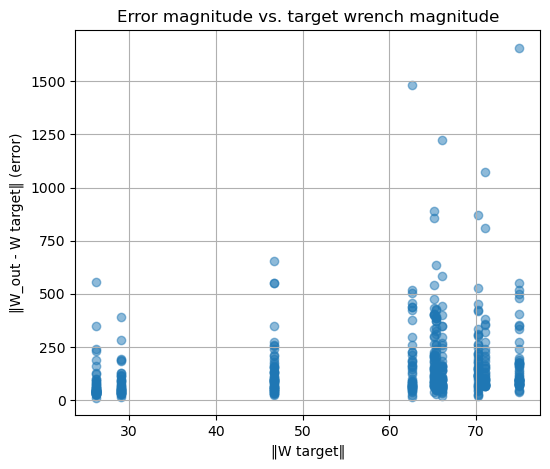

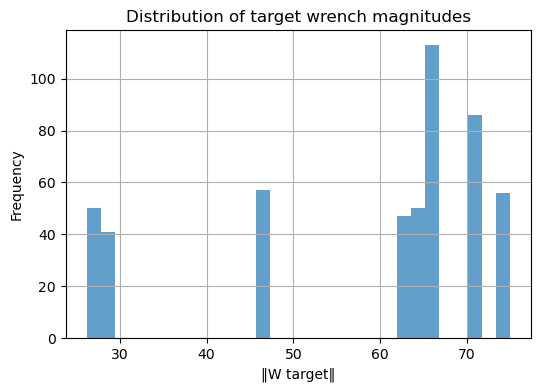

IndexError: index 1 is out of bounds for axis 1 with size 1

<Figure size 800x500 with 0 Axes>

In [539]:
performance_diagnostics(agent, env, n_eval=500)


## Keep other RLs away

In [41]:
import numpy as np
import tensorflow as tf
import gymnasium as gym
from gymnasium import spaces
from sklearn.preprocessing import StandardScaler

# ----------------------------
# Environment
# ----------------------------
class GammaInverseEnv(gym.Env):
    metadata = {"render_modes": []}

    def __init__(self, X_feat, W, W_out, max_current=10.0, episode_len=50):
        super().__init__()

        # Normalize poses once with StandardScaler
        self.scaler = StandardScaler()
        self.X_feat = self.scaler.fit_transform(X_feat)
        self.W      = np.asarray(W, dtype=np.float32)
        self.W_out  = np.asarray(W_out, dtype=np.float32)

        self.n_samples  = self.X_feat.shape[0]
        self.pose_dim   = self.X_feat.shape[1]   # usually 6
        self.wrench_dim = self.W.shape[1]        # 6
        self.n_coils    = 16

        # Spaces
        self.observation_space = spaces.Box(
            low=-np.inf, high=np.inf, shape=(self.pose_dim,), dtype=np.float32
        )
        self.action_space = spaces.Box(
            low=-max_current, high=max_current, shape=(self.n_coils,), dtype=np.float32
        )

        # Episode settings
        self.episode_len = episode_len
        self.t = 0
        self.ptr = 0
        self.desired_wrench = None

    def reset(self, seed=None, options=None):
        super().reset(seed=seed)
        self.ptr = np.random.randint(0, self.n_samples)
        self.desired_wrench = self.W[self.ptr]
        self.t = 0
        obs = self.X_feat[self.ptr]
        return obs.astype(np.float32), {}

    def step(self, action):
        pose_tf   = tf.convert_to_tensor(self.X_feat[self.ptr][None, :], dtype=tf.float32)
        action_tf = tf.convert_to_tensor(action[None, :], dtype=tf.float32)
    
        Gamma = compute_gamma(pose_tf)
        w_out = tf.matmul(Gamma, tf.expand_dims(action_tf, -1))
        w_out = tf.squeeze(w_out, axis=[0, -1]).numpy()
    
        # reward vs desired wrench
        err = self.desired_wrench - w_out
        reward = -float(np.sum(err**2)) / 1e12
    
        # advance to next sample so obs actually changes
        self.ptr = np.random.randint(0, self.n_samples)
        self.desired_wrench = self.W[self.ptr]
    
        self.t += 1
        terminated = self.t >= self.episode_len
    
        obs = self.X_feat[self.ptr]
        info = {"w_out": w_out, "target": self.desired_wrench}
        return obs.astype(np.float32), reward, terminated, False, info

    def render(self):
        pass

    def close(self):
        pass


In [44]:
import gymnasium as gym
from stable_baselines3 import SAC
from stable_baselines3.common.callbacks import EvalCallback
import numpy as np

# -----------------------
# 1. Wrap your environment
# -----------------------
# --- normalize before env ---
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_feat_norm = scaler.fit_transform(X_feat)

# use normalized features in env
env = GammaInverseEnv(X_feat_norm, W, W_out, max_current=10.0)
eval_env = GammaInverseEnv(X_feat_norm, W, W_out, max_current=10.0)


# Gymnasium → SB3 compatibility wrapper
env = gym.wrappers.TimeLimit(env, max_episode_steps=100)

# -----------------------
# 2. Define SAC model
# -----------------------
model = SAC(
    policy="MlpPolicy",
    env=env,
    learning_rate=3e-4,
    buffer_size=100000,   # replay buffer
    batch_size=256,
    tau=0.005,
    gamma=0.99,
    train_freq=1,
    gradient_steps=1000,
    ent_coef="auto",      # entropy coefficient auto-tuned
    policy_kwargs=dict(
        net_arch=[512, 256, 128]  # actor-critic NN layers
    ),
    verbose=2,
    device="cuda"   # use GPU
)

# -----------------------
# 3. Setup evaluation
# -----------------------
eval_env = GammaInverseEnv(X_feat, W, W_out, max_current=10.0)
eval_env = gym.wrappers.TimeLimit(eval_env, max_episode_steps=100)

eval_callback = EvalCallback(
    eval_env,
    best_model_save_path="./logs/",
    log_path="./logs/",
    eval_freq=5000,
    deterministic=True,
    render=False
)

# -----------------------
# 4. Train the agent
# -----------------------
model.learn(
    total_timesteps=150,  # increase if needed
    callback=eval_callback,
    log_interval=1
)

# -----------------------
# 5. Save trained agent
# -----------------------
model.save("sac_gamma_inverse")


Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 50        |
|    ep_rew_mean     | -4.26e+04 |
| time/              |           |
|    episodes        | 1         |
|    fps             | 14        |
|    time_elapsed    | 3         |
|    total_timesteps | 50        |
----------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 50        |
|    ep_rew_mean     | -4.41e+04 |
| time/              |           |
|    episodes        | 2         |
|    fps             | 15        |
|    time_elapsed    | 6         |
|    total_timesteps | 100       |
----------------------------------


KeyboardInterrupt: 

In [41]:
import torch
print(torch.__version__)
print(torch.version.cuda)
print(torch.cuda.is_available())
print(torch.cuda.get_device_name(0))


AttributeError: partially initialized module 'torch' has no attribute 'version' (most likely due to a circular import)

In [1]:
import torch
print(torch.__version__)
print(torch.version.cuda)
print(torch.cuda.is_available())
print(torch.cuda.get_device_name(0))


2.5.1+cu121
12.1
True
NVIDIA GeForce RTX 3050 Laptop GPU


# Other things before

In [34]:
import tensorflow as tf
from tensorflow.keras import layers, Model, regularizers

pose_dim   = X_feat.shape[1]   # number of pose features
wrench_dim = W.shape[1]        # should be 6
n_coils    = I.shape[1]        # should be 16
# low-rank dimension (hyperparameter)
rank_r = 16   # can try 8, 16, 32 ...


pose_in   = layers.Input(shape=(pose_dim,), name="pose_input")
wrench_in = layers.Input(shape=(wrench_dim,), name="wrench_input")


# --- Inputs ---
pose_in   = layers.Input(shape=(pose_dim,), name="pose_input")
wrench_in = layers.Input(shape=(wrench_dim,), name="wrench_input")

# --- Pose encoder (deep) ---
x = layers.Dense(512, activation="gelu", kernel_regularizer=regularizers.l2(1e-6))(pose_in)
x = layers.BatchNormalization()(x)
x = layers.Dense(512, activation="gelu", kernel_regularizer=regularizers.l2(1e-6))(x)
x = layers.BatchNormalization()(x)
x = layers.Dense(256, activation="gelu", kernel_regularizer=regularizers.l2(1e-6))(x)
x = layers.Dense(128, activation="gelu", kernel_regularizer=regularizers.l2(1e-6))(x)
x = layers.Dense(64, activation="gelu", kernel_regularizer=regularizers.l2(1e-6))(x)


# --- Low-rank factor outputs ---
U_flat = layers.Dense(n_coils * rank_r, name="U_out")(x)
V_flat = layers.Dense(rank_r * wrench_dim, name="V_out")(x)

U = layers.Reshape((n_coils, rank_r), name="U_matrix")(U_flat)
V = layers.Reshape((rank_r, wrench_dim), name="V_matrix")(V_flat)

# --- Construct A(p) ---
A = layers.Lambda(lambda uv: tf.matmul(uv[0], uv[1]),
                  output_shape=(n_coils, wrench_dim),
                  name="A_matrix")([U, V])

# --- Predict currents ---
wrench_exp = layers.Lambda(lambda w: tf.expand_dims(w, -1),
                           output_shape=(wrench_dim,1),
                           name="wrench_expand")(wrench_in)

I_pred = layers.Lambda(lambda x: tf.matmul(x[0], x[1]),
                       output_shape=(n_coils,1),
                       name="I_matmul")([A, wrench_exp])

I_pred = layers.Lambda(lambda i: tf.squeeze(i, -1),
                       output_shape=(n_coils,),
                       name="I_squeezed")(I_pred)

I_pred = layers.Lambda(lambda i: 10.0 * tf.tanh(i),
                       output_shape=(n_coils,),
                       name="currents_pred")(I_pred)

# --- Forward physics Γ(p) ---
Gamma = layers.Lambda(lambda p: compute_gamma(p),
                      output_shape=(6,n_coils),
                      name="Gamma_matrix")(pose_in)

I_exp = layers.Lambda(lambda i: tf.expand_dims(i, -1),
                      output_shape=(n_coils,1),
                      name="I_expand")(I_pred)

W_pred = layers.Lambda(lambda x: tf.matmul(x[0], x[1]),
                       output_shape=(6,1),
                       name="W_matmul")([Gamma, I_exp])

W_pred = layers.Lambda(lambda w: tf.squeeze(w, -1),
                       output_shape=(6,),
                       name="wrench_pred")(W_pred)

# --- Model ---
model = Model(inputs=[pose_in, wrench_in],
              outputs=[I_pred, W_pred],
              name="GammaInversePhysicsNet")

model.summary()


Model: "GammaInversePhysicsNet"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ pose_input          │ (None, 6)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 512)       │      3,584 │ pose_input[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 512)       │      2,048 │ dense[0][0]       │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 512)       │    262,656 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 512)       │      2,048 │ dense_1[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 256)       │    131,328 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_3 (Dense)     │ (None, 128)       │     32,896 │ dense_2[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_4 (Dense)     │ (None, 64)        │      8,256 │ dense_3[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ U_out (Dense)       │ (None, 256)       │     16,640 │ dense_4[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ V_out (Dense)       │ (None, 96)        │      6,240 │ dense_4[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ U_matrix (Reshape)  │ (None, 16, 16)    │          0 │ U_out[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ V_matrix (Reshape)  │ (None, 16, 6)     │          0 │ V_out[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ wrench_input        │ (None, 6)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ A_matrix (Lambda)   │ (None, 16, 6)     │          0 │ U_matrix[0][0],   │
│                     │                   │            │ V_matrix[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ wrench_expand       │ (None, 6, 1)      │          0 │ wrench_input[0][… │
│ (Lambda)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ I_matmul (Lambda)   │ (None, 16, 1)     │          0 │ A_matrix[0][0],   │
│                     │                   │            │ wrench_expand[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ I_squeezed (Lambda) │ (None, 16)        │          0 │ I_matmul[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ currents_pred       │ (None, 16)        │          0 │ I_squeezed[0][0]  │
│ (Lambda)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Gamma_matrix        │ (None, 6, 16)     │          0 │ pose_input[0][0]  │
│ (Lambda)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ I_expand (Lambda)   │ (None, 16, 1)     │          0 │ currents_pred[0]… │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 465,696 (1.78 MB)

 Trainable params: 463,648 (1.77 MB)

 Non-trainable params: 2,048 (8.00 KB)

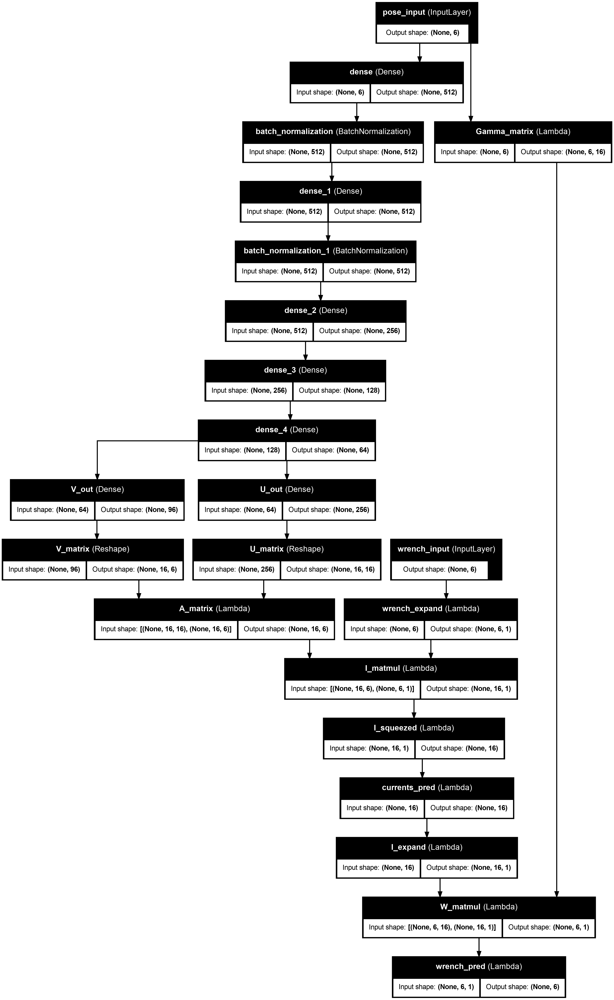

In [35]:
from tensorflow.keras.utils import plot_model

plot_model(
    model,
    to_file="model_structure10.png",
    show_shapes=True,
    show_layer_names=True,
    expand_nested=True,
    dpi=240
)


In [38]:
W_out

array([[-3.01587677e+00,  1.69033208e+01,  5.73525992e+01,
         2.00740743e+00,  1.84917647e-01, -1.24027631e+00],
       [ 1.71768131e+00,  3.66277700e+01,  3.85289768e+00,
         7.42816085e-01,  1.81312828e-01,  2.16042451e-01],
       [ 8.34677636e+00, -1.12472683e+00,  2.00919230e+00,
        -1.20779712e+00,  6.17948601e-01, -3.61195423e-01],
       ...,
       [-5.77306248e+00,  1.36639840e+01,  6.68855193e+01,
        -6.18786153e+00,  4.18683924e-01, -4.21409988e-02],
       [ 1.80015818e+01,  6.18502954e+00,  1.52180386e+01,
         1.04696425e+00,  6.03827537e+00, -8.15177694e+00],
       [-1.42723876e+01,  1.12932010e+01, -6.28735996e+01,
        -3.92452515e+00,  4.22720794e+00, -1.75425182e+00]])

In [39]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import numpy as np

# --- Split first ---
(Xp_tr_raw, Xp_va_raw,
 Xw_tr_raw, Xw_va_raw,
 Ic_tr_raw, Ic_va_raw,
 Wo_tr_raw, Wo_va_raw) = train_test_split(
    X_feat.values.astype("float32"),
    W.values.astype("float32"),
    I.values.astype("float32"),
    W_out.astype("float32"),
    test_size=0.1, random_state=42, shuffle=True
)

# --- Pose scaler (z-score) ---
scaler_pose = StandardScaler().fit(Xp_tr_raw)
Xp_tr = scaler_pose.transform(Xp_tr_raw)
Xp_va = scaler_pose.transform(Xp_va_raw)

# --- Desired wrench scaler (z-score) ---
scaler_wrench = StandardScaler().fit(Xw_tr_raw)
Xw_tr = scaler_wrench.transform(Xw_tr_raw)
Xw_va = scaler_wrench.transform(Xw_va_raw)

# --- Currents (no scaling, keep physical range [-10,10]) ---
Ic_tr = Ic_tr_raw   # used only for inspection, not training loss
Ic_va = Ic_va_raw

# --- Realized wrench scaler (z-score) ---
scaler_wrench_out = StandardScaler().fit(Wo_tr_raw)
Wo_tr = scaler_wrench_out.transform(Wo_tr_raw)
Wo_va = scaler_wrench_out.transform(Wo_va_raw)

# --- Final inputs/targets ---
train_inputs  = [Xp_tr, Xw_tr]
train_targets = {"currents_pred": Ic_tr, "wrench_pred": Wo_tr}

val_inputs  = [Xp_va, Xw_va]
val_targets = {"currents_pred": Ic_va, "wrench_pred": Wo_va}


In [52]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.optimizers.schedules import ExponentialDecay
import tensorflow as tf

# --- Learning rate schedule ---
lr_schedule = ExponentialDecay(
    initial_learning_rate=1e-3,  # start high for exploration
    decay_steps=5000,
    decay_rate=0.96,
    staircase=True
)

# --- Dynamic weight for wrench loss ---
wrench_weight = tf.Variable(0.0, trainable=False, dtype=tf.float32)

# --- Base MSE loss ---
def mse_loss(y_true, y_pred):
    return tf.reduce_mean(tf.square(y_true - y_pred))

# --- Weighted wrench loss ---
def weighted_mse_wrench(y_true, y_pred):
    return wrench_weight * mse_loss(y_true, y_pred)

# --- Anti-collapse penalty for currents (no ground truth needed) ---
def anti_collapse_loss(y_true, y_pred, penalty_factor=50.0, eps=1e-6):
    # No supervision → ignore y_true, only penalize degenerate predictions
    norms = tf.norm(y_pred, axis=-1)  # (batch,)
    penalty = penalty_factor * tf.reduce_mean(tf.exp(-norms + eps))
    return penalty

# --- Optimizer ---
optimizer = Adam(learning_rate=lr_schedule)

# --- Compile model ---
model.compile(
    optimizer=optimizer,
    loss={
        "currents_pred": anti_collapse_loss,   # only penalty
        "wrench_pred":  weighted_mse_wrench,   # supervised
    },
    metrics={
        "wrench_pred": ["mae"],   # track wrench error
    }
)


In [53]:
class WrenchWeightAnnealer(tf.keras.callbacks.Callback):
    def __init__(self, start_after=10, factor=0.05, every=5, max_wrench=1.0):
        super().__init__()
        self.start_after = start_after
        self.factor = factor
        self.every = every
        self.max_wrench = max_wrench

    def on_epoch_end(self, epoch, logs=None):
        if epoch+1 <= self.start_after:
            wrench_weight.assign(1e-2)
            print(f"[Annealer] Epoch {epoch+1}: wrench_weight held at 1e-6")
            return

        if (epoch+1 - self.start_after) % self.every == 0:
            new_val = min(wrench_weight.numpy() + self.factor, self.max_wrench)
            wrench_weight.assign(new_val)
            print(f"[Annealer] Epoch {epoch+1}: wrench_weight updated → {new_val:.3f}")


In [54]:
annealer = WrenchWeightAnnealer(start_after=10, factor=0.1, every=10)

history = model.fit(
    train_inputs, train_targets,
    validation_data=(val_inputs, val_targets),
    epochs=50,
    batch_size=512,
    callbacks=[annealer],
    verbose=1
)


Epoch 1/50
  70/1386 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - currents_pred_loss: 23.9077 - loss: 23.9134 - wrench_pred_loss: 0.0000e+00 - wrench_pred_mae: 351373.0312

2025-08-27 15:41:40.480435: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'input_clamp_reduce_fusion', 8 bytes spill stores, 8 bytes spill loads



1386/1386 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - currents_pred_loss: 3.0322 - loss: 3.0353 - wrench_pred_loss: 0.0000e+00 - wrench_pred_mae: 8767552.0000

2025-08-27 15:41:51.944525: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'input_clamp_reduce_fusion', 8 bytes spill stores, 8 bytes spill loads

2025-08-27 15:41:59.963564: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_5', 8 bytes spill stores, 24 bytes spill loads



[Annealer] Epoch 1: wrench_weight held at 1e-6
1386/1386 ━━━━━━━━━━━━━━━━━━━━ 38s 20ms/step - currents_pred_loss: 0.6135 - loss: 0.6156 - wrench_pred_loss: 0.0000e+00 - wrench_pred_mae: 11091944.0000 - val_currents_pred_loss: 4.6796e-14 - val_loss: 8.3622e-04 - val_wrench_pred_loss: 0.0000e+00 - val_wrench_pred_mae: 12858849.0000
Epoch 2/50
  46/1386 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - currents_pred_loss: 1.5009 - loss: 2601739091968.0000 - wrench_pred_loss: 2601739091968.0000 - wrench_pred_mae: 6591462.5000      

2025-08-27 15:42:07.792732: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_6', 4 bytes spill stores, 12 bytes spill loads



1364/1386 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - currents_pred_loss: 33.6442 - loss: 221598924800.0000 - wrench_pred_loss: 221598924800.0000 - wrench_pred_mae: 652364.0000[Annealer] Epoch 2: wrench_weight held at 1e-6
1386/1386 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - currents_pred_loss: 40.5055 - loss: 39019737088.0000 - wrench_pred_loss: 39014785024.0000 - wrench_pred_mae: 143983.2500 - val_currents_pred_loss: 44.7533 - val_loss: 8373814.0000 - val_wrench_pred_loss: 8373563.0000 - val_wrench_pred_mae: 13528.7217
Epoch 3/50
1366/1386 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - currents_pred_loss: 45.0993 - loss: 6756014.0000 - wrench_pred_loss: 6755971.0000 - wrench_pred_mae: 11936.0654[Annealer] Epoch 3: wrench_weight held at 1e-6
1386/1386 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - currents_pred_loss: 45.4218 - loss: 5239871.0000 - wrench_pred_loss: 5239439.5000 - wrench_pred_mae: 10425.3828 - val_currents_pred_loss: 45.9657 - val_loss: 2660495.2500 - val_wrench_pred_loss: 2660380.0000 - val_wrench_pred_mae: 

In [55]:
sample_pose = X_feat.values[:8].astype("float32")
sample_wrench = W.values[:8].astype("float32")

I_pred, W_pred = model([sample_pose, sample_wrench], training=False)

print("I_pred max:", tf.reduce_max(tf.abs(I_pred)).numpy())
print("W_pred max:", tf.reduce_max(tf.abs(W_pred)).numpy())


I_pred max: 0.00018578184
W_pred max: 0.0024576567


In [85]:
sample_pose = X_feat.values[:4].astype("float32")
sample_wrench = W.values[:4].astype("float32")

I_test, W_test = model([sample_pose, sample_wrench], training=False)
print("Max current:", tf.reduce_max(tf.abs(I_test)).numpy())
print("Max wrench:", tf.reduce_max(tf.abs(W_test)).numpy())


Max current: 8.1433234e-07
Max wrench: 5.6699664e-06


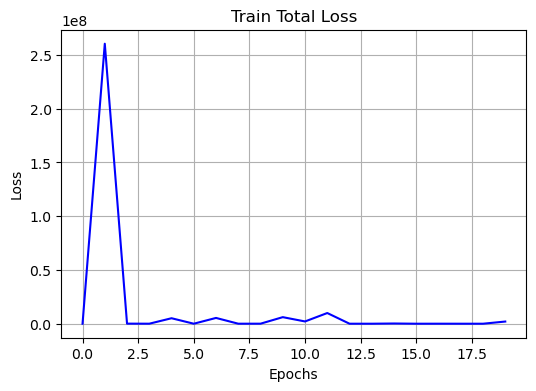

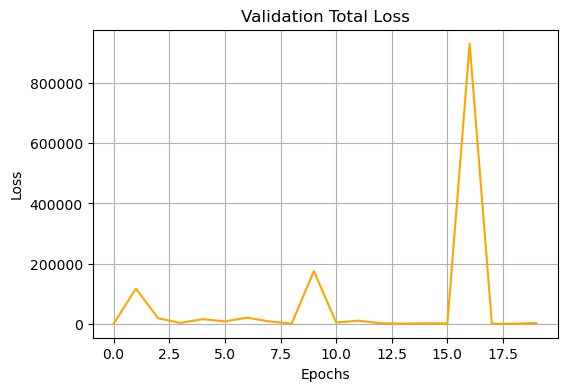

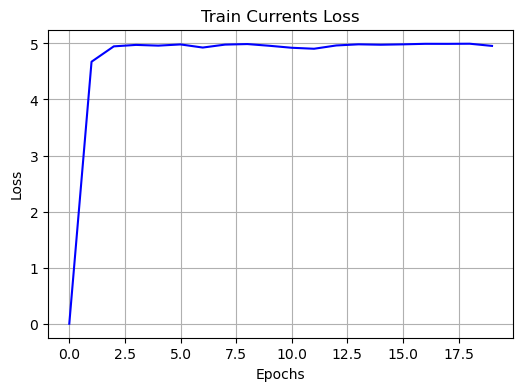

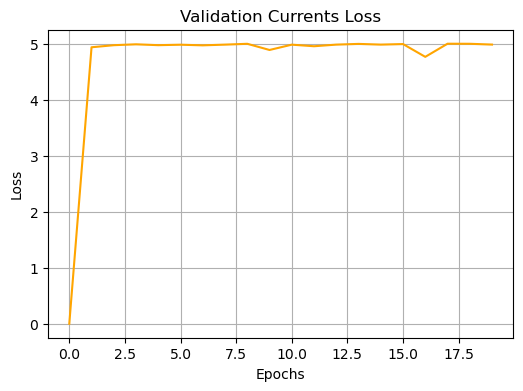

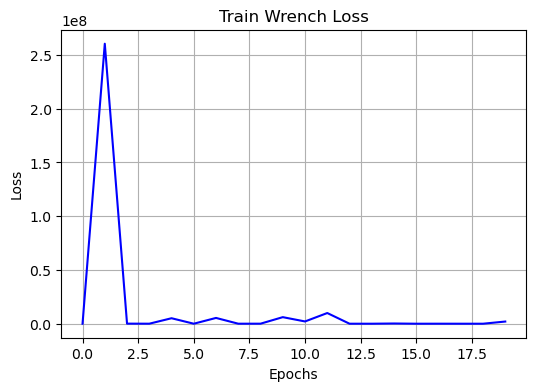

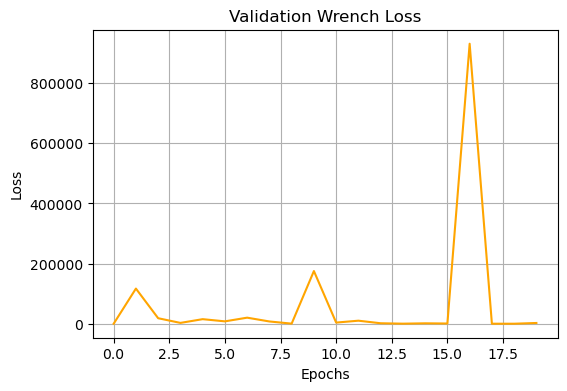

In [46]:
import matplotlib.pyplot as plt

def plot_losses_separately(history):
    # --- Total Loss ---
    plt.figure(figsize=(6,4))
    plt.plot(history.history["loss"], label="Train Total Loss", color="blue")
    plt.xlabel("Epochs"); plt.ylabel("Loss")
    plt.title("Train Total Loss")
    plt.grid(True); plt.show()

    plt.figure(figsize=(6,4))
    plt.plot(history.history["val_loss"], label="Val Total Loss", color="orange")
    plt.xlabel("Epochs"); plt.ylabel("Loss")
    plt.title("Validation Total Loss")
    plt.grid(True); plt.show()

    # --- Currents Loss ---
    if "currents_pred_loss" in history.history:
        plt.figure(figsize=(6,4))
        plt.plot(history.history["currents_pred_loss"], label="Train Currents Loss", color="blue")
        plt.xlabel("Epochs"); plt.ylabel("Loss")
        plt.title("Train Currents Loss")
        plt.grid(True); plt.show()

        plt.figure(figsize=(6,4))
        plt.plot(history.history["val_currents_pred_loss"], label="Val Currents Loss", color="orange")
        plt.xlabel("Epochs"); plt.ylabel("Loss")
        plt.title("Validation Currents Loss")
        plt.grid(True); plt.show()

    # --- Wrench Loss ---
    if "wrench_pred_loss" in history.history:
        plt.figure(figsize=(6,4))
        plt.plot(history.history["wrench_pred_loss"], label="Train Wrench Loss", color="blue")
        plt.xlabel("Epochs"); plt.ylabel("Loss")
        plt.title("Train Wrench Loss")
        plt.grid(True); plt.show()

        plt.figure(figsize=(6,4))
        plt.plot(history.history["val_wrench_pred_loss"], label="Val Wrench Loss", color="orange")
        plt.xlabel("Epochs"); plt.ylabel("Loss")
        plt.title("Validation Wrench Loss")
        plt.grid(True); plt.show()

# Call after training
plot_losses_separately(history)

In [87]:
report = regression_report(model, val_inputs, val_targets,
                          scaler_currents=True,
                          scaler_wrench=scaler_wrench_out)

NameError: name 'regression_report' is not defined

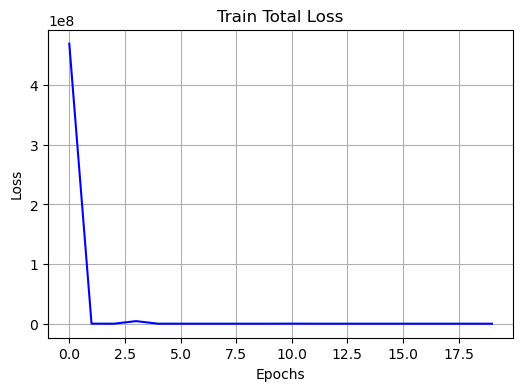

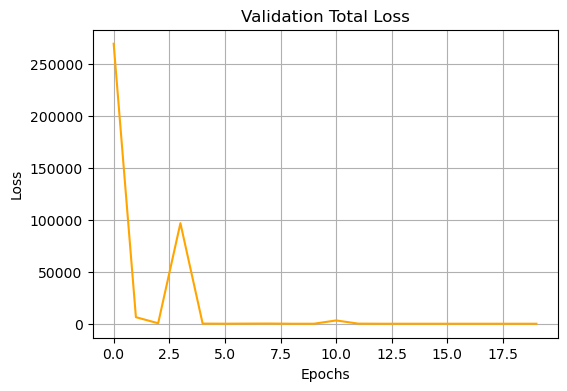

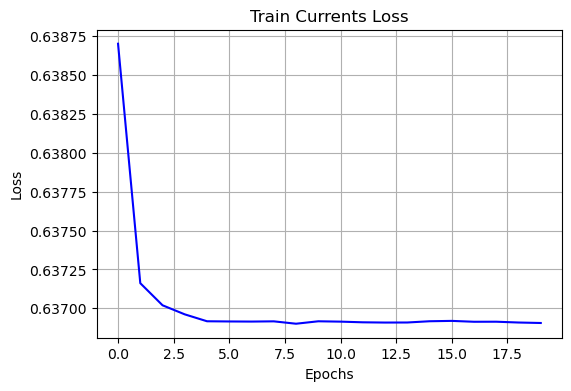

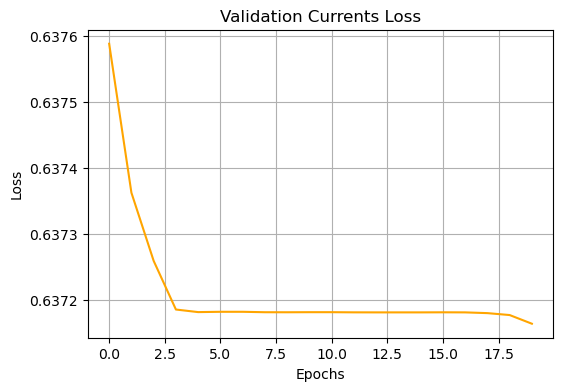

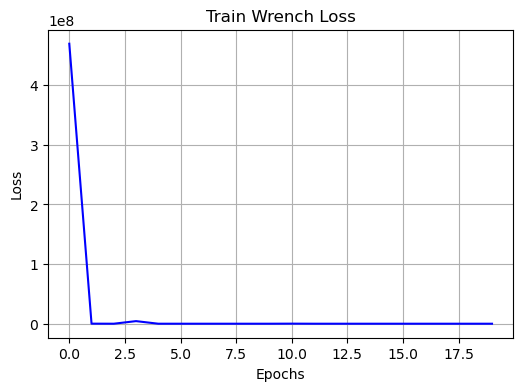

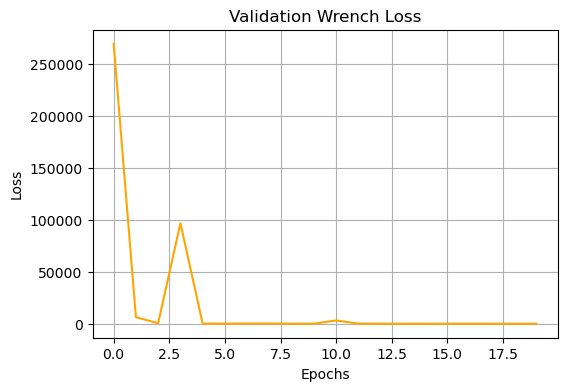

In [88]:
import matplotlib.pyplot as plt

def plot_losses_separately(history):
    # --- Total Loss ---
    plt.figure(figsize=(6,4))
    plt.plot(history.history["loss"], label="Train Total Loss", color="blue")
    plt.xlabel("Epochs"); plt.ylabel("Loss")
    plt.title("Train Total Loss")
    plt.grid(True); plt.show()

    plt.figure(figsize=(6,4))
    plt.plot(history.history["val_loss"], label="Val Total Loss", color="orange")
    plt.xlabel("Epochs"); plt.ylabel("Loss")
    plt.title("Validation Total Loss")
    plt.grid(True); plt.show()

    # --- Currents Loss ---
    if "currents_pred_loss" in history.history:
        plt.figure(figsize=(6,4))
        plt.plot(history.history["currents_pred_loss"], label="Train Currents Loss", color="blue")
        plt.xlabel("Epochs"); plt.ylabel("Loss")
        plt.title("Train Currents Loss")
        plt.grid(True); plt.show()

        plt.figure(figsize=(6,4))
        plt.plot(history.history["val_currents_pred_loss"], label="Val Currents Loss", color="orange")
        plt.xlabel("Epochs"); plt.ylabel("Loss")
        plt.title("Validation Currents Loss")
        plt.grid(True); plt.show()

    # --- Wrench Loss ---
    if "wrench_pred_loss" in history.history:
        plt.figure(figsize=(6,4))
        plt.plot(history.history["wrench_pred_loss"], label="Train Wrench Loss", color="blue")
        plt.xlabel("Epochs"); plt.ylabel("Loss")
        plt.title("Train Wrench Loss")
        plt.grid(True); plt.show()

        plt.figure(figsize=(6,4))
        plt.plot(history.history["val_wrench_pred_loss"], label="Val Wrench Loss", color="orange")
        plt.xlabel("Epochs"); plt.ylabel("Loss")
        plt.title("Validation Wrench Loss")
        plt.grid(True); plt.show()

# Call after training
plot_losses_separately(history)


In [47]:
import numpy as np
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

def regression_report(model, val_inputs, val_targets,
                      scaler_currents=None, scaler_wrench=None):
    """
    Generate regression metrics (MAE, MSE, R²) for currents and wrench.
    Assumes currents were scaled by /10, and wrench normalized with StandardScaler.
    """

    # --- Predictions ---
    preds = model.predict(val_inputs, verbose=0)
    I_pred, W_pred = preds[0], preds[1]

    I_true = val_targets["currents_pred"]
    W_true = val_targets["wrench_pred"]

    # --- Denormalize if scalers provided ---
    if scaler_currents is not None:
        I_pred = I_pred * 10.0
        I_true = I_true * 10.0

    if scaler_wrench is not None:
        W_pred = scaler_wrench.inverse_transform(W_pred)
        W_true = scaler_wrench.inverse_transform(W_true)

    # --- Metrics for currents ---
    I_mae = mean_absolute_error(I_true, I_pred)
    I_mse = mean_squared_error(I_true, I_pred)
    I_r2  = r2_score(I_true, I_pred)

    # --- Metrics for wrench ---
    W_mae = mean_absolute_error(W_true, W_pred)
    W_mse = mean_squared_error(W_true, W_pred)
    W_r2  = r2_score(W_true, W_pred)

    print("===== Regression Report =====")
    print("Currents:")
    print(f"  MAE : {I_mae:.4f}")
    print(f"  MSE : {I_mse:.4f}")
    print(f"  R²  : {I_r2:.4f}")
    print("")
    print("Wrench:")
    print(f"  MAE : {W_mae:.4f}")
    print(f"  MSE : {W_mse:.4f}")
    print(f"  R²  : {W_r2:.4f}")

    return {
        "currents": {"MAE": I_mae, "MSE": I_mse, "R2": I_r2},
        "wrench":   {"MAE": W_mae, "MSE": W_mse, "R2": W_r2}
    }

# Example call:
report = regression_report(model, val_inputs, val_targets,
                          scaler_currents=True,
                          scaler_wrench=scaler_wrench_out)


===== Regression Report =====
Currents:
  MAE : 68.1152
  MSE : 6371.3477
  R²  : 0.0000

Wrench:
  MAE : 11750.3799
  MSE : 855648576.0000
  R²  : -2315995.7500


In [77]:
import numpy as np

def debug_predictions(model, val_inputs, val_targets, batch_size=5):
    """
    Print a small batch of true vs predicted currents & wrenches (normalized space).
    """
    # --- Get a random batch ---
    idx = np.random.choice(len(val_inputs[0]), size=batch_size, replace=False)
    batch_inputs = [val_inputs[0][idx], val_inputs[1][idx]]  # [pose, wrench]
    batch_targets_I = val_targets["currents_pred"][idx]
    batch_targets_W = val_targets["wrench_pred"][idx]

    # --- Model predictions ---
    I_pred, W_pred = model.predict(batch_inputs, verbose=0)

    print("===== Debug Predictions (Normalized Space) =====")
    for i in range(batch_size):
        print(f"\nSample {i+1}")
        print(" True Currents  :", np.round(batch_targets_I[i], 3))
        print(" Pred Currents  :", np.round(I_pred[i], 3))
        print(" True Wrench    :", np.round(batch_targets_W[i], 3))
        print(" Pred Wrench    :", np.round(W_pred[i], 3))

# Example call:
debug_predictions(model, val_inputs, val_targets, batch_size=5)


===== Debug Predictions (Normalized Space) =====

Sample 1
 True Currents  : [-0.858  1.     1.    -0.749 -1.     1.     1.    -1.     1.    -1.
 -1.     1.    -1.     0.061  1.    -1.   ]
 Pred Currents  : [-0.  0.  0.  0.  0.  0.  0.  0. -0.  0. -0.  0. -0. -0. -0.  0.]
 True Wrench    : [ 1.979e+00 -1.076e+00  6.450e-01 -5.380e-01 -8.500e-02  1.000e-03]
 Pred Wrench    : [-0. -0. -0.  0. -0.  0.]

Sample 2
 True Currents  : [ 0.092 -0.163  0.102 -0.005 -0.173  0.382  0.     0.     0.    -0.
 -0.     0.     0.    -0.    -0.     0.   ]
 Pred Currents  : [ 0. -0. -0. -0. -0. -0.  0. -0.  0. -0.  0. -0. -0. -0.  0.  0.]
 True Wrench    : [ 0.224 -0.184 -0.219  0.129 -0.019  0.001]
 Pred Wrench    : [-0.176 -0.195 -0.013 -0.017 -0.012  0.106]

Sample 3
 True Currents  : [ 1.    -1.     1.    -1.    -1.     1.    -1.     1.    -0.089 -0.089
  1.    -1.     1.    -1.     1.    -1.   ]
 Pred Currents  : [-0.  0.  0.  0.  0.  0.  0.  0.  0.  0. -0.  0. -0. -0. -0.  0.]
 True Wrench    : [-9.

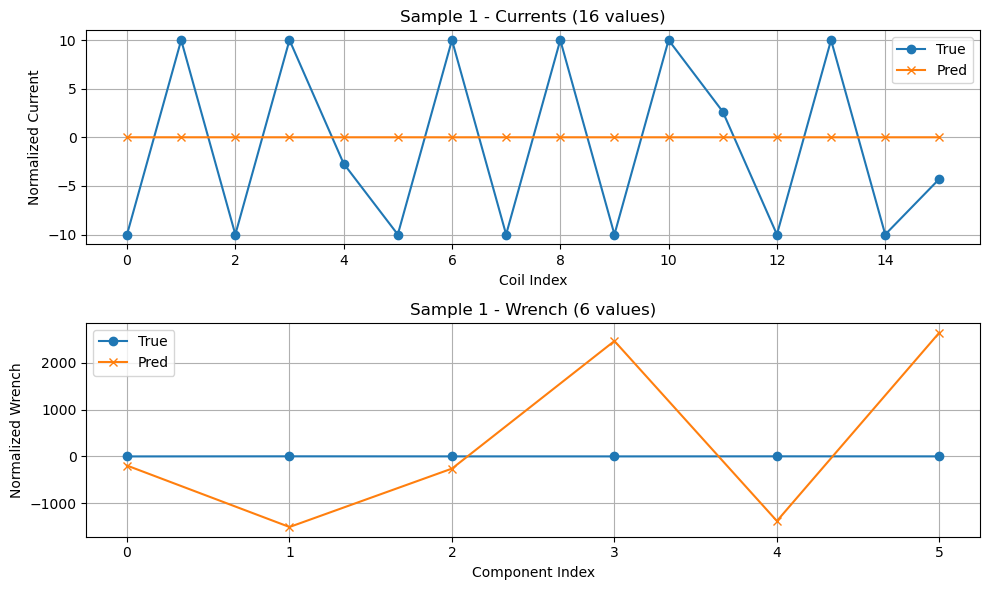

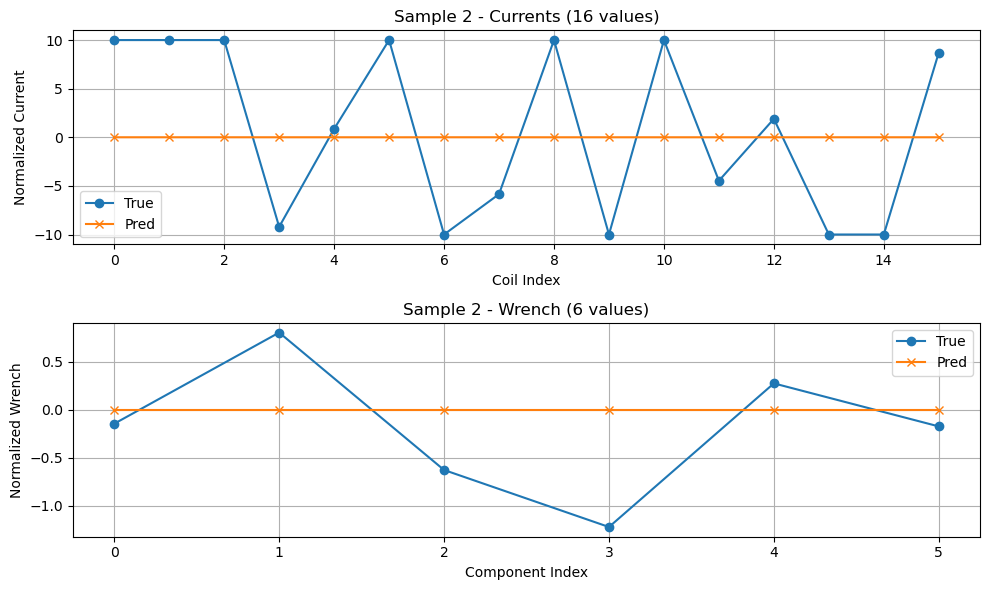

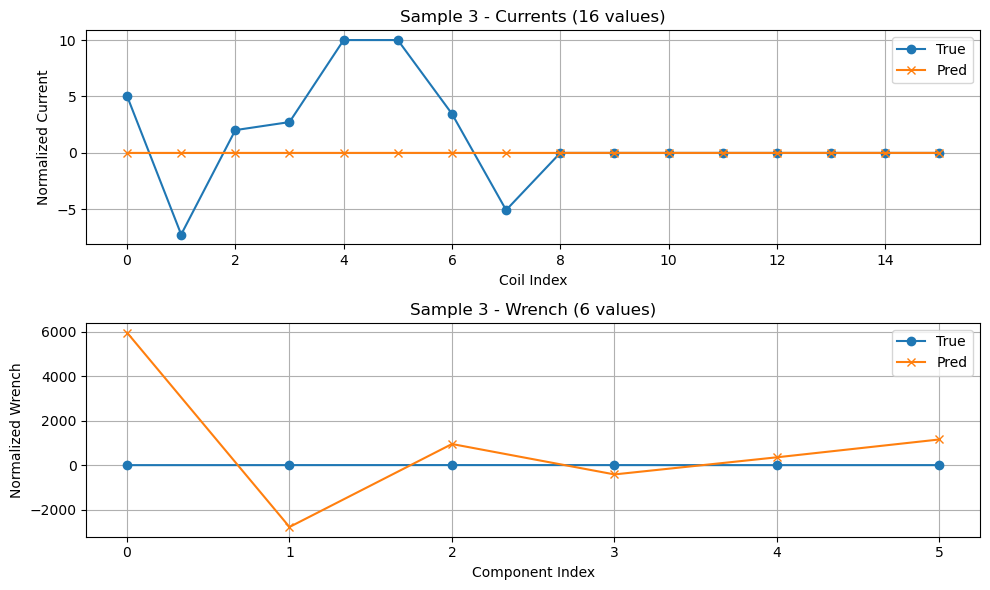

In [48]:
import matplotlib.pyplot as plt
import numpy as np

def plot_debug_predictions(model, val_inputs, val_targets, num_samples=3):
    """
    Plot predicted vs true currents (16) and wrenches (6) for a few validation samples.
    """
    # pick random samples
    idx = np.random.choice(len(val_inputs[0]), size=num_samples, replace=False)
    batch_inputs = [val_inputs[0][idx], val_inputs[1][idx]]
    I_true = val_targets["currents_pred"][idx]
    W_true = val_targets["wrench_pred"][idx]

    I_pred, W_pred = model.predict(batch_inputs, verbose=0)

    for i in range(num_samples):
        fig, axs = plt.subplots(2, 1, figsize=(10,6))

        # --- Currents (16) ---
        axs[0].plot(I_true[i], label="True", marker="o")
        axs[0].plot(I_pred[i], label="Pred", marker="x")
        axs[0].set_title(f"Sample {i+1} - Currents (16 values)")
        axs[0].set_xlabel("Coil Index")
        axs[0].set_ylabel("Normalized Current")
        axs[0].grid(True); axs[0].legend()

        # --- Wrench (6) ---
        axs[1].plot(W_true[i], label="True", marker="o")
        axs[1].plot(W_pred[i], label="Pred", marker="x")
        axs[1].set_title(f"Sample {i+1} - Wrench (6 values)")
        axs[1].set_xlabel("Component Index")
        axs[1].set_ylabel("Normalized Wrench")
        axs[1].grid(True); axs[1].legend()

        plt.tight_layout()
        plt.show()

# Example call:
plot_debug_predictions(model, val_inputs, val_targets, num_samples=3)


# PCA on currents

In [36]:
I.head()

,current_1_cls,current_2_cls,current_3_cls,current_4_cls,current_5_cls,current_6_cls,current_7_cls,current_8_cls,current_9_cls,current_10_cls,current_11_cls,current_12_cls,current_13_cls,current_14_cls,current_15_cls,current_16_cls
0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1,2,2,1,2,2,1,0,1,1,1,1,1,1,1,1,1
2,1,1,0,2,1,0,2,1,1,1,1,1,1,1,1,1
3,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1
4,0,0,0,2,2,2,0,2,1,1,1,2,0,2,1,1


In [41]:
I.columns

Index(['current_1_cls', 'current_2_cls', 'current_3_cls', 'current_4_cls',
       'current_5_cls', 'current_6_cls', 'current_7_cls', 'current_8_cls',
       'current_9_cls', 'current_10_cls', 'current_11_cls', 'current_12_cls',
       'current_13_cls', 'current_14_cls', 'current_15_cls', 'current_16_cls'],
      dtype='object')

In [36]:
import numpy as np
from sklearn.preprocessing import OneHotEncoder
from scipy import sparse

# one-hot encode the dataframe
enc = OneHotEncoder(sparse_output=True, dtype=np.float32)  # sparse to save RAM
X_encoded = enc.fit_transform(I)

print(f"Encoded shape: {X_encoded.shape}, sparse={sparse.issparse(X_encoded)}")


Encoded shape: (1287658, 48), sparse=True


In [37]:
from sklearn.decomposition import TruncatedSVD

# compress to ~40 components (safe since you only had 48 one-hot cols)
svd = TruncatedSVD(n_components=40, random_state=42)
X_svd = svd.fit_transform(X_encoded).astype(np.float32)

print("SVD reduced shape:", X_svd.shape)


SVD reduced shape: (1287658, 40)


In [38]:
import umap.umap_ as umap

# Subsample before SVD/UMAP
frac = 0.5
n_sub = int(frac * X_encoded.shape[0])
idx = np.random.choice(X_encoded.shape[0], size=n_sub, replace=False)

X_sub = X_encoded[idx]
X_svd = svd.fit_transform(X_sub).astype(np.float32)

um_hi = umap.UMAP(n_components=10, n_neighbors=30, min_dist=0.05, random_state=42)
X_umap10 = um_hi.fit_transform(X_svd)


/home/alireza-linux/.local/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/alireza-linux/.local/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


In [45]:
Xc = X_umap10  # use the 10D UMAP embedding as clustering input


In [47]:
# FAST GMM: BIC on a small sample + diag cov, then final full fit

from sklearn.mixture import GaussianMixture
from sklearn.cluster import MiniBatchKMeans
import numpy as np

# ---- 1) small sample for BIC sweep ----
m = min(20000, len(Xc))
idx_bic = np.random.choice(len(Xc), size=m, replace=False)
Xc_bic = Xc[idx_bic].astype(np.float32)
Xc_bic = Xc_bic.astype(np.float64)


k_list = [8, 12, 16, 20]  # tighten sweep first; refine around the winner later
bic_log, models = [], {}

for k in k_list:
    km = MiniBatchKMeans(n_clusters=k, random_state=42, batch_size=4096, n_init=5)
    km.fit(Xc_bic)
    gmm_diag = GaussianMixture(
    n_components=k, covariance_type="diag",
    reg_covar=1e-4, max_iter=200, n_init=1, tol=1e-3,
    means_init=km.cluster_centers_, random_state=42
    ).fit(Xc_bic)
    bic = gmm_diag.bic(Xc_bic)
    bic_log.append((k, bic))
    models[k] = gmm_diag
    print(f"k={k}, BIC={bic:.2f}")

best_k, best_bic = min(bic_log, key=lambda t: t[1])
print(f"\nSelected k (sampled BIC) = {best_k}")

# ---- 2) final fit on ALL Xc (option A: diag, fast) ----
gmm = GaussianMixture(
    n_components=best_k, covariance_type="diag",
    reg_covar=1e-6, max_iter=300, n_init=2, tol=1e-3,
    means_init=models[best_k].means_, random_state=42, verbose=1
).fit(Xc.astype(np.float32))

# (option B: if you really want full cov, switch covariance_type="full" here;
# keep means_init from diag model to speed convergence.)

labels = gmm.predict(Xc)
proba  = gmm.predict_proba(Xc)
print(f"Done. k={best_k}, proba shape={proba.shape}")



k=8, BIC=595118.59
k=12, BIC=594255.31
k=16, BIC=565986.22
k=20, BIC=495822.52

Selected k (sampled BIC) = 20
Initialization 0
  Iteration 10
  Iteration 20
  Iteration 30
Initialization converged.
Initialization 1
  Iteration 10
Initialization converged.
Done. k=20, proba shape=(643829, 20)


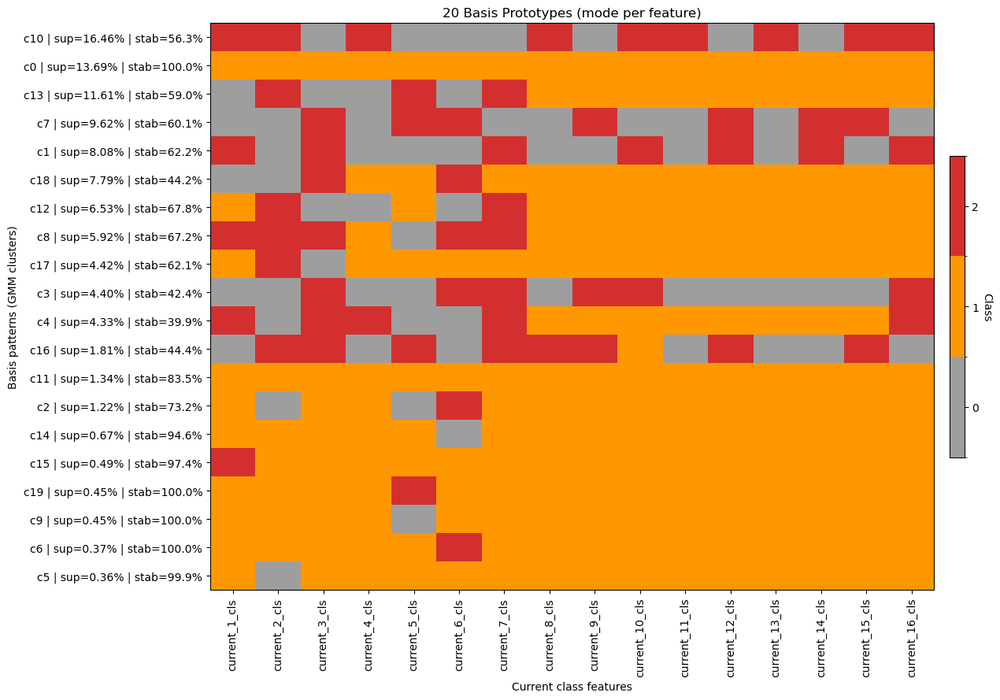

In [48]:
# === Build 20 basis patterns from GMM on your 0.5% subset ===
# Requires: I (original df), idx (indices of the 0.5% subset),
#           labels (shape [len(idx)]), proba (shape [len(idx), 20])

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm

# 1) attach cluster labels to the subsample
I_sub = I.iloc[idx].copy()
I_sub["cluster"] = labels

# 2) prototype (mode) + stability (% of rows matching the mode) + support (%)
rows = []
for c in np.unique(labels):
    sub = I_sub[I_sub["cluster"] == c]
    sup = 100 * len(sub) / len(I_sub)
    for col in I.columns:
        mv = sub[col].mode()[0]
        stab = sub[col].value_counts(normalize=True).get(mv, 0.0) * 100
        rows.append({"cluster": int(c), "feature": col,
                     "proto_val": int(mv), "stability_%": round(stab, 1),
                     "support_%": round(sup, 2)})

catalog = pd.DataFrame(rows)

# 3) summary per cluster
summary = (catalog.groupby("cluster")["stability_%"].mean()
           .rename("avg_stability_%").to_frame()
           .join(catalog.groupby("cluster")["support_%"].first()))

# 4) pivot to matrix [clusters x features], sort clusters by support desc
feat_order = sorted(I.columns, key=lambda c: int(c.split("_")[1]))
order = summary.sort_values(["support_%","avg_stability_%"], ascending=[False, False]).index.tolist()

proto_mat = (catalog.pivot_table(index="cluster", columns="feature",
                                 values="proto_val", aggfunc="first")
             .reindex(index=order, columns=feat_order))

# 5) optional: export the basis as a compact dict
basis = {int(cid): proto_mat.loc[cid].astype(int).tolist() for cid in proto_mat.index}

# 6) heatmap (rows=basis patterns, cols=currents, color=class 0/1/2)
cmap = ListedColormap(["#9e9e9e", "#ff9800", "#d32f2f"])  # 0,1,2
norm = BoundaryNorm([-0.5, 0.5, 1.5, 2.5], cmap.N)

row_labels = [f"c{int(cid)} | sup={summary.loc[cid,'support_%']:.2f}% | stab={summary.loc[cid,'avg_stability_%']:.1f}%"
              for cid in proto_mat.index]

fig, ax = plt.subplots(figsize=(0.55*proto_mat.shape[1] + 4, 0.35*proto_mat.shape[0] + 2))
im = ax.imshow(proto_mat.values, aspect="auto", cmap=cmap, norm=norm, interpolation="nearest")
ax.set_xticks(np.arange(len(feat_order))); ax.set_xticklabels(feat_order, rotation=90)
ax.set_yticks(np.arange(len(row_labels))); ax.set_yticklabels(row_labels)

cbar = fig.colorbar(im, ax=ax, ticks=[0,1,2], fraction=0.02, pad=0.02)
cbar.set_label("Class", rotation=270, labelpad=12)

ax.set_xlabel("Current class features")
ax.set_ylabel("Basis patterns (GMM clusters)")
ax.set_title("20 Basis Prototypes (mode per feature)")

plt.tight_layout()
plt.show()

# 7) save the basis + summaries (so you can reuse without recomputing)
catalog.to_pickle("basis_catalog_gmm20.pkl")
summary.to_pickle("basis_summary_gmm20.pkl")
pd.DataFrame.from_dict(basis, orient="index").to_pickle("basis_vectors_gmm20.pkl")


In [49]:
# 1) Reload your saved GMM + UMAP if needed
# (assuming you still have `gmm` from before and `um_hi` the 10D UMAP)

from scipy import sparse
import pandas as pd

# --- Encode the whole dataframe I ---
enc = OneHotEncoder(sparse_output=True, dtype=np.float32)
X_encoded_full = enc.fit_transform(I)

# --- Reduce with the same SVD ---
svd_full = TruncatedSVD(n_components=40, random_state=42)
X_svd_full = svd_full.fit_transform(X_encoded_full).astype(np.float32)

# --- Transform with the UMAP fitted on subsample ---
X_umap10_full = um_hi.transform(X_svd_full)

# --- Predict with the GMM fitted on subsample ---
labels_full = gmm.predict(X_umap10_full)
proba_full  = gmm.predict_proba(X_umap10_full)

print("Full dataset assigned:", labels_full.shape, proba_full.shape)


/usr/lib/python3/dist-packages/scipy/sparse/_index.py:143: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Full dataset assigned: (1287658,) (1287658, 20)


In [50]:
# Add hard cluster and soft weights
proba_cols = [f"pat_{i}" for i in range(proba_full.shape[1])]
I_with_patterns = pd.concat([
    I.reset_index(drop=True),
    pd.DataFrame(labels_full, columns=["cluster"]),
    pd.DataFrame(proba_full, columns=proba_cols)
], axis=1)

print(I_with_patterns.head())


   current_1_cls  current_2_cls  current_3_cls  current_4_cls  current_5_cls  \
0              1              1              1              1              1   
1              2              2              1              2              2   
2              1              1              0              2              1   
3              1              1              1              0              1   
4              0              0              0              2              2   

   current_6_cls  current_7_cls  current_8_cls  current_9_cls  current_10_cls  \
0              1              1              1              1               1   
1              1              0              1              1               1   
2              0              2              1              1               1   
3              1              1              1              1               1   
4              2              0              2              1               1   

   ...         pat_10         pa

In [52]:
I_with_patterns['cluster'].head()

0     0
1     8
2    12
3    11
4    13
Name: cluster, dtype: int64

In [54]:
I_with_patterns.to_pickle("I_with_patterns.pkl")


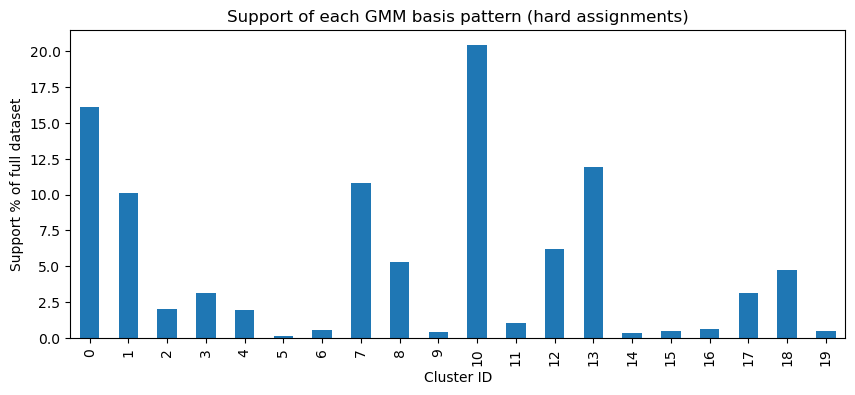

In [55]:
import matplotlib.pyplot as plt

cluster_counts = I_with_patterns["cluster"].value_counts(normalize=True).sort_index() * 100

plt.figure(figsize=(10,4))
cluster_counts.plot(kind="bar")
plt.ylabel("Support % of full dataset")
plt.xlabel("Cluster ID")
plt.title("Support of each GMM basis pattern (hard assignments)")
plt.show()


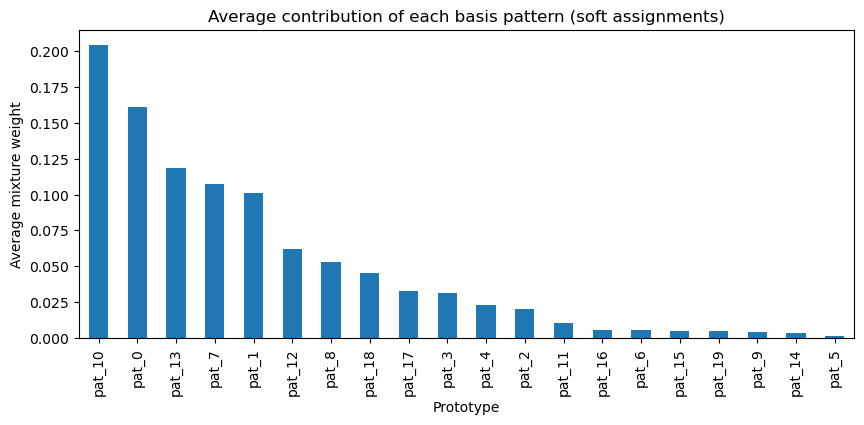

In [56]:
proba_cols = [c for c in I_with_patterns.columns if c.startswith("pat_")]

mean_weights = I_with_patterns[proba_cols].mean().sort_values(ascending=False)

plt.figure(figsize=(10,4))
mean_weights.plot(kind="bar")
plt.ylabel("Average mixture weight")
plt.xlabel("Prototype")
plt.title("Average contribution of each basis pattern (soft assignments)")
plt.show()


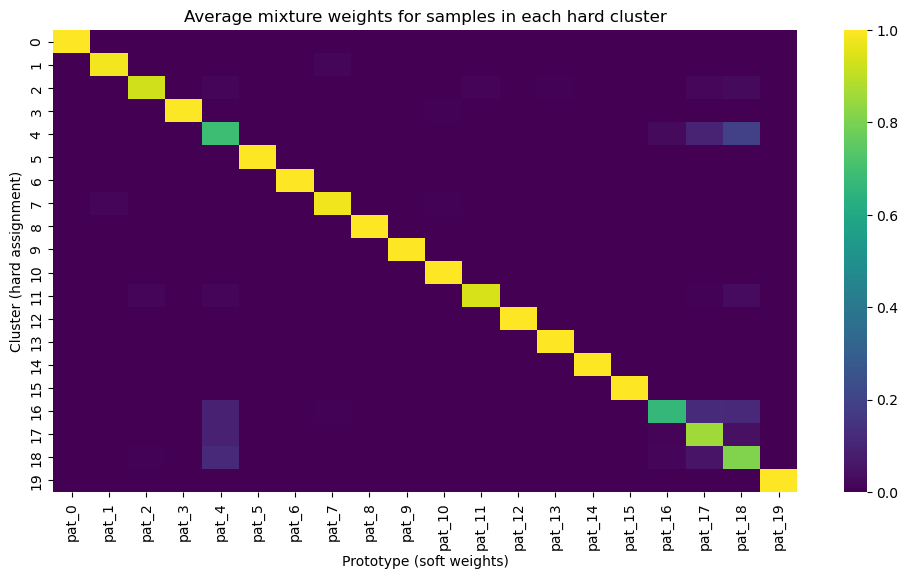

In [57]:
import seaborn as sns

avg_proba_per_cluster = I_with_patterns.groupby("cluster")[proba_cols].mean()

plt.figure(figsize=(12,6))
sns.heatmap(avg_proba_per_cluster, cmap="viridis", annot=False)
plt.title("Average mixture weights for samples in each hard cluster")
plt.xlabel("Prototype (soft weights)")
plt.ylabel("Cluster (hard assignment)")
plt.show()


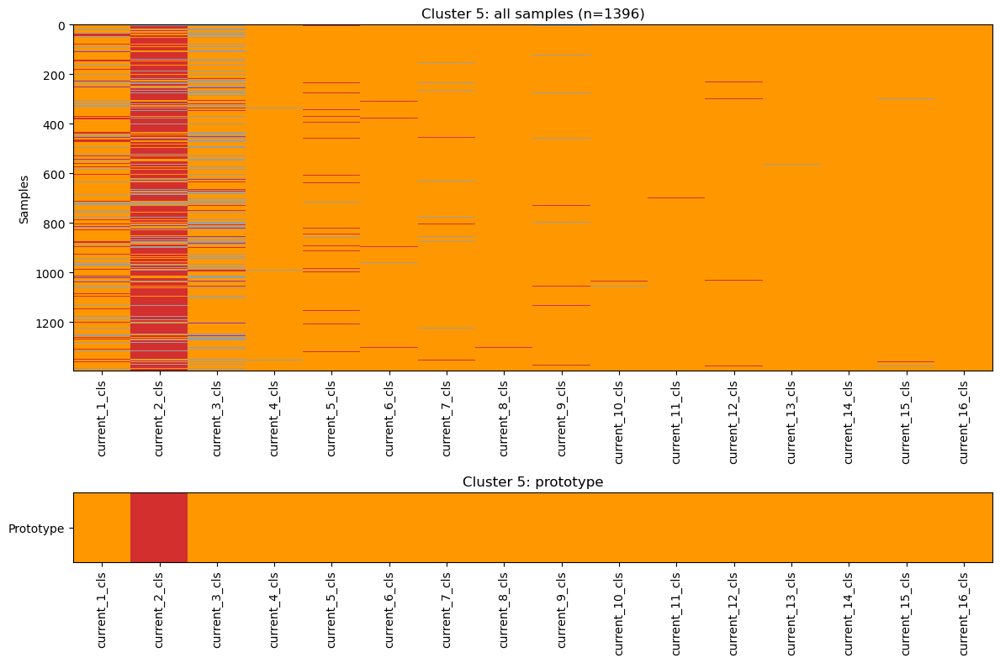

In [65]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm

cluster_id = 5   # pick the cluster you want
feat_order = sorted([c for c in I_with_patterns.columns if c.startswith("current_")],
                    key=lambda c: int(c.split("_")[1]))

# subset rows belonging to that cluster
sub = I_with_patterns[I_with_patterns["cluster"] == cluster_id][feat_order].astype(int)

# prototype row
proto = sub.mode(dropna=False).iloc[0].values.reshape(1, -1)

# --- Plot ---
cmap = ListedColormap(["#9e9e9e", "#ff9800", "#d32f2f"])  # 0=gray, 1=orange, 2=red
norm = BoundaryNorm([-0.5, 0.5, 1.5, 2.5], cmap.N)

fig, axes = plt.subplots(2, 1, figsize=(12, 8), gridspec_kw={"height_ratios":[5,1]})

# (A) all samples in cluster
axes[0].imshow(sub.values, aspect="auto", cmap=cmap, norm=norm, interpolation="nearest")
axes[0].set_title(f"Cluster {cluster_id}: all samples (n={len(sub)})")
axes[0].set_xticks(range(len(feat_order)))
axes[0].set_xticklabels(feat_order, rotation=90)
axes[0].set_ylabel("Samples")

# (B) prototype (mode)
axes[1].imshow(proto, aspect="auto", cmap=cmap, norm=norm, interpolation="nearest")
axes[1].set_xticks(range(len(feat_order)))
axes[1].set_xticklabels(feat_order, rotation=90)
axes[1].set_yticks([0]); axes[1].set_yticklabels(["Prototype"])
axes[1].set_title(f"Cluster {cluster_id}: prototype")

plt.tight_layout()
plt.show()


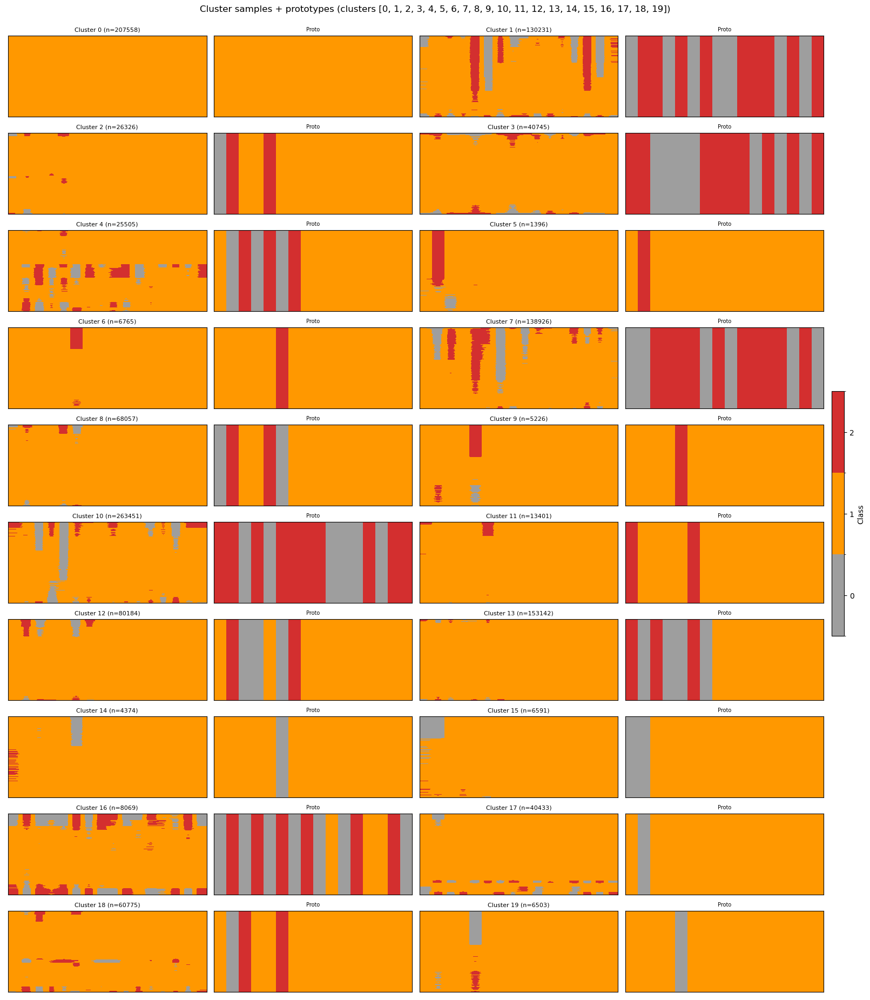

In [73]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm

# config
MAX_ROWS_PER_CLUSTER = 1000000  # cap rows per cluster for readability
GRID_ROWS, GRID_COLS = 5, 4  # 4x4 grid per page
SORT_BY_SIMILARITY = True

feat_order = sorted([c for c in I_with_patterns.columns if c.startswith("current_")],
                    key=lambda c: int(c.split("_")[1]))
clusters = sorted(I_with_patterns["cluster"].unique())

cmap = ListedColormap(["#9e9e9e", "#ff9800", "#d32f2f"])
norm = BoundaryNorm([-0.5, 0.5, 1.5, 2.5], cmap.N)

def hamming(a, b):
    return (a != b).sum(axis=1)

# paginate over clusters
per_page = GRID_ROWS * GRID_COLS
for page_start in range(0, len(clusters), per_page):
    page_clusters = clusters[page_start:page_start+per_page]

    fig, axes = plt.subplots(GRID_ROWS*2, GRID_COLS, figsize=(4*GRID_COLS, 1.8*GRID_ROWS*2),
                             constrained_layout=True)
    axes = axes.ravel()

    last_im = None
    for j, cid in enumerate(page_clusters):
        sub = I_with_patterns[I_with_patterns["cluster"] == cid][feat_order].astype(int)
        proto = sub.mode(dropna=False).iloc[0].values.reshape(1, -1)

        # sort by similarity if desired
        if SORT_BY_SIMILARITY:
            d = hamming(sub.values, proto)
            order = np.argsort(d)
            sub = sub.iloc[order]

        # cap rows
        if len(sub) > MAX_ROWS_PER_CLUSTER:
            idx = np.random.choice(len(sub), size=MAX_ROWS_PER_CLUSTER, replace=False)
            sub = sub.iloc[idx]

        # pick positions: row=2*gridrow, row+1=prototype
        grid_pos = j*2
        ax_samples = axes[grid_pos]
        last_im = ax_samples.imshow(sub.values, aspect="auto", cmap=cmap, norm=norm)
        ax_samples.set_title(f"Cluster {cid} (n={len(sub)})", fontsize=8)
        ax_samples.set_xticks([]); ax_samples.set_yticks([])

        ax_proto = axes[grid_pos+1]
        ax_proto.imshow(proto, aspect="auto", cmap=cmap, norm=norm)
        ax_proto.set_xticks([]); ax_proto.set_yticks([])
        ax_proto.set_title("Proto", fontsize=7)

    # hide unused axes
    for ax in axes[len(page_clusters)*2:]:
        ax.axis("off")

    fig.colorbar(last_im, ax=axes, ticks=[0,1,2], fraction=0.015, pad=0.01, label="Class")
    fig.suptitle(f"Cluster samples + prototypes (clusters {page_clusters})", y=1.02)
    plt.show()


In [30]:
Y_soft.head()

,pat_0,pat_1,pat_2,pat_3,pat_4,pat_5,pat_6,pat_7,pat_8,pat_9,pat_10,pat_11,pat_12,pat_13,pat_14,pat_15,pat_16,pat_17,pat_18,pat_19
0,1.0,0.0,1.274793e-17,0.0,5.544864e-28,0.0,0.0,0.0,0.000000e+00,0.0,0.0,6.612444e-24,0.000000e+00,0.0,0.0,0.0,1.252761e-41,2.440567e-18,2.448054e-19,0.0
1,0.0,0.0,5.019338e-09,0.0,5.620128e-15,0.0,0.0,0.0,1.000000e+00,0.0,0.0,7.641373e-26,9.809089e-45,0.0,0.0,0.0,5.953941e-25,5.169662e-12,7.317964e-13,0.0
2,0.0,0.0,2.906027e-06,0.0,1.994967e-11,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.000000e+00,9.999971e-01,0.0,0.0,0.0,1.219233e-19,4.513328e-10,4.724652e-10,0.0
3,0.0,0.0,4.298860e-27,0.0,2.484897e-06,0.0,0.0,0.0,0.000000e+00,0.0,0.0,9.840893e-01,0.000000e+00,0.0,0.0,0.0,2.264839e-11,9.101342e-03,6.806883e-03,0.0
4,0.0,0.0,1.973551e-08,0.0,4.287194e-15,0.0,0.0,0.0,2.649660e-12,0.0,0.0,0.000000e+00,4.256599e-32,1.0,0.0,0.0,2.512135e-25,9.867977e-13,4.400651e-13,0.0


In [76]:
# pick 5 random rows
check_idx = np.random.choice(len(I), size=5, replace=False)

for idx in check_idx:
    print(f"\nRow {idx}")
    print("Original currents:", I.iloc[idx].to_numpy())
    print("Assigned cluster:", I_with_patterns.iloc[idx]["cluster"])
    print("Top-3 mixture weights:", 
          I_with_patterns.iloc[idx][[f"pat_{i}" for i in np.argsort(-I_with_patterns.iloc[idx][proba_cols].values)[:3]]])



Row 198527
Original currents: [0 2 0 2 2 0 0 2 2 0 2 0 0 1 2 0]
Assigned cluster: 1.0
Top-3 mixture weights: pat_1     9.999915e-01
pat_7     8.272699e-06
pat_18    1.012107e-07
Name: 198527, dtype: float64

Row 305627
Original currents: [1 2 0 2 0 2 0 2 1 2 1 1 2 1 1 1]
Assigned cluster: 13.0
Top-3 mixture weights: pat_13    9.998802e-01
pat_2     1.198364e-04
pat_17    6.855623e-09
Name: 305627, dtype: float64

Row 941836
Original currents: [2 2 0 2 0 2 2 0 0 0 2 0 2 1 0 2]
Assigned cluster: 10.0
Top-3 mixture weights: pat_10    9.999991e-01
pat_18    5.515275e-07
pat_4     2.854527e-07
Name: 941836, dtype: float64

Row 1187823
Original currents: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
Assigned cluster: 0.0
Top-3 mixture weights: pat_0     1.000000e+00
pat_2     2.608512e-18
pat_17    4.880699e-19
Name: 1187823, dtype: float64

Row 684324
Original currents: [2 0 2 2 0 0 2 2 0 2 1 0 1 1 1 1]
Assigned cluster: 13.0
Top-3 mixture weights: pat_13    1.000000e+00
pat_2     1.845464e-09
pat_17 

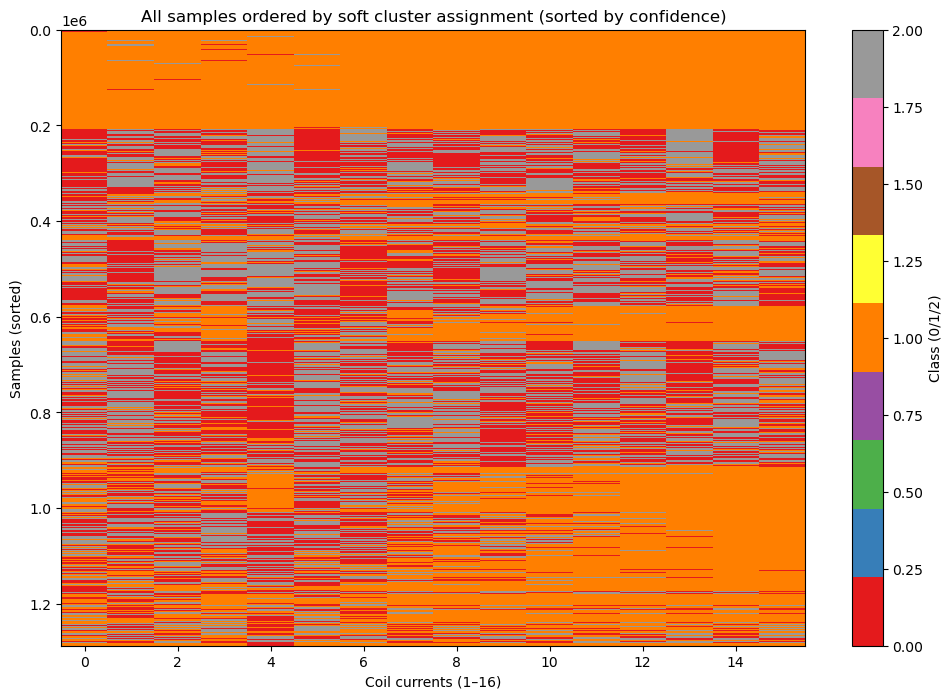

In [75]:
import numpy as np
import matplotlib.pyplot as plt

proba_cols = [c for c in I_with_patterns.columns if c.startswith("pat_")]
feat_cols  = sorted([c for c in I_with_patterns.columns if c.startswith("current_")],
                    key=lambda x: int(x.split("_")[1]))
W = I_with_patterns[proba_cols].to_numpy()    # [N, K]
Y = I_with_patterns[feat_cols].to_numpy()     # [N, 16]

# pick top cluster + confidence
top = W.argmax(axis=1)
conf = W.max(axis=1)

# sort samples: first by cluster, then by confidence (so "weak" assignments go to bottom)
order = np.lexsort((1-conf, top))  
Y_sorted = Y[order]
top_sorted = top[order]

# plot big heatmap
plt.figure(figsize=(12,8))
plt.imshow(Y_sorted, aspect="auto", cmap="Set1", interpolation="nearest")
plt.colorbar(label="Class (0/1/2)")
plt.title("All samples ordered by soft cluster assignment (sorted by confidence)")
plt.xlabel("Coil currents (1–16)")
plt.ylabel("Samples (sorted)")
plt.show()


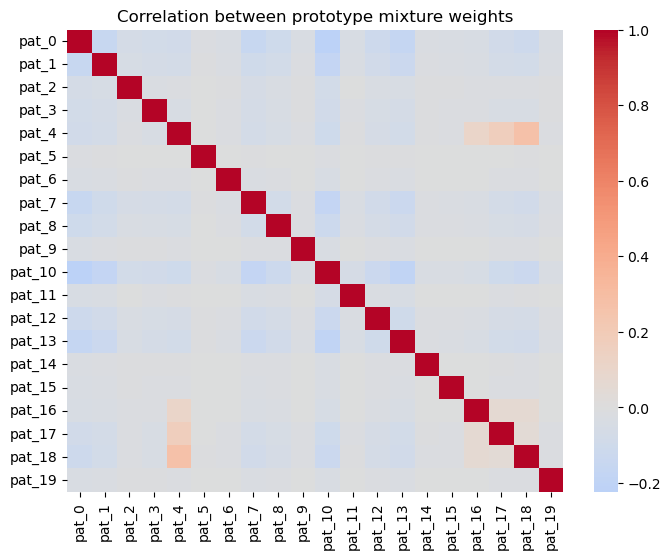

In [58]:
corr = I_with_patterns[proba_cols].corr()

plt.figure(figsize=(8,6))
sns.heatmap(corr, cmap="coolwarm", center=0)
plt.title("Correlation between prototype mixture weights")
plt.show()


In [42]:
import pandas as pd

# wrap the numpy array into a DataFrame with nice col names
X_umap10_df = pd.DataFrame(X_umap10, columns=[f"umap{i+1}" for i in range(X_umap10.shape[1])])

# save to disk (choose your path)
X_umap10_df.to_parquet("X_umap10.parquet", index=False)   # efficient binary format
# or
X_umap10_df.to_csv("X_umap10.csv", index=False)           # plain text, bigger

print("Saved:", X_umap10_df.shape)


ArrowKeyError: A type extension with name pandas.period already defined

In [82]:
import numpy as np

# your coil current columns
feat_cols = [c for c in I_with_patterns.columns if c.startswith("current_")]

# cluster labels
labels = I_with_patterns["cluster"].to_numpy()

# initialize prototype tensor: (clusters × coils × 3 classes)
D = np.zeros((gmm.n_components, len(feat_cols), 3))

for k in range(gmm.n_components):
    rows = I_with_patterns.loc[labels == k, feat_cols]
    if len(rows) == 0:
        continue
    for j, col in enumerate(feat_cols):
        vals = rows[col].values
        for c in [0, 1, 2]:
            D[k, j, c] = np.mean(vals == c)

print("D shape:", D.shape)  # should be (20, 16, 3)


D shape: (20, 16, 3)


In [83]:
import joblib, json, numpy as np, os

save_dir = "/media/alireza-linux/MagLev Simulator and Beyond/ML saved files"
os.makedirs(save_dir, exist_ok=True)

joblib.dump(svd,  os.path.join(save_dir, "svd_model.pkl"))
joblib.dump(um_hi, os.path.join(save_dir, "umap_model.pkl"))
joblib.dump(gmm,  os.path.join(save_dir, "gmm_model.pkl"))

np.save(os.path.join(save_dir, "soft_prototypes.npy"), D)

meta = {"features": feat_cols, "K": D.shape[0], "classes": [0,1,2]}
with open(os.path.join(save_dir, "training_meta.json"), "w") as f:
    json.dump(meta, f)

proba_cols = [c for c in I_with_patterns.columns if c.startswith("pat_")]
np.savez_compressed(
    os.path.join(save_dir, "assignments_full.npz"),
    labels=I_with_patterns["cluster"].to_numpy(),
    proba=I_with_patterns[proba_cols].to_numpy(dtype=np.float32),
)
